## Bidirectional LSTM model na predikciu hodnot DST o 2 hodiny dopredu na zaklade 6-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+2_6H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 23:46:12.390737: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 2
y_col = f"DST+{shift}"

n_input = 6
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  6


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 6, 1)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 6, 256)              │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 6, 128)              │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 6, 1)                │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,376 (1.26 MB)

 Trainable params: 330,376 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31:59 6s/step - loss: 0.5291 - mae: 0.6505

  2/896 ━━━━━━━━━━━━━━━━━━━━ 52s 58ms/step - loss: 0.7698 - mae: 0.6817  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step - loss: 0.7900 - mae: 0.6729

  5/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step - loss: 0.7351 - mae: 0.6392

  7/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - loss: 0.6702 - mae: 0.5994

  9/896 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.6154 - mae: 0.5648

 11/896 ━━━━━━━━━━━━━━━━━━━━ 40s 45ms/step - loss: 0.5759 - mae: 0.5403

 13/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - loss: 0.5445 - mae: 0.5217

 15/896 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step - loss: 0.5176 - mae: 0.5054

 17/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.4940 - mae: 0.4910

 19/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - loss: 0.4758 - mae: 0.4793

 21/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.4602 - mae: 0.4689

 23/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.4459 - mae: 0.4593

 25/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.4334 - mae: 0.4510

 27/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.4243 - mae: 0.4444

 29/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.4159 - mae: 0.4384

 31/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - loss: 0.4081 - mae: 0.4330

 33/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - loss: 0.4010 - mae: 0.4281

 35/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.3942 - mae: 0.4236

 37/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.3880 - mae: 0.4194

 39/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.3821 - mae: 0.4154

 41/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.3767 - mae: 0.4118

 43/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.3719 - mae: 0.4085

 45/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3672 - mae: 0.4055

 47/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3631 - mae: 0.4027

 49/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3595 - mae: 0.4002

 51/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3565 - mae: 0.3980

 53/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3536 - mae: 0.3959

 55/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3508 - mae: 0.3939

 57/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3480 - mae: 0.3920

 59/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3454 - mae: 0.3902

 61/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3427 - mae: 0.3884

 63/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.3402 - mae: 0.3867

 65/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3379 - mae: 0.3851

 67/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3358 - mae: 0.3836

 69/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3336 - mae: 0.3821

 71/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3317 - mae: 0.3807

 73/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3297 - mae: 0.3793

 75/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3279 - mae: 0.3780

 77/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3261 - mae: 0.3768

 79/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3243 - mae: 0.3756

 81/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3226 - mae: 0.3744

 83/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.3209 - mae: 0.3732

 85/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.3193 - mae: 0.3721

 87/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.3177 - mae: 0.3710

 89/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.3161 - mae: 0.3700

 91/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.3146 - mae: 0.3690

 93/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.3132 - mae: 0.3680

 95/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.3120 - mae: 0.3671

 97/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.3107 - mae: 0.3663

 99/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.3095 - mae: 0.3654

101/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.3084 - mae: 0.3646

103/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.3073 - mae: 0.3638

105/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.3063 - mae: 0.3631

107/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.3052 - mae: 0.3623

109/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.3042 - mae: 0.3616

111/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.3033 - mae: 0.3610

113/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.3023 - mae: 0.3603

115/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.3014 - mae: 0.3597

117/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.3005 - mae: 0.3591

119/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.2996 - mae: 0.3585

121/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.2987 - mae: 0.3579

123/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.2978 - mae: 0.3573

125/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.2969 - mae: 0.3568

127/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.2960 - mae: 0.3562

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2953 - mae: 0.3557

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2947 - mae: 0.3553

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2941 - mae: 0.3548

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2935 - mae: 0.3544

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2931 - mae: 0.3541

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2926 - mae: 0.3537

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2922 - mae: 0.3534

143/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2920 - mae: 0.3531

145/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2919 - mae: 0.3529

147/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.2918 - mae: 0.3527

149/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2917 - mae: 0.3525

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2916 - mae: 0.3523

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2915 - mae: 0.3521

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2914 - mae: 0.3519

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2912 - mae: 0.3517

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2911 - mae: 0.3515

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2909 - mae: 0.3513

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2907 - mae: 0.3511

165/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2905 - mae: 0.3509

167/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2904 - mae: 0.3507

169/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.2902 - mae: 0.3505

171/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2899 - mae: 0.3503

173/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2897 - mae: 0.3500

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2895 - mae: 0.3499

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2894 - mae: 0.3497

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2892 - mae: 0.3495

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2890 - mae: 0.3493

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2888 - mae: 0.3491

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2886 - mae: 0.3489

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2883 - mae: 0.3487

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2881 - mae: 0.3485

191/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2880 - mae: 0.3484

193/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2878 - mae: 0.3482

195/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.2876 - mae: 0.3480

197/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2874 - mae: 0.3478

199/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2872 - mae: 0.3476

201/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2870 - mae: 0.3475

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2868 - mae: 0.3473

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2866 - mae: 0.3471

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2864 - mae: 0.3469

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2861 - mae: 0.3467

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2859 - mae: 0.3465

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2857 - mae: 0.3464

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2855 - mae: 0.3462

217/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2852 - mae: 0.3460

219/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2850 - mae: 0.3458

221/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.2847 - mae: 0.3456

223/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2845 - mae: 0.3454

225/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2843 - mae: 0.3453

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2840 - mae: 0.3451

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2838 - mae: 0.3449

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2835 - mae: 0.3447

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2832 - mae: 0.3445

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2829 - mae: 0.3443

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2827 - mae: 0.3441

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2824 - mae: 0.3439

241/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2821 - mae: 0.3437

243/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2818 - mae: 0.3435

245/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.2815 - mae: 0.3433

247/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2812 - mae: 0.3431

249/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2810 - mae: 0.3429

251/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2807 - mae: 0.3427

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2804 - mae: 0.3425

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2801 - mae: 0.3423

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2798 - mae: 0.3422

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2796 - mae: 0.3420

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2793 - mae: 0.3418

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2790 - mae: 0.3416

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2788 - mae: 0.3414

267/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2785 - mae: 0.3413

269/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2783 - mae: 0.3411

271/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.2780 - mae: 0.3409

273/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2778 - mae: 0.3408

275/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2776 - mae: 0.3406

277/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2774 - mae: 0.3405

279/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2772 - mae: 0.3403

281/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2770 - mae: 0.3402

283/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2768 - mae: 0.3400

285/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2766 - mae: 0.3399

287/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2763 - mae: 0.3397

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2761 - mae: 0.3396

291/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2759 - mae: 0.3394

293/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2757 - mae: 0.3393

295/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.2754 - mae: 0.3391

297/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2752 - mae: 0.3390

299/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2750 - mae: 0.3388

301/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2748 - mae: 0.3387

303/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2745 - mae: 0.3386

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2743 - mae: 0.3384

307/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2741 - mae: 0.3383

309/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2739 - mae: 0.3381

311/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2736 - mae: 0.3380

313/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2734 - mae: 0.3378

315/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2732 - mae: 0.3377

317/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2730 - mae: 0.3375

319/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2727 - mae: 0.3374

321/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.2725 - mae: 0.3373

323/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2723 - mae: 0.3371

325/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2721 - mae: 0.3370

327/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2718 - mae: 0.3368

329/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2716 - mae: 0.3367

331/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2714 - mae: 0.3365

333/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2712 - mae: 0.3364

335/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2710 - mae: 0.3363

337/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2707 - mae: 0.3361

339/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2705 - mae: 0.3360

341/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2703 - mae: 0.3358

343/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2701 - mae: 0.3357

345/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.2698 - mae: 0.3356

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2696 - mae: 0.3354

349/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2694 - mae: 0.3353

351/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2692 - mae: 0.3351

353/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2690 - mae: 0.3350

355/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2688 - mae: 0.3349

357/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2686 - mae: 0.3347

359/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2684 - mae: 0.3346

361/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2682 - mae: 0.3345

363/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2680 - mae: 0.3343

365/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2678 - mae: 0.3342

367/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2676 - mae: 0.3341

369/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2674 - mae: 0.3339

371/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.2671 - mae: 0.3338

373/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2670 - mae: 0.3336

375/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2668 - mae: 0.3335

377/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2665 - mae: 0.3334

379/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2663 - mae: 0.3332

381/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2662 - mae: 0.3331

383/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2660 - mae: 0.3330

385/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2658 - mae: 0.3329

387/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2656 - mae: 0.3327

389/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2654 - mae: 0.3326

391/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2652 - mae: 0.3325

393/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2650 - mae: 0.3323

395/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.2649 - mae: 0.3322

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2647 - mae: 0.3321

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2645 - mae: 0.3320

401/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2643 - mae: 0.3318

403/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2641 - mae: 0.3317

405/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2639 - mae: 0.3316

407/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2637 - mae: 0.3314

409/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2635 - mae: 0.3313

411/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2634 - mae: 0.3312

413/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2632 - mae: 0.3311

415/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2630 - mae: 0.3309

417/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2628 - mae: 0.3308

419/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.2626 - mae: 0.3307

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2624 - mae: 0.3306

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2622 - mae: 0.3305

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2620 - mae: 0.3303

427/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2618 - mae: 0.3302

429/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2617 - mae: 0.3301

431/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2615 - mae: 0.3300

433/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2613 - mae: 0.3298

435/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2611 - mae: 0.3297

437/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2609 - mae: 0.3296

439/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2607 - mae: 0.3295

441/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2606 - mae: 0.3293

443/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2604 - mae: 0.3292

445/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.2602 - mae: 0.3291

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2600 - mae: 0.3290

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2598 - mae: 0.3289

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2596 - mae: 0.3287

453/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2594 - mae: 0.3286

455/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2593 - mae: 0.3285

457/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2591 - mae: 0.3284

459/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2589 - mae: 0.3283

461/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2587 - mae: 0.3281

463/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2585 - mae: 0.3280

465/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2584 - mae: 0.3279

467/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2582 - mae: 0.3278

469/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.2580 - mae: 0.3277

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2578 - mae: 0.3276

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2577 - mae: 0.3275

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2575 - mae: 0.3273

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2573 - mae: 0.3272

479/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2572 - mae: 0.3271

481/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2570 - mae: 0.3270

483/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2568 - mae: 0.3269

485/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2567 - mae: 0.3268

487/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2565 - mae: 0.3267

489/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2563 - mae: 0.3266

491/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2562 - mae: 0.3265

493/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2560 - mae: 0.3263

495/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.2558 - mae: 0.3262

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2557 - mae: 0.3261

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2555 - mae: 0.3260

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2553 - mae: 0.3259

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2552 - mae: 0.3258

505/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2550 - mae: 0.3257

507/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2549 - mae: 0.3256

509/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2547 - mae: 0.3255

511/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2545 - mae: 0.3254

513/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2544 - mae: 0.3253

515/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2542 - mae: 0.3252

517/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2540 - mae: 0.3251

519/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.2539 - mae: 0.3250

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2537 - mae: 0.3249

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2536 - mae: 0.3247

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2534 - mae: 0.3246

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2532 - mae: 0.3245

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2531 - mae: 0.3244

531/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2529 - mae: 0.3243

533/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2528 - mae: 0.3242

535/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2526 - mae: 0.3241

537/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2525 - mae: 0.3240

539/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2523 - mae: 0.3239

541/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2522 - mae: 0.3238

543/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.2520 - mae: 0.3237

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2519 - mae: 0.3236

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2517 - mae: 0.3235

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2516 - mae: 0.3234

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2514 - mae: 0.3234

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2513 - mae: 0.3233

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2511 - mae: 0.3232

557/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2510 - mae: 0.3231

559/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2508 - mae: 0.3230

561/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2506 - mae: 0.3229

563/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2505 - mae: 0.3228

565/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2503 - mae: 0.3227

567/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2502 - mae: 0.3226

569/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.2500 - mae: 0.3225

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2499 - mae: 0.3224

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2497 - mae: 0.3223

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2496 - mae: 0.3222

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2494 - mae: 0.3221

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2493 - mae: 0.3220

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2491 - mae: 0.3219

583/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2490 - mae: 0.3218

585/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2488 - mae: 0.3217

587/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2487 - mae: 0.3216

589/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2486 - mae: 0.3215

591/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2484 - mae: 0.3214

593/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2483 - mae: 0.3214

594/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.2482 - mae: 0.3213

596/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2481 - mae: 0.3212

598/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2479 - mae: 0.3211

600/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2478 - mae: 0.3211

602/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2477 - mae: 0.3210

604/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2476 - mae: 0.3209

606/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2474 - mae: 0.3208

608/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2473 - mae: 0.3207

610/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2472 - mae: 0.3207

612/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2471 - mae: 0.3206

614/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2470 - mae: 0.3205

616/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2469 - mae: 0.3204

618/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2467 - mae: 0.3204

620/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.2466 - mae: 0.3203

622/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2465 - mae: 0.3202

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2465 - mae: 0.3202

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2464 - mae: 0.3201

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2463 - mae: 0.3200

628/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2462 - mae: 0.3200

630/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2461 - mae: 0.3199

632/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2460 - mae: 0.3199

634/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2459 - mae: 0.3198

636/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2458 - mae: 0.3197

638/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2457 - mae: 0.3197

640/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2457 - mae: 0.3196

642/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2456 - mae: 0.3196

644/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2455 - mae: 0.3195

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2454 - mae: 0.3194 

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2453 - mae: 0.3194

650/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2452 - mae: 0.3193

652/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2451 - mae: 0.3193

654/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2450 - mae: 0.3192

656/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2449 - mae: 0.3191

658/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2449 - mae: 0.3191

660/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2448 - mae: 0.3190

662/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2447 - mae: 0.3190

664/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2446 - mae: 0.3189

666/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2445 - mae: 0.3188

668/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2444 - mae: 0.3188

670/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2443 - mae: 0.3187

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2443 - mae: 0.3187

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2442 - mae: 0.3186

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2441 - mae: 0.3185

678/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2440 - mae: 0.3185

680/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2439 - mae: 0.3184

682/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2438 - mae: 0.3184

684/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2437 - mae: 0.3183

686/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2436 - mae: 0.3183

688/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2436 - mae: 0.3182

690/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2435 - mae: 0.3181

692/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2434 - mae: 0.3181

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.2433 - mae: 0.3180

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2432 - mae: 0.3180

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2431 - mae: 0.3179

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2431 - mae: 0.3179

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2430 - mae: 0.3178

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2429 - mae: 0.3178

706/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2428 - mae: 0.3177

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2427 - mae: 0.3176

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2427 - mae: 0.3176

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2426 - mae: 0.3176

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2425 - mae: 0.3175

715/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2425 - mae: 0.3174

717/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2424 - mae: 0.3174

719/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2423 - mae: 0.3173

721/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.2422 - mae: 0.3173

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2422 - mae: 0.3172

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2421 - mae: 0.3172

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2420 - mae: 0.3171

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2420 - mae: 0.3171

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2419 - mae: 0.3170

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2418 - mae: 0.3170

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2418 - mae: 0.3169

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2417 - mae: 0.3169

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2416 - mae: 0.3169

741/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2416 - mae: 0.3168

743/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2415 - mae: 0.3168

745/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.2415 - mae: 0.3167

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2414 - mae: 0.3167

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2413 - mae: 0.3166

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2413 - mae: 0.3166

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2412 - mae: 0.3165

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2412 - mae: 0.3165

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2411 - mae: 0.3165

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2411 - mae: 0.3164

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2410 - mae: 0.3164

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2410 - mae: 0.3164

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2409 - mae: 0.3163

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2409 - mae: 0.3163

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.2408 - mae: 0.3162

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2408 - mae: 0.3162

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2407 - mae: 0.3162

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2406 - mae: 0.3161

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2406 - mae: 0.3161

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2405 - mae: 0.3161

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2405 - mae: 0.3160

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2404 - mae: 0.3160

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2404 - mae: 0.3159

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2403 - mae: 0.3159

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2403 - mae: 0.3159

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2402 - mae: 0.3158

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2402 - mae: 0.3158

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2401 - mae: 0.3158

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2401 - mae: 0.3157

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2400 - mae: 0.3157

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2400 - mae: 0.3156

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2399 - mae: 0.3156

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2399 - mae: 0.3156

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2398 - mae: 0.3155

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2398 - mae: 0.3155

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2397 - mae: 0.3155

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2397 - mae: 0.3154

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2396 - mae: 0.3154

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2396 - mae: 0.3153

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.2395 - mae: 0.3153

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2395 - mae: 0.3153

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2394 - mae: 0.3152

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2394 - mae: 0.3152

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2393 - mae: 0.3152

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2393 - mae: 0.3151

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2392 - mae: 0.3151

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2392 - mae: 0.3150

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2391 - mae: 0.3150

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2391 - mae: 0.3150

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2390 - mae: 0.3149

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2389 - mae: 0.3149

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2389 - mae: 0.3149

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.2388 - mae: 0.3148

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2388 - mae: 0.3148

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2387 - mae: 0.3148

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2387 - mae: 0.3147

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2386 - mae: 0.3147

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2386 - mae: 0.3146

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2385 - mae: 0.3146

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2385 - mae: 0.3146

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2384 - mae: 0.3145

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2384 - mae: 0.3145

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2383 - mae: 0.3145

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2383 - mae: 0.3144

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2382 - mae: 0.3144

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.2382 - mae: 0.3144

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2381 - mae: 0.3143

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2381 - mae: 0.3143

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2380 - mae: 0.3143

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2380 - mae: 0.3142

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2379 - mae: 0.3142

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2379 - mae: 0.3141

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2378 - mae: 0.3141

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2378 - mae: 0.3141

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2377 - mae: 0.3140

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2377 - mae: 0.3140

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2376 - mae: 0.3140

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2376 - mae: 0.3140

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2375 - mae: 0.3139

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2375 - mae: 0.3139


Epoch 1: val_mae improved from inf to 0.28495, saving model to models/DST+2_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 47s 45ms/step - loss: 0.2375 - mae: 0.3139 - val_loss: 0.2189 - val_mae: 0.2850


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.0821 - mae: 0.1982

  3/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1190 - mae: 0.2261 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1423 - mae: 0.2424

  7/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1479 - mae: 0.2484

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1493 - mae: 0.2516

 11/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1512 - mae: 0.2543

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1552 - mae: 0.2584

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1580 - mae: 0.2613

 17/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1603 - mae: 0.2639

 19/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1620 - mae: 0.2661

 21/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1632 - mae: 0.2679

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1636 - mae: 0.2691

 25/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1637 - mae: 0.2699

 27/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1638 - mae: 0.2706

 29/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1638 - mae: 0.2713

 31/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1636 - mae: 0.2719

 33/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1634 - mae: 0.2722

 35/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1633 - mae: 0.2725

 37/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1630 - mae: 0.2727

 39/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1627 - mae: 0.2728

 41/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1624 - mae: 0.2729

 43/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1620 - mae: 0.2729

 45/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1617 - mae: 0.2729

 47/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1624 - mae: 0.2732

 49/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1629 - mae: 0.2733

 51/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1633 - mae: 0.2735

 53/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1636 - mae: 0.2735

 55/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1638 - mae: 0.2736

 57/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1640 - mae: 0.2736

 59/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1640 - mae: 0.2735

 61/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1640 - mae: 0.2735

 63/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1640 - mae: 0.2734

 65/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1640 - mae: 0.2733

 67/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1641 - mae: 0.2733

 69/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1642 - mae: 0.2733

 71/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1645 - mae: 0.2734

 73/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1647 - mae: 0.2735

 75/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1650 - mae: 0.2735

 77/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1651 - mae: 0.2736

 79/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1654 - mae: 0.2737

 81/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1657 - mae: 0.2738

 83/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1659 - mae: 0.2739

 85/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1661 - mae: 0.2739

 87/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1663 - mae: 0.2740

 89/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1665 - mae: 0.2741

 91/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1666 - mae: 0.2741

 93/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1667 - mae: 0.2741

 95/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1668 - mae: 0.2741

 97/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1669 - mae: 0.2741

 99/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1670 - mae: 0.2741

101/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1671 - mae: 0.2741

103/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1671 - mae: 0.2741

105/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1671 - mae: 0.2740

107/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1671 - mae: 0.2740

109/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1671 - mae: 0.2739

111/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1671 - mae: 0.2739

113/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1671 - mae: 0.2738

115/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1671 - mae: 0.2738

117/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1670 - mae: 0.2737

119/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1670 - mae: 0.2736

121/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1669 - mae: 0.2736

123/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1669 - mae: 0.2735

125/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1669 - mae: 0.2734

127/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1669 - mae: 0.2734

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1668 - mae: 0.2733

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1668 - mae: 0.2733

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1668 - mae: 0.2732

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1668 - mae: 0.2732

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1668 - mae: 0.2731

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1668 - mae: 0.2731

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1668 - mae: 0.2731

143/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1668 - mae: 0.2730

145/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1667 - mae: 0.2730

147/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1667 - mae: 0.2729

149/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1667 - mae: 0.2729

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1667 - mae: 0.2728

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1666 - mae: 0.2728

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1666 - mae: 0.2727

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1666 - mae: 0.2727

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1665 - mae: 0.2726

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1665 - mae: 0.2726

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1664 - mae: 0.2725

165/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1664 - mae: 0.2725

167/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1664 - mae: 0.2725

169/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1664 - mae: 0.2724

171/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1663 - mae: 0.2724

173/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1663 - mae: 0.2724

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1662 - mae: 0.2723

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1663 - mae: 0.2723

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1663 - mae: 0.2723

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1663 - mae: 0.2723

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1663 - mae: 0.2722

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1664 - mae: 0.2722

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1664 - mae: 0.2722

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1664 - mae: 0.2721

191/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1664 - mae: 0.2721

193/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1664 - mae: 0.2721

195/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1664 - mae: 0.2720

197/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1664 - mae: 0.2720

199/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1664 - mae: 0.2720

201/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1664 - mae: 0.2719

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1663 - mae: 0.2719

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1663 - mae: 0.2718

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1663 - mae: 0.2718

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1663 - mae: 0.2718

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1663 - mae: 0.2717

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1663 - mae: 0.2717

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1664 - mae: 0.2717

217/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2717

219/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2716

221/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2716

223/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2716

225/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2716

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2716

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2715

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2715

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2715

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2715

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2715

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1664 - mae: 0.2714

241/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1664 - mae: 0.2714

243/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1664 - mae: 0.2714

245/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1663 - mae: 0.2714

247/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1663 - mae: 0.2713

249/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1663 - mae: 0.2713

251/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1663 - mae: 0.2713

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1662 - mae: 0.2713

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1662 - mae: 0.2712

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1662 - mae: 0.2712

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1662 - mae: 0.2712

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1661 - mae: 0.2711

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1661 - mae: 0.2711

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1661 - mae: 0.2711

267/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1660 - mae: 0.2710

269/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1660 - mae: 0.2710

271/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1660 - mae: 0.2710

273/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1660 - mae: 0.2710

275/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1660 - mae: 0.2709

277/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1660 - mae: 0.2709

279/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1659 - mae: 0.2709

281/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1659 - mae: 0.2708

283/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1659 - mae: 0.2708

285/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1659 - mae: 0.2708

287/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1658 - mae: 0.2707

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1658 - mae: 0.2707

291/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1658 - mae: 0.2707

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1657 - mae: 0.2706

295/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1657 - mae: 0.2706

297/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1656 - mae: 0.2705

299/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1656 - mae: 0.2705

301/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1656 - mae: 0.2705

303/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1655 - mae: 0.2704

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1655 - mae: 0.2704

307/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1654 - mae: 0.2703

309/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1654 - mae: 0.2703

311/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1653 - mae: 0.2703

313/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1653 - mae: 0.2702

315/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1652 - mae: 0.2702

317/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1652 - mae: 0.2701

319/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1651 - mae: 0.2701

321/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1651 - mae: 0.2700

323/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1650 - mae: 0.2700

325/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1650 - mae: 0.2699

327/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1649 - mae: 0.2699

329/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1649 - mae: 0.2698

331/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1648 - mae: 0.2698

333/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1648 - mae: 0.2698

335/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1647 - mae: 0.2697

337/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1647 - mae: 0.2697

339/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1646 - mae: 0.2696

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1646 - mae: 0.2696

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1645 - mae: 0.2695

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1644 - mae: 0.2695

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1644 - mae: 0.2694

349/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1643 - mae: 0.2694

351/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1643 - mae: 0.2693

353/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1642 - mae: 0.2693

355/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1642 - mae: 0.2692

357/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1641 - mae: 0.2692

359/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1641 - mae: 0.2691

361/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1640 - mae: 0.2691

363/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1640 - mae: 0.2691

365/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1639 - mae: 0.2690

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1639 - mae: 0.2690

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1638 - mae: 0.2689

371/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1638 - mae: 0.2689

373/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1638 - mae: 0.2688

375/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1637 - mae: 0.2688

377/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1637 - mae: 0.2687

379/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1636 - mae: 0.2687

381/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1636 - mae: 0.2686

383/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1635 - mae: 0.2686

385/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1635 - mae: 0.2686

387/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1635 - mae: 0.2685

389/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1634 - mae: 0.2685

391/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1634 - mae: 0.2684

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1633 - mae: 0.2684

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1633 - mae: 0.2684

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1633 - mae: 0.2683

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1632 - mae: 0.2683

401/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1632 - mae: 0.2682

403/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1631 - mae: 0.2682

405/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1631 - mae: 0.2682

407/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1631 - mae: 0.2681

409/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1630 - mae: 0.2681

411/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1630 - mae: 0.2680

413/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1629 - mae: 0.2680

415/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1629 - mae: 0.2680

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1629 - mae: 0.2679

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1628 - mae: 0.2679

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1628 - mae: 0.2679

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1628 - mae: 0.2678

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1627 - mae: 0.2678

427/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1627 - mae: 0.2678

429/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1627 - mae: 0.2677

431/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1627 - mae: 0.2677

433/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1626 - mae: 0.2677

435/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1626 - mae: 0.2676

437/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1626 - mae: 0.2676

439/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1626 - mae: 0.2676

441/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1625 - mae: 0.2676

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1625 - mae: 0.2675

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1625 - mae: 0.2675

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1625 - mae: 0.2675

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1624 - mae: 0.2674

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1624 - mae: 0.2674

453/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1624 - mae: 0.2674

455/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1624 - mae: 0.2674

457/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1623 - mae: 0.2673

459/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1623 - mae: 0.2673

461/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1623 - mae: 0.2673

463/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1623 - mae: 0.2673

465/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1622 - mae: 0.2672

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1622 - mae: 0.2672

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1622 - mae: 0.2672

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1622 - mae: 0.2671

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1621 - mae: 0.2671

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1621 - mae: 0.2671

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1621 - mae: 0.2670

479/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1620 - mae: 0.2670

481/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1620 - mae: 0.2670

483/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1620 - mae: 0.2670

485/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1620 - mae: 0.2669

487/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1619 - mae: 0.2669

489/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1619 - mae: 0.2669

491/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1619 - mae: 0.2668

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1618 - mae: 0.2668

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1618 - mae: 0.2668

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1618 - mae: 0.2667

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1617 - mae: 0.2667

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1617 - mae: 0.2667

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1617 - mae: 0.2667

505/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1616 - mae: 0.2666

507/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1616 - mae: 0.2666

509/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1616 - mae: 0.2666

511/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1616 - mae: 0.2665

513/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1616 - mae: 0.2665

515/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1615 - mae: 0.2665

517/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1615 - mae: 0.2665

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1615 - mae: 0.2664

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1615 - mae: 0.2664

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1614 - mae: 0.2664

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1614 - mae: 0.2664

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1614 - mae: 0.2663

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1614 - mae: 0.2663

531/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1613 - mae: 0.2663

533/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1613 - mae: 0.2663

535/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1613 - mae: 0.2662

537/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1612 - mae: 0.2662

539/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1612 - mae: 0.2662

541/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1612 - mae: 0.2661

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1612 - mae: 0.2661

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1611 - mae: 0.2661

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1611 - mae: 0.2661

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1611 - mae: 0.2660

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1611 - mae: 0.2660

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1611 - mae: 0.2660

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1610 - mae: 0.2660

557/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1610 - mae: 0.2659

559/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1610 - mae: 0.2659

561/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1610 - mae: 0.2659

563/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1609 - mae: 0.2659

565/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1609 - mae: 0.2658

567/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1609 - mae: 0.2658

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1609 - mae: 0.2658

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1608 - mae: 0.2658

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1608 - mae: 0.2658

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1608 - mae: 0.2657

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1608 - mae: 0.2657

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1608 - mae: 0.2657

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1607 - mae: 0.2657

583/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1607 - mae: 0.2656

585/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1607 - mae: 0.2656

587/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1607 - mae: 0.2656

589/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1607 - mae: 0.2656

591/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1606 - mae: 0.2655

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1606 - mae: 0.2655

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1606 - mae: 0.2655

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1606 - mae: 0.2655

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1605 - mae: 0.2655

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1605 - mae: 0.2654

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1605 - mae: 0.2654

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1605 - mae: 0.2654

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1605 - mae: 0.2654

609/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1604 - mae: 0.2653

611/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1604 - mae: 0.2653

613/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1604 - mae: 0.2653

615/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1604 - mae: 0.2653

617/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1603 - mae: 0.2652

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1603 - mae: 0.2652

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1603 - mae: 0.2652

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1603 - mae: 0.2652

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1603 - mae: 0.2652

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1602 - mae: 0.2651

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1602 - mae: 0.2651

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1602 - mae: 0.2651

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1602 - mae: 0.2651

635/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1602 - mae: 0.2651

637/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1601 - mae: 0.2651

639/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1601 - mae: 0.2650

641/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1601 - mae: 0.2650

643/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1601 - mae: 0.2650

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1601 - mae: 0.2650 

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1600 - mae: 0.2649

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1600 - mae: 0.2649

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1600 - mae: 0.2649

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1600 - mae: 0.2649

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1599 - mae: 0.2649

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1599 - mae: 0.2648

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1599 - mae: 0.2648

661/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1599 - mae: 0.2648

663/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1599 - mae: 0.2648

665/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1598 - mae: 0.2648

667/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1598 - mae: 0.2647

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1598 - mae: 0.2647

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1598 - mae: 0.2647

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1597 - mae: 0.2647

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1597 - mae: 0.2647

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1597 - mae: 0.2647

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1597 - mae: 0.2646

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1597 - mae: 0.2646

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1596 - mae: 0.2646

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1596 - mae: 0.2646

687/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1596 - mae: 0.2646

689/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1596 - mae: 0.2645

691/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1596 - mae: 0.2645

693/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1596 - mae: 0.2645

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1595 - mae: 0.2645

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1595 - mae: 0.2645

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1595 - mae: 0.2645

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1595 - mae: 0.2644

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1595 - mae: 0.2644

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1594 - mae: 0.2644

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1594 - mae: 0.2644

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1594 - mae: 0.2644

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1594 - mae: 0.2643

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1594 - mae: 0.2643

715/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1593 - mae: 0.2643

717/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1593 - mae: 0.2643

719/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1593 - mae: 0.2643

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1593 - mae: 0.2643

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1593 - mae: 0.2642

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1592 - mae: 0.2642

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1592 - mae: 0.2642

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1592 - mae: 0.2642

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1592 - mae: 0.2642

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1592 - mae: 0.2641

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1592 - mae: 0.2641

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1591 - mae: 0.2641

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1591 - mae: 0.2641

741/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1591 - mae: 0.2641

743/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1591 - mae: 0.2641

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1591 - mae: 0.2641

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1591 - mae: 0.2640

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1591 - mae: 0.2640

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1591 - mae: 0.2640

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2640

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2640

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2640

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2640

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2639

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2639

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2639

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2639

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1590 - mae: 0.2639

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1590 - mae: 0.2639

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2639

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2639

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2638

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2638

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2638

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2638

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2638

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2638

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2638

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2638

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1589 - mae: 0.2637

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1589 - mae: 0.2637

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2637

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2637

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2637

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2637

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2637

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2637

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2637

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2636

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2636

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2636

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1588 - mae: 0.2636

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1587 - mae: 0.2636

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2636

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2636

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2636

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2635

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2635

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2635

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2635

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2635

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1587 - mae: 0.2635

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1586 - mae: 0.2635

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1586 - mae: 0.2635

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1586 - mae: 0.2634

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1586 - mae: 0.2634

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1586 - mae: 0.2634

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1586 - mae: 0.2634

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1586 - mae: 0.2634

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1586 - mae: 0.2634

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1586 - mae: 0.2634

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1585 - mae: 0.2634

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1585 - mae: 0.2633

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1585 - mae: 0.2633

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1585 - mae: 0.2633

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1585 - mae: 0.2633

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1585 - mae: 0.2633

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1585 - mae: 0.2633

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1584 - mae: 0.2633

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1584 - mae: 0.2632

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1584 - mae: 0.2632

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1584 - mae: 0.2632

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1584 - mae: 0.2632

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1584 - mae: 0.2632

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1584 - mae: 0.2632

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1583 - mae: 0.2632

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1583 - mae: 0.2631

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1583 - mae: 0.2631

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1583 - mae: 0.2631

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1583 - mae: 0.2631

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1583 - mae: 0.2631


Epoch 2: val_mae improved from 0.28495 to 0.27982, saving model to models/DST+2_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - loss: 0.1583 - mae: 0.2631 - val_loss: 0.2099 - val_mae: 0.2798


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.1002 - mae: 0.2213

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0951 - mae: 0.2207 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1062 - mae: 0.2301

  7/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1108 - mae: 0.2353

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1183 - mae: 0.2397

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1220 - mae: 0.2417

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1236 - mae: 0.2427

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1239 - mae: 0.2428

 17/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1243 - mae: 0.2431

 19/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1253 - mae: 0.2435

 21/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1263 - mae: 0.2440

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1273 - mae: 0.2444

 25/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1282 - mae: 0.2448

 27/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1295 - mae: 0.2453

 29/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1316 - mae: 0.2461

 31/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1338 - mae: 0.2470

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1358 - mae: 0.2478

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1374 - mae: 0.2486

 37/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1387 - mae: 0.2492

 39/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1396 - mae: 0.2495

 41/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1403 - mae: 0.2497

 43/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1408 - mae: 0.2499

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1413 - mae: 0.2501

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1416 - mae: 0.2502

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1420 - mae: 0.2503

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1425 - mae: 0.2505

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1430 - mae: 0.2507

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1434 - mae: 0.2508

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1436 - mae: 0.2509

 59/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1438 - mae: 0.2510

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1440 - mae: 0.2510

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1441 - mae: 0.2510

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1442 - mae: 0.2510

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1444 - mae: 0.2511

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1445 - mae: 0.2511

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1446 - mae: 0.2511

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1446 - mae: 0.2511

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1446 - mae: 0.2511

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1446 - mae: 0.2511

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1447 - mae: 0.2511

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1448 - mae: 0.2511

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1449 - mae: 0.2511

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1451 - mae: 0.2511

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1453 - mae: 0.2512

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1454 - mae: 0.2512

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1455 - mae: 0.2512

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1456 - mae: 0.2513

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1456 - mae: 0.2513

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1457 - mae: 0.2513

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1457 - mae: 0.2513

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1457 - mae: 0.2513

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1457 - mae: 0.2513

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1457 - mae: 0.2513

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1457 - mae: 0.2513

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1457 - mae: 0.2513

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1457 - mae: 0.2512

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1456 - mae: 0.2512

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1455 - mae: 0.2511

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1455 - mae: 0.2511

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1455 - mae: 0.2510

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2510

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2509

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2509

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2509

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2508

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2508

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2508

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1456 - mae: 0.2507

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1455 - mae: 0.2507

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1455 - mae: 0.2506

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1454 - mae: 0.2505

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1454 - mae: 0.2505

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1453 - mae: 0.2504

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1452 - mae: 0.2503

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1452 - mae: 0.2503

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1451 - mae: 0.2502

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1450 - mae: 0.2501

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1449 - mae: 0.2500

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1448 - mae: 0.2499

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1447 - mae: 0.2498

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1446 - mae: 0.2498

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1445 - mae: 0.2497

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1444 - mae: 0.2496

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1443 - mae: 0.2495

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1442 - mae: 0.2494

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1441 - mae: 0.2493

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1440 - mae: 0.2492

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1439 - mae: 0.2491

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1438 - mae: 0.2491

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1437 - mae: 0.2490

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1435 - mae: 0.2489

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1434 - mae: 0.2488

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1433 - mae: 0.2487

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1432 - mae: 0.2487

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1431 - mae: 0.2486

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1430 - mae: 0.2485

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1429 - mae: 0.2485

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1428 - mae: 0.2484

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1427 - mae: 0.2483

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1426 - mae: 0.2482

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1425 - mae: 0.2482

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1424 - mae: 0.2481

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1423 - mae: 0.2480

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1421 - mae: 0.2480

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1420 - mae: 0.2479

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1419 - mae: 0.2478

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1418 - mae: 0.2478

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1418 - mae: 0.2477

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1417 - mae: 0.2477

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1416 - mae: 0.2476

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1415 - mae: 0.2476

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1415 - mae: 0.2475

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1414 - mae: 0.2474

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1414 - mae: 0.2474

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1414 - mae: 0.2474

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1414 - mae: 0.2473

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1414 - mae: 0.2473

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1414 - mae: 0.2473

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1413 - mae: 0.2472

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1413 - mae: 0.2472

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1413 - mae: 0.2472

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1414 - mae: 0.2472

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1414 - mae: 0.2471

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1414 - mae: 0.2471

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1414 - mae: 0.2471

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1414 - mae: 0.2471

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1414 - mae: 0.2471

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1414 - mae: 0.2471

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1415 - mae: 0.2470

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1415 - mae: 0.2470

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1415 - mae: 0.2470

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1415 - mae: 0.2470

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1415 - mae: 0.2470

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1415 - mae: 0.2470

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1415 - mae: 0.2470

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2469

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2469

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2469

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2469

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2469

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2468

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2468

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2468

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2468

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2468

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2467

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2467

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1415 - mae: 0.2467

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1415 - mae: 0.2467

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1414 - mae: 0.2467

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1414 - mae: 0.2467

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1414 - mae: 0.2466

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1414 - mae: 0.2466

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1414 - mae: 0.2466

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1414 - mae: 0.2466

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1414 - mae: 0.2466

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1413 - mae: 0.2466

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1413 - mae: 0.2465

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1413 - mae: 0.2465

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1413 - mae: 0.2465

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1413 - mae: 0.2465

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1412 - mae: 0.2464

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1412 - mae: 0.2464

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1412 - mae: 0.2464

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1412 - mae: 0.2464

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1411 - mae: 0.2464

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1411 - mae: 0.2463

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1411 - mae: 0.2463

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1411 - mae: 0.2463

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1410 - mae: 0.2462

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1410 - mae: 0.2462

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1410 - mae: 0.2462

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1409 - mae: 0.2462

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1409 - mae: 0.2461

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1409 - mae: 0.2461

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1408 - mae: 0.2461

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1408 - mae: 0.2461

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1408 - mae: 0.2460

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1408 - mae: 0.2460

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1407 - mae: 0.2460

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1407 - mae: 0.2460

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1407 - mae: 0.2460

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1406 - mae: 0.2459

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1406 - mae: 0.2459

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1406 - mae: 0.2459

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1405 - mae: 0.2459

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1405 - mae: 0.2459

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1405 - mae: 0.2458

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1404 - mae: 0.2458

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1404 - mae: 0.2458

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1404 - mae: 0.2458

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1403 - mae: 0.2458

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1403 - mae: 0.2457

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1403 - mae: 0.2457

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1402 - mae: 0.2457

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1402 - mae: 0.2457

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1402 - mae: 0.2456

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1401 - mae: 0.2456

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1401 - mae: 0.2456

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1401 - mae: 0.2456

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1401 - mae: 0.2456

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1400 - mae: 0.2455

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1400 - mae: 0.2455

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1400 - mae: 0.2455

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1399 - mae: 0.2455

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1399 - mae: 0.2454

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1399 - mae: 0.2454

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1398 - mae: 0.2454

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1398 - mae: 0.2454

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1398 - mae: 0.2454

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1397 - mae: 0.2454

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1397 - mae: 0.2453

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1397 - mae: 0.2453

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1397 - mae: 0.2453

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1396 - mae: 0.2453

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1396 - mae: 0.2453

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1396 - mae: 0.2452

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1395 - mae: 0.2452

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1395 - mae: 0.2452

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1395 - mae: 0.2452

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1394 - mae: 0.2452

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1394 - mae: 0.2451

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1394 - mae: 0.2451

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1393 - mae: 0.2451

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1393 - mae: 0.2451

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1393 - mae: 0.2451

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1393 - mae: 0.2450

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1393 - mae: 0.2450

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1392 - mae: 0.2450

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1392 - mae: 0.2450

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1392 - mae: 0.2450

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1392 - mae: 0.2450

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1391 - mae: 0.2449

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1391 - mae: 0.2449

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1391 - mae: 0.2449

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1391 - mae: 0.2449

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1390 - mae: 0.2449

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1390 - mae: 0.2449

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1390 - mae: 0.2449

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1390 - mae: 0.2448

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1390 - mae: 0.2448

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1389 - mae: 0.2448

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1389 - mae: 0.2448

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1389 - mae: 0.2448

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1389 - mae: 0.2448

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1388 - mae: 0.2447

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1388 - mae: 0.2447

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1388 - mae: 0.2447

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1388 - mae: 0.2447

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1387 - mae: 0.2447

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1387 - mae: 0.2447

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1387 - mae: 0.2446

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1387 - mae: 0.2446

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1387 - mae: 0.2446

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1386 - mae: 0.2446

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1386 - mae: 0.2446

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1386 - mae: 0.2446

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1386 - mae: 0.2445

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1385 - mae: 0.2445

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1385 - mae: 0.2445

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1385 - mae: 0.2445

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1385 - mae: 0.2445

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1385 - mae: 0.2445

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1384 - mae: 0.2445

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1384 - mae: 0.2444

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1384 - mae: 0.2444

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1384 - mae: 0.2444

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1384 - mae: 0.2444

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1383 - mae: 0.2444

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1383 - mae: 0.2444

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1383 - mae: 0.2443

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1383 - mae: 0.2443

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1383 - mae: 0.2443

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1382 - mae: 0.2443

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1382 - mae: 0.2443

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1382 - mae: 0.2443

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1382 - mae: 0.2442

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1382 - mae: 0.2442

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1381 - mae: 0.2442

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1381 - mae: 0.2442

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1381 - mae: 0.2442

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1381 - mae: 0.2442

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1380 - mae: 0.2441

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1380 - mae: 0.2441

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1380 - mae: 0.2441

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1380 - mae: 0.2441

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1379 - mae: 0.2441

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1379 - mae: 0.2441

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1379 - mae: 0.2440

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1379 - mae: 0.2440

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1378 - mae: 0.2440

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1378 - mae: 0.2440

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1378 - mae: 0.2440

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1378 - mae: 0.2440

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1378 - mae: 0.2439

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1377 - mae: 0.2439

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1377 - mae: 0.2439

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1377 - mae: 0.2439

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1377 - mae: 0.2439

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1376 - mae: 0.2439

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1376 - mae: 0.2438

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1376 - mae: 0.2438

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1376 - mae: 0.2438

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1376 - mae: 0.2438

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1375 - mae: 0.2438

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1375 - mae: 0.2438

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1375 - mae: 0.2438

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1375 - mae: 0.2437

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1375 - mae: 0.2437

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1374 - mae: 0.2437

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1374 - mae: 0.2437

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1374 - mae: 0.2437

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1374 - mae: 0.2437

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1374 - mae: 0.2437

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1373 - mae: 0.2436

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1373 - mae: 0.2436

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1373 - mae: 0.2436

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1373 - mae: 0.2436 

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1373 - mae: 0.2436

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1373 - mae: 0.2436

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1373 - mae: 0.2436

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2436

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2436

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2435

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2435

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2435

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2435

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2435

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2435

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1372 - mae: 0.2435

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

687/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1372 - mae: 0.2435

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1372 - mae: 0.2435

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1371 - mae: 0.2435

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2435

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2435

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2435

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2435

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2435

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2435

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2434

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2434

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2434

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2434

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2434

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2434

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1371 - mae: 0.2434

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1371 - mae: 0.2434

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1370 - mae: 0.2434

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1369 - mae: 0.2434

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2434

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2434

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1369 - mae: 0.2433

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1369 - mae: 0.2433

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1369 - mae: 0.2433

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1368 - mae: 0.2433

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1368 - mae: 0.2432

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1368 - mae: 0.2432

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1367 - mae: 0.2432

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1367 - mae: 0.2432

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1367 - mae: 0.2432

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2432

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2431

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2431

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2431

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1367 - mae: 0.2431

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1367 - mae: 0.2431

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1367 - mae: 0.2431

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1366 - mae: 0.2431


Epoch 3: val_mae improved from 0.27982 to 0.25769, saving model to models/DST+2_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.1366 - mae: 0.2431 - val_loss: 0.1736 - val_mae: 0.2577


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.0971 - mae: 0.2226

  3/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1123 - mae: 0.2351 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1151 - mae: 0.2384

  7/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1171 - mae: 0.2411

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1278 - mae: 0.2483

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1315 - mae: 0.2496

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1333 - mae: 0.2494

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1355 - mae: 0.2499

 17/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1365 - mae: 0.2500

 19/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1393 - mae: 0.2505

 21/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1434 - mae: 0.2513

 23/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1460 - mae: 0.2516

 25/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1481 - mae: 0.2519

 27/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1496 - mae: 0.2522

 29/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1510 - mae: 0.2527

 31/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1522 - mae: 0.2531

 33/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1531 - mae: 0.2534

 35/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1538 - mae: 0.2537

 37/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1548 - mae: 0.2542

 39/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1555 - mae: 0.2544

 41/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1560 - mae: 0.2547

 43/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1563 - mae: 0.2548

 45/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1565 - mae: 0.2548

 47/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1566 - mae: 0.2548

 49/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1566 - mae: 0.2548

 51/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1564 - mae: 0.2547

 53/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1562 - mae: 0.2545

 55/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1559 - mae: 0.2544

 57/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1557 - mae: 0.2542

 59/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1554 - mae: 0.2541

 61/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1550 - mae: 0.2539

 63/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1547 - mae: 0.2537

 65/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1543 - mae: 0.2534

 67/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1540 - mae: 0.2532

 69/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1536 - mae: 0.2530

 71/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1533 - mae: 0.2528

 73/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1529 - mae: 0.2526

 75/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1525 - mae: 0.2524

 77/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1521 - mae: 0.2521

 79/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1517 - mae: 0.2519

 81/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1513 - mae: 0.2516

 83/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1509 - mae: 0.2514

 85/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1504 - mae: 0.2512

 87/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1500 - mae: 0.2509

 89/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1496 - mae: 0.2506

 91/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1491 - mae: 0.2503

 93/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1487 - mae: 0.2501

 95/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1483 - mae: 0.2498

 97/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1481 - mae: 0.2497

 99/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1478 - mae: 0.2495

101/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1475 - mae: 0.2493

103/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1473 - mae: 0.2491

105/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1470 - mae: 0.2489

107/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1469 - mae: 0.2488

109/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1467 - mae: 0.2487

111/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1465 - mae: 0.2485

113/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1464 - mae: 0.2484

115/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1463 - mae: 0.2483

117/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1461 - mae: 0.2482

119/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1460 - mae: 0.2482

121/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1458 - mae: 0.2481

123/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1457 - mae: 0.2480

125/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1455 - mae: 0.2479

127/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1454 - mae: 0.2478

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1452 - mae: 0.2478

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1451 - mae: 0.2477

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1449 - mae: 0.2476

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1447 - mae: 0.2475

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1446 - mae: 0.2474

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1444 - mae: 0.2473

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1444 - mae: 0.2472

143/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1443 - mae: 0.2471

145/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1442 - mae: 0.2471

147/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1441 - mae: 0.2470

149/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1440 - mae: 0.2469

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1439 - mae: 0.2468

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1438 - mae: 0.2467

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1437 - mae: 0.2466

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1435 - mae: 0.2465

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1434 - mae: 0.2464

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1433 - mae: 0.2463

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1431 - mae: 0.2462

165/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1430 - mae: 0.2461

167/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1429 - mae: 0.2460

169/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1427 - mae: 0.2458

171/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1426 - mae: 0.2457

173/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1424 - mae: 0.2456

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1423 - mae: 0.2455

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1421 - mae: 0.2454

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1420 - mae: 0.2453

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1419 - mae: 0.2452

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1418 - mae: 0.2451

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1416 - mae: 0.2450

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1415 - mae: 0.2449

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1414 - mae: 0.2448

191/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1412 - mae: 0.2447

193/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1411 - mae: 0.2446

195/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1410 - mae: 0.2445

197/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1409 - mae: 0.2444

199/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1408 - mae: 0.2443

201/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1407 - mae: 0.2442

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1406 - mae: 0.2441

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1405 - mae: 0.2440

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1404 - mae: 0.2439

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1403 - mae: 0.2439

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1403 - mae: 0.2438

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1402 - mae: 0.2437

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1401 - mae: 0.2437

217/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1401 - mae: 0.2436

219/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1400 - mae: 0.2435

221/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1399 - mae: 0.2435

223/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1399 - mae: 0.2434

225/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1398 - mae: 0.2433

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1398 - mae: 0.2433

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1397 - mae: 0.2432

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1396 - mae: 0.2431

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1396 - mae: 0.2430

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1395 - mae: 0.2430

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1394 - mae: 0.2429

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1394 - mae: 0.2428

241/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1393 - mae: 0.2428

243/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1392 - mae: 0.2427

245/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1391 - mae: 0.2426

247/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1391 - mae: 0.2426

249/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1390 - mae: 0.2425

251/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1389 - mae: 0.2425

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1389 - mae: 0.2424

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1388 - mae: 0.2424

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1388 - mae: 0.2423

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1387 - mae: 0.2423

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1386 - mae: 0.2422

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1385 - mae: 0.2422

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1385 - mae: 0.2421

267/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1384 - mae: 0.2421

269/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1383 - mae: 0.2420

271/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1383 - mae: 0.2419

273/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1382 - mae: 0.2419

275/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1381 - mae: 0.2418

277/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1381 - mae: 0.2418

279/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1380 - mae: 0.2418

281/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1380 - mae: 0.2417

283/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1379 - mae: 0.2417

285/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1378 - mae: 0.2416

287/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1378 - mae: 0.2416

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1377 - mae: 0.2415

291/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1376 - mae: 0.2415

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1376 - mae: 0.2415

295/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1375 - mae: 0.2414

297/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1374 - mae: 0.2414

299/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1373 - mae: 0.2413

301/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1373 - mae: 0.2413

303/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1372 - mae: 0.2412

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1371 - mae: 0.2412

307/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1371 - mae: 0.2411

309/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1370 - mae: 0.2411

311/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1369 - mae: 0.2410

313/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1369 - mae: 0.2410

315/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1368 - mae: 0.2410

317/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1368 - mae: 0.2409

319/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1367 - mae: 0.2409

321/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1366 - mae: 0.2408

323/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1366 - mae: 0.2408

325/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1365 - mae: 0.2407

327/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1364 - mae: 0.2407

329/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1364 - mae: 0.2407

331/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1363 - mae: 0.2406

333/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1363 - mae: 0.2406

335/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1362 - mae: 0.2405

337/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1361 - mae: 0.2405

339/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1361 - mae: 0.2405

341/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1360 - mae: 0.2404

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1360 - mae: 0.2404

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1359 - mae: 0.2403

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1358 - mae: 0.2403

349/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1358 - mae: 0.2403

351/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1357 - mae: 0.2402

353/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1357 - mae: 0.2402

355/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1356 - mae: 0.2401

357/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1356 - mae: 0.2401

359/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1355 - mae: 0.2401

361/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1354 - mae: 0.2400

363/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1354 - mae: 0.2400

365/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1353 - mae: 0.2400

367/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1353 - mae: 0.2399

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1352 - mae: 0.2399

371/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1352 - mae: 0.2398

373/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1351 - mae: 0.2398

375/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1351 - mae: 0.2398

377/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1350 - mae: 0.2397

379/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1349 - mae: 0.2397

381/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1349 - mae: 0.2397

383/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1348 - mae: 0.2396

385/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1348 - mae: 0.2396

387/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1347 - mae: 0.2395

389/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1347 - mae: 0.2395

391/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1346 - mae: 0.2395

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1345 - mae: 0.2394

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1345 - mae: 0.2394

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1344 - mae: 0.2394

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1344 - mae: 0.2393

401/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1343 - mae: 0.2393

403/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1343 - mae: 0.2392

405/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1342 - mae: 0.2392

407/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1341 - mae: 0.2392

409/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1341 - mae: 0.2391

411/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1340 - mae: 0.2391

413/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1340 - mae: 0.2391

415/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1339 - mae: 0.2390

417/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1338 - mae: 0.2390

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1338 - mae: 0.2389

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1337 - mae: 0.2389

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1337 - mae: 0.2389

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1336 - mae: 0.2388

427/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1335 - mae: 0.2388

429/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1335 - mae: 0.2387

431/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1334 - mae: 0.2387

433/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1334 - mae: 0.2387

435/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1333 - mae: 0.2386

437/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1333 - mae: 0.2386

439/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1332 - mae: 0.2386

441/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1332 - mae: 0.2385

443/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1331 - mae: 0.2385

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1331 - mae: 0.2385

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1330 - mae: 0.2384

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1329 - mae: 0.2384

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1329 - mae: 0.2384

453/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1328 - mae: 0.2383

455/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1328 - mae: 0.2383

457/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1327 - mae: 0.2383

459/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1327 - mae: 0.2382

461/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1326 - mae: 0.2382

463/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1326 - mae: 0.2382

465/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1325 - mae: 0.2381

467/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1325 - mae: 0.2381

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1324 - mae: 0.2381

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1324 - mae: 0.2380

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1324 - mae: 0.2380

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1323 - mae: 0.2380

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1323 - mae: 0.2380

479/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1322 - mae: 0.2379

481/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1322 - mae: 0.2379

483/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1322 - mae: 0.2379

485/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1321 - mae: 0.2379

487/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1321 - mae: 0.2378

489/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1321 - mae: 0.2378

491/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1320 - mae: 0.2378

493/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1320 - mae: 0.2378

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1320 - mae: 0.2378

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1320 - mae: 0.2378

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1319 - mae: 0.2377

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1319 - mae: 0.2377

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1319 - mae: 0.2377

505/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1318 - mae: 0.2377

507/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1318 - mae: 0.2377

509/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1318 - mae: 0.2377

511/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1318 - mae: 0.2376

513/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1318 - mae: 0.2376

515/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1318 - mae: 0.2376

517/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1317 - mae: 0.2376

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1317 - mae: 0.2376

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1317 - mae: 0.2376

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1317 - mae: 0.2376

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1317 - mae: 0.2376

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1316 - mae: 0.2375

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1316 - mae: 0.2375

531/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1316 - mae: 0.2375

533/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1316 - mae: 0.2375

535/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1316 - mae: 0.2375

537/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1316 - mae: 0.2375

539/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1315 - mae: 0.2375

541/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1315 - mae: 0.2375

543/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1315 - mae: 0.2375

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1315 - mae: 0.2374

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1315 - mae: 0.2374

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1315 - mae: 0.2374

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1314 - mae: 0.2374

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1314 - mae: 0.2374

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1314 - mae: 0.2374

557/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1314 - mae: 0.2374

559/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1314 - mae: 0.2374

561/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1314 - mae: 0.2374

563/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1314 - mae: 0.2374

565/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1314 - mae: 0.2373

567/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1313 - mae: 0.2373

568/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1313 - mae: 0.2373

570/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1313 - mae: 0.2373

572/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1313 - mae: 0.2373

574/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1313 - mae: 0.2373

576/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1313 - mae: 0.2373

578/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1313 - mae: 0.2373

580/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1313 - mae: 0.2373

582/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1313 - mae: 0.2373

584/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1312 - mae: 0.2373

586/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1312 - mae: 0.2373

588/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1312 - mae: 0.2373

590/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1312 - mae: 0.2373

592/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1312 - mae: 0.2373

594/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1312 - mae: 0.2372

596/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1312 - mae: 0.2372

598/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1312 - mae: 0.2372

600/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1311 - mae: 0.2372

602/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1311 - mae: 0.2372

604/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1311 - mae: 0.2372

606/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1311 - mae: 0.2372

608/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1311 - mae: 0.2372

610/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1311 - mae: 0.2372

612/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1310 - mae: 0.2372

614/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1310 - mae: 0.2372

616/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1310 - mae: 0.2372

618/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1310 - mae: 0.2371

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1310 - mae: 0.2371

622/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1310 - mae: 0.2371

624/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1310 - mae: 0.2371

626/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1309 - mae: 0.2371

628/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1309 - mae: 0.2371

630/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1309 - mae: 0.2371

632/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1309 - mae: 0.2371

634/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1309 - mae: 0.2371

636/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1308 - mae: 0.2371

638/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1308 - mae: 0.2370

640/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1308 - mae: 0.2370

642/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1308 - mae: 0.2370

644/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1308 - mae: 0.2370

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1308 - mae: 0.2370 

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1307 - mae: 0.2370

650/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1307 - mae: 0.2370

652/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1307 - mae: 0.2370

654/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1307 - mae: 0.2370

656/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1307 - mae: 0.2370

658/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1307 - mae: 0.2370

660/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1306 - mae: 0.2370

662/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1306 - mae: 0.2369

664/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1306 - mae: 0.2369

666/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1306 - mae: 0.2369

668/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1306 - mae: 0.2369

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1306 - mae: 0.2369

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1306 - mae: 0.2369

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

678/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

680/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

682/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

684/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

686/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

688/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

690/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

692/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2369

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1305 - mae: 0.2368

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1305 - mae: 0.2368

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

706/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

712/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

714/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1304 - mae: 0.2368

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1304 - mae: 0.2368

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1304 - mae: 0.2368

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1304 - mae: 0.2368

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2368

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2368

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2368

732/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2368

734/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2368

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2368

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2368

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2367

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2367

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1303 - mae: 0.2367

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1303 - mae: 0.2367

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

760/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1302 - mae: 0.2367

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1301 - mae: 0.2367

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2367

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2367

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2366

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2366

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2366

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2366

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2366

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2366

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2366

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1301 - mae: 0.2366

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1300 - mae: 0.2366

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1300 - mae: 0.2366

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2366

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2366

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2366

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2366

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2366

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2366

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2366

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2366

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1300 - mae: 0.2365

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1299 - mae: 0.2365

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1299 - mae: 0.2365

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1299 - mae: 0.2365

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1299 - mae: 0.2365

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1299 - mae: 0.2365

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1299 - mae: 0.2365

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1299 - mae: 0.2365

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1299 - mae: 0.2365

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1299 - mae: 0.2365

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1299 - mae: 0.2365

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1298 - mae: 0.2365

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1298 - mae: 0.2365

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1298 - mae: 0.2365

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1298 - mae: 0.2365

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1298 - mae: 0.2364

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1298 - mae: 0.2364

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1298 - mae: 0.2364

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1298 - mae: 0.2364

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1297 - mae: 0.2364

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1297 - mae: 0.2364

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1297 - mae: 0.2364

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1297 - mae: 0.2364

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1297 - mae: 0.2364

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1297 - mae: 0.2364

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1297 - mae: 0.2364

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1297 - mae: 0.2364

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1296 - mae: 0.2364

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1296 - mae: 0.2363

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1296 - mae: 0.2363

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1296 - mae: 0.2363

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1296 - mae: 0.2363

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1296 - mae: 0.2363

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1296 - mae: 0.2363

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1296 - mae: 0.2363

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1295 - mae: 0.2363

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1295 - mae: 0.2363

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1295 - mae: 0.2363

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1295 - mae: 0.2363

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1295 - mae: 0.2363

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1295 - mae: 0.2362

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1295 - mae: 0.2362

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1294 - mae: 0.2362


Epoch 4: val_mae did not improve from 0.25769


896/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - loss: 0.1294 - mae: 0.2362 - val_loss: 0.1968 - val_mae: 0.2678


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1058 - mae: 0.2230

  3/896 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.1041 - mae: 0.2153 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - loss: 0.1156 - mae: 0.2264

  7/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1157 - mae: 0.2269

  9/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1134 - mae: 0.2254

 11/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1120 - mae: 0.2249

 13/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1103 - mae: 0.2243

 15/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1090 - mae: 0.2239

 17/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1077 - mae: 0.2235

 19/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1065 - mae: 0.2230

 21/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1055 - mae: 0.2227

 23/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1049 - mae: 0.2226

 25/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1041 - mae: 0.2223

 27/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1034 - mae: 0.2221

 29/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1028 - mae: 0.2219

 31/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1021 - mae: 0.2216

 33/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1014 - mae: 0.2212

 35/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1011 - mae: 0.2210

 37/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1008 - mae: 0.2207

 39/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1005 - mae: 0.2204

 41/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1003 - mae: 0.2202

 43/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1003 - mae: 0.2201

 45/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1003 - mae: 0.2200

 47/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1003 - mae: 0.2199

 49/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1007 - mae: 0.2199

 51/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1014 - mae: 0.2201

 53/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1020 - mae: 0.2202

 55/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1025 - mae: 0.2203

 57/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1031 - mae: 0.2205

 59/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1035 - mae: 0.2206

 61/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1039 - mae: 0.2208

 63/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1043 - mae: 0.2209

 65/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1045 - mae: 0.2210

 67/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1048 - mae: 0.2210

 69/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1050 - mae: 0.2211

 71/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1052 - mae: 0.2211

 73/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1053 - mae: 0.2211

 75/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1054 - mae: 0.2211

 77/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1056 - mae: 0.2211

 79/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1057 - mae: 0.2211

 81/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1059 - mae: 0.2212

 83/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1060 - mae: 0.2212

 85/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1061 - mae: 0.2212

 87/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1062 - mae: 0.2212

 89/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1063 - mae: 0.2212

 91/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1064 - mae: 0.2212

 93/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1064 - mae: 0.2212

 95/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1065 - mae: 0.2212

 97/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1066 - mae: 0.2212

 99/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1066 - mae: 0.2212

101/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1067 - mae: 0.2212

103/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1067 - mae: 0.2212

105/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1068 - mae: 0.2212

107/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1068 - mae: 0.2212

109/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1068 - mae: 0.2212

111/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1068 - mae: 0.2212

113/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1068 - mae: 0.2211

115/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1068 - mae: 0.2211

117/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1068 - mae: 0.2211

119/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1068 - mae: 0.2211

121/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1068 - mae: 0.2211

123/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1068 - mae: 0.2211

125/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1068 - mae: 0.2211

127/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1068 - mae: 0.2211

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1069 - mae: 0.2211

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1069 - mae: 0.2211

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1070 - mae: 0.2211

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1070 - mae: 0.2211

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1070 - mae: 0.2211

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1071 - mae: 0.2211

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1071 - mae: 0.2211

143/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1072 - mae: 0.2211

145/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1072 - mae: 0.2211

147/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1073 - mae: 0.2211

149/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1073 - mae: 0.2211

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1073 - mae: 0.2211

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1074 - mae: 0.2211

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1074 - mae: 0.2211

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1075 - mae: 0.2211

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1075 - mae: 0.2211

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1076 - mae: 0.2211

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1077 - mae: 0.2211

165/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1078 - mae: 0.2211

167/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1078 - mae: 0.2212

169/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1079 - mae: 0.2212

171/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1079 - mae: 0.2212

173/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1080 - mae: 0.2212

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1081 - mae: 0.2212

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1081 - mae: 0.2213

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1082 - mae: 0.2213

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1082 - mae: 0.2213

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1082 - mae: 0.2213

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1083 - mae: 0.2213

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1083 - mae: 0.2213

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1083 - mae: 0.2213

191/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1084 - mae: 0.2213

193/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1084 - mae: 0.2213

195/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1084 - mae: 0.2213

197/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1084 - mae: 0.2213

199/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1084 - mae: 0.2213

201/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1084 - mae: 0.2213

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1085 - mae: 0.2213

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1085 - mae: 0.2213

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1085 - mae: 0.2213

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1085 - mae: 0.2213

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1085 - mae: 0.2213

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1085 - mae: 0.2213

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1086 - mae: 0.2213

217/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1086 - mae: 0.2213

219/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1086 - mae: 0.2214

221/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1086 - mae: 0.2214

223/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1086 - mae: 0.2214

225/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1087 - mae: 0.2214

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1087 - mae: 0.2214

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1087 - mae: 0.2214

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1087 - mae: 0.2214

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1088 - mae: 0.2214

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1089 - mae: 0.2214

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1090 - mae: 0.2215

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1090 - mae: 0.2215

241/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1091 - mae: 0.2215

243/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1092 - mae: 0.2216

245/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1093 - mae: 0.2216

247/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1094 - mae: 0.2216

249/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1094 - mae: 0.2217

251/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1095 - mae: 0.2217

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1096 - mae: 0.2217

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1097 - mae: 0.2218

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1098 - mae: 0.2218

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1098 - mae: 0.2218

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1099 - mae: 0.2219

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1100 - mae: 0.2219

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1101 - mae: 0.2219

267/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1101 - mae: 0.2220

268/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1102 - mae: 0.2220

270/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1103 - mae: 0.2220

272/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1103 - mae: 0.2221

274/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1104 - mae: 0.2221

276/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1105 - mae: 0.2221

278/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1105 - mae: 0.2222

280/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1106 - mae: 0.2222

282/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1106 - mae: 0.2222

284/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1107 - mae: 0.2223

286/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1108 - mae: 0.2223

288/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1108 - mae: 0.2223

290/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1109 - mae: 0.2223

292/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1109 - mae: 0.2224

294/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1110 - mae: 0.2224

296/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1110 - mae: 0.2224

298/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1111 - mae: 0.2224

300/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1111 - mae: 0.2225

302/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1112 - mae: 0.2225

304/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1112 - mae: 0.2225

306/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1113 - mae: 0.2226

308/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1113 - mae: 0.2226

310/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1114 - mae: 0.2226

312/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1114 - mae: 0.2226

314/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1114 - mae: 0.2226

316/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1115 - mae: 0.2227

318/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1115 - mae: 0.2227

320/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1116 - mae: 0.2227

322/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1116 - mae: 0.2227

324/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1117 - mae: 0.2228

326/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1117 - mae: 0.2228

328/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1118 - mae: 0.2228

330/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1118 - mae: 0.2228

332/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1119 - mae: 0.2229

334/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1119 - mae: 0.2229

336/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1120 - mae: 0.2229

338/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1120 - mae: 0.2229

340/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1120 - mae: 0.2230

342/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1121 - mae: 0.2230

344/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1121 - mae: 0.2230

346/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1121 - mae: 0.2230

348/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1122 - mae: 0.2230

350/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1122 - mae: 0.2231

352/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1123 - mae: 0.2231

354/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1123 - mae: 0.2231

356/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1123 - mae: 0.2231

358/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1124 - mae: 0.2231

360/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1124 - mae: 0.2232

362/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1124 - mae: 0.2232

364/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1125 - mae: 0.2232

366/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1125 - mae: 0.2232

368/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1125 - mae: 0.2232

370/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1126 - mae: 0.2232

372/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1126 - mae: 0.2233

374/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1126 - mae: 0.2233

376/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1126 - mae: 0.2233

378/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1127 - mae: 0.2233

380/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1127 - mae: 0.2233

382/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1127 - mae: 0.2233

384/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1127 - mae: 0.2233

386/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1127 - mae: 0.2233

388/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1128 - mae: 0.2233

390/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1128 - mae: 0.2233

392/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1128 - mae: 0.2234

394/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1128 - mae: 0.2234

396/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1128 - mae: 0.2234

398/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1129 - mae: 0.2234

400/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1129 - mae: 0.2234

402/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1129 - mae: 0.2234

404/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1129 - mae: 0.2234

406/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1129 - mae: 0.2234

408/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1130 - mae: 0.2234

410/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1130 - mae: 0.2234

412/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1130 - mae: 0.2235

414/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1130 - mae: 0.2235

416/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1130 - mae: 0.2235

418/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1130 - mae: 0.2235

420/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1130 - mae: 0.2235

422/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1130 - mae: 0.2235

424/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1131 - mae: 0.2235

426/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1131 - mae: 0.2235

428/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1131 - mae: 0.2235

430/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1131 - mae: 0.2235

432/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1131 - mae: 0.2235

434/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1131 - mae: 0.2235

436/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1132 - mae: 0.2235

438/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1132 - mae: 0.2235

440/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1132 - mae: 0.2235

442/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1132 - mae: 0.2235

444/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1132 - mae: 0.2235

446/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1132 - mae: 0.2235

448/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1132 - mae: 0.2235

450/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1132 - mae: 0.2235

452/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1132 - mae: 0.2235

454/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1132 - mae: 0.2235

456/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1133 - mae: 0.2235

458/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1133 - mae: 0.2235

460/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1133 - mae: 0.2235

462/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1133 - mae: 0.2235

464/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1133 - mae: 0.2235

466/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1133 - mae: 0.2235

468/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1133 - mae: 0.2235

470/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1133 - mae: 0.2235

472/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1133 - mae: 0.2235

474/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1133 - mae: 0.2235

476/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1133 - mae: 0.2235

478/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1133 - mae: 0.2236

480/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1133 - mae: 0.2236

482/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1133 - mae: 0.2236

484/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1134 - mae: 0.2236

486/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1134 - mae: 0.2236

488/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1134 - mae: 0.2236

490/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1134 - mae: 0.2236

492/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1134 - mae: 0.2236

494/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1134 - mae: 0.2236

496/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1134 - mae: 0.2236

498/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1134 - mae: 0.2236

500/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1134 - mae: 0.2236

502/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1134 - mae: 0.2236

504/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1135 - mae: 0.2236

506/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1135 - mae: 0.2236

508/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1135 - mae: 0.2236

510/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1135 - mae: 0.2236

512/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1135 - mae: 0.2236

514/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1135 - mae: 0.2236

516/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1135 - mae: 0.2236

518/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1135 - mae: 0.2236

520/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

522/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

524/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

526/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

528/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

530/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

532/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

534/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

536/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

538/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

540/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1135 - mae: 0.2236

542/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1136 - mae: 0.2236

544/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

546/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

548/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

550/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

552/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

554/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

556/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

558/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

560/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

562/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

564/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

566/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

568/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1136 - mae: 0.2236

570/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

572/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

574/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

576/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

578/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

580/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

582/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

584/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

586/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1136 - mae: 0.2236

588/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1137 - mae: 0.2236

590/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1137 - mae: 0.2236

592/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1137 - mae: 0.2236

594/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1137 - mae: 0.2236

596/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

598/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

600/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

602/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

604/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

606/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

608/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

610/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

612/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

614/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

616/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

618/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1137 - mae: 0.2236

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

622/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

624/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

626/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

628/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

630/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

632/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

634/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

636/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

638/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

640/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

642/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

644/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1137 - mae: 0.2236

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236 

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

650/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

652/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

654/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

656/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

658/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

660/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

662/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

664/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

666/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

668/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1137 - mae: 0.2236

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

678/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

680/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

682/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

684/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

686/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

688/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

690/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

692/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1137 - mae: 0.2236

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

706/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

712/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2236

714/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2235

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2235

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1137 - mae: 0.2235

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

732/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

734/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1137 - mae: 0.2235

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

760/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1137 - mae: 0.2235

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1137 - mae: 0.2235

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1137 - mae: 0.2235

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1137 - mae: 0.2235

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1138 - mae: 0.2235

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1138 - mae: 0.2235

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1138 - mae: 0.2235

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1139 - mae: 0.2235

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1139 - mae: 0.2235


Epoch 5: val_mae did not improve from 0.25769


896/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - loss: 0.1139 - mae: 0.2235 - val_loss: 0.1988 - val_mae: 0.2705


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.0517 - mae: 0.1601

  3/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0598 - mae: 0.1777 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0636 - mae: 0.1829

  7/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0727 - mae: 0.1910

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0795 - mae: 0.1974

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0828 - mae: 0.2004

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0841 - mae: 0.2017

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0848 - mae: 0.2025

 17/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0851 - mae: 0.2030

 19/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0851 - mae: 0.2031

 20/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0853 - mae: 0.2034

 22/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0856 - mae: 0.2040

 24/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0857 - mae: 0.2042

 26/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0861 - mae: 0.2045

 28/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0882 - mae: 0.2052

 30/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0913 - mae: 0.2061

 32/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0944 - mae: 0.2073

 34/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0970 - mae: 0.2083

 36/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0992 - mae: 0.2092

 38/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1011 - mae: 0.2101

 40/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1027 - mae: 0.2108

 42/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1040 - mae: 0.2114

 44/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1052 - mae: 0.2120

 46/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1062 - mae: 0.2126

 48/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1071 - mae: 0.2132

 50/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1078 - mae: 0.2136

 52/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1084 - mae: 0.2140

 54/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1089 - mae: 0.2143

 56/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1094 - mae: 0.2146

 58/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1098 - mae: 0.2149

 60/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1101 - mae: 0.2152

 62/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1103 - mae: 0.2154

 64/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1106 - mae: 0.2156

 66/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1108 - mae: 0.2158

 68/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1109 - mae: 0.2159

 70/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1111 - mae: 0.2161

 72/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1112 - mae: 0.2163

 74/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1112 - mae: 0.2164

 76/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1113 - mae: 0.2165

 78/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1113 - mae: 0.2166

 80/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1113 - mae: 0.2167

 82/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1113 - mae: 0.2167

 84/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1114 - mae: 0.2168

 86/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1114 - mae: 0.2169

 88/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1115 - mae: 0.2170

 90/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1117 - mae: 0.2171

 92/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1118 - mae: 0.2172

 94/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1119 - mae: 0.2173

 96/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1120 - mae: 0.2174

 98/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1121 - mae: 0.2175

100/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1123 - mae: 0.2176

102/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1125 - mae: 0.2177

104/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1126 - mae: 0.2178

106/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1127 - mae: 0.2179

108/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1128 - mae: 0.2179

110/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1129 - mae: 0.2180

112/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1131 - mae: 0.2181

114/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1132 - mae: 0.2182

116/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1133 - mae: 0.2182

118/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1134 - mae: 0.2183

120/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1135 - mae: 0.2184

122/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1136 - mae: 0.2184

124/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1136 - mae: 0.2185

126/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1137 - mae: 0.2185

128/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1137 - mae: 0.2186

130/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1138 - mae: 0.2186

132/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1138 - mae: 0.2186

134/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1138 - mae: 0.2186

136/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1139 - mae: 0.2187

138/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1139 - mae: 0.2187

140/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1139 - mae: 0.2187

142/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1139 - mae: 0.2188

144/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1139 - mae: 0.2188

146/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2188

148/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2188

150/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1140 - mae: 0.2189

152/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1140 - mae: 0.2189

154/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2189

156/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2189

158/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2189

160/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2189

162/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2189

164/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2190

166/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2190

168/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2190

170/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1139 - mae: 0.2190

172/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1138 - mae: 0.2190

174/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1138 - mae: 0.2190

176/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1138 - mae: 0.2190

178/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1138 - mae: 0.2190

180/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1137 - mae: 0.2190

182/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1137 - mae: 0.2190

184/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1137 - mae: 0.2190

186/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1136 - mae: 0.2190

188/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1136 - mae: 0.2190

190/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1136 - mae: 0.2190

192/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1135 - mae: 0.2190

194/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1135 - mae: 0.2190

196/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1134 - mae: 0.2190

198/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1134 - mae: 0.2190

200/896 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - loss: 0.1134 - mae: 0.2190

202/896 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - loss: 0.1134 - mae: 0.2191

204/896 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - loss: 0.1134 - mae: 0.2191

206/896 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - loss: 0.1134 - mae: 0.2191

208/896 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - loss: 0.1134 - mae: 0.2191

210/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2192

212/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2192

214/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2192

216/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2192

218/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2193

220/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2193

222/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2193

224/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2193

226/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2194

228/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2194

230/896 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - loss: 0.1134 - mae: 0.2194

232/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1134 - mae: 0.2194

234/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1135 - mae: 0.2195

236/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1135 - mae: 0.2195

238/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1135 - mae: 0.2196

240/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1136 - mae: 0.2196

242/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1136 - mae: 0.2197

244/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1137 - mae: 0.2198

246/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1137 - mae: 0.2198

248/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1138 - mae: 0.2199

250/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1138 - mae: 0.2200

252/896 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - loss: 0.1139 - mae: 0.2200

254/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1139 - mae: 0.2201

256/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1140 - mae: 0.2201

258/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1140 - mae: 0.2202

260/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1140 - mae: 0.2203

262/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1141 - mae: 0.2203

264/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1141 - mae: 0.2204

266/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1141 - mae: 0.2204

268/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1142 - mae: 0.2205

270/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1142 - mae: 0.2206

272/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1142 - mae: 0.2206

274/896 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - loss: 0.1143 - mae: 0.2207

276/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1143 - mae: 0.2207

278/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1144 - mae: 0.2208

280/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1144 - mae: 0.2208

282/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1144 - mae: 0.2209

284/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1144 - mae: 0.2209

286/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1145 - mae: 0.2210

288/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1145 - mae: 0.2210

290/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1145 - mae: 0.2211

292/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1145 - mae: 0.2211

294/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1146 - mae: 0.2212

296/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1146 - mae: 0.2212

298/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1146 - mae: 0.2213

300/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1146 - mae: 0.2213

302/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1146 - mae: 0.2213

304/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1146 - mae: 0.2214

306/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1147 - mae: 0.2214

308/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1147 - mae: 0.2214

310/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1147 - mae: 0.2215

312/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1147 - mae: 0.2215

314/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1147 - mae: 0.2215

316/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1148 - mae: 0.2216

318/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1148 - mae: 0.2216

320/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1148 - mae: 0.2216

322/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1148 - mae: 0.2217

324/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1149 - mae: 0.2217

326/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1149 - mae: 0.2217

328/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1149 - mae: 0.2218

330/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1149 - mae: 0.2218

332/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1149 - mae: 0.2218

334/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1150 - mae: 0.2219

336/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1150 - mae: 0.2219

338/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1150 - mae: 0.2219

340/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1150 - mae: 0.2219

342/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1150 - mae: 0.2220

344/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1150 - mae: 0.2220

346/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1151 - mae: 0.2220

348/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1151 - mae: 0.2220

350/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1151 - mae: 0.2221

352/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1151 - mae: 0.2221

354/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1151 - mae: 0.2221

356/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1151 - mae: 0.2222

358/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1152 - mae: 0.2222

360/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1152 - mae: 0.2222

362/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1152 - mae: 0.2222

364/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1152 - mae: 0.2223

366/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1152 - mae: 0.2223

368/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1153 - mae: 0.2223

370/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1153 - mae: 0.2224

372/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1153 - mae: 0.2224

374/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1153 - mae: 0.2224

376/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1153 - mae: 0.2224

378/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1154 - mae: 0.2225

380/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1154 - mae: 0.2225

382/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1154 - mae: 0.2225

384/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1154 - mae: 0.2225

386/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1154 - mae: 0.2226

388/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1154 - mae: 0.2226

390/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1155 - mae: 0.2226

392/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1155 - mae: 0.2226

394/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1155 - mae: 0.2227

396/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1155 - mae: 0.2227

398/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1155 - mae: 0.2227

400/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1155 - mae: 0.2227

402/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1155 - mae: 0.2227

404/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1156 - mae: 0.2228

406/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1156 - mae: 0.2228

408/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1156 - mae: 0.2228

410/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1156 - mae: 0.2228

412/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1156 - mae: 0.2228

414/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1156 - mae: 0.2229

416/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1156 - mae: 0.2229

418/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1157 - mae: 0.2229

420/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1157 - mae: 0.2229

422/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1157 - mae: 0.2230

424/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1157 - mae: 0.2230

426/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1157 - mae: 0.2230

428/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1158 - mae: 0.2230

430/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1158 - mae: 0.2230

432/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1158 - mae: 0.2231

434/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1158 - mae: 0.2231

436/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1158 - mae: 0.2231

438/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1159 - mae: 0.2231

440/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1159 - mae: 0.2232

442/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1159 - mae: 0.2232

444/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1159 - mae: 0.2232

446/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1159 - mae: 0.2232

448/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1159 - mae: 0.2232

450/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1159 - mae: 0.2232

452/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1159 - mae: 0.2233

454/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1160 - mae: 0.2233

456/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1160 - mae: 0.2233

458/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1160 - mae: 0.2233

460/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1160 - mae: 0.2233

462/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1160 - mae: 0.2234

464/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1160 - mae: 0.2234

466/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1161 - mae: 0.2234

468/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1161 - mae: 0.2234

470/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1161 - mae: 0.2234

472/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1161 - mae: 0.2234

474/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1161 - mae: 0.2235

476/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1162 - mae: 0.2235

478/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1162 - mae: 0.2235

480/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1162 - mae: 0.2235

482/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1162 - mae: 0.2235

484/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1162 - mae: 0.2235

486/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1162 - mae: 0.2236

488/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1162 - mae: 0.2236

490/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1162 - mae: 0.2236

492/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1163 - mae: 0.2236

494/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1163 - mae: 0.2236

496/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1163 - mae: 0.2236

498/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1163 - mae: 0.2236

500/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1163 - mae: 0.2236

502/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1163 - mae: 0.2237

504/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1163 - mae: 0.2237

506/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1163 - mae: 0.2237

508/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1163 - mae: 0.2237

510/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2237

512/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2237

514/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2237

516/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2238

518/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2238

520/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2238

522/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2238

524/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2238

526/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1164 - mae: 0.2238

528/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1164 - mae: 0.2238

530/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2238

532/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2239

534/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2239

536/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2239

538/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2239

540/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2239

542/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2239

544/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2239

546/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1165 - mae: 0.2240

548/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1166 - mae: 0.2240

550/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1166 - mae: 0.2240

552/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1166 - mae: 0.2240

554/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1166 - mae: 0.2240

556/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1166 - mae: 0.2240

558/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1166 - mae: 0.2240

560/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1166 - mae: 0.2241

562/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1166 - mae: 0.2241

564/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2241

566/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2241

568/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2241

570/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2241

572/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2241

574/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2241

576/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2241

578/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2242

580/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1167 - mae: 0.2242

582/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1167 - mae: 0.2242

584/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2242

586/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2242

588/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2242

590/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2242

592/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2242

594/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2242

596/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2243

598/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2243

600/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2243

602/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1168 - mae: 0.2243

604/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1169 - mae: 0.2243

606/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1169 - mae: 0.2243

608/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1169 - mae: 0.2243

610/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2243

612/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2243

614/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2243

616/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2244

618/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2244

620/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2244

622/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2244

624/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2244

626/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2244

628/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1169 - mae: 0.2244

630/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1170 - mae: 0.2244

632/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1170 - mae: 0.2244

634/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1170 - mae: 0.2244

636/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2244 

638/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

640/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

642/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

644/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

646/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

648/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

650/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

652/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

654/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

656/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

658/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

660/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1170 - mae: 0.2245

662/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2245

664/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2245

666/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2245

668/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2245

670/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2245

672/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2245

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2246

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2246

678/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2246

680/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1170 - mae: 0.2246

682/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1171 - mae: 0.2246

684/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1171 - mae: 0.2246

686/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1171 - mae: 0.2246

688/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

690/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

692/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

694/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

696/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

706/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

712/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1171 - mae: 0.2246

714/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

716/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

718/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

720/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

732/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

734/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1171 - mae: 0.2246

742/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1171 - mae: 0.2246

744/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1171 - mae: 0.2246

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1171 - mae: 0.2246

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1171 - mae: 0.2246

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1171 - mae: 0.2246

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.1171 - mae: 0.2246

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1171 - mae: 0.2246

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1170 - mae: 0.2246

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.1170 - mae: 0.2246

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1170 - mae: 0.2246

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1169 - mae: 0.2246

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1169 - mae: 0.2246

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1169 - mae: 0.2246

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.1169 - mae: 0.2246

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1169 - mae: 0.2246


Epoch 6: val_mae did not improve from 0.25769


896/896 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.1169 - mae: 0.2246 - val_loss: 0.1758 - val_mae: 0.2594


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 78ms/step - loss: 0.2113 - mae: 0.3036

  3/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1760 - mae: 0.2779 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1622 - mae: 0.2655

  7/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1526 - mae: 0.2570

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1456 - mae: 0.2513

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1391 - mae: 0.2464

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1342 - mae: 0.2427

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1299 - mae: 0.2394

 17/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1263 - mae: 0.2367

 19/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1233 - mae: 0.2345

 21/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1205 - mae: 0.2323

 23/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1181 - mae: 0.2305

 25/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1167 - mae: 0.2295

 27/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1154 - mae: 0.2287

 29/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1142 - mae: 0.2279

 31/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1131 - mae: 0.2272

 33/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1122 - mae: 0.2266

 35/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1113 - mae: 0.2260

 37/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1105 - mae: 0.2254

 39/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1098 - mae: 0.2249

 41/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1091 - mae: 0.2245

 43/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1085 - mae: 0.2240

 45/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1078 - mae: 0.2236

 47/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1072 - mae: 0.2232

 49/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1068 - mae: 0.2229

 51/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1064 - mae: 0.2226

 53/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1060 - mae: 0.2223

 55/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1055 - mae: 0.2220

 57/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1051 - mae: 0.2216

 59/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1046 - mae: 0.2213

 61/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1042 - mae: 0.2210

 63/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1039 - mae: 0.2207

 65/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1035 - mae: 0.2205

 67/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1031 - mae: 0.2202

 69/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1027 - mae: 0.2199

 71/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1024 - mae: 0.2196

 73/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1021 - mae: 0.2194

 75/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1017 - mae: 0.2191

 77/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1015 - mae: 0.2189

 79/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1013 - mae: 0.2187

 81/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1010 - mae: 0.2185

 83/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1008 - mae: 0.2183

 85/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1006 - mae: 0.2181

 87/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1005 - mae: 0.2179

 89/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1004 - mae: 0.2177

 91/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1003 - mae: 0.2176

 93/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1002 - mae: 0.2175

 95/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1001 - mae: 0.2174

 97/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1001 - mae: 0.2173

 99/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1001 - mae: 0.2172

101/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1001 - mae: 0.2172

103/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1000 - mae: 0.2171

105/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1000 - mae: 0.2170

107/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1000 - mae: 0.2170

109/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1000 - mae: 0.2169

111/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1000 - mae: 0.2169

113/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1000 - mae: 0.2168

115/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1000 - mae: 0.2168

117/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1000 - mae: 0.2168

119/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1001 - mae: 0.2168

121/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1001 - mae: 0.2168

123/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1001 - mae: 0.2167

125/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2167

127/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2167

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2167

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2167

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2166

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2166

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2166

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2165

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2165

143/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1002 - mae: 0.2165

145/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2164

147/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2164

149/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2164

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2164

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2163

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2163

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2163

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2163

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1003 - mae: 0.2163

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1003 - mae: 0.2163

165/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1003 - mae: 0.2163

167/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1003 - mae: 0.2163

169/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1003 - mae: 0.2162

171/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2162

173/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1002 - mae: 0.2162

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2162

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2162

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2162

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2161

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2161

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2161

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2161

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1003 - mae: 0.2161

191/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1004 - mae: 0.2161

193/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1004 - mae: 0.2161

195/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1005 - mae: 0.2161

197/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1005 - mae: 0.2161

199/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1005 - mae: 0.2161

201/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1006 - mae: 0.2161

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1006 - mae: 0.2161

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1006 - mae: 0.2161

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1006 - mae: 0.2161

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1007 - mae: 0.2161

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1007 - mae: 0.2161

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1007 - mae: 0.2162

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1008 - mae: 0.2162

217/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1008 - mae: 0.2162

219/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1008 - mae: 0.2162

221/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1008 - mae: 0.2162

223/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1009 - mae: 0.2162

225/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1009 - mae: 0.2162

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1009 - mae: 0.2162

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1009 - mae: 0.2161

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1009 - mae: 0.2161

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1009 - mae: 0.2161

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1009 - mae: 0.2161

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1010 - mae: 0.2161

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1010 - mae: 0.2161

241/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1010 - mae: 0.2161

243/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1010 - mae: 0.2161

245/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1010 - mae: 0.2161

247/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1010 - mae: 0.2161

249/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1010 - mae: 0.2161

251/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1010 - mae: 0.2161

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1011 - mae: 0.2161

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1011 - mae: 0.2161

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1011 - mae: 0.2161

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1011 - mae: 0.2161

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1011 - mae: 0.2161

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1011 - mae: 0.2161

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1011 - mae: 0.2161

267/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1011 - mae: 0.2161

269/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1012 - mae: 0.2161

271/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1012 - mae: 0.2162

273/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1012 - mae: 0.2162

275/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1012 - mae: 0.2162

277/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1012 - mae: 0.2162

279/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1012 - mae: 0.2162

281/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1012 - mae: 0.2162

283/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1013 - mae: 0.2162

285/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1013 - mae: 0.2162

287/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1013 - mae: 0.2162

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1013 - mae: 0.2162

291/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1013 - mae: 0.2162

293/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1014 - mae: 0.2162

295/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1014 - mae: 0.2162

297/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1014 - mae: 0.2163

299/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1014 - mae: 0.2163

301/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1015 - mae: 0.2163

303/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1015 - mae: 0.2163

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1015 - mae: 0.2163

307/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1015 - mae: 0.2163

309/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1016 - mae: 0.2163

311/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1016 - mae: 0.2163

313/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1016 - mae: 0.2163

315/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1016 - mae: 0.2164

317/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1017 - mae: 0.2164

319/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1017 - mae: 0.2164

321/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1017 - mae: 0.2164

323/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1017 - mae: 0.2164

325/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1017 - mae: 0.2164

327/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1018 - mae: 0.2164

329/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1018 - mae: 0.2164

331/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1018 - mae: 0.2164

333/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1018 - mae: 0.2164

335/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1018 - mae: 0.2164

337/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1018 - mae: 0.2165

339/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1019 - mae: 0.2165

341/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1019 - mae: 0.2165

343/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1019 - mae: 0.2165

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1019 - mae: 0.2165

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1019 - mae: 0.2165

349/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1020 - mae: 0.2165

351/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1020 - mae: 0.2165

353/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1020 - mae: 0.2165

355/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1020 - mae: 0.2165

357/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1021 - mae: 0.2166

359/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1021 - mae: 0.2166

361/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1021 - mae: 0.2166

363/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1021 - mae: 0.2166

365/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1022 - mae: 0.2166

367/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1022 - mae: 0.2166

369/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1022 - mae: 0.2166

371/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1022 - mae: 0.2166

373/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1022 - mae: 0.2166

375/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1023 - mae: 0.2166

377/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1023 - mae: 0.2167

379/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1023 - mae: 0.2167

381/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1023 - mae: 0.2167

383/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1024 - mae: 0.2167

385/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1024 - mae: 0.2167

387/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1024 - mae: 0.2167

389/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1025 - mae: 0.2167

391/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1025 - mae: 0.2167

393/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1025 - mae: 0.2168

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1025 - mae: 0.2168

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1026 - mae: 0.2168

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1026 - mae: 0.2168

401/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1026 - mae: 0.2168

403/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1026 - mae: 0.2168

405/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1027 - mae: 0.2168

407/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1027 - mae: 0.2168

409/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1027 - mae: 0.2169

411/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1027 - mae: 0.2169

413/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1028 - mae: 0.2169

415/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1028 - mae: 0.2169

417/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1028 - mae: 0.2169

419/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1028 - mae: 0.2169

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1028 - mae: 0.2169

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1029 - mae: 0.2169

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1029 - mae: 0.2169

427/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1029 - mae: 0.2169

429/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1029 - mae: 0.2170

431/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1029 - mae: 0.2170

433/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1029 - mae: 0.2170

435/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1030 - mae: 0.2170

437/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1030 - mae: 0.2170

439/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1030 - mae: 0.2170

441/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1030 - mae: 0.2170

443/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1030 - mae: 0.2170

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1030 - mae: 0.2170

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1030 - mae: 0.2170

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1031 - mae: 0.2170

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1031 - mae: 0.2170

453/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1031 - mae: 0.2170

455/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1031 - mae: 0.2170

457/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1031 - mae: 0.2170

459/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1031 - mae: 0.2170

461/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1032 - mae: 0.2170

463/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1032 - mae: 0.2170

465/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1032 - mae: 0.2170

467/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1032 - mae: 0.2170

469/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1032 - mae: 0.2170

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1032 - mae: 0.2170

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1032 - mae: 0.2171

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1033 - mae: 0.2171

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1033 - mae: 0.2171

479/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1033 - mae: 0.2171

481/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1033 - mae: 0.2171

483/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1033 - mae: 0.2171

485/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1034 - mae: 0.2171

487/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1034 - mae: 0.2171

489/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1034 - mae: 0.2171

491/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1034 - mae: 0.2171

493/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1034 - mae: 0.2171

495/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2171

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1035 - mae: 0.2171

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1035 - mae: 0.2171

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1035 - mae: 0.2171

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1035 - mae: 0.2171

505/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1035 - mae: 0.2171

507/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2171

509/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2171

511/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2172

513/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2172

515/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2172

517/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2172

519/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1037 - mae: 0.2172

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2172

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2172

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2172

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2172

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2172

531/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2172

533/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2172

535/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2172

537/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2172

539/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2172

541/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2172

543/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2172

545/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2172

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1038 - mae: 0.2172

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2172

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2172

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2172

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2173

557/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2173

559/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2173

561/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2173

563/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2173

565/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2173

567/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2173

569/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2173

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1040 - mae: 0.2173

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2173

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2173

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2173

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2173

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2173

583/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2173

585/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2173

587/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2173

589/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2174

591/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2174

593/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2174

595/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2174

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1042 - mae: 0.2174

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2174

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2174

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2174

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2174

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2174

609/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2174

611/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1044 - mae: 0.2174

613/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1044 - mae: 0.2174

615/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1044 - mae: 0.2174

617/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1044 - mae: 0.2174

619/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1044 - mae: 0.2174

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2175

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2175

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2175

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2175

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2175

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2175

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2175

635/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2175

637/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2175

639/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1046 - mae: 0.2175

641/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1046 - mae: 0.2175

643/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1046 - mae: 0.2175

645/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1046 - mae: 0.2175

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1046 - mae: 0.2175 

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1046 - mae: 0.2175

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1047 - mae: 0.2176

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1047 - mae: 0.2176

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1047 - mae: 0.2176

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1047 - mae: 0.2176

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1047 - mae: 0.2176

661/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1047 - mae: 0.2176

663/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1048 - mae: 0.2176

665/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1048 - mae: 0.2176

667/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1048 - mae: 0.2176

669/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1048 - mae: 0.2176

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1048 - mae: 0.2176

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1048 - mae: 0.2176

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1048 - mae: 0.2176

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1049 - mae: 0.2176

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1049 - mae: 0.2176

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1049 - mae: 0.2176

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1049 - mae: 0.2177

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1049 - mae: 0.2177

687/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1049 - mae: 0.2177

689/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1049 - mae: 0.2177

691/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1049 - mae: 0.2177

693/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1050 - mae: 0.2177

695/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1050 - mae: 0.2177

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1050 - mae: 0.2177

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1050 - mae: 0.2177

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1050 - mae: 0.2177

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1050 - mae: 0.2177

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1050 - mae: 0.2177

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1050 - mae: 0.2177

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1050 - mae: 0.2177

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1051 - mae: 0.2177

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1051 - mae: 0.2177

715/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1051 - mae: 0.2177

717/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1051 - mae: 0.2177

719/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1051 - mae: 0.2177

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1051 - mae: 0.2177

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1051 - mae: 0.2177

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1051 - mae: 0.2177

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1051 - mae: 0.2177

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1051 - mae: 0.2177

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1051 - mae: 0.2178

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1052 - mae: 0.2178

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1052 - mae: 0.2178

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1052 - mae: 0.2178

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1052 - mae: 0.2178

741/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1052 - mae: 0.2178

743/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1052 - mae: 0.2178

745/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1052 - mae: 0.2178

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1052 - mae: 0.2178

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1052 - mae: 0.2178

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1052 - mae: 0.2178

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1052 - mae: 0.2178

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1053 - mae: 0.2178

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1053 - mae: 0.2178

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1053 - mae: 0.2178

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1053 - mae: 0.2178

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1053 - mae: 0.2178

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1053 - mae: 0.2178

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1053 - mae: 0.2178

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1053 - mae: 0.2178

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1053 - mae: 0.2178

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1053 - mae: 0.2178

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2178

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2178

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2178

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2178

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2178

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2178

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2178

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2178

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2179

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2179

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1054 - mae: 0.2179

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1054 - mae: 0.2179

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1055 - mae: 0.2179

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1056 - mae: 0.2179

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2179

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2179

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2179

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2179

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2179

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2179

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2179

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2179

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1056 - mae: 0.2180

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1057 - mae: 0.2180

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1057 - mae: 0.2180

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1057 - mae: 0.2180

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1057 - mae: 0.2180

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1057 - mae: 0.2180

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1057 - mae: 0.2180

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1057 - mae: 0.2180

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1057 - mae: 0.2180

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1057 - mae: 0.2180

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1057 - mae: 0.2180

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1058 - mae: 0.2180

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1058 - mae: 0.2180

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1058 - mae: 0.2180

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1058 - mae: 0.2180

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1058 - mae: 0.2180

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1058 - mae: 0.2180

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1058 - mae: 0.2180

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1058 - mae: 0.2180

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1058 - mae: 0.2180

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1058 - mae: 0.2180

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1058 - mae: 0.2180

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059 - mae: 0.2180

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059 - mae: 0.2181

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059 - mae: 0.2181

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059 - mae: 0.2181

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059 - mae: 0.2181

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059 - mae: 0.2181

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059 - mae: 0.2181

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1059 - mae: 0.2181


Epoch 7: val_mae did not improve from 0.25769


896/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - loss: 0.1059 - mae: 0.2181 - val_loss: 0.1714 - val_mae: 0.2598


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2077 - mae: 0.2336

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1487 - mae: 0.2094 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1322 - mae: 0.2069

  7/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1208 - mae: 0.2033

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1173 - mae: 0.2024

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1154 - mae: 0.2013

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1134 - mae: 0.2010

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1122 - mae: 0.2010

 17/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1116 - mae: 0.2018

 19/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1114 - mae: 0.2029

 21/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1114 - mae: 0.2041

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1114 - mae: 0.2053

 25/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1110 - mae: 0.2061

 27/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1108 - mae: 0.2070

 29/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1105 - mae: 0.2076

 31/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1105 - mae: 0.2084

 33/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1104 - mae: 0.2090

 35/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1103 - mae: 0.2095

 37/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1100 - mae: 0.2098

 39/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1096 - mae: 0.2100

 41/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1093 - mae: 0.2103

 43/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1090 - mae: 0.2104

 45/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1086 - mae: 0.2105

 47/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1082 - mae: 0.2106

 49/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1079 - mae: 0.2107

 51/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1075 - mae: 0.2107

 53/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1073 - mae: 0.2108

 55/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1072 - mae: 0.2109

 57/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1070 - mae: 0.2109

 59/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1068 - mae: 0.2110

 61/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1066 - mae: 0.2109

 63/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1064 - mae: 0.2109

 65/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1063 - mae: 0.2110

 67/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1061 - mae: 0.2110

 69/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1059 - mae: 0.2109

 71/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1057 - mae: 0.2109

 73/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1055 - mae: 0.2108

 75/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1054 - mae: 0.2108

 77/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1053 - mae: 0.2108

 79/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1052 - mae: 0.2108

 81/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.1050 - mae: 0.2108

 83/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.1049 - mae: 0.2107

 85/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1047 - mae: 0.2107

 87/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.1046 - mae: 0.2107

 89/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.1044 - mae: 0.2107

 91/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.1043 - mae: 0.2106

 93/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.1041 - mae: 0.2106

 95/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.1040 - mae: 0.2106

 97/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.1039 - mae: 0.2106

 99/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1038 - mae: 0.2106

101/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1037 - mae: 0.2106

103/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.1036 - mae: 0.2105

105/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1035 - mae: 0.2105

107/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1034 - mae: 0.2105

109/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1032 - mae: 0.2105

111/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1031 - mae: 0.2104

113/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1030 - mae: 0.2104

115/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1029 - mae: 0.2104

117/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1027 - mae: 0.2104

119/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1026 - mae: 0.2104

121/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1025 - mae: 0.2103

123/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1024 - mae: 0.2103

125/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.1023 - mae: 0.2103

127/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1022 - mae: 0.2103

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1021 - mae: 0.2103

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1021 - mae: 0.2103

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1020 - mae: 0.2103

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1019 - mae: 0.2103

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1019 - mae: 0.2102

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1018 - mae: 0.2102

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1018 - mae: 0.2103

143/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1018 - mae: 0.2103

145/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1018 - mae: 0.2103

147/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1017 - mae: 0.2103

149/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.1017 - mae: 0.2103

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1017 - mae: 0.2103

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1017 - mae: 0.2103

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1017 - mae: 0.2103

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1017 - mae: 0.2104

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1017 - mae: 0.2104

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1017 - mae: 0.2104

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1017 - mae: 0.2104

165/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1017 - mae: 0.2104

167/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1016 - mae: 0.2104

169/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1016 - mae: 0.2104

171/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1016 - mae: 0.2104

173/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1016 - mae: 0.2104

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1016 - mae: 0.2104

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1015 - mae: 0.2104

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1015 - mae: 0.2104

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1015 - mae: 0.2104

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1014 - mae: 0.2104

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1014 - mae: 0.2104

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1014 - mae: 0.2104

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1014 - mae: 0.2104

191/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1013 - mae: 0.2104

193/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1013 - mae: 0.2104

195/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1013 - mae: 0.2104

197/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1013 - mae: 0.2104

199/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1013 - mae: 0.2104

201/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1013 - mae: 0.2105

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1013 - mae: 0.2105

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1013 - mae: 0.2105

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1013 - mae: 0.2105

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1013 - mae: 0.2105

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1014 - mae: 0.2106

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1014 - mae: 0.2106

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1014 - mae: 0.2106

217/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1014 - mae: 0.2106

219/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1014 - mae: 0.2107

221/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1014 - mae: 0.2107

223/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1015 - mae: 0.2107

225/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1015 - mae: 0.2107

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1015 - mae: 0.2108

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1015 - mae: 0.2108

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1016 - mae: 0.2108

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1016 - mae: 0.2109

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1016 - mae: 0.2109

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1017 - mae: 0.2110

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1017 - mae: 0.2110

241/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1017 - mae: 0.2110

243/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1017 - mae: 0.2111

245/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1018 - mae: 0.2111

247/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1018 - mae: 0.2112

249/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1019 - mae: 0.2112

251/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1019 - mae: 0.2113

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1019 - mae: 0.2113

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1019 - mae: 0.2113

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1020 - mae: 0.2114

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1020 - mae: 0.2114

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1020 - mae: 0.2114

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1021 - mae: 0.2115

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1021 - mae: 0.2115

267/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1021 - mae: 0.2116

269/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1022 - mae: 0.2116

271/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1022 - mae: 0.2117

273/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1022 - mae: 0.2117

275/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1022 - mae: 0.2117

277/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1023 - mae: 0.2118

279/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1023 - mae: 0.2118

281/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1023 - mae: 0.2118

283/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1023 - mae: 0.2119

285/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1024 - mae: 0.2119

287/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1024 - mae: 0.2120

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1024 - mae: 0.2120

291/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1024 - mae: 0.2120

293/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1024 - mae: 0.2121

295/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1025 - mae: 0.2121

297/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1025 - mae: 0.2121

299/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1025 - mae: 0.2122

301/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1025 - mae: 0.2122

303/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1026 - mae: 0.2122

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1026 - mae: 0.2123

307/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1026 - mae: 0.2123

309/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1026 - mae: 0.2124

311/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1027 - mae: 0.2124

313/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1027 - mae: 0.2124

315/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1027 - mae: 0.2125

317/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1027 - mae: 0.2125

319/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1027 - mae: 0.2125

321/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1027 - mae: 0.2126

323/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2126

325/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2126

327/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2127

329/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2127

331/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2127

333/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2127

335/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2127

337/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2128

339/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2128

341/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1028 - mae: 0.2128

343/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1029 - mae: 0.2128

345/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1029 - mae: 0.2128

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2129

349/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2129

351/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2129

353/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2129

355/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2129

357/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2130

359/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2130

361/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2130

363/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2130

365/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1029 - mae: 0.2130

367/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1030 - mae: 0.2131

369/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1030 - mae: 0.2131

371/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1030 - mae: 0.2131

373/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1030 - mae: 0.2131

375/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1030 - mae: 0.2132

377/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1030 - mae: 0.2132

379/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1030 - mae: 0.2132

381/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1031 - mae: 0.2132

383/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1031 - mae: 0.2132

385/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1031 - mae: 0.2133

387/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1031 - mae: 0.2133

389/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1031 - mae: 0.2133

391/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1031 - mae: 0.2133

393/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1031 - mae: 0.2134

395/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1031 - mae: 0.2134

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1031 - mae: 0.2134

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1032 - mae: 0.2134

401/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1032 - mae: 0.2134

403/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1032 - mae: 0.2135

405/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1032 - mae: 0.2135

407/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1032 - mae: 0.2135

409/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1032 - mae: 0.2135

411/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1032 - mae: 0.2135

413/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1033 - mae: 0.2136

415/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1033 - mae: 0.2136

417/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1033 - mae: 0.2136

419/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1033 - mae: 0.2136

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1033 - mae: 0.2136

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1033 - mae: 0.2136

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1033 - mae: 0.2137

427/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1033 - mae: 0.2137

429/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1033 - mae: 0.2137

431/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1034 - mae: 0.2137

433/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1034 - mae: 0.2137

435/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1034 - mae: 0.2137

437/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1034 - mae: 0.2138

439/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1034 - mae: 0.2138

441/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1034 - mae: 0.2138

443/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1034 - mae: 0.2138

445/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1034 - mae: 0.2138

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1034 - mae: 0.2138

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1034 - mae: 0.2138

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1034 - mae: 0.2139

453/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1034 - mae: 0.2139

455/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1034 - mae: 0.2139

457/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1034 - mae: 0.2139

459/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1034 - mae: 0.2139

461/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1034 - mae: 0.2139

463/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1035 - mae: 0.2139

465/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1035 - mae: 0.2139

467/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1035 - mae: 0.2140

469/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 0.1035 - mae: 0.2140

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2140

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2140

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2140

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2140

479/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2140

481/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2140

483/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2141

485/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2141

487/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2141

489/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1035 - mae: 0.2141

491/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1036 - mae: 0.2141

493/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1036 - mae: 0.2141

495/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step - loss: 0.1036 - mae: 0.2141

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2141

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2142

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2142

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2142

505/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2142

507/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2142

509/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1036 - mae: 0.2142

511/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1037 - mae: 0.2142

513/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1037 - mae: 0.2142

515/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1037 - mae: 0.2143

517/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1037 - mae: 0.2143

519/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.1037 - mae: 0.2143

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2143

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2143

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2143

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1037 - mae: 0.2143

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2143

531/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2144

533/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2144

535/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2144

537/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2144

539/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2144

541/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1038 - mae: 0.2144

543/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1039 - mae: 0.2144

545/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 0.1039 - mae: 0.2145

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2145

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2145

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2145

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2145

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1039 - mae: 0.2145

557/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2145

559/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2146

561/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2146

563/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2146

565/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2146

567/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2146

569/896 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 0.1040 - mae: 0.2146

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1040 - mae: 0.2146

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2146

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2147

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2147

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2147

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2147

583/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2147

585/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2147

587/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1041 - mae: 0.2147

589/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2148

591/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2148

593/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2148

595/896 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1042 - mae: 0.2148

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1042 - mae: 0.2148

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1042 - mae: 0.2148

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1042 - mae: 0.2148

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2148

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2149

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2149

609/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2149

611/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2149

613/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2149

615/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2149

617/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2149

619/896 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - loss: 0.1043 - mae: 0.2149

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

635/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

637/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

639/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1044 - mae: 0.2150

641/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2150

643/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2151

645/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.1045 - mae: 0.2151

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1045 - mae: 0.2151 

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1045 - mae: 0.2151

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1045 - mae: 0.2151

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1045 - mae: 0.2151

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1045 - mae: 0.2151

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1045 - mae: 0.2151

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1045 - mae: 0.2151

661/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1045 - mae: 0.2151

663/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1046 - mae: 0.2152

665/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1046 - mae: 0.2152

667/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1046 - mae: 0.2152

669/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1046 - mae: 0.2152

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

687/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2152

689/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2153

691/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1046 - mae: 0.2153

693/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1047 - mae: 0.2153

695/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.1047 - mae: 0.2153

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

715/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

717/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

719/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.1047 - mae: 0.2153

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1047 - mae: 0.2153

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1047 - mae: 0.2154

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1047 - mae: 0.2154

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1047 - mae: 0.2154

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1047 - mae: 0.2154

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1047 - mae: 0.2154

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1047 - mae: 0.2154

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1048 - mae: 0.2154

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1048 - mae: 0.2154

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1048 - mae: 0.2154

741/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1048 - mae: 0.2154

743/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1048 - mae: 0.2154

745/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.1048 - mae: 0.2154

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2154

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2154

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2154

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2154

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2155

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2155

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2155

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2155

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2155

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2155

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1048 - mae: 0.2155

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1049 - mae: 0.2155

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2155

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2155

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2155

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2155

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2155

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2155

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2156

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2156

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2156

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2156

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2156

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2156

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.1049 - mae: 0.2156

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2156

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2156

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2156

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2156

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2156

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2156

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2156

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2156

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2157

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2157

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2157

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1050 - mae: 0.2157

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1050 - mae: 0.2157

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1051 - mae: 0.2157

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1051 - mae: 0.2157

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1051 - mae: 0.2157

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1051 - mae: 0.2157

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1051 - mae: 0.2157

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1051 - mae: 0.2157

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1051 - mae: 0.2157

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1051 - mae: 0.2157

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1052 - mae: 0.2158

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1052 - mae: 0.2158

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1052 - mae: 0.2158

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.1052 - mae: 0.2158

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1052 - mae: 0.2158

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1052 - mae: 0.2158

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1052 - mae: 0.2158

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1052 - mae: 0.2158

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1052 - mae: 0.2158

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1053 - mae: 0.2158

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1053 - mae: 0.2158

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1053 - mae: 0.2159

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1053 - mae: 0.2159

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1053 - mae: 0.2159

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1053 - mae: 0.2159

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1053 - mae: 0.2159

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1053 - mae: 0.2159

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1053 - mae: 0.2159

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2159

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2159

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2159

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2159

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2159

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2159

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2160

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2160

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2160

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2160

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1054 - mae: 0.2160


Epoch 8: val_mae did not improve from 0.25769


896/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - loss: 0.1055 - mae: 0.2160 - val_loss: 0.1787 - val_mae: 0.2606


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.0624 - mae: 0.1743

  3/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - loss: 0.0783 - mae: 0.1862 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0793 - mae: 0.1913

  7/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0792 - mae: 0.1921

  9/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0794 - mae: 0.1930

 11/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0799 - mae: 0.1945

 13/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0813 - mae: 0.1961

 15/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0827 - mae: 0.1977

 17/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0844 - mae: 0.1998

 19/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0860 - mae: 0.2017

 21/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0879 - mae: 0.2033

 23/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0900 - mae: 0.2047

 25/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0914 - mae: 0.2057

 27/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0923 - mae: 0.2063

 29/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0930 - mae: 0.2068

 31/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0936 - mae: 0.2072

 33/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0942 - mae: 0.2076

 35/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0947 - mae: 0.2080

 37/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0950 - mae: 0.2082

 39/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0952 - mae: 0.2083

 41/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0954 - mae: 0.2084

 43/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0958 - mae: 0.2086

 45/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0964 - mae: 0.2089

 47/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0969 - mae: 0.2090

 49/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0972 - mae: 0.2092

 51/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0976 - mae: 0.2093

 53/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0979 - mae: 0.2094

 55/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0981 - mae: 0.2095

 57/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0983 - mae: 0.2096

 59/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0985 - mae: 0.2097

 61/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0986 - mae: 0.2097

 63/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0987 - mae: 0.2097

 65/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0987 - mae: 0.2097

 67/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0987 - mae: 0.2097

 69/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0987 - mae: 0.2097

 71/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0987 - mae: 0.2097

 73/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0988 - mae: 0.2097

 75/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0988 - mae: 0.2098

 77/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2098

 79/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2098

 81/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2099

 83/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2099

 85/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2099

 87/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2099

 89/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2099

 91/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2100

 93/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2100

 95/896 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - loss: 0.0989 - mae: 0.2100

 97/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0989 - mae: 0.2100

 99/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0988 - mae: 0.2101

101/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0988 - mae: 0.2101

103/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0988 - mae: 0.2101

105/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0987 - mae: 0.2101

107/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0987 - mae: 0.2101

109/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0987 - mae: 0.2101

111/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0986 - mae: 0.2101

113/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0986 - mae: 0.2101

115/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0986 - mae: 0.2101

117/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0986 - mae: 0.2101

119/896 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - loss: 0.0985 - mae: 0.2101

121/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0985 - mae: 0.2101

123/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0985 - mae: 0.2101

125/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0986 - mae: 0.2101

127/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0987 - mae: 0.2102

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0987 - mae: 0.2102

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0988 - mae: 0.2103

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0989 - mae: 0.2103

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0990 - mae: 0.2104

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0991 - mae: 0.2104

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0992 - mae: 0.2105

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0992 - mae: 0.2105

143/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - loss: 0.0993 - mae: 0.2106

145/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0994 - mae: 0.2106

147/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0995 - mae: 0.2106

149/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0995 - mae: 0.2107

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0996 - mae: 0.2107

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0996 - mae: 0.2108

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0997 - mae: 0.2108

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0997 - mae: 0.2108

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0998 - mae: 0.2109

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.0999 - mae: 0.2110

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1000 - mae: 0.2110

165/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1001 - mae: 0.2111

167/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1002 - mae: 0.2112

169/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - loss: 0.1003 - mae: 0.2112

171/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1004 - mae: 0.2113

173/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1005 - mae: 0.2114

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1005 - mae: 0.2114

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1006 - mae: 0.2115

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1007 - mae: 0.2116

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1008 - mae: 0.2116

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009 - mae: 0.2117

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1009 - mae: 0.2118

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1010 - mae: 0.2118

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1011 - mae: 0.2119

191/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1012 - mae: 0.2119

193/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - loss: 0.1012 - mae: 0.2120

195/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1013 - mae: 0.2121

197/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1014 - mae: 0.2121

199/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1014 - mae: 0.2122

201/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1015 - mae: 0.2122

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1016 - mae: 0.2123

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1016 - mae: 0.2123

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1017 - mae: 0.2124

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1017 - mae: 0.2125

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1018 - mae: 0.2125

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1019 - mae: 0.2126

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1019 - mae: 0.2126

217/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1020 - mae: 0.2127

219/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - loss: 0.1020 - mae: 0.2127

221/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1021 - mae: 0.2128

223/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1022 - mae: 0.2129

225/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1022 - mae: 0.2129

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1023 - mae: 0.2130

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1023 - mae: 0.2130

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1024 - mae: 0.2130

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1024 - mae: 0.2131

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1025 - mae: 0.2131

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1025 - mae: 0.2132

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1026 - mae: 0.2132

241/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1026 - mae: 0.2133

243/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - loss: 0.1027 - mae: 0.2133

245/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1027 - mae: 0.2133

247/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1028 - mae: 0.2134

249/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1028 - mae: 0.2134

251/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1029 - mae: 0.2135

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1029 - mae: 0.2135

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1030 - mae: 0.2135

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1031 - mae: 0.2136

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1031 - mae: 0.2136

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1032 - mae: 0.2137

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1032 - mae: 0.2137

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1033 - mae: 0.2138

267/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step - loss: 0.1034 - mae: 0.2138

269/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1034 - mae: 0.2138

271/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1035 - mae: 0.2139

273/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1036 - mae: 0.2139

275/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1036 - mae: 0.2140

277/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1037 - mae: 0.2140

279/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1037 - mae: 0.2140

281/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1038 - mae: 0.2141

283/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1038 - mae: 0.2141

285/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1039 - mae: 0.2142

287/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1039 - mae: 0.2142

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1040 - mae: 0.2142

291/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1040 - mae: 0.2143

293/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1040 - mae: 0.2143

295/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1041 - mae: 0.2143

297/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1041 - mae: 0.2144

299/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1042 - mae: 0.2144

301/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1042 - mae: 0.2144

303/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1042 - mae: 0.2144

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1043 - mae: 0.2145

307/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1043 - mae: 0.2145

309/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1043 - mae: 0.2145

311/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1044 - mae: 0.2146

313/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1044 - mae: 0.2146

315/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1044 - mae: 0.2146

317/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1045 - mae: 0.2146

319/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1045 - mae: 0.2147

321/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1045 - mae: 0.2147

323/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1046 - mae: 0.2147

325/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1046 - mae: 0.2147

327/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1046 - mae: 0.2147

329/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1046 - mae: 0.2148

331/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1046 - mae: 0.2148

333/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1047 - mae: 0.2148

335/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1047 - mae: 0.2148

337/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1047 - mae: 0.2148

339/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1047 - mae: 0.2149

341/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step - loss: 0.1048 - mae: 0.2149

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1048 - mae: 0.2149

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1048 - mae: 0.2149

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1048 - mae: 0.2149

349/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1048 - mae: 0.2149

351/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1049 - mae: 0.2150

353/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1049 - mae: 0.2150

355/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1049 - mae: 0.2150

357/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1049 - mae: 0.2150

359/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1050 - mae: 0.2150

361/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1050 - mae: 0.2151

363/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1050 - mae: 0.2151

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1050 - mae: 0.2151

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1050 - mae: 0.2151

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1051 - mae: 0.2151

371/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1051 - mae: 0.2151

373/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1051 - mae: 0.2151

375/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1051 - mae: 0.2151

377/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1051 - mae: 0.2152

379/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1052 - mae: 0.2152

381/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1052 - mae: 0.2152

383/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1052 - mae: 0.2152

385/896 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.1052 - mae: 0.2152

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1052 - mae: 0.2152

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1053 - mae: 0.2153

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1053 - mae: 0.2153

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1053 - mae: 0.2153

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1053 - mae: 0.2153

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1053 - mae: 0.2153

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1054 - mae: 0.2153

401/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1054 - mae: 0.2153

403/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1054 - mae: 0.2153

405/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1054 - mae: 0.2154

407/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1055 - mae: 0.2154

409/896 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - loss: 0.1055 - mae: 0.2154

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1055 - mae: 0.2154

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1055 - mae: 0.2154

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1056 - mae: 0.2154

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1056 - mae: 0.2154

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1056 - mae: 0.2155

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1056 - mae: 0.2155

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1057 - mae: 0.2155

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1057 - mae: 0.2155

427/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1057 - mae: 0.2155

429/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1057 - mae: 0.2155

431/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1058 - mae: 0.2156

433/896 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1058 - mae: 0.2156

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1058 - mae: 0.2156

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1059 - mae: 0.2156

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1059 - mae: 0.2156

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1059 - mae: 0.2156

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1060 - mae: 0.2157

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1060 - mae: 0.2157

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1060 - mae: 0.2157

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1060 - mae: 0.2157

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1061 - mae: 0.2157

453/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1061 - mae: 0.2158

455/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1061 - mae: 0.2158

457/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - loss: 0.1062 - mae: 0.2158

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1062 - mae: 0.2158

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1062 - mae: 0.2158

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1062 - mae: 0.2158

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1063 - mae: 0.2159

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1063 - mae: 0.2159

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1063 - mae: 0.2159

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1064 - mae: 0.2159

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1064 - mae: 0.2159

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1064 - mae: 0.2160

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1064 - mae: 0.2160

479/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1065 - mae: 0.2160

481/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step - loss: 0.1065 - mae: 0.2160

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1065 - mae: 0.2160

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1066 - mae: 0.2160

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1066 - mae: 0.2161

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1066 - mae: 0.2161

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1067 - mae: 0.2161

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1067 - mae: 0.2161

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1067 - mae: 0.2161

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1068 - mae: 0.2162

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1068 - mae: 0.2162

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1068 - mae: 0.2162

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1069 - mae: 0.2162

505/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.1069 - mae: 0.2162

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.1069 - mae: 0.2163

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.1070 - mae: 0.2163

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.1070 - mae: 0.2163

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.1070 - mae: 0.2163

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.1071 - mae: 0.2164

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.1071 - mae: 0.2164

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.1071 - mae: 0.2164

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1072 - mae: 0.2164

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1072 - mae: 0.2164

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1072 - mae: 0.2165

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1073 - mae: 0.2165

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1073 - mae: 0.2165

531/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1074 - mae: 0.2165

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1074 - mae: 0.2166

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1074 - mae: 0.2166

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1075 - mae: 0.2166

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1075 - mae: 0.2166

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1075 - mae: 0.2166

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1075 - mae: 0.2167

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1076 - mae: 0.2167

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1076 - mae: 0.2167

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1076 - mae: 0.2167

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1077 - mae: 0.2167

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1077 - mae: 0.2168

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1077 - mae: 0.2168

557/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1077 - mae: 0.2168

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1078 - mae: 0.2168

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1078 - mae: 0.2168

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1078 - mae: 0.2169

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1079 - mae: 0.2169

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1079 - mae: 0.2169

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1079 - mae: 0.2169

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1079 - mae: 0.2169

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1080 - mae: 0.2169

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1080 - mae: 0.2170

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1080 - mae: 0.2170

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1080 - mae: 0.2170

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1080 - mae: 0.2170

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1081 - mae: 0.2170

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1081 - mae: 0.2170

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1081 - mae: 0.2170

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1081 - mae: 0.2171

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1082 - mae: 0.2171

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1082 - mae: 0.2171

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1082 - mae: 0.2171

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1082 - mae: 0.2171

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1082 - mae: 0.2171

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1083 - mae: 0.2171

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1083 - mae: 0.2172

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1083 - mae: 0.2172

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1083 - mae: 0.2172

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1083 - mae: 0.2172

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1084 - mae: 0.2172

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1084 - mae: 0.2172

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1084 - mae: 0.2172

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1084 - mae: 0.2172

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1084 - mae: 0.2173

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1084 - mae: 0.2173

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1085 - mae: 0.2173

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1085 - mae: 0.2173

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1085 - mae: 0.2173

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1085 - mae: 0.2173

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1085 - mae: 0.2173

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1085 - mae: 0.2173

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1085 - mae: 0.2173 

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1086 - mae: 0.2173

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1086 - mae: 0.2174

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1086 - mae: 0.2174

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1086 - mae: 0.2174

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1086 - mae: 0.2174

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1086 - mae: 0.2174

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1086 - mae: 0.2174

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2174

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2174

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2174

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2174

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2174

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1087 - mae: 0.2175

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1087 - mae: 0.2175

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1087 - mae: 0.2175

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1087 - mae: 0.2175

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1087 - mae: 0.2175

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1088 - mae: 0.2175

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1088 - mae: 0.2175

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1088 - mae: 0.2175

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1088 - mae: 0.2175

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1088 - mae: 0.2175

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1088 - mae: 0.2175

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1088 - mae: 0.2175

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1088 - mae: 0.2175

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1088 - mae: 0.2175

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1088 - mae: 0.2175

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1088 - mae: 0.2175

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1088 - mae: 0.2175

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1088 - mae: 0.2176

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1088 - mae: 0.2176

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1088 - mae: 0.2176

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1089 - mae: 0.2176

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1089 - mae: 0.2176

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1089 - mae: 0.2176

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1089 - mae: 0.2176

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1089 - mae: 0.2176

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1089 - mae: 0.2176

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1089 - mae: 0.2176

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2176

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2177

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2177

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1089 - mae: 0.2177

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1090 - mae: 0.2177

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1090 - mae: 0.2177

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2177

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2178

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2178

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2178

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1090 - mae: 0.2178

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1090 - mae: 0.2178

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1091 - mae: 0.2178

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1091 - mae: 0.2178

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1091 - mae: 0.2178

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1091 - mae: 0.2178


Epoch 9: val_mae improved from 0.25769 to 0.25073, saving model to models/DST+2_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 38s 42ms/step - loss: 0.1091 - mae: 0.2178 - val_loss: 0.1642 - val_mae: 0.2507


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.2373 - mae: 0.3086

  3/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.1725 - mae: 0.2650 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1449 - mae: 0.2457

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1301 - mae: 0.2348

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1234 - mae: 0.2298

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1179 - mae: 0.2255

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1160 - mae: 0.2243

 15/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1152 - mae: 0.2237

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1159 - mae: 0.2237

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1165 - mae: 0.2238

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1167 - mae: 0.2236

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1163 - mae: 0.2232

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1159 - mae: 0.2228

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1157 - mae: 0.2225

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1166 - mae: 0.2229

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1173 - mae: 0.2233

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1176 - mae: 0.2235

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1178 - mae: 0.2235

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1178 - mae: 0.2235

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1177 - mae: 0.2233

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1176 - mae: 0.2232

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1175 - mae: 0.2232

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1174 - mae: 0.2231

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1177 - mae: 0.2232

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1180 - mae: 0.2234

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1183 - mae: 0.2236

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1186 - mae: 0.2239

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1189 - mae: 0.2241

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1191 - mae: 0.2243

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1193 - mae: 0.2245

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1195 - mae: 0.2246

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1195 - mae: 0.2247

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1195 - mae: 0.2248

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1195 - mae: 0.2248

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1195 - mae: 0.2248

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1195 - mae: 0.2248

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1194 - mae: 0.2249

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1193 - mae: 0.2249

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1193 - mae: 0.2249

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1193 - mae: 0.2250

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1193 - mae: 0.2250

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1193 - mae: 0.2251

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1194 - mae: 0.2252

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1194 - mae: 0.2252

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1194 - mae: 0.2253

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1196 - mae: 0.2254

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1197 - mae: 0.2255

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1197 - mae: 0.2256

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1198 - mae: 0.2257

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199 - mae: 0.2258

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199 - mae: 0.2258

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199 - mae: 0.2259

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1200 - mae: 0.2259

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1199 - mae: 0.2259

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199 - mae: 0.2260

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199 - mae: 0.2259

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1198 - mae: 0.2259

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1197 - mae: 0.2259

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1197 - mae: 0.2259

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1196 - mae: 0.2258

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1195 - mae: 0.2258

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1194 - mae: 0.2258

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1193 - mae: 0.2257

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1192 - mae: 0.2257

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1191 - mae: 0.2256

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1190 - mae: 0.2255

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1189 - mae: 0.2255

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1188 - mae: 0.2254

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1186 - mae: 0.2253

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1185 - mae: 0.2252

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1184 - mae: 0.2251

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1182 - mae: 0.2251

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1181 - mae: 0.2250

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1180 - mae: 0.2250

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1179 - mae: 0.2249

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1177 - mae: 0.2248

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1176 - mae: 0.2248

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1175 - mae: 0.2247

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1173 - mae: 0.2246

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1173 - mae: 0.2245

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1172 - mae: 0.2245

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1171 - mae: 0.2244

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1170 - mae: 0.2244

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1169 - mae: 0.2243

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1168 - mae: 0.2242

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1168 - mae: 0.2242

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1167 - mae: 0.2241

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1166 - mae: 0.2240

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1165 - mae: 0.2239

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1164 - mae: 0.2239

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1163 - mae: 0.2238

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1162 - mae: 0.2237

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1161 - mae: 0.2236

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1160 - mae: 0.2236

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1159 - mae: 0.2235

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158 - mae: 0.2235

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1158 - mae: 0.2234

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1157 - mae: 0.2234

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1156 - mae: 0.2233

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1155 - mae: 0.2233

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1155 - mae: 0.2232

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1154 - mae: 0.2232

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1153 - mae: 0.2232

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1153 - mae: 0.2231

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1152 - mae: 0.2231

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1152 - mae: 0.2230

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1151 - mae: 0.2230

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1150 - mae: 0.2230

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1150 - mae: 0.2229

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1149 - mae: 0.2229

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1148 - mae: 0.2228

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1148 - mae: 0.2228

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1147 - mae: 0.2228

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1147 - mae: 0.2227

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1146 - mae: 0.2227

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1146 - mae: 0.2226

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1145 - mae: 0.2226

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1144 - mae: 0.2226

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1144 - mae: 0.2225

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1143 - mae: 0.2225

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1143 - mae: 0.2225

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1142 - mae: 0.2224

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1142 - mae: 0.2224

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1141 - mae: 0.2224

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1140 - mae: 0.2223

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1140 - mae: 0.2223

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1139 - mae: 0.2222

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1139 - mae: 0.2222

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1138 - mae: 0.2222

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1137 - mae: 0.2221

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1137 - mae: 0.2221

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1136 - mae: 0.2220

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1135 - mae: 0.2220

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1135 - mae: 0.2220

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1134 - mae: 0.2219

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1133 - mae: 0.2219

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1133 - mae: 0.2219

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1132 - mae: 0.2218

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1132 - mae: 0.2218

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1131 - mae: 0.2217

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1131 - mae: 0.2217

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1130 - mae: 0.2217

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1130 - mae: 0.2217

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1129 - mae: 0.2216

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1129 - mae: 0.2216

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1128 - mae: 0.2216

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1128 - mae: 0.2215

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1127 - mae: 0.2215

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1127 - mae: 0.2215

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1126 - mae: 0.2215

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1126 - mae: 0.2214

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1125 - mae: 0.2214

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1125 - mae: 0.2214

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1124 - mae: 0.2213

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1124 - mae: 0.2213

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1123 - mae: 0.2213

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1123 - mae: 0.2212

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1122 - mae: 0.2212

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1122 - mae: 0.2212

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1121 - mae: 0.2211

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1121 - mae: 0.2211

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1121 - mae: 0.2211

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1120 - mae: 0.2210

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1120 - mae: 0.2210

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1119 - mae: 0.2210

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1119 - mae: 0.2210

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1119 - mae: 0.2209

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1118 - mae: 0.2209

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1118 - mae: 0.2209

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1117 - mae: 0.2209

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1117 - mae: 0.2208

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1117 - mae: 0.2208

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1116 - mae: 0.2208

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1116 - mae: 0.2207

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1116 - mae: 0.2207

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1115 - mae: 0.2207

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1115 - mae: 0.2207

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1114 - mae: 0.2206

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1114 - mae: 0.2206

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1114 - mae: 0.2206

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1113 - mae: 0.2206

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1113 - mae: 0.2205

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1112 - mae: 0.2205

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1112 - mae: 0.2205

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1112 - mae: 0.2205

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1111 - mae: 0.2204

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1111 - mae: 0.2204

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1111 - mae: 0.2204

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1110 - mae: 0.2204

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1110 - mae: 0.2203

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1110 - mae: 0.2203

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1109 - mae: 0.2203

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1109 - mae: 0.2203

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1109 - mae: 0.2202

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1108 - mae: 0.2202

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1108 - mae: 0.2202

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1108 - mae: 0.2202

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1107 - mae: 0.2202

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1107 - mae: 0.2201

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1107 - mae: 0.2201

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1107 - mae: 0.2201

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1106 - mae: 0.2201

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1106 - mae: 0.2201

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1106 - mae: 0.2200

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1106 - mae: 0.2200

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1105 - mae: 0.2200

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1105 - mae: 0.2200

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1105 - mae: 0.2200

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1105 - mae: 0.2200

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1105 - mae: 0.2200

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1105 - mae: 0.2199

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1104 - mae: 0.2199

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1104 - mae: 0.2199

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1104 - mae: 0.2199

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1104 - mae: 0.2199

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1104 - mae: 0.2199

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1104 - mae: 0.2199

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1104 - mae: 0.2199

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1104 - mae: 0.2199

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1104 - mae: 0.2199

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1103 - mae: 0.2199

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1103 - mae: 0.2198

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1103 - mae: 0.2198

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1103 - mae: 0.2198

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1103 - mae: 0.2198

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1103 - mae: 0.2198

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1103 - mae: 0.2198

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1103 - mae: 0.2198

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2198

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2199

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2199

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1103 - mae: 0.2199

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1103 - mae: 0.2199

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1103 - mae: 0.2199

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1103 - mae: 0.2199

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1103 - mae: 0.2199

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1103 - mae: 0.2199

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1103 - mae: 0.2199

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1103 - mae: 0.2199

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1103 - mae: 0.2199

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1104 - mae: 0.2199

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1104 - mae: 0.2199

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1104 - mae: 0.2199

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1104 - mae: 0.2199

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1104 - mae: 0.2199

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.1104 - mae: 0.2199

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.1104 - mae: 0.2199

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1104 - mae: 0.2198

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1104 - mae: 0.2198

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1104 - mae: 0.2198

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1104 - mae: 0.2198

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1104 - mae: 0.2198

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1104 - mae: 0.2198

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1104 - mae: 0.2198

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1103 - mae: 0.2198

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1103 - mae: 0.2198

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1103 - mae: 0.2198

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1103 - mae: 0.2198

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1103 - mae: 0.2198

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.1103 - mae: 0.2198

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2198

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2197

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2197

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1103 - mae: 0.2197

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197 

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1103 - mae: 0.2197

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1103 - mae: 0.2197

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1102 - mae: 0.2197

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1102 - mae: 0.2197

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1102 - mae: 0.2197

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1102 - mae: 0.2197

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1103 - mae: 0.2197

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2197

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2197

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2197

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2197

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2197

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2197

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2196

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2196

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2196

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2196

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2196

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2196

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2196

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1103 - mae: 0.2196

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1103 - mae: 0.2196

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.1103 - mae: 0.2196

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2196

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2196

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2196

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2196

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2196

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2196

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2196

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2195

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2195

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2195

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2195

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2195

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2195

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1103 - mae: 0.2195

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.1103 - mae: 0.2195

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1103 - mae: 0.2195

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1103 - mae: 0.2195

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1103 - mae: 0.2195

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2195

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2194

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1102 - mae: 0.2194

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1102 - mae: 0.2194


Epoch 10: val_mae did not improve from 0.25073


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - loss: 0.1102 - mae: 0.2194 - val_loss: 0.1742 - val_mae: 0.2532


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.0442 - mae: 0.1551

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0546 - mae: 0.1759 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0613 - mae: 0.1857

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0645 - mae: 0.1892

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0671 - mae: 0.1918

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0682 - mae: 0.1923

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0714 - mae: 0.1938

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0752 - mae: 0.1958

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0776 - mae: 0.1971

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0798 - mae: 0.1983

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0815 - mae: 0.1993

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0825 - mae: 0.1999

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0835 - mae: 0.2005

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0845 - mae: 0.2011

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0852 - mae: 0.2014

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0862 - mae: 0.2020

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0869 - mae: 0.2025

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0875 - mae: 0.2028

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0882 - mae: 0.2033

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0889 - mae: 0.2039

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0895 - mae: 0.2043

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0902 - mae: 0.2048

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0911 - mae: 0.2053

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0918 - mae: 0.2057

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0923 - mae: 0.2059

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0927 - mae: 0.2061

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0931 - mae: 0.2063

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0934 - mae: 0.2064

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0936 - mae: 0.2064

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0940 - mae: 0.2066

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0943 - mae: 0.2068

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0946 - mae: 0.2069

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0948 - mae: 0.2070

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0950 - mae: 0.2071

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0952 - mae: 0.2071

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0953 - mae: 0.2072

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0955 - mae: 0.2072

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0956 - mae: 0.2073

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0958 - mae: 0.2073

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0959 - mae: 0.2074

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0960 - mae: 0.2075

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0961 - mae: 0.2075

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0964 - mae: 0.2076

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0967 - mae: 0.2077

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0969 - mae: 0.2078

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0972 - mae: 0.2079

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0973 - mae: 0.2080

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0975 - mae: 0.2081

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0977 - mae: 0.2081

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0979 - mae: 0.2082

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0980 - mae: 0.2083

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0982 - mae: 0.2084

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0983 - mae: 0.2084

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0984 - mae: 0.2085

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0985 - mae: 0.2086

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0986 - mae: 0.2086

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0987 - mae: 0.2087

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0988 - mae: 0.2087

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0988 - mae: 0.2087

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0989 - mae: 0.2088

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0990 - mae: 0.2088

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0991 - mae: 0.2088

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0992 - mae: 0.2089

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0993 - mae: 0.2089

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0995 - mae: 0.2090

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0996 - mae: 0.2091

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0997 - mae: 0.2091

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0998 - mae: 0.2092

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1000 - mae: 0.2093

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1001 - mae: 0.2094

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1002 - mae: 0.2094

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1003 - mae: 0.2095

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1004 - mae: 0.2095

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1005 - mae: 0.2096

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1006 - mae: 0.2096

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1007 - mae: 0.2097

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1007 - mae: 0.2097

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1008 - mae: 0.2097

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1008 - mae: 0.2097

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1009 - mae: 0.2098

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1009 - mae: 0.2098

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1009 - mae: 0.2098

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1009 - mae: 0.2098

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1009 - mae: 0.2098

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1009 - mae: 0.2098

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1010 - mae: 0.2098

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1010 - mae: 0.2098

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1010 - mae: 0.2098

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1010 - mae: 0.2098

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1010 - mae: 0.2098

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1011 - mae: 0.2099

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1011 - mae: 0.2099

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1011 - mae: 0.2099

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1012 - mae: 0.2099

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1012 - mae: 0.2099

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1012 - mae: 0.2100

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1012 - mae: 0.2100

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1012 - mae: 0.2100

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1012 - mae: 0.2100

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1012 - mae: 0.2100

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1012 - mae: 0.2100

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1012 - mae: 0.2100

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1013 - mae: 0.2100

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1013 - mae: 0.2100

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1013 - mae: 0.2101

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1013 - mae: 0.2101

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1013 - mae: 0.2101

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1014 - mae: 0.2101

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1014 - mae: 0.2102

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1014 - mae: 0.2102

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1014 - mae: 0.2102

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1014 - mae: 0.2102

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2102

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2103

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2103

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2103

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2103

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2104

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2104

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2104

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2104

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2105

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2105

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2105

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1016 - mae: 0.2105

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1016 - mae: 0.2105

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1016 - mae: 0.2106

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2106

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2106

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2106

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2106

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2107

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2107

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2107

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2107

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2107

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2107

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2108

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2109

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2109

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2109

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2109

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2109

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2109

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2109

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2109

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2109

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2109

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2109

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2109

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2110

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2110

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2110

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2110

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1018 - mae: 0.2110

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1018 - mae: 0.2110

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1018 - mae: 0.2110

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2110

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2111

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2111

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2111

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2111

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2111

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2111

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2111

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1019 - mae: 0.2111

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1020 - mae: 0.2112

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1020 - mae: 0.2112

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1020 - mae: 0.2112

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1020 - mae: 0.2112

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1020 - mae: 0.2112

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1020 - mae: 0.2112

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1020 - mae: 0.2112

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1020 - mae: 0.2112

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1021 - mae: 0.2113

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1021 - mae: 0.2113

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1021 - mae: 0.2113

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1021 - mae: 0.2113

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1021 - mae: 0.2113

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1021 - mae: 0.2113

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1021 - mae: 0.2113

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1021 - mae: 0.2114

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1022 - mae: 0.2114

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1022 - mae: 0.2114

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1022 - mae: 0.2114

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1022 - mae: 0.2114

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1022 - mae: 0.2114

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1022 - mae: 0.2114

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1022 - mae: 0.2115

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1023 - mae: 0.2115

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1023 - mae: 0.2115

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1023 - mae: 0.2115

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1023 - mae: 0.2115

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1023 - mae: 0.2115

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1023 - mae: 0.2115

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2115

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2115

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2115

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1023 - mae: 0.2116

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1023 - mae: 0.2116

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1023 - mae: 0.2116

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2116

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1024 - mae: 0.2117

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1024 - mae: 0.2117

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1024 - mae: 0.2117

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1025 - mae: 0.2118

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1025 - mae: 0.2119

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1025 - mae: 0.2119

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1025 - mae: 0.2119

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2119

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2120

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2120

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2120

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2120

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2120

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2120

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2120

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2120

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2120

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2120

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2121

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2121

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2121

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2121

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2121

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2121

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2121

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2121

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2121

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2122

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2122

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2122

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2122

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2122

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2122

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2122

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2122

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2122

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2122

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2122

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2123

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2123

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2123

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2124

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2124 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2124

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1029 - mae: 0.2125

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2126

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2126

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2126

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1031 - mae: 0.2126

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1031 - mae: 0.2126

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1031 - mae: 0.2126

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1031 - mae: 0.2126

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1031 - mae: 0.2127

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1032 - mae: 0.2127

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1032 - mae: 0.2127

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1032 - mae: 0.2127

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1032 - mae: 0.2127

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1033 - mae: 0.2127

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1033 - mae: 0.2127

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1033 - mae: 0.2128

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1033 - mae: 0.2128

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1034 - mae: 0.2128

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1034 - mae: 0.2128

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1034 - mae: 0.2128

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1034 - mae: 0.2128

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1035 - mae: 0.2129

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1035 - mae: 0.2129

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1035 - mae: 0.2129

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1035 - mae: 0.2129

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1036 - mae: 0.2129

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1036 - mae: 0.2129

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2129

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2130

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2130

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2130

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2130

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2130

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2130

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1038 - mae: 0.2131

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1038 - mae: 0.2131

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1038 - mae: 0.2131

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1038 - mae: 0.2131

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2131

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2131

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1039 - mae: 0.2131

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1039 - mae: 0.2132

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1039 - mae: 0.2132

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1040 - mae: 0.2132

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1040 - mae: 0.2132

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1040 - mae: 0.2132

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1040 - mae: 0.2132

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1041 - mae: 0.2132

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1041 - mae: 0.2132

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1041 - mae: 0.2133

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1041 - mae: 0.2133

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1041 - mae: 0.2133

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1042 - mae: 0.2133

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1042 - mae: 0.2133

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1042 - mae: 0.2133

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1042 - mae: 0.2133

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1042 - mae: 0.2134

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1043 - mae: 0.2134

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1043 - mae: 0.2134

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1043 - mae: 0.2134

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1043 - mae: 0.2134

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1043 - mae: 0.2134

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1044 - mae: 0.2134

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1044 - mae: 0.2134

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1044 - mae: 0.2134

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1044 - mae: 0.2135

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1044 - mae: 0.2135

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1044 - mae: 0.2135

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1045 - mae: 0.2135

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1045 - mae: 0.2135

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1045 - mae: 0.2135

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1045 - mae: 0.2135

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1045 - mae: 0.2135

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1045 - mae: 0.2135

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1046 - mae: 0.2136

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1046 - mae: 0.2136

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1046 - mae: 0.2136

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1046 - mae: 0.2136

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1046 - mae: 0.2136

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1046 - mae: 0.2136

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1047 - mae: 0.2136

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1047 - mae: 0.2136

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1047 - mae: 0.2136

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1047 - mae: 0.2136

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1047 - mae: 0.2137

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1047 - mae: 0.2137

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1047 - mae: 0.2137

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1048 - mae: 0.2137

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1048 - mae: 0.2137

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1048 - mae: 0.2137

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1048 - mae: 0.2137

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1048 - mae: 0.2137

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1048 - mae: 0.2137

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1049 - mae: 0.2138

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1049 - mae: 0.2138

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1049 - mae: 0.2138

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1049 - mae: 0.2138

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1049 - mae: 0.2138

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1049 - mae: 0.2138

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1049 - mae: 0.2138

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1050 - mae: 0.2138

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1050 - mae: 0.2138

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1050 - mae: 0.2138

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1050 - mae: 0.2138

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1050 - mae: 0.2139

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1050 - mae: 0.2139

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1050 - mae: 0.2139

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2139

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2139

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2139

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2139

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2139

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2139

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2139

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1052 - mae: 0.2139

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1052 - mae: 0.2140

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1052 - mae: 0.2140

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1052 - mae: 0.2140

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1052 - mae: 0.2140

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1052 - mae: 0.2140

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1052 - mae: 0.2140

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1052 - mae: 0.2140


Epoch 11: val_mae did not improve from 0.25073


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1053 - mae: 0.2140 - val_loss: 0.1715 - val_mae: 0.2541


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.0880 - mae: 0.2223

  3/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1036 - mae: 0.2339 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1071 - mae: 0.2338

  7/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1106 - mae: 0.2362

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1171 - mae: 0.2386

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1194 - mae: 0.2391

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1196 - mae: 0.2382

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1190 - mae: 0.2368

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1189 - mae: 0.2361

 19/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1187 - mae: 0.2356

 21/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1183 - mae: 0.2351

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1179 - mae: 0.2347

 25/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1172 - mae: 0.2341

 27/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1174 - mae: 0.2339

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1181 - mae: 0.2341

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1185 - mae: 0.2341

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1187 - mae: 0.2341

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1188 - mae: 0.2339

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1187 - mae: 0.2338

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1187 - mae: 0.2336

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1185 - mae: 0.2334

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1183 - mae: 0.2331

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1180 - mae: 0.2326

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1176 - mae: 0.2322

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1172 - mae: 0.2318

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1168 - mae: 0.2314

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1164 - mae: 0.2309

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1160 - mae: 0.2305

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1155 - mae: 0.2300

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1150 - mae: 0.2296

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1146 - mae: 0.2292

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1143 - mae: 0.2288

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1140 - mae: 0.2285

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1137 - mae: 0.2281

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1135 - mae: 0.2278

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1134 - mae: 0.2276

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1136 - mae: 0.2274

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1137 - mae: 0.2272

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1138 - mae: 0.2270

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1139 - mae: 0.2268

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1140 - mae: 0.2267

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1141 - mae: 0.2266

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1142 - mae: 0.2264

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1143 - mae: 0.2262

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1143 - mae: 0.2261

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1143 - mae: 0.2259

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1143 - mae: 0.2258

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1143 - mae: 0.2256

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1142 - mae: 0.2254

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1142 - mae: 0.2253

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1141 - mae: 0.2252

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1141 - mae: 0.2250

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1140 - mae: 0.2248

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1139 - mae: 0.2247

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1138 - mae: 0.2245

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1137 - mae: 0.2244

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1137 - mae: 0.2243

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1136 - mae: 0.2241

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1135 - mae: 0.2240

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1134 - mae: 0.2239

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1133 - mae: 0.2237

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1131 - mae: 0.2236

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1130 - mae: 0.2234

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1129 - mae: 0.2233

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1127 - mae: 0.2231

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1126 - mae: 0.2230

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1125 - mae: 0.2228

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1123 - mae: 0.2227

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1122 - mae: 0.2225

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1120 - mae: 0.2224

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1119 - mae: 0.2222

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1117 - mae: 0.2221

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1116 - mae: 0.2219

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1114 - mae: 0.2218

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1113 - mae: 0.2217

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1111 - mae: 0.2215

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1110 - mae: 0.2214

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1109 - mae: 0.2213

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1108 - mae: 0.2212

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1107 - mae: 0.2211

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1106 - mae: 0.2210

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1104 - mae: 0.2209

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1103 - mae: 0.2208

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1103 - mae: 0.2207

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1102 - mae: 0.2206

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1101 - mae: 0.2205

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1100 - mae: 0.2205

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1099 - mae: 0.2204

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1098 - mae: 0.2203

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1097 - mae: 0.2202

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1097 - mae: 0.2202

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1096 - mae: 0.2201

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1095 - mae: 0.2200

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1094 - mae: 0.2199

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1093 - mae: 0.2199

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1092 - mae: 0.2198

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1091 - mae: 0.2197

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1090 - mae: 0.2197

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1090 - mae: 0.2196

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1089 - mae: 0.2195

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1088 - mae: 0.2195

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1088 - mae: 0.2194

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1088 - mae: 0.2194

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1087 - mae: 0.2193

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1087 - mae: 0.2193

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1087 - mae: 0.2192

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2192

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2191

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2191

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2190

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2190

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2190

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2189

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2189

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1085 - mae: 0.2189

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1086 - mae: 0.2189

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1086 - mae: 0.2188

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1086 - mae: 0.2188

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.1086 - mae: 0.2188

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1086 - mae: 0.2188

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1086 - mae: 0.2188

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1086 - mae: 0.2188

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1086 - mae: 0.2188

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1086 - mae: 0.2188

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1086 - mae: 0.2188

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1087 - mae: 0.2187

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1087 - mae: 0.2187

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1087 - mae: 0.2187

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1087 - mae: 0.2187

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1087 - mae: 0.2187

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1087 - mae: 0.2187

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1087 - mae: 0.2187

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.1087 - mae: 0.2187

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.1087 - mae: 0.2186

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1087 - mae: 0.2186

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1087 - mae: 0.2186

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1087 - mae: 0.2186

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2186

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2186

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2185

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2185

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2185

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2185

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2185

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2185

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2184

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1086 - mae: 0.2184

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1085 - mae: 0.2184

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1085 - mae: 0.2184

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1085 - mae: 0.2184

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1085 - mae: 0.2183

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1085 - mae: 0.2183

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1085 - mae: 0.2183

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1085 - mae: 0.2183

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1085 - mae: 0.2183

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1084 - mae: 0.2182

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1084 - mae: 0.2182

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1084 - mae: 0.2182

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1084 - mae: 0.2182

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.1084 - mae: 0.2182

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2182

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1084 - mae: 0.2181

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1085 - mae: 0.2181

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1085 - mae: 0.2181

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.1085 - mae: 0.2181

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1085 - mae: 0.2181

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1085 - mae: 0.2181

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1085 - mae: 0.2181

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1085 - mae: 0.2181

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1086 - mae: 0.2181

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1086 - mae: 0.2181

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1086 - mae: 0.2181

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1086 - mae: 0.2181

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1086 - mae: 0.2181

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1086 - mae: 0.2181

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1086 - mae: 0.2181

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1087 - mae: 0.2181

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1087 - mae: 0.2181

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.1087 - mae: 0.2181

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1087 - mae: 0.2181

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1087 - mae: 0.2181

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1087 - mae: 0.2181

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1087 - mae: 0.2181

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1087 - mae: 0.2181

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1088 - mae: 0.2181

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1088 - mae: 0.2181

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1088 - mae: 0.2181

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1088 - mae: 0.2181

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1088 - mae: 0.2181

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1088 - mae: 0.2181

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1088 - mae: 0.2181

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.1088 - mae: 0.2181

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2181

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2180

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1088 - mae: 0.2180

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1089 - mae: 0.2180

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.1089 - mae: 0.2180

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.1089 - mae: 0.2180

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1089 - mae: 0.2180

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1089 - mae: 0.2180

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1089 - mae: 0.2180

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1089 - mae: 0.2180

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1089 - mae: 0.2180

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1089 - mae: 0.2180

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1090 - mae: 0.2180

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1090 - mae: 0.2180

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1090 - mae: 0.2180

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.1090 - mae: 0.2180

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1090 - mae: 0.2180

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1090 - mae: 0.2180

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1090 - mae: 0.2179

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1090 - mae: 0.2179

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1090 - mae: 0.2179

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1090 - mae: 0.2179

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1090 - mae: 0.2179

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1090 - mae: 0.2179

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1090 - mae: 0.2179

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1090 - mae: 0.2179

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1089 - mae: 0.2179

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1089 - mae: 0.2179

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1089 - mae: 0.2179

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1089 - mae: 0.2179

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1089 - mae: 0.2178

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1089 - mae: 0.2178

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1089 - mae: 0.2178

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2178

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1089 - mae: 0.2177

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1089 - mae: 0.2177

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1088 - mae: 0.2176

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2176

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2175

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2175

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1088 - mae: 0.2175

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2175

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2174

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2174

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2174

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1087 - mae: 0.2174

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1087 - mae: 0.2174 

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1087 - mae: 0.2174

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2174

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2174

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2174

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2174

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2174

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2173

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2173

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2173

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2173

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2173

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2173

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1086 - mae: 0.2173

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2173

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2173

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2173

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2173

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2173

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2172

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2172

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2172

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2172

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2172

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2172

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2172

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1085 - mae: 0.2172

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2172

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2172

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2172

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2172

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2172

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2171

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2171

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2171

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2171

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2171

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2171

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2171

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1084 - mae: 0.2171

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1083 - mae: 0.2171

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2171

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2171

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2171

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2171

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2171

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2170

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2170

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2170

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2170

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2170

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1083 - mae: 0.2170

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1082 - mae: 0.2170

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1082 - mae: 0.2170

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1082 - mae: 0.2170

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2170

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2170

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2170

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2170

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2170

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2169

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2169

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2169

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2169

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2169

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2169

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1081 - mae: 0.2169

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1081 - mae: 0.2169

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1081 - mae: 0.2169

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2169

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2169

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2169

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2169

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2169

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2168

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2168

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2168

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2168

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2168

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1080 - mae: 0.2168

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1080 - mae: 0.2168

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1080 - mae: 0.2168

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2168

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2168

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2168

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2168

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2168

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2168

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2167

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2167

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2167

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2167

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2167

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2167

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2167

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2167

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2167

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2166

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2166

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2166

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2166

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1078 - mae: 0.2166

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1078 - mae: 0.2166

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1078 - mae: 0.2166

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2166

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2166

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2166

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1077 - mae: 0.2165


Epoch 12: val_mae did not improve from 0.25073


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1077 - mae: 0.2165 - val_loss: 0.1836 - val_mae: 0.2616


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 86ms/step - loss: 0.0450 - mae: 0.1615

  3/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.0646 - mae: 0.1812 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0754 - mae: 0.1918

  7/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0816 - mae: 0.1971

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0846 - mae: 0.2005

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.0854 - mae: 0.2017

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0854 - mae: 0.2019

 15/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0851 - mae: 0.2017

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0846 - mae: 0.2015

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0849 - mae: 0.2016

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0852 - mae: 0.2019

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0858 - mae: 0.2023

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0862 - mae: 0.2025

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0866 - mae: 0.2029

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0869 - mae: 0.2030

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0869 - mae: 0.2030

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0871 - mae: 0.2032

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0872 - mae: 0.2033

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0872 - mae: 0.2033

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0873 - mae: 0.2034

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0874 - mae: 0.2035

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0875 - mae: 0.2036

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0876 - mae: 0.2038

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0876 - mae: 0.2039

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0877 - mae: 0.2040

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0877 - mae: 0.2040

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0877 - mae: 0.2041

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0877 - mae: 0.2042

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0878 - mae: 0.2043

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0879 - mae: 0.2044

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0880 - mae: 0.2045

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0881 - mae: 0.2046

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0881 - mae: 0.2047

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0882 - mae: 0.2047

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0882 - mae: 0.2048

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0882 - mae: 0.2048

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0883 - mae: 0.2049

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0883 - mae: 0.2050

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0885 - mae: 0.2051

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0887 - mae: 0.2052

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0890 - mae: 0.2054

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0891 - mae: 0.2055

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0893 - mae: 0.2056

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0895 - mae: 0.2057

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0896 - mae: 0.2058

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0898 - mae: 0.2059

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0900 - mae: 0.2060

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0901 - mae: 0.2061

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0902 - mae: 0.2062

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0903 - mae: 0.2062

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0905 - mae: 0.2063

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0906 - mae: 0.2064

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0907 - mae: 0.2064

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0908 - mae: 0.2065

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0909 - mae: 0.2066

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0910 - mae: 0.2067

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0911 - mae: 0.2068

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0912 - mae: 0.2068

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0913 - mae: 0.2069

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0914 - mae: 0.2070

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0915 - mae: 0.2071

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0916 - mae: 0.2072

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0918 - mae: 0.2072

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0919 - mae: 0.2073

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0921 - mae: 0.2074

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0923 - mae: 0.2075

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0925 - mae: 0.2076

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0927 - mae: 0.2077

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0928 - mae: 0.2078

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0930 - mae: 0.2079

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0931 - mae: 0.2080

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0933 - mae: 0.2080

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0935 - mae: 0.2081

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0937 - mae: 0.2082

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0940 - mae: 0.2083

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0942 - mae: 0.2084

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0944 - mae: 0.2085

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0946 - mae: 0.2086

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0949 - mae: 0.2087

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0951 - mae: 0.2088

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0953 - mae: 0.2089

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0954 - mae: 0.2090

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0956 - mae: 0.2091

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0958 - mae: 0.2092

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0960 - mae: 0.2093

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0962 - mae: 0.2094

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0964 - mae: 0.2095

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0965 - mae: 0.2096

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0967 - mae: 0.2097

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0969 - mae: 0.2098

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0970 - mae: 0.2099

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0972 - mae: 0.2099

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0973 - mae: 0.2100

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0975 - mae: 0.2101

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0976 - mae: 0.2102

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0977 - mae: 0.2102

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0979 - mae: 0.2103

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0980 - mae: 0.2104

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0982 - mae: 0.2104

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0983 - mae: 0.2105

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0985 - mae: 0.2106

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0986 - mae: 0.2107

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0988 - mae: 0.2107

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0989 - mae: 0.2108

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0991 - mae: 0.2109

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0992 - mae: 0.2110

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0994 - mae: 0.2111

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0995 - mae: 0.2111

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0997 - mae: 0.2112

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0998 - mae: 0.2113

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0999 - mae: 0.2114

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1001 - mae: 0.2114

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1002 - mae: 0.2115

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1003 - mae: 0.2116

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1004 - mae: 0.2116

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1006 - mae: 0.2117

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1007 - mae: 0.2118

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1008 - mae: 0.2118

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1009 - mae: 0.2119

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1010 - mae: 0.2119

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1011 - mae: 0.2120

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1012 - mae: 0.2120

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1013 - mae: 0.2121

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1014 - mae: 0.2121

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1014 - mae: 0.2122

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2122

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1016 - mae: 0.2122

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2123

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1017 - mae: 0.2123

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1018 - mae: 0.2123

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1019 - mae: 0.2123

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1019 - mae: 0.2124

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1020 - mae: 0.2124

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1021 - mae: 0.2124

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1021 - mae: 0.2125

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1022 - mae: 0.2125

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1022 - mae: 0.2125

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1023 - mae: 0.2125

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1024 - mae: 0.2126

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1024 - mae: 0.2126

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1025 - mae: 0.2126

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1025 - mae: 0.2127

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1026 - mae: 0.2127

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1026 - mae: 0.2127

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1027 - mae: 0.2127

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1027 - mae: 0.2128

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1028 - mae: 0.2128

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1028 - mae: 0.2128

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1029 - mae: 0.2129

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1029 - mae: 0.2129

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1030 - mae: 0.2129

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1030 - mae: 0.2129

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1031 - mae: 0.2130

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1031 - mae: 0.2130

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1031 - mae: 0.2130

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1032 - mae: 0.2130

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1032 - mae: 0.2130

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1033 - mae: 0.2131

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1033 - mae: 0.2131

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1033 - mae: 0.2131

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1033 - mae: 0.2131

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1034 - mae: 0.2131

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1034 - mae: 0.2132

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1034 - mae: 0.2132

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1035 - mae: 0.2132

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1035 - mae: 0.2132

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1035 - mae: 0.2132

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1035 - mae: 0.2132

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1036 - mae: 0.2133

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1036 - mae: 0.2133

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1036 - mae: 0.2133

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1037 - mae: 0.2133

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1037 - mae: 0.2133

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1037 - mae: 0.2133

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1037 - mae: 0.2133

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1038 - mae: 0.2134

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1038 - mae: 0.2134

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1038 - mae: 0.2134

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1038 - mae: 0.2134

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1038 - mae: 0.2134

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1039 - mae: 0.2134

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1039 - mae: 0.2134

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1039 - mae: 0.2134

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1039 - mae: 0.2135

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1039 - mae: 0.2135

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1040 - mae: 0.2135

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1040 - mae: 0.2135

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1040 - mae: 0.2135

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1040 - mae: 0.2135

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1040 - mae: 0.2135

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1041 - mae: 0.2135

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1041 - mae: 0.2136

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1041 - mae: 0.2136

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1041 - mae: 0.2136

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1041 - mae: 0.2136

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1041 - mae: 0.2136

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1041 - mae: 0.2136

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1041 - mae: 0.2136

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1042 - mae: 0.2136

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1042 - mae: 0.2136

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1042 - mae: 0.2136

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1042 - mae: 0.2136

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1042 - mae: 0.2136

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1042 - mae: 0.2136

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1042 - mae: 0.2136

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1042 - mae: 0.2136

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1042 - mae: 0.2136

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1042 - mae: 0.2137

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1042 - mae: 0.2137

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1043 - mae: 0.2137

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1043 - mae: 0.2137

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1043 - mae: 0.2137

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1043 - mae: 0.2137

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1043 - mae: 0.2137

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1043 - mae: 0.2137

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1043 - mae: 0.2137

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1043 - mae: 0.2137

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1043 - mae: 0.2137

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2137

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2137

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1044 - mae: 0.2138

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1044 - mae: 0.2138

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1044 - mae: 0.2138

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2138

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2138

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1044 - mae: 0.2138

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2138

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1044 - mae: 0.2138 

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1044 - mae: 0.2138

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1044 - mae: 0.2138

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2138

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2138

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2138

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2138

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.1045 - mae: 0.2139

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2139

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2139

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2139

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2139

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2139

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1045 - mae: 0.2139

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1045 - mae: 0.2139

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1045 - mae: 0.2139

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1045 - mae: 0.2139

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1045 - mae: 0.2139

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1045 - mae: 0.2139

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1045 - mae: 0.2139

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1046 - mae: 0.2139

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1046 - mae: 0.2139

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1046 - mae: 0.2139

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1046 - mae: 0.2139

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1046 - mae: 0.2139

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1046 - mae: 0.2139

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1046 - mae: 0.2139

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1046 - mae: 0.2139

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1046 - mae: 0.2140

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1046 - mae: 0.2140

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1046 - mae: 0.2140

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1046 - mae: 0.2140

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1046 - mae: 0.2140

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1046 - mae: 0.2140

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1046 - mae: 0.2140

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1046 - mae: 0.2140

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1047 - mae: 0.2140

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1047 - mae: 0.2140

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1047 - mae: 0.2140

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1047 - mae: 0.2140

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1047 - mae: 0.2140

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2140

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2140

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2140

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2140

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2140

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2140

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2140

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2141

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2141

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1047 - mae: 0.2141

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1048 - mae: 0.2141

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1048 - mae: 0.2141

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1048 - mae: 0.2141

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1048 - mae: 0.2141

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1048 - mae: 0.2141

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1049 - mae: 0.2141

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1049 - mae: 0.2142

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1049 - mae: 0.2142

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1049 - mae: 0.2142

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1049 - mae: 0.2142

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1049 - mae: 0.2142

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1049 - mae: 0.2142

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1049 - mae: 0.2142

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1049 - mae: 0.2142

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2142

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2142

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2142

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2142

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2143

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2143

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2143

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2143

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1050 - mae: 0.2143

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1050 - mae: 0.2143

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2143

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2143

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2143

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2143

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2143

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2143

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2143

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2144

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2144

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2144

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2144

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2144

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1051 - mae: 0.2144

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1051 - mae: 0.2144


Epoch 13: val_mae did not improve from 0.25073


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1051 - mae: 0.2144 - val_loss: 0.1975 - val_mae: 0.2746


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.0590 - mae: 0.1818

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0641 - mae: 0.1938 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.0690 - mae: 0.1993

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0718 - mae: 0.2010

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0753 - mae: 0.2036

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0773 - mae: 0.2045

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0778 - mae: 0.2040

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0776 - mae: 0.2029

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0776 - mae: 0.2022

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0775 - mae: 0.2016

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0778 - mae: 0.2014

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0782 - mae: 0.2015

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0789 - mae: 0.2018

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0794 - mae: 0.2020

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0799 - mae: 0.2023

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0802 - mae: 0.2024

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0804 - mae: 0.2025

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0806 - mae: 0.2025

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0807 - mae: 0.2025

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0808 - mae: 0.2025

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0810 - mae: 0.2025

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0812 - mae: 0.2026

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0813 - mae: 0.2026

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0814 - mae: 0.2027

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0816 - mae: 0.2028

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0817 - mae: 0.2029

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0818 - mae: 0.2030

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0819 - mae: 0.2030

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0820 - mae: 0.2031

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0821 - mae: 0.2032

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0822 - mae: 0.2032

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0823 - mae: 0.2033

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0823 - mae: 0.2033

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0824 - mae: 0.2033

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0824 - mae: 0.2033

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0825 - mae: 0.2033

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0825 - mae: 0.2033

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0825 - mae: 0.2033

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0826 - mae: 0.2033

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0826 - mae: 0.2033

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0827 - mae: 0.2034

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0828 - mae: 0.2034

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0829 - mae: 0.2035

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0831 - mae: 0.2036

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0832 - mae: 0.2036

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0834 - mae: 0.2037

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0835 - mae: 0.2038

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0836 - mae: 0.2039

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0837 - mae: 0.2040

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0838 - mae: 0.2040

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0839 - mae: 0.2041

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0840 - mae: 0.2042

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0841 - mae: 0.2042

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0842 - mae: 0.2043

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0843 - mae: 0.2043

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0844 - mae: 0.2044

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0844 - mae: 0.2044

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0845 - mae: 0.2044

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0845 - mae: 0.2044

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0847 - mae: 0.2045

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0848 - mae: 0.2046

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0850 - mae: 0.2047

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0852 - mae: 0.2048

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0854 - mae: 0.2049

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0856 - mae: 0.2050

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0859 - mae: 0.2051

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0861 - mae: 0.2052

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0863 - mae: 0.2053

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0865 - mae: 0.2054

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0867 - mae: 0.2055

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0868 - mae: 0.2056

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0870 - mae: 0.2057

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0872 - mae: 0.2057

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0873 - mae: 0.2058

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0875 - mae: 0.2059

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0876 - mae: 0.2060

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0878 - mae: 0.2060

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0879 - mae: 0.2061

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0881 - mae: 0.2062

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0882 - mae: 0.2062

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0884 - mae: 0.2063

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0885 - mae: 0.2064

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0887 - mae: 0.2065

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0888 - mae: 0.2065

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0890 - mae: 0.2066

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0891 - mae: 0.2067

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0892 - mae: 0.2067

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0893 - mae: 0.2068

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0895 - mae: 0.2068

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0896 - mae: 0.2069

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0897 - mae: 0.2069

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0898 - mae: 0.2070

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0899 - mae: 0.2070

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0899 - mae: 0.2070

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0900 - mae: 0.2071

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0901 - mae: 0.2071

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0902 - mae: 0.2072

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0903 - mae: 0.2072

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0903 - mae: 0.2072

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0904 - mae: 0.2073

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0905 - mae: 0.2073

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0905 - mae: 0.2073

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0906 - mae: 0.2073

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0907 - mae: 0.2074

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0907 - mae: 0.2074

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0908 - mae: 0.2074

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0909 - mae: 0.2074

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0909 - mae: 0.2075

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0910 - mae: 0.2075

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0910 - mae: 0.2075

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0911 - mae: 0.2076

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0912 - mae: 0.2076

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0912 - mae: 0.2076

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0913 - mae: 0.2077

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0914 - mae: 0.2077

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0914 - mae: 0.2077

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0915 - mae: 0.2078

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0916 - mae: 0.2078

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0916 - mae: 0.2078

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0917 - mae: 0.2079

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0918 - mae: 0.2079

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0918 - mae: 0.2080

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0919 - mae: 0.2080

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0920 - mae: 0.2080

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2081

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2081

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2081

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2081

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0923 - mae: 0.2082

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0924 - mae: 0.2082

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0924 - mae: 0.2082

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0925 - mae: 0.2083

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0925 - mae: 0.2083

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0926 - mae: 0.2083

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0926 - mae: 0.2083

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0927 - mae: 0.2084

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0928 - mae: 0.2084

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0928 - mae: 0.2084

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0929 - mae: 0.2085

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0929 - mae: 0.2085

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0930 - mae: 0.2085

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0930 - mae: 0.2085

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0931 - mae: 0.2086

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0932 - mae: 0.2086

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0932 - mae: 0.2086

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0933 - mae: 0.2087

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0933 - mae: 0.2087

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0934 - mae: 0.2087

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0934 - mae: 0.2087

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0935 - mae: 0.2088

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0935 - mae: 0.2088

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0936 - mae: 0.2088

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0936 - mae: 0.2088

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0937 - mae: 0.2089

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0937 - mae: 0.2089

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0938 - mae: 0.2089

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0938 - mae: 0.2089

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2090

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2090

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0940 - mae: 0.2090

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0940 - mae: 0.2090

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0940 - mae: 0.2091

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0941 - mae: 0.2091

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0941 - mae: 0.2091

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0942 - mae: 0.2091

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0942 - mae: 0.2091

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0943 - mae: 0.2092

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0943 - mae: 0.2092

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0944 - mae: 0.2092

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0944 - mae: 0.2092

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0944 - mae: 0.2093

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0945 - mae: 0.2093

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0945 - mae: 0.2093

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0946 - mae: 0.2093

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0946 - mae: 0.2093

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0947 - mae: 0.2094

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0947 - mae: 0.2094

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0947 - mae: 0.2094

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0948 - mae: 0.2094

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0948 - mae: 0.2094

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0948 - mae: 0.2095

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0949 - mae: 0.2095

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0949 - mae: 0.2095

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0950 - mae: 0.2095

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0950 - mae: 0.2095

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0950 - mae: 0.2096

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0951 - mae: 0.2096

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0951 - mae: 0.2096

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0951 - mae: 0.2096

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0952 - mae: 0.2096

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0952 - mae: 0.2096

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0952 - mae: 0.2097

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0953 - mae: 0.2097

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0953 - mae: 0.2097

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0953 - mae: 0.2097

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0954 - mae: 0.2097

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0954 - mae: 0.2098

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0954 - mae: 0.2098

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0955 - mae: 0.2098

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0955 - mae: 0.2098

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0955 - mae: 0.2098

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0956 - mae: 0.2098

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0956 - mae: 0.2099

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0956 - mae: 0.2099

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0956 - mae: 0.2099

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0957 - mae: 0.2099

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0957 - mae: 0.2099

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0957 - mae: 0.2099

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0957 - mae: 0.2099

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0958 - mae: 0.2100

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0958 - mae: 0.2100

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0958 - mae: 0.2100

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0959 - mae: 0.2100

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0959 - mae: 0.2100

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0959 - mae: 0.2100

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0959 - mae: 0.2101

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0960 - mae: 0.2101

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0960 - mae: 0.2101

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0960 - mae: 0.2101

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0960 - mae: 0.2101

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0960 - mae: 0.2101

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0961 - mae: 0.2101

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0961 - mae: 0.2102

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0961 - mae: 0.2102

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0961 - mae: 0.2102

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0961 - mae: 0.2102

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0962 - mae: 0.2102

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0962 - mae: 0.2102

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0962 - mae: 0.2102

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0962 - mae: 0.2102

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0962 - mae: 0.2102

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0962 - mae: 0.2103

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0963 - mae: 0.2103

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0963 - mae: 0.2103

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0963 - mae: 0.2103

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0963 - mae: 0.2103

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0963 - mae: 0.2103

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0963 - mae: 0.2103

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0964 - mae: 0.2103

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0964 - mae: 0.2103

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0964 - mae: 0.2104

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0964 - mae: 0.2104

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0964 - mae: 0.2104

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0965 - mae: 0.2104

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0965 - mae: 0.2104

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0965 - mae: 0.2104

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0965 - mae: 0.2104

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0965 - mae: 0.2104

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0965 - mae: 0.2104

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0966 - mae: 0.2105

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0966 - mae: 0.2105

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0966 - mae: 0.2105

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0966 - mae: 0.2105

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0966 - mae: 0.2105

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0967 - mae: 0.2105

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0967 - mae: 0.2105

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0967 - mae: 0.2105

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0967 - mae: 0.2106

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0967 - mae: 0.2106

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0967 - mae: 0.2106

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0968 - mae: 0.2106

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0968 - mae: 0.2106

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0968 - mae: 0.2106

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0968 - mae: 0.2106

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0968 - mae: 0.2106

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0968 - mae: 0.2106

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0969 - mae: 0.2107

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0969 - mae: 0.2107

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0969 - mae: 0.2107

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0969 - mae: 0.2107

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0969 - mae: 0.2107

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0969 - mae: 0.2107

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0969 - mae: 0.2107

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0969 - mae: 0.2107

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0970 - mae: 0.2107

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0970 - mae: 0.2107

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0970 - mae: 0.2107

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0970 - mae: 0.2107

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0970 - mae: 0.2108

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0970 - mae: 0.2108

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0970 - mae: 0.2108

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0970 - mae: 0.2108

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0971 - mae: 0.2108

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0971 - mae: 0.2108

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0971 - mae: 0.2108

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0971 - mae: 0.2108

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0971 - mae: 0.2108

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0971 - mae: 0.2108

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.0971 - mae: 0.2108

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0971 - mae: 0.2108

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.0972 - mae: 0.2109

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.0972 - mae: 0.2109

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.0972 - mae: 0.2109

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.0972 - mae: 0.2109

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.0972 - mae: 0.2109

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.0972 - mae: 0.2109

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.0972 - mae: 0.2109

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0972 - mae: 0.2109

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0972 - mae: 0.2109

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0972 - mae: 0.2109

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.0973 - mae: 0.2109

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0973 - mae: 0.2109 

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0973 - mae: 0.2109

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0973 - mae: 0.2110

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0974 - mae: 0.2110

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0975 - mae: 0.2110

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0975 - mae: 0.2110

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0975 - mae: 0.2110

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0975 - mae: 0.2110

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0975 - mae: 0.2110

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0975 - mae: 0.2110

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0975 - mae: 0.2110

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0975 - mae: 0.2110

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0976 - mae: 0.2111

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0976 - mae: 0.2111

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0976 - mae: 0.2111

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0976 - mae: 0.2111

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.0976 - mae: 0.2111

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0976 - mae: 0.2111

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0976 - mae: 0.2111

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0977 - mae: 0.2111

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0977 - mae: 0.2111

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0977 - mae: 0.2111

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0977 - mae: 0.2111

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0977 - mae: 0.2111

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0977 - mae: 0.2111

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0977 - mae: 0.2111

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0977 - mae: 0.2112

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0978 - mae: 0.2112

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0978 - mae: 0.2112

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0978 - mae: 0.2112

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.0978 - mae: 0.2112

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0978 - mae: 0.2112

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0978 - mae: 0.2112

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0978 - mae: 0.2112

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0978 - mae: 0.2112

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0978 - mae: 0.2112

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0979 - mae: 0.2112

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0979 - mae: 0.2112

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0979 - mae: 0.2112

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0980 - mae: 0.2113

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0981 - mae: 0.2113

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0981 - mae: 0.2113

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0981 - mae: 0.2113

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0981 - mae: 0.2113

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0981 - mae: 0.2113

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0981 - mae: 0.2113

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0981 - mae: 0.2113

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0982 - mae: 0.2113

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0982 - mae: 0.2113

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0982 - mae: 0.2114

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0982 - mae: 0.2114

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0982 - mae: 0.2114

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0982 - mae: 0.2114

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0982 - mae: 0.2114

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0982 - mae: 0.2114

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0983 - mae: 0.2114

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0983 - mae: 0.2114

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0983 - mae: 0.2114

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0983 - mae: 0.2114

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0983 - mae: 0.2114

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0983 - mae: 0.2114

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0983 - mae: 0.2114

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0984 - mae: 0.2114

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0984 - mae: 0.2114

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0984 - mae: 0.2115

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0984 - mae: 0.2115

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0984 - mae: 0.2115

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0984 - mae: 0.2115

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0984 - mae: 0.2115

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0985 - mae: 0.2115

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0985 - mae: 0.2115

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0985 - mae: 0.2115

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0985 - mae: 0.2115

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0985 - mae: 0.2115

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0985 - mae: 0.2115

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0985 - mae: 0.2115

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0985 - mae: 0.2115

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0986 - mae: 0.2115

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0986 - mae: 0.2115

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0986 - mae: 0.2115

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0986 - mae: 0.2115

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0986 - mae: 0.2115

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0986 - mae: 0.2116

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0986 - mae: 0.2116

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0986 - mae: 0.2116

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0987 - mae: 0.2116

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0987 - mae: 0.2116

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0987 - mae: 0.2116

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0987 - mae: 0.2116

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0987 - mae: 0.2116

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0987 - mae: 0.2116

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0987 - mae: 0.2116

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0988 - mae: 0.2116

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0988 - mae: 0.2116

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0988 - mae: 0.2116

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0988 - mae: 0.2116

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0988 - mae: 0.2116

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0988 - mae: 0.2116

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0988 - mae: 0.2116

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0989 - mae: 0.2117

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0989 - mae: 0.2117

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0989 - mae: 0.2117

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0989 - mae: 0.2117

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0989 - mae: 0.2117

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0989 - mae: 0.2117

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0989 - mae: 0.2117

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0989 - mae: 0.2117

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0990 - mae: 0.2117

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0990 - mae: 0.2117

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0990 - mae: 0.2117

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0990 - mae: 0.2117


Epoch 14: val_mae did not improve from 0.25073


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0990 - mae: 0.2117 - val_loss: 0.1877 - val_mae: 0.2670


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0474 - mae: 0.1705

  3/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0483 - mae: 0.1689 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0769 - mae: 0.1839

  7/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0898 - mae: 0.1936

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1010 - mae: 0.2040

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1067 - mae: 0.2098

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1098 - mae: 0.2135

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1111 - mae: 0.2157

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1128 - mae: 0.2178

 19/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step - loss: 0.1139 - mae: 0.2194

 21/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1152 - mae: 0.2210

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1163 - mae: 0.2222

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1172 - mae: 0.2232

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1177 - mae: 0.2239

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1178 - mae: 0.2242

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1178 - mae: 0.2244

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1179 - mae: 0.2248

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1181 - mae: 0.2252

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1182 - mae: 0.2255

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1181 - mae: 0.2256

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1180 - mae: 0.2256

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1178 - mae: 0.2256

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1177 - mae: 0.2256

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1179 - mae: 0.2258

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1180 - mae: 0.2258

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1181 - mae: 0.2259

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1181 - mae: 0.2259

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1181 - mae: 0.2259

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1181 - mae: 0.2259

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1181 - mae: 0.2259

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1182 - mae: 0.2259

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1182 - mae: 0.2259

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1182 - mae: 0.2259

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1181 - mae: 0.2259

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1181 - mae: 0.2258

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1180 - mae: 0.2258

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1179 - mae: 0.2257

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1178 - mae: 0.2257

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1178 - mae: 0.2256

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1176 - mae: 0.2256

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1175 - mae: 0.2255

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1174 - mae: 0.2254

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1175 - mae: 0.2254

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1176 - mae: 0.2254

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1177 - mae: 0.2253

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1177 - mae: 0.2253

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1178 - mae: 0.2253

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1178 - mae: 0.2253

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1178 - mae: 0.2252

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1179 - mae: 0.2252

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1179 - mae: 0.2252

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1180 - mae: 0.2252

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1180 - mae: 0.2252

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1181 - mae: 0.2252

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1182 - mae: 0.2253

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1183 - mae: 0.2253

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1185 - mae: 0.2254

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1186 - mae: 0.2254

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1188 - mae: 0.2255

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1189 - mae: 0.2255

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1190 - mae: 0.2256

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1191 - mae: 0.2256

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1192 - mae: 0.2257

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1193 - mae: 0.2257

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1194 - mae: 0.2257

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1194 - mae: 0.2257

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1195 - mae: 0.2257

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1195 - mae: 0.2257

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1195 - mae: 0.2257

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1196 - mae: 0.2257

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1196 - mae: 0.2256

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1196 - mae: 0.2256

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1196 - mae: 0.2256

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1195 - mae: 0.2256

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1195 - mae: 0.2255

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1195 - mae: 0.2255

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1194 - mae: 0.2254

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1194 - mae: 0.2254

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1194 - mae: 0.2254

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1194 - mae: 0.2253

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1193 - mae: 0.2253

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1193 - mae: 0.2252

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1192 - mae: 0.2252

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1192 - mae: 0.2251

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1191 - mae: 0.2251

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1191 - mae: 0.2250

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1190 - mae: 0.2250

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1190 - mae: 0.2249

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1189 - mae: 0.2248

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1188 - mae: 0.2248

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1188 - mae: 0.2247

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1187 - mae: 0.2246

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1186 - mae: 0.2246

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1185 - mae: 0.2245

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1184 - mae: 0.2244

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1184 - mae: 0.2244

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1183 - mae: 0.2243

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1182 - mae: 0.2242

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1181 - mae: 0.2242

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1181 - mae: 0.2241

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1180 - mae: 0.2241

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1179 - mae: 0.2240

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1179 - mae: 0.2240

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1178 - mae: 0.2239

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1177 - mae: 0.2238

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1176 - mae: 0.2238

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1176 - mae: 0.2237

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1175 - mae: 0.2237

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1174 - mae: 0.2236

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1173 - mae: 0.2235

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1172 - mae: 0.2235

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1171 - mae: 0.2234

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1170 - mae: 0.2233

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1170 - mae: 0.2233

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1169 - mae: 0.2232

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1168 - mae: 0.2232

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1167 - mae: 0.2231

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1166 - mae: 0.2230

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1166 - mae: 0.2230

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1165 - mae: 0.2229

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1164 - mae: 0.2229

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1163 - mae: 0.2228

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1163 - mae: 0.2228

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1162 - mae: 0.2227

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1162 - mae: 0.2227

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1161 - mae: 0.2226

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1161 - mae: 0.2226

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1160 - mae: 0.2225

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1160 - mae: 0.2225

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1159 - mae: 0.2224

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158 - mae: 0.2224

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1158 - mae: 0.2223

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1157 - mae: 0.2223

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1157 - mae: 0.2222

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1156 - mae: 0.2222

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1155 - mae: 0.2221

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1155 - mae: 0.2221

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1155 - mae: 0.2220

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1154 - mae: 0.2220

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1154 - mae: 0.2220

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1154 - mae: 0.2219

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1154 - mae: 0.2219

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1154 - mae: 0.2219

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1154 - mae: 0.2218

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1153 - mae: 0.2218

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1153 - mae: 0.2218

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1153 - mae: 0.2217

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1153 - mae: 0.2217

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1153 - mae: 0.2217

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2216

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2216

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2216

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2215

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2215

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2215

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2215

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2214

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2214

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2214

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2214

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1153 - mae: 0.2213

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1152 - mae: 0.2213

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2213

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2213

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2212

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2212

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2212

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2212

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2211

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2211

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1152 - mae: 0.2211

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1151 - mae: 0.2211

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1151 - mae: 0.2210

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1151 - mae: 0.2210

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1151 - mae: 0.2210

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1151 - mae: 0.2209

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1151 - mae: 0.2209

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1150 - mae: 0.2209

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1150 - mae: 0.2209

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1150 - mae: 0.2208

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1150 - mae: 0.2208

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1150 - mae: 0.2208

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1149 - mae: 0.2208

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1149 - mae: 0.2207

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1149 - mae: 0.2207

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1149 - mae: 0.2207

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1149 - mae: 0.2207

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1148 - mae: 0.2206

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1148 - mae: 0.2206

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1148 - mae: 0.2206

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1148 - mae: 0.2206

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1148 - mae: 0.2206

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1147 - mae: 0.2205

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1147 - mae: 0.2205

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1147 - mae: 0.2205

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1147 - mae: 0.2205

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1147 - mae: 0.2204

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1146 - mae: 0.2204

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1146 - mae: 0.2204

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1146 - mae: 0.2204

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1146 - mae: 0.2204

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1145 - mae: 0.2203

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1145 - mae: 0.2203

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1145 - mae: 0.2203

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1145 - mae: 0.2203

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1145 - mae: 0.2203

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1144 - mae: 0.2202

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1144 - mae: 0.2202

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1144 - mae: 0.2202

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1144 - mae: 0.2202

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1144 - mae: 0.2202

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1143 - mae: 0.2202

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1143 - mae: 0.2201

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1143 - mae: 0.2201

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1143 - mae: 0.2201

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1143 - mae: 0.2201

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1142 - mae: 0.2201

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1142 - mae: 0.2201

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1142 - mae: 0.2200

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1142 - mae: 0.2200

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1142 - mae: 0.2200

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1142 - mae: 0.2200

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1141 - mae: 0.2200

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1141 - mae: 0.2200

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1141 - mae: 0.2200

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1141 - mae: 0.2199

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1141 - mae: 0.2199

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1140 - mae: 0.2199

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1140 - mae: 0.2199

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1140 - mae: 0.2199

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1140 - mae: 0.2199

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1140 - mae: 0.2198

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1139 - mae: 0.2198

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1139 - mae: 0.2198

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1139 - mae: 0.2198

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1139 - mae: 0.2198

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1138 - mae: 0.2198

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1138 - mae: 0.2197

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1138 - mae: 0.2197

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1138 - mae: 0.2197

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1138 - mae: 0.2197

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1138 - mae: 0.2197

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1137 - mae: 0.2197

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1137 - mae: 0.2197

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1137 - mae: 0.2196

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1137 - mae: 0.2196

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1137 - mae: 0.2196

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1137 - mae: 0.2196

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1136 - mae: 0.2196

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1136 - mae: 0.2196

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1136 - mae: 0.2195

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1136 - mae: 0.2195

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1136 - mae: 0.2195

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1135 - mae: 0.2195

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1135 - mae: 0.2195

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1135 - mae: 0.2195

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1135 - mae: 0.2195

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1135 - mae: 0.2194

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1135 - mae: 0.2194

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1134 - mae: 0.2194

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1134 - mae: 0.2194

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1134 - mae: 0.2194

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1134 - mae: 0.2194

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1134 - mae: 0.2194

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1134 - mae: 0.2193

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1133 - mae: 0.2193

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1133 - mae: 0.2193

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1133 - mae: 0.2193

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1133 - mae: 0.2193

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1133 - mae: 0.2193

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1133 - mae: 0.2193

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1133 - mae: 0.2193

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1132 - mae: 0.2192

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1132 - mae: 0.2192

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1132 - mae: 0.2192

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1132 - mae: 0.2192

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1132 - mae: 0.2192

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1132 - mae: 0.2192

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1132 - mae: 0.2192

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1132 - mae: 0.2192

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1131 - mae: 0.2192

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1131 - mae: 0.2191

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1131 - mae: 0.2191

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1131 - mae: 0.2191

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1131 - mae: 0.2191

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1131 - mae: 0.2191

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1131 - mae: 0.2191

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1130 - mae: 0.2191

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1130 - mae: 0.2191

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1130 - mae: 0.2191

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1130 - mae: 0.2190

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1130 - mae: 0.2190

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1130 - mae: 0.2190

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1129 - mae: 0.2190

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1129 - mae: 0.2190

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1129 - mae: 0.2190

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1129 - mae: 0.2190

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1129 - mae: 0.2190

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1129 - mae: 0.2189

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1128 - mae: 0.2189

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1128 - mae: 0.2189

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1128 - mae: 0.2189

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1128 - mae: 0.2189

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1128 - mae: 0.2189

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1128 - mae: 0.2189

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1127 - mae: 0.2189

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1127 - mae: 0.2188

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1127 - mae: 0.2188

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1127 - mae: 0.2188

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1127 - mae: 0.2188

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1127 - mae: 0.2188

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1126 - mae: 0.2188

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1126 - mae: 0.2188 

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1126 - mae: 0.2188

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1126 - mae: 0.2188

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1126 - mae: 0.2188

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1126 - mae: 0.2187

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1126 - mae: 0.2187

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1125 - mae: 0.2187

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1125 - mae: 0.2187

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1125 - mae: 0.2187

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1125 - mae: 0.2187

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1125 - mae: 0.2187

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1125 - mae: 0.2187

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1124 - mae: 0.2187

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1124 - mae: 0.2186

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1124 - mae: 0.2186

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1124 - mae: 0.2186

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1124 - mae: 0.2186

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1124 - mae: 0.2186

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1123 - mae: 0.2186

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1123 - mae: 0.2186

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1123 - mae: 0.2186

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1123 - mae: 0.2186

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1123 - mae: 0.2186

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1123 - mae: 0.2185

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1122 - mae: 0.2185

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1122 - mae: 0.2185

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1122 - mae: 0.2185

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1122 - mae: 0.2185

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1122 - mae: 0.2185

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1122 - mae: 0.2185

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1122 - mae: 0.2185

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1122 - mae: 0.2185

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1121 - mae: 0.2185

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1121 - mae: 0.2184

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1121 - mae: 0.2184

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1121 - mae: 0.2184

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1121 - mae: 0.2184

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1121 - mae: 0.2184

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1121 - mae: 0.2184

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1120 - mae: 0.2184

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1120 - mae: 0.2184

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1120 - mae: 0.2184

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1120 - mae: 0.2184

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1120 - mae: 0.2184

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1120 - mae: 0.2183

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1120 - mae: 0.2183

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1119 - mae: 0.2183

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1119 - mae: 0.2183

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1119 - mae: 0.2183

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1119 - mae: 0.2183

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1119 - mae: 0.2183

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1119 - mae: 0.2183

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1119 - mae: 0.2183

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1118 - mae: 0.2183

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1118 - mae: 0.2182

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1118 - mae: 0.2182

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1118 - mae: 0.2182

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1118 - mae: 0.2182

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1118 - mae: 0.2182

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1118 - mae: 0.2182

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1117 - mae: 0.2182

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1117 - mae: 0.2182

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1117 - mae: 0.2182

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1117 - mae: 0.2182

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1117 - mae: 0.2182

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1117 - mae: 0.2181

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1117 - mae: 0.2181

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1116 - mae: 0.2181

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1116 - mae: 0.2181

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1116 - mae: 0.2181

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1116 - mae: 0.2181

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1116 - mae: 0.2181

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1116 - mae: 0.2181

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1116 - mae: 0.2181

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1115 - mae: 0.2181

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1115 - mae: 0.2180

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1115 - mae: 0.2180

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1115 - mae: 0.2180

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1115 - mae: 0.2180

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1115 - mae: 0.2180

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1115 - mae: 0.2180

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1114 - mae: 0.2180

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1114 - mae: 0.2180

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1114 - mae: 0.2180

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1114 - mae: 0.2180

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1114 - mae: 0.2180

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1114 - mae: 0.2179

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1114 - mae: 0.2179

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1113 - mae: 0.2179

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1113 - mae: 0.2179

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1113 - mae: 0.2179

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1113 - mae: 0.2179

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1113 - mae: 0.2179

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1113 - mae: 0.2179

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1113 - mae: 0.2179

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1113 - mae: 0.2179

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2179

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2179

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2179

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2179

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2179

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2178

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2178

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2178

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1112 - mae: 0.2178

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1111 - mae: 0.2178

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1111 - mae: 0.2178

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1111 - mae: 0.2178

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1111 - mae: 0.2178

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1111 - mae: 0.2178

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1111 - mae: 0.2178

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1111 - mae: 0.2178

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1111 - mae: 0.2178

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1110 - mae: 0.2178

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1110 - mae: 0.2178

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1110 - mae: 0.2178

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1110 - mae: 0.2177

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1110 - mae: 0.2177

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1110 - mae: 0.2177

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1110 - mae: 0.2177

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1109 - mae: 0.2177

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1109 - mae: 0.2177

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1109 - mae: 0.2177

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1109 - mae: 0.2177

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1109 - mae: 0.2177

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1109 - mae: 0.2177

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1109 - mae: 0.2177

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1109 - mae: 0.2177

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108 - mae: 0.2177

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108 - mae: 0.2176

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108 - mae: 0.2176

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108 - mae: 0.2176

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108 - mae: 0.2176

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108 - mae: 0.2176

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108 - mae: 0.2176

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108 - mae: 0.2176


Epoch 15: val_mae did not improve from 0.25073


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1108 - mae: 0.2176 - val_loss: 0.1825 - val_mae: 0.2711


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.0997 - mae: 0.2275

  3/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0923 - mae: 0.2223 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0877 - mae: 0.2162

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0938 - mae: 0.2173

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1014 - mae: 0.2198

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1045 - mae: 0.2202

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1063 - mae: 0.2207

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1064 - mae: 0.2201

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1058 - mae: 0.2192

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1054 - mae: 0.2185

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1062 - mae: 0.2187

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1066 - mae: 0.2186

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1069 - mae: 0.2186

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1068 - mae: 0.2183

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1065 - mae: 0.2179

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1061 - mae: 0.2174

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1056 - mae: 0.2168

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1051 - mae: 0.2163

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1046 - mae: 0.2159

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1041 - mae: 0.2155

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1036 - mae: 0.2151

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1032 - mae: 0.2147

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1028 - mae: 0.2143

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1024 - mae: 0.2140

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1021 - mae: 0.2138

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1017 - mae: 0.2135

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1013 - mae: 0.2132

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1010 - mae: 0.2130

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1008 - mae: 0.2129

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1007 - mae: 0.2128

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1006 - mae: 0.2128

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1005 - mae: 0.2127

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1004 - mae: 0.2127

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1004 - mae: 0.2128

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1004 - mae: 0.2128

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1005 - mae: 0.2129

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1006 - mae: 0.2130

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1006 - mae: 0.2131

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1007 - mae: 0.2132

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1007 - mae: 0.2133

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1007 - mae: 0.2133

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1007 - mae: 0.2133

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1007 - mae: 0.2134

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1007 - mae: 0.2134

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1007 - mae: 0.2135

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1007 - mae: 0.2135

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1006 - mae: 0.2136

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1006 - mae: 0.2136

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1006 - mae: 0.2136

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1006 - mae: 0.2137

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1007 - mae: 0.2137

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1007 - mae: 0.2138

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1009 - mae: 0.2139

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1010 - mae: 0.2140

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1011 - mae: 0.2141

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1012 - mae: 0.2141

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1012 - mae: 0.2142

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1013 - mae: 0.2143

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1014 - mae: 0.2143

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1015 - mae: 0.2144

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1015 - mae: 0.2144

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1016 - mae: 0.2145

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1017 - mae: 0.2145

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1017 - mae: 0.2145

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1017 - mae: 0.2145

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1018 - mae: 0.2146

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1018 - mae: 0.2146

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1019 - mae: 0.2146

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1019 - mae: 0.2146

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1020 - mae: 0.2147

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2147

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2147

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2147

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2147

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2147

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2146

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2146

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2146

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2146

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2146

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2145

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2145

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1020 - mae: 0.2145

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1020 - mae: 0.2145

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1019 - mae: 0.2144

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1019 - mae: 0.2144

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1019 - mae: 0.2144

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1019 - mae: 0.2144

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1019 - mae: 0.2144

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1018 - mae: 0.2143

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1018 - mae: 0.2143

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1018 - mae: 0.2143

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1018 - mae: 0.2143

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1018 - mae: 0.2143

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1017 - mae: 0.2143

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1017 - mae: 0.2143

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1017 - mae: 0.2142

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1017 - mae: 0.2142

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1017 - mae: 0.2142

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2142

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2142

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2142

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2142

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2142

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2141

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2141

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2141

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2141

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1016 - mae: 0.2141

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2141

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2141

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2141

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2141

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1016 - mae: 0.2141

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2140

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2140

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2140

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2140

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2140

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2140

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2140

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2140

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1015 - mae: 0.2139

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

270/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1015 - mae: 0.2139

272/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1015 - mae: 0.2138

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1015 - mae: 0.2138

274/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1015 - mae: 0.2138

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1015 - mae: 0.2138

276/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1015 - mae: 0.2138

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1015 - mae: 0.2138

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1014 - mae: 0.2138

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1014 - mae: 0.2138

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1014 - mae: 0.2138

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

286/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

288/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1014 - mae: 0.2137

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step - loss: 0.1014 - mae: 0.2137

291/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1014 - mae: 0.2137

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1014 - mae: 0.2137

295/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step - loss: 0.1014 - mae: 0.2137

297/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

299/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

301/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

303/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

307/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

309/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

311/896 ━━━━━━━━━━━━━━━━━━━━ 23s 39ms/step - loss: 0.1014 - mae: 0.2137

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

317/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

319/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

321/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

323/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

325/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

327/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

329/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

331/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

333/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

335/896 ━━━━━━━━━━━━━━━━━━━━ 22s 39ms/step - loss: 0.1014 - mae: 0.2136

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

349/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

351/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

353/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

354/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

355/896 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 0.1014 - mae: 0.2136

356/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

357/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

358/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

359/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

360/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

362/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

364/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

366/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

367/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

368/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - loss: 0.1015 - mae: 0.2136

369/896 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1015 - mae: 0.2136

370/896 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1015 - mae: 0.2136

372/896 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1015 - mae: 0.2136

374/896 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1015 - mae: 0.2135

376/896 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1015 - mae: 0.2135

378/896 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.1015 - mae: 0.2135

380/896 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1015 - mae: 0.2135

382/896 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.1015 - mae: 0.2135

384/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

386/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

388/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

390/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

392/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

394/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

396/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

398/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

400/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1015 - mae: 0.2135

402/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1015 - mae: 0.2135

404/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2135

406/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2135

408/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2135

410/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2134

412/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2134

414/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2134

416/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2134

418/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2134

420/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2134

422/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - loss: 0.1014 - mae: 0.2134

424/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1014 - mae: 0.2134

426/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1014 - mae: 0.2134

428/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1014 - mae: 0.2134

430/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1014 - mae: 0.2134

432/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1013 - mae: 0.2134

434/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1013 - mae: 0.2134

435/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1013 - mae: 0.2134

436/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 0.1013 - mae: 0.2133

437/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

438/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

439/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

440/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

441/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

443/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

445/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

447/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

449/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

450/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

451/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

452/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

453/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1013 - mae: 0.2133

455/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1012 - mae: 0.2133

457/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1012 - mae: 0.2133

459/896 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step - loss: 0.1012 - mae: 0.2133

461/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

463/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

465/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

467/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

469/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

471/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

473/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

475/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

477/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

479/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

481/896 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 0.1013 - mae: 0.2133

483/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

485/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

487/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

489/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

491/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

493/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

495/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

497/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

499/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

501/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1013 - mae: 0.2133

503/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1014 - mae: 0.2133

505/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.1014 - mae: 0.2133

507/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1014 - mae: 0.2133

509/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1014 - mae: 0.2133

511/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1014 - mae: 0.2133

513/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1014 - mae: 0.2133

515/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1014 - mae: 0.2133

517/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1014 - mae: 0.2133

519/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2133

521/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2133

523/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2133

524/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2133

525/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2133

526/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2133

527/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2134

528/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2134

529/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2134

530/896 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - loss: 0.1015 - mae: 0.2134

532/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.1015 - mae: 0.2134

534/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.1016 - mae: 0.2134

536/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.1016 - mae: 0.2134

537/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.1016 - mae: 0.2134

538/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1016 - mae: 0.2134

539/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1016 - mae: 0.2134

540/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1016 - mae: 0.2134

541/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1016 - mae: 0.2134

542/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1016 - mae: 0.2134

544/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1016 - mae: 0.2134

546/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1016 - mae: 0.2134

548/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1017 - mae: 0.2134

550/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1017 - mae: 0.2134

552/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1017 - mae: 0.2134

554/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1017 - mae: 0.2134

556/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1017 - mae: 0.2134

558/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1017 - mae: 0.2134

560/896 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - loss: 0.1017 - mae: 0.2134

562/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1017 - mae: 0.2135

564/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

566/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

568/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

570/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

572/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

574/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

576/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

578/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

580/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

582/896 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - loss: 0.1018 - mae: 0.2135

584/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1018 - mae: 0.2135

586/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1018 - mae: 0.2135

588/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1019 - mae: 0.2135

590/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1019 - mae: 0.2135

592/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1019 - mae: 0.2135

594/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1019 - mae: 0.2135

596/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1019 - mae: 0.2135

598/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1019 - mae: 0.2135

600/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1019 - mae: 0.2135

602/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.1019 - mae: 0.2135

604/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1019 - mae: 0.2135

605/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1020 - mae: 0.2135

606/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1020 - mae: 0.2135

607/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1020 - mae: 0.2135

608/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1020 - mae: 0.2135

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1020 - mae: 0.2136

610/896 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 0.1020 - mae: 0.2136

612/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1020 - mae: 0.2136

614/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1020 - mae: 0.2136

616/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1020 - mae: 0.2136

618/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1020 - mae: 0.2136

619/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1021 - mae: 0.2136

620/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1021 - mae: 0.2136

621/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1021 - mae: 0.2136

622/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1021 - mae: 0.2136

624/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1021 - mae: 0.2136

626/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1021 - mae: 0.2136

628/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1021 - mae: 0.2136

630/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1021 - mae: 0.2136

632/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1022 - mae: 0.2136

634/896 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.1022 - mae: 0.2136

636/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1022 - mae: 0.2136

638/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1022 - mae: 0.2136

640/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1022 - mae: 0.2136

642/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1022 - mae: 0.2137

644/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1022 - mae: 0.2137

646/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1022 - mae: 0.2137

648/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1023 - mae: 0.2137

650/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1023 - mae: 0.2137

652/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1023 - mae: 0.2137

654/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1023 - mae: 0.2137

656/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1023 - mae: 0.2137

658/896 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.1023 - mae: 0.2137

660/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1023 - mae: 0.2137 

662/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1023 - mae: 0.2137

664/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

666/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

668/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

670/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

672/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

676/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

678/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

680/896 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.1024 - mae: 0.2137

682/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1024 - mae: 0.2137

684/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1024 - mae: 0.2137

686/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

688/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

690/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

692/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

695/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

697/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

699/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2137

701/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2138

703/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2138

705/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1025 - mae: 0.2138

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1025 - mae: 0.2138

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1025 - mae: 0.2138

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1025 - mae: 0.2138

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

712/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

714/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 0.1026 - mae: 0.2138

732/896 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - loss: 0.1026 - mae: 0.2138

734/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1027 - mae: 0.2138

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1027 - mae: 0.2138

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1027 - mae: 0.2138

760/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1027 - mae: 0.2138

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

777/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1028 - mae: 0.2138

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1028 - mae: 0.2138

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1028 - mae: 0.2138

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1028 - mae: 0.2138

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1028 - mae: 0.2138

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1028 - mae: 0.2138

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1028 - mae: 0.2138

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.1028 - mae: 0.2138

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1028 - mae: 0.2138

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1028 - mae: 0.2138

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1029 - mae: 0.2138

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.1029 - mae: 0.2138

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.1029 - mae: 0.2138

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.1029 - mae: 0.2138

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.1029 - mae: 0.2138

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.1029 - mae: 0.2138

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1029 - mae: 0.2138

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1029 - mae: 0.2138

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1029 - mae: 0.2138

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1029 - mae: 0.2138

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1029 - mae: 0.2138

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1029 - mae: 0.2138

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1029 - mae: 0.2138

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1029 - mae: 0.2138

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1029 - mae: 0.2138

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1029 - mae: 0.2138

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1029 - mae: 0.2138

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1029 - mae: 0.2138

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1029 - mae: 0.2138

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1029 - mae: 0.2138

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1029 - mae: 0.2139

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1029 - mae: 0.2139

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1030 - mae: 0.2139

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1030 - mae: 0.2139

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1030 - mae: 0.2139

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1030 - mae: 0.2139

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1030 - mae: 0.2139

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1030 - mae: 0.2139


Epoch 16: val_mae did not improve from 0.25073


896/896 ━━━━━━━━━━━━━━━━━━━━ 42s 47ms/step - loss: 0.1030 - mae: 0.2139 - val_loss: 0.1688 - val_mae: 0.2540


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.1259 - mae: 0.2156

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0970 - mae: 0.1985 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0999 - mae: 0.2049

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1026 - mae: 0.2098

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1039 - mae: 0.2134

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1037 - mae: 0.2145

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1034 - mae: 0.2151

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1028 - mae: 0.2154

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1024 - mae: 0.2158

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1018 - mae: 0.2159

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1014 - mae: 0.2160

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1013 - mae: 0.2163

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1010 - mae: 0.2164

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1006 - mae: 0.2163

 29/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.1001 - mae: 0.2160

 30/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.0999 - mae: 0.2159

 31/896 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step - loss: 0.0997 - mae: 0.2157

 32/896 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.0995 - mae: 0.2156

 33/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - loss: 0.0992 - mae: 0.2154

 34/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.0990 - mae: 0.2152

 36/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - loss: 0.0985 - mae: 0.2148

 38/896 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.0980 - mae: 0.2144

 40/896 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.0975 - mae: 0.2139

 41/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.0973 - mae: 0.2138

 42/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.0971 - mae: 0.2136

 43/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - loss: 0.0968 - mae: 0.2134

 44/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - loss: 0.0966 - mae: 0.2132

 46/896 ━━━━━━━━━━━━━━━━━━━━ 44s 52ms/step - loss: 0.0963 - mae: 0.2129

 48/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - loss: 0.0960 - mae: 0.2127

 50/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.0956 - mae: 0.2124

 52/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.0953 - mae: 0.2121

 54/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0950 - mae: 0.2119

 56/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0948 - mae: 0.2116

 58/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - loss: 0.0945 - mae: 0.2114

 60/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.0943 - mae: 0.2111

 62/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0941 - mae: 0.2109

 64/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0940 - mae: 0.2108

 66/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0940 - mae: 0.2108

 68/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0941 - mae: 0.2108

 70/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0941 - mae: 0.2108

 72/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0941 - mae: 0.2108

 74/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0941 - mae: 0.2108

 76/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0941 - mae: 0.2107

 78/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0941 - mae: 0.2107

 80/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.0941 - mae: 0.2108

 82/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0941 - mae: 0.2108

 84/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0941 - mae: 0.2108

 86/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0941 - mae: 0.2108

 88/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0941 - mae: 0.2108

 90/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0942 - mae: 0.2108

 92/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0942 - mae: 0.2109

 94/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0943 - mae: 0.2109

 96/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0943 - mae: 0.2109

 98/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0943 - mae: 0.2109

100/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0943 - mae: 0.2109

102/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0943 - mae: 0.2109

104/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0943 - mae: 0.2109

106/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.0943 - mae: 0.2109

108/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.0943 - mae: 0.2108

109/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0943 - mae: 0.2108

110/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0942 - mae: 0.2108

111/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0942 - mae: 0.2107

112/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0942 - mae: 0.2107

113/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0942 - mae: 0.2107

114/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0942 - mae: 0.2107

115/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0943 - mae: 0.2107

116/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0943 - mae: 0.2107

118/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0943 - mae: 0.2107

120/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0942 - mae: 0.2106

122/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0942 - mae: 0.2106

124/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0942 - mae: 0.2105

125/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0942 - mae: 0.2105

126/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step - loss: 0.0942 - mae: 0.2105

127/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step - loss: 0.0942 - mae: 0.2105

129/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step - loss: 0.0942 - mae: 0.2105

131/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step - loss: 0.0942 - mae: 0.2104

133/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0942 - mae: 0.2104

135/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0942 - mae: 0.2104

137/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0942 - mae: 0.2104

139/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0941 - mae: 0.2103

141/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0941 - mae: 0.2103

143/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0941 - mae: 0.2103

145/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0942 - mae: 0.2103

147/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0942 - mae: 0.2103

149/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0942 - mae: 0.2103

151/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0942 - mae: 0.2103

153/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0942 - mae: 0.2103

155/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0943 - mae: 0.2103

157/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0943 - mae: 0.2103

159/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0943 - mae: 0.2103

161/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0944 - mae: 0.2103

163/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0944 - mae: 0.2103

165/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0945 - mae: 0.2103

167/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0946 - mae: 0.2104

169/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0947 - mae: 0.2104

171/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0948 - mae: 0.2105

173/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0949 - mae: 0.2105

175/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0950 - mae: 0.2105

177/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0951 - mae: 0.2105

179/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0952 - mae: 0.2106

181/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2106

183/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0953 - mae: 0.2106

185/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0954 - mae: 0.2106

187/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0954 - mae: 0.2106

189/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0955 - mae: 0.2106

191/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0956 - mae: 0.2107

193/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0956 - mae: 0.2107

194/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0957 - mae: 0.2107

195/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0957 - mae: 0.2107

196/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0957 - mae: 0.2107

197/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0958 - mae: 0.2107

198/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0958 - mae: 0.2107

199/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0958 - mae: 0.2107

200/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0958 - mae: 0.2107

201/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0959 - mae: 0.2107

203/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0959 - mae: 0.2108

205/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0960 - mae: 0.2108

207/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0960 - mae: 0.2108

209/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0961 - mae: 0.2108

210/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0961 - mae: 0.2108

211/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0961 - mae: 0.2108

212/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.0961 - mae: 0.2108

213/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.0962 - mae: 0.2108

215/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.0962 - mae: 0.2108

217/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - loss: 0.0962 - mae: 0.2108

219/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0963 - mae: 0.2108

221/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0963 - mae: 0.2108

223/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0963 - mae: 0.2108

225/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0963 - mae: 0.2108

227/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0964 - mae: 0.2108

229/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0964 - mae: 0.2109

231/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0964 - mae: 0.2109

233/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0965 - mae: 0.2109

235/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0965 - mae: 0.2109

237/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0965 - mae: 0.2109

239/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0966 - mae: 0.2109

241/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0966 - mae: 0.2109

243/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0966 - mae: 0.2109

245/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0966 - mae: 0.2109

247/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0967 - mae: 0.2110

249/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0967 - mae: 0.2110

251/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0967 - mae: 0.2110

253/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0967 - mae: 0.2110

255/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0968 - mae: 0.2110

257/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0968 - mae: 0.2110

259/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0968 - mae: 0.2110

261/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0968 - mae: 0.2110

263/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0968 - mae: 0.2110

265/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0969 - mae: 0.2111

267/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0969 - mae: 0.2111

269/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0969 - mae: 0.2111

271/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0969 - mae: 0.2111

273/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0969 - mae: 0.2111

275/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0969 - mae: 0.2111

277/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0970 - mae: 0.2111

278/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0970 - mae: 0.2111

279/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0970 - mae: 0.2111

280/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0970 - mae: 0.2111

281/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0970 - mae: 0.2111

282/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0970 - mae: 0.2111

283/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0970 - mae: 0.2111

284/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0970 - mae: 0.2111

286/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0971 - mae: 0.2112

288/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0971 - mae: 0.2112

290/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0971 - mae: 0.2112

292/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0971 - mae: 0.2112

293/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0972 - mae: 0.2112

294/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0972 - mae: 0.2112

295/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0972 - mae: 0.2112

296/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0972 - mae: 0.2112

298/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0972 - mae: 0.2112

300/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0973 - mae: 0.2113

302/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0973 - mae: 0.2113

304/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0973 - mae: 0.2113

306/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0973 - mae: 0.2113

308/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0974 - mae: 0.2113

310/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0974 - mae: 0.2113

312/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0974 - mae: 0.2113

314/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0974 - mae: 0.2114

316/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0975 - mae: 0.2114

318/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0975 - mae: 0.2114

320/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0975 - mae: 0.2114

322/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0975 - mae: 0.2114

324/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0976 - mae: 0.2114

326/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0976 - mae: 0.2114

328/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0976 - mae: 0.2114

330/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0976 - mae: 0.2114

332/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0977 - mae: 0.2115

334/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0977 - mae: 0.2115

336/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0977 - mae: 0.2115

338/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0977 - mae: 0.2115

340/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0978 - mae: 0.2115

342/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2115

344/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2115

346/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2115

348/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2115

350/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2115

352/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2115

354/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2115

356/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2115

358/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2115

360/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2115

362/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2115

363/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2115

364/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2115

365/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2115

366/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2115

367/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0980 - mae: 0.2115

368/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0980 - mae: 0.2115

370/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0981 - mae: 0.2115

372/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0981 - mae: 0.2115

374/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0981 - mae: 0.2116

376/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0981 - mae: 0.2116

377/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0981 - mae: 0.2116

378/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0981 - mae: 0.2116

379/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0981 - mae: 0.2116

381/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0981 - mae: 0.2116

383/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0982 - mae: 0.2116

385/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0982 - mae: 0.2116

387/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0982 - mae: 0.2116

389/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0982 - mae: 0.2116

391/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.0982 - mae: 0.2116

393/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.0982 - mae: 0.2116

395/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.0982 - mae: 0.2116

397/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.0983 - mae: 0.2116

399/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.0983 - mae: 0.2116

401/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0983 - mae: 0.2116

403/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0983 - mae: 0.2116

405/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0983 - mae: 0.2116

407/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0983 - mae: 0.2116

409/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0984 - mae: 0.2116

411/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0984 - mae: 0.2116

413/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0984 - mae: 0.2116

415/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0984 - mae: 0.2116

417/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0984 - mae: 0.2116

419/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0985 - mae: 0.2116

421/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0985 - mae: 0.2116

423/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0985 - mae: 0.2116

425/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0985 - mae: 0.2116

427/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0985 - mae: 0.2116

429/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0986 - mae: 0.2116

431/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0986 - mae: 0.2116

433/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0986 - mae: 0.2116

435/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0986 - mae: 0.2117

437/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0986 - mae: 0.2117

439/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0986 - mae: 0.2117

441/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0987 - mae: 0.2117

443/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0987 - mae: 0.2117

445/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0987 - mae: 0.2117

446/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0987 - mae: 0.2117

447/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0987 - mae: 0.2117

448/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0987 - mae: 0.2117

449/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0987 - mae: 0.2117

450/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0987 - mae: 0.2117

452/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0988 - mae: 0.2117

454/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0988 - mae: 0.2117

456/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0988 - mae: 0.2117

458/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0988 - mae: 0.2117

459/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0988 - mae: 0.2117

460/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - loss: 0.0988 - mae: 0.2117

461/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - loss: 0.0988 - mae: 0.2117

463/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - loss: 0.0989 - mae: 0.2117

465/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - loss: 0.0989 - mae: 0.2117

467/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - loss: 0.0989 - mae: 0.2117

469/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - loss: 0.0989 - mae: 0.2117

471/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - loss: 0.0989 - mae: 0.2117

473/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0990 - mae: 0.2117

475/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0990 - mae: 0.2118

477/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0990 - mae: 0.2118

479/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0990 - mae: 0.2118

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0990 - mae: 0.2118

483/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0991 - mae: 0.2118

485/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0991 - mae: 0.2118

487/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0991 - mae: 0.2118

489/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0991 - mae: 0.2118

491/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0992 - mae: 0.2118

493/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0992 - mae: 0.2118

495/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0992 - mae: 0.2118

497/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0992 - mae: 0.2118

499/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0992 - mae: 0.2119

501/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0993 - mae: 0.2119

503/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0993 - mae: 0.2119

505/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0993 - mae: 0.2119

507/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0993 - mae: 0.2119

509/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0993 - mae: 0.2119

511/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0994 - mae: 0.2119

513/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0994 - mae: 0.2119

515/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0994 - mae: 0.2119

517/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0994 - mae: 0.2119

519/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0994 - mae: 0.2119

521/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0994 - mae: 0.2119

523/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2119

525/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2119

526/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2120

527/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2120

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2120

529/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2120

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2120

531/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2120

533/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0995 - mae: 0.2120

535/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0996 - mae: 0.2120

537/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0996 - mae: 0.2120

539/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0996 - mae: 0.2120

540/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0996 - mae: 0.2120

541/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step - loss: 0.0996 - mae: 0.2120

542/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step - loss: 0.0996 - mae: 0.2120

544/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step - loss: 0.0996 - mae: 0.2120

546/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - loss: 0.0997 - mae: 0.2120

548/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - loss: 0.0997 - mae: 0.2120

550/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - loss: 0.0997 - mae: 0.2120

552/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0997 - mae: 0.2120

554/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0997 - mae: 0.2120

556/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0997 - mae: 0.2121

558/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0997 - mae: 0.2121

560/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0998 - mae: 0.2121

562/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0998 - mae: 0.2121

564/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0998 - mae: 0.2121

566/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0998 - mae: 0.2121

568/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0998 - mae: 0.2121

570/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0998 - mae: 0.2121

572/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0998 - mae: 0.2121

574/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0998 - mae: 0.2121

576/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0998 - mae: 0.2121

578/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0999 - mae: 0.2121

580/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0999 - mae: 0.2121

582/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0999 - mae: 0.2121

584/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0999 - mae: 0.2121

586/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2121

588/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2121

590/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2121

592/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2121

594/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2121

596/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2121

598/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2121

600/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2121

602/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1000 - mae: 0.2121

604/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1000 - mae: 0.2121

606/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

607/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

608/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

610/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

612/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

614/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

616/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

618/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

620/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

622/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

624/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1000 - mae: 0.2121

626/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1001 - mae: 0.2121

628/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1001 - mae: 0.2121

630/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1001 - mae: 0.2121

632/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1001 - mae: 0.2121

634/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1001 - mae: 0.2121

636/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1001 - mae: 0.2121

638/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1001 - mae: 0.2121

640/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1001 - mae: 0.2121

642/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1001 - mae: 0.2122

644/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1001 - mae: 0.2122

646/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1001 - mae: 0.2122

648/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1002 - mae: 0.2122

650/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1002 - mae: 0.2122

652/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

654/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

656/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

658/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

660/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

662/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

664/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

666/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

668/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1002 - mae: 0.2122

670/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1003 - mae: 0.2122

672/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1003 - mae: 0.2122 

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1003 - mae: 0.2122

676/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1003 - mae: 0.2122

678/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1003 - mae: 0.2122

680/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1003 - mae: 0.2122

682/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1003 - mae: 0.2122

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1004 - mae: 0.2123

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1004 - mae: 0.2123

687/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1004 - mae: 0.2123

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1004 - mae: 0.2123

689/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1004 - mae: 0.2123

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1004 - mae: 0.2123

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1004 - mae: 0.2123

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1004 - mae: 0.2123

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1004 - mae: 0.2123

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1004 - mae: 0.2123

699/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1004 - mae: 0.2123

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

701/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

703/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

705/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

707/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

709/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

711/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

713/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

715/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

717/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1005 - mae: 0.2123

719/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1005 - mae: 0.2123

721/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2123

723/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2123

725/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2123

727/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2124

729/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2124

731/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2124

733/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2124

735/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2124

737/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1006 - mae: 0.2124

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1007 - mae: 0.2124

741/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1007 - mae: 0.2124

743/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1007 - mae: 0.2124

745/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1007 - mae: 0.2124

747/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1007 - mae: 0.2124

749/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1007 - mae: 0.2124

751/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1007 - mae: 0.2124

753/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1007 - mae: 0.2124

755/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1007 - mae: 0.2124

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1007 - mae: 0.2124

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1008 - mae: 0.2124

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2124

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2125

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1008 - mae: 0.2125

779/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1008 - mae: 0.2125

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1009 - mae: 0.2125

781/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1009 - mae: 0.2125

783/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1009 - mae: 0.2125

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1009 - mae: 0.2125

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1010 - mae: 0.2125

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1010 - mae: 0.2125

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1010 - mae: 0.2125

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1010 - mae: 0.2125

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1010 - mae: 0.2125

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2125

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2125

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2125

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2125

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2125

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2126

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2126

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2126

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1011 - mae: 0.2126

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1011 - mae: 0.2126

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1011 - mae: 0.2126

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1011 - mae: 0.2126

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1011 - mae: 0.2126

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1011 - mae: 0.2126

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1011 - mae: 0.2126

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1011 - mae: 0.2126

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1011 - mae: 0.2126

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1012 - mae: 0.2126

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1012 - mae: 0.2126

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1012 - mae: 0.2126

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1012 - mae: 0.2126

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1012 - mae: 0.2126

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1012 - mae: 0.2126

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1012 - mae: 0.2126

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1012 - mae: 0.2126

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1013 - mae: 0.2126

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1013 - mae: 0.2126


Epoch 17: val_mae did not improve from 0.25073


896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.1013 - mae: 0.2126 - val_loss: 0.1712 - val_mae: 0.2611


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.0892 - mae: 0.2202

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0958 - mae: 0.2129 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0944 - mae: 0.2106

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0963 - mae: 0.2117

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0972 - mae: 0.2126

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0966 - mae: 0.2120

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0951 - mae: 0.2103

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0938 - mae: 0.2092

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0927 - mae: 0.2083

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0916 - mae: 0.2075

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0909 - mae: 0.2070

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0915 - mae: 0.2071

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0918 - mae: 0.2072

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0921 - mae: 0.2073

 29/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0922 - mae: 0.2074

 30/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0923 - mae: 0.2075

 31/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.0924 - mae: 0.2075

 32/896 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step - loss: 0.0924 - mae: 0.2076

 33/896 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.0924 - mae: 0.2076

 34/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.0923 - mae: 0.2075

 36/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - loss: 0.0922 - mae: 0.2075

 38/896 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.0920 - mae: 0.2073

 40/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0918 - mae: 0.2071

 41/896 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.0917 - mae: 0.2071

 42/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.0917 - mae: 0.2071

 43/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0916 - mae: 0.2070

 44/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.0915 - mae: 0.2070

 45/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step - loss: 0.0914 - mae: 0.2069

 46/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step - loss: 0.0914 - mae: 0.2069

 48/896 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step - loss: 0.0913 - mae: 0.2068

 50/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - loss: 0.0912 - mae: 0.2067

 52/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.0911 - mae: 0.2066

 54/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - loss: 0.0910 - mae: 0.2065

 56/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0910 - mae: 0.2065

 58/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - loss: 0.0911 - mae: 0.2065

 60/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.0911 - mae: 0.2065

 62/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.0911 - mae: 0.2065

 64/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0911 - mae: 0.2064

 66/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0910 - mae: 0.2064

 68/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0910 - mae: 0.2063

 70/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0909 - mae: 0.2062

 72/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0908 - mae: 0.2061

 74/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0908 - mae: 0.2060

 76/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0907 - mae: 0.2060

 78/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0907 - mae: 0.2059

 80/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0906 - mae: 0.2059

 82/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0905 - mae: 0.2058

 84/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0905 - mae: 0.2058

 86/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0904 - mae: 0.2057

 88/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0903 - mae: 0.2056

 90/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0903 - mae: 0.2056

 92/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0902 - mae: 0.2055

 94/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0901 - mae: 0.2055

 96/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0900 - mae: 0.2054

 98/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0900 - mae: 0.2053

100/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0899 - mae: 0.2053

102/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0898 - mae: 0.2052

104/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0897 - mae: 0.2052

106/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0897 - mae: 0.2051

108/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0897 - mae: 0.2051

110/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0897 - mae: 0.2051

111/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0897 - mae: 0.2051

112/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0897 - mae: 0.2051

113/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0897 - mae: 0.2051

114/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0897 - mae: 0.2051

116/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0897 - mae: 0.2051

118/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0897 - mae: 0.2051

120/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0898 - mae: 0.2051

121/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0898 - mae: 0.2051

122/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0898 - mae: 0.2051

123/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0898 - mae: 0.2051

124/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step - loss: 0.0899 - mae: 0.2052

126/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step - loss: 0.0899 - mae: 0.2052

128/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0900 - mae: 0.2052

130/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0900 - mae: 0.2053

132/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0901 - mae: 0.2053

134/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0901 - mae: 0.2053

136/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0902 - mae: 0.2054

138/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0903 - mae: 0.2054

140/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0903 - mae: 0.2054

142/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0904 - mae: 0.2055

144/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0905 - mae: 0.2055

146/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0905 - mae: 0.2056

148/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0906 - mae: 0.2056

150/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0907 - mae: 0.2056

152/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0908 - mae: 0.2057

154/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0908 - mae: 0.2057

156/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0909 - mae: 0.2058

158/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0910 - mae: 0.2058

160/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0911 - mae: 0.2059

162/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0912 - mae: 0.2059

164/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0912 - mae: 0.2059

166/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0913 - mae: 0.2060

168/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0913 - mae: 0.2060

170/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0914 - mae: 0.2060

172/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0914 - mae: 0.2061

174/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0915 - mae: 0.2061

176/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0915 - mae: 0.2061

178/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0916 - mae: 0.2061

180/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0916 - mae: 0.2061

182/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0916 - mae: 0.2062

184/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0917 - mae: 0.2062

186/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0917 - mae: 0.2062

188/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0918 - mae: 0.2063

189/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0918 - mae: 0.2063

190/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0918 - mae: 0.2063

191/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0918 - mae: 0.2063

192/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0919 - mae: 0.2063

194/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0919 - mae: 0.2063

196/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0920 - mae: 0.2064

198/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0920 - mae: 0.2064

199/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0920 - mae: 0.2064

200/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0920 - mae: 0.2064

201/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0921 - mae: 0.2064

202/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0921 - mae: 0.2065

204/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0921 - mae: 0.2065

206/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0922 - mae: 0.2065

208/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0922 - mae: 0.2065

210/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0923 - mae: 0.2066

212/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0923 - mae: 0.2066

214/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0924 - mae: 0.2066

216/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0924 - mae: 0.2067

218/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0925 - mae: 0.2067

220/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0925 - mae: 0.2067

222/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0926 - mae: 0.2067

224/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0926 - mae: 0.2068

226/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0927 - mae: 0.2068

228/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0927 - mae: 0.2068

230/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0927 - mae: 0.2069

232/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0928 - mae: 0.2069

234/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0928 - mae: 0.2069

236/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0929 - mae: 0.2069

238/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0929 - mae: 0.2070

240/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.0929 - mae: 0.2070

242/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.0930 - mae: 0.2070

244/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0930 - mae: 0.2070

246/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0931 - mae: 0.2071

248/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0931 - mae: 0.2071

250/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0931 - mae: 0.2071

252/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0932 - mae: 0.2072

254/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0932 - mae: 0.2072

256/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0932 - mae: 0.2072

258/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0932 - mae: 0.2072

260/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0933 - mae: 0.2073

262/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0933 - mae: 0.2073

264/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0933 - mae: 0.2073

266/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0934 - mae: 0.2073

268/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0934 - mae: 0.2074

269/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0934 - mae: 0.2074

270/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0934 - mae: 0.2074

271/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0934 - mae: 0.2074

272/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0935 - mae: 0.2074

273/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0935 - mae: 0.2074

275/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0935 - mae: 0.2075

277/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0935 - mae: 0.2075

279/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0936 - mae: 0.2075

280/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0936 - mae: 0.2076

281/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0936 - mae: 0.2076

282/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0936 - mae: 0.2076

283/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0937 - mae: 0.2076

284/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0937 - mae: 0.2076

286/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0937 - mae: 0.2077

288/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0938 - mae: 0.2077

290/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0938 - mae: 0.2077

292/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0938 - mae: 0.2078

294/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0939 - mae: 0.2078

296/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0939 - mae: 0.2078

298/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0940 - mae: 0.2079

300/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0940 - mae: 0.2079

302/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0940 - mae: 0.2079

304/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0941 - mae: 0.2080

306/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0941 - mae: 0.2080

308/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0942 - mae: 0.2081

310/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0942 - mae: 0.2081

312/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0943 - mae: 0.2081

314/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0943 - mae: 0.2082

316/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0944 - mae: 0.2082

318/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0944 - mae: 0.2082

320/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0944 - mae: 0.2083

322/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0945 - mae: 0.2083

324/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0945 - mae: 0.2083

326/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0946 - mae: 0.2084

328/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0946 - mae: 0.2084

330/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0947 - mae: 0.2084

332/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0947 - mae: 0.2085

334/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0947 - mae: 0.2085

336/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0948 - mae: 0.2085

338/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0948 - mae: 0.2085

340/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0949 - mae: 0.2086

342/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0949 - mae: 0.2086

344/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0949 - mae: 0.2086

346/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0950 - mae: 0.2086

348/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0950 - mae: 0.2087

350/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0950 - mae: 0.2087

351/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0950 - mae: 0.2087

352/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0951 - mae: 0.2087

353/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0951 - mae: 0.2087

355/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0951 - mae: 0.2087

357/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0951 - mae: 0.2088

359/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0952 - mae: 0.2088

360/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0952 - mae: 0.2088

361/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0952 - mae: 0.2088

362/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0952 - mae: 0.2088

363/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0952 - mae: 0.2088

365/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0952 - mae: 0.2088

367/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0953 - mae: 0.2089

369/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0953 - mae: 0.2089

371/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0953 - mae: 0.2089

373/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0953 - mae: 0.2089

375/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0954 - mae: 0.2089

377/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0954 - mae: 0.2090

379/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0954 - mae: 0.2090

381/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0954 - mae: 0.2090

383/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0955 - mae: 0.2090

385/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0955 - mae: 0.2090

387/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0955 - mae: 0.2090

389/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0955 - mae: 0.2091

391/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0955 - mae: 0.2091

393/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0955 - mae: 0.2091

395/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0956 - mae: 0.2091

397/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0956 - mae: 0.2091

399/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0956 - mae: 0.2091

401/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0956 - mae: 0.2091

403/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0956 - mae: 0.2091

405/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0957 - mae: 0.2092

407/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0957 - mae: 0.2092

409/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0957 - mae: 0.2092

411/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0957 - mae: 0.2092

413/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0957 - mae: 0.2092

415/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0958 - mae: 0.2092

417/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0958 - mae: 0.2092

419/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0958 - mae: 0.2092

421/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0958 - mae: 0.2093

423/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0958 - mae: 0.2093

425/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0958 - mae: 0.2093

427/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0959 - mae: 0.2093

429/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0959 - mae: 0.2093

430/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0959 - mae: 0.2093

431/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0959 - mae: 0.2093

432/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0959 - mae: 0.2093

433/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0959 - mae: 0.2093

434/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0959 - mae: 0.2094

436/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0960 - mae: 0.2094

438/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0960 - mae: 0.2094

440/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0960 - mae: 0.2094

442/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0960 - mae: 0.2094

443/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0960 - mae: 0.2094

444/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0960 - mae: 0.2094

445/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0961 - mae: 0.2094

447/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0961 - mae: 0.2094

449/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0961 - mae: 0.2095

451/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0961 - mae: 0.2095

453/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0961 - mae: 0.2095

455/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0962 - mae: 0.2095

457/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0962 - mae: 0.2095

459/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0962 - mae: 0.2095

461/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0962 - mae: 0.2096

463/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0963 - mae: 0.2096

465/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0963 - mae: 0.2096

467/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0963 - mae: 0.2096

469/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0963 - mae: 0.2096

471/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0964 - mae: 0.2096

473/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0964 - mae: 0.2096

475/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0964 - mae: 0.2097

477/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0964 - mae: 0.2097

479/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0964 - mae: 0.2097

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0965 - mae: 0.2097

483/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0965 - mae: 0.2097

485/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0965 - mae: 0.2097

487/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0965 - mae: 0.2097

489/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0965 - mae: 0.2097

491/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0965 - mae: 0.2098

493/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0966 - mae: 0.2098

495/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0966 - mae: 0.2098

497/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0966 - mae: 0.2098

499/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0966 - mae: 0.2098

501/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0966 - mae: 0.2098

503/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0966 - mae: 0.2098

505/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0966 - mae: 0.2098

507/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0967 - mae: 0.2098

509/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0967 - mae: 0.2098

511/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0967 - mae: 0.2098

512/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0967 - mae: 0.2099

513/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0967 - mae: 0.2099

514/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0967 - mae: 0.2099

516/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0967 - mae: 0.2099

518/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0967 - mae: 0.2099

520/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0967 - mae: 0.2099

522/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0968 - mae: 0.2099

523/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0968 - mae: 0.2099

524/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0968 - mae: 0.2099

525/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0968 - mae: 0.2099

527/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0968 - mae: 0.2099

529/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0968 - mae: 0.2099

531/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0968 - mae: 0.2099

533/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0968 - mae: 0.2099

535/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0969 - mae: 0.2100

537/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0969 - mae: 0.2100

539/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0969 - mae: 0.2100

541/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0969 - mae: 0.2100

543/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0969 - mae: 0.2100

545/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0969 - mae: 0.2100

547/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0969 - mae: 0.2100

549/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0969 - mae: 0.2100

551/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0970 - mae: 0.2100

553/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0970 - mae: 0.2100

555/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0970 - mae: 0.2100

557/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0970 - mae: 0.2101

559/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0970 - mae: 0.2101

561/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0970 - mae: 0.2101

563/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0970 - mae: 0.2101

565/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0970 - mae: 0.2101

567/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0970 - mae: 0.2101

569/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0971 - mae: 0.2101

571/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0971 - mae: 0.2101

573/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0971 - mae: 0.2101

575/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0971 - mae: 0.2101

577/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0971 - mae: 0.2101

579/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0971 - mae: 0.2101

581/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0971 - mae: 0.2101

583/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0971 - mae: 0.2102

585/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

587/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

589/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

592/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

594/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

596/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

598/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

600/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0972 - mae: 0.2102

602/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0972 - mae: 0.2102

603/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0972 - mae: 0.2102

604/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0972 - mae: 0.2102

605/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0972 - mae: 0.2102

606/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.0972 - mae: 0.2102

608/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.0973 - mae: 0.2102

610/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.0973 - mae: 0.2102

612/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0973 - mae: 0.2102

614/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0973 - mae: 0.2102

616/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0973 - mae: 0.2102

618/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0973 - mae: 0.2102

620/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0973 - mae: 0.2102

622/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0973 - mae: 0.2103

624/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0973 - mae: 0.2103

626/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0973 - mae: 0.2103

628/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0973 - mae: 0.2103

630/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0973 - mae: 0.2103

632/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0973 - mae: 0.2103

634/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0973 - mae: 0.2103

636/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0974 - mae: 0.2103

638/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0974 - mae: 0.2103

640/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0974 - mae: 0.2103

642/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0974 - mae: 0.2103

644/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0974 - mae: 0.2103

646/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0974 - mae: 0.2103

648/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0974 - mae: 0.2103

650/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0974 - mae: 0.2103

652/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0974 - mae: 0.2103

654/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0974 - mae: 0.2103

656/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0974 - mae: 0.2103

658/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0975 - mae: 0.2103

660/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0975 - mae: 0.2103

662/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0975 - mae: 0.2103

664/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0975 - mae: 0.2103

666/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0975 - mae: 0.2103

668/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2103 

670/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2103

671/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2103

672/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2103

673/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2103

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2104

675/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2104

677/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2104

679/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2104

681/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0975 - mae: 0.2104

683/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0976 - mae: 0.2104

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0976 - mae: 0.2104

685/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0976 - mae: 0.2104

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.0976 - mae: 0.2104

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0976 - mae: 0.2104

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0976 - mae: 0.2104

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0976 - mae: 0.2104

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0976 - mae: 0.2104

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0976 - mae: 0.2104

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0976 - mae: 0.2104

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0976 - mae: 0.2104

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0976 - mae: 0.2104

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0977 - mae: 0.2104

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0977 - mae: 0.2104

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0977 - mae: 0.2104

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0977 - mae: 0.2104

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0977 - mae: 0.2104

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0977 - mae: 0.2104

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0977 - mae: 0.2104

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0977 - mae: 0.2104

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0977 - mae: 0.2105

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0977 - mae: 0.2105

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0978 - mae: 0.2105

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0978 - mae: 0.2105

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0978 - mae: 0.2105

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0978 - mae: 0.2105

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0978 - mae: 0.2105

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0978 - mae: 0.2105

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0978 - mae: 0.2105

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0978 - mae: 0.2105

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0978 - mae: 0.2105

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2105

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2105

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2105

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2105

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2105

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2105

753/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2105

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2106

755/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2106

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0979 - mae: 0.2106

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0980 - mae: 0.2106

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0980 - mae: 0.2106

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0980 - mae: 0.2106

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0980 - mae: 0.2106

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0980 - mae: 0.2106

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0980 - mae: 0.2106

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0980 - mae: 0.2106

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0980 - mae: 0.2106

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0980 - mae: 0.2106

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0980 - mae: 0.2106

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0980 - mae: 0.2106

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0980 - mae: 0.2106

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0981 - mae: 0.2106

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0981 - mae: 0.2106

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0981 - mae: 0.2106

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0981 - mae: 0.2106

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0981 - mae: 0.2106

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0981 - mae: 0.2107

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0981 - mae: 0.2107

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0981 - mae: 0.2107

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0982 - mae: 0.2107

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0982 - mae: 0.2107

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0982 - mae: 0.2107

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0982 - mae: 0.2107

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0982 - mae: 0.2107

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0982 - mae: 0.2107

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0982 - mae: 0.2107

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0982 - mae: 0.2107

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2107

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2107

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2107

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2107

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2107

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2107

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2108

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2108

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0983 - mae: 0.2108

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0984 - mae: 0.2108

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0984 - mae: 0.2108

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0984 - mae: 0.2108

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0984 - mae: 0.2108

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0985 - mae: 0.2108

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0985 - mae: 0.2108

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0985 - mae: 0.2108

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0985 - mae: 0.2108

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0985 - mae: 0.2108

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0985 - mae: 0.2108

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0985 - mae: 0.2109

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0985 - mae: 0.2109

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0985 - mae: 0.2109

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0986 - mae: 0.2109

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0986 - mae: 0.2109

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0986 - mae: 0.2109

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0986 - mae: 0.2109

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0986 - mae: 0.2109

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0986 - mae: 0.2109

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0986 - mae: 0.2109

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0986 - mae: 0.2109

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0987 - mae: 0.2109

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0987 - mae: 0.2109

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0987 - mae: 0.2109

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0987 - mae: 0.2109

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0987 - mae: 0.2109

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0987 - mae: 0.2109

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0987 - mae: 0.2110

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0987 - mae: 0.2110

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0988 - mae: 0.2110

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0988 - mae: 0.2110

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0988 - mae: 0.2110


Epoch 18: val_mae improved from 0.25073 to 0.24973, saving model to models/DST+2_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.0988 - mae: 0.2110 - val_loss: 0.1564 - val_mae: 0.2497


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.0531 - mae: 0.1733

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.0655 - mae: 0.1873 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.0901 - mae: 0.1975

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0955 - mae: 0.1972

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0968 - mae: 0.1960

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0960 - mae: 0.1944

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.1051 - mae: 0.1979

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1138 - mae: 0.2009 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1182 - mae: 0.2038

 13/896 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.1197 - mae: 0.2053

 14/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.1203 - mae: 0.2062

 15/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1211 - mae: 0.2075

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1216 - mae: 0.2084

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1217 - mae: 0.2091

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1228 - mae: 0.2105

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1234 - mae: 0.2117 

 23/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1236 - mae: 0.2126

 25/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.1239 - mae: 0.2137

 27/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1239 - mae: 0.2145

 29/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.1238 - mae: 0.2153

 31/896 ━━━━━━━━━━━━━━━━━━━━ 47s 55ms/step - loss: 0.1235 - mae: 0.2158

 33/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.1234 - mae: 0.2165

 35/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - loss: 0.1234 - mae: 0.2171

 37/896 ━━━━━━━━━━━━━━━━━━━━ 44s 52ms/step - loss: 0.1233 - mae: 0.2175

 39/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - loss: 0.1231 - mae: 0.2179

 41/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step - loss: 0.1229 - mae: 0.2181

 43/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.1228 - mae: 0.2184

 45/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.1226 - mae: 0.2186

 47/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.1223 - mae: 0.2187

 49/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.1221 - mae: 0.2189

 51/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.1219 - mae: 0.2191

 53/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.1220 - mae: 0.2193

 55/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.1221 - mae: 0.2196

 57/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.1221 - mae: 0.2199

 59/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1221 - mae: 0.2201

 61/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1220 - mae: 0.2203

 63/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1220 - mae: 0.2205

 65/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.1219 - mae: 0.2207

 67/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1217 - mae: 0.2208

 69/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1216 - mae: 0.2209

 71/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1216 - mae: 0.2211

 73/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1215 - mae: 0.2213

 75/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1215 - mae: 0.2215

 77/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1214 - mae: 0.2216

 79/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1213 - mae: 0.2217

 81/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1212 - mae: 0.2218

 82/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1211 - mae: 0.2218

 83/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.1210 - mae: 0.2218

 84/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.1209 - mae: 0.2219

 86/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1207 - mae: 0.2219

 88/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1206 - mae: 0.2219

 90/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1204 - mae: 0.2219

 91/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1204 - mae: 0.2219

 92/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.1203 - mae: 0.2219

 93/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - loss: 0.1203 - mae: 0.2219

 94/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step - loss: 0.1202 - mae: 0.2220

 95/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step - loss: 0.1201 - mae: 0.2220

 97/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step - loss: 0.1200 - mae: 0.2220

 99/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step - loss: 0.1199 - mae: 0.2220

101/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - loss: 0.1198 - mae: 0.2220

103/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - loss: 0.1197 - mae: 0.2220

105/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - loss: 0.1195 - mae: 0.2220

107/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.1194 - mae: 0.2220

109/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.1192 - mae: 0.2219

111/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.1191 - mae: 0.2219

113/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.1189 - mae: 0.2218

115/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1188 - mae: 0.2218

117/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1186 - mae: 0.2217

119/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1185 - mae: 0.2217

121/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1184 - mae: 0.2216

123/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.1183 - mae: 0.2216

125/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1181 - mae: 0.2215

127/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1180 - mae: 0.2215

129/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1179 - mae: 0.2214

131/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1178 - mae: 0.2213

133/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1176 - mae: 0.2213

135/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1175 - mae: 0.2212

137/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.1173 - mae: 0.2211

139/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.1172 - mae: 0.2210

141/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1171 - mae: 0.2210

143/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1169 - mae: 0.2209

145/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1168 - mae: 0.2208

147/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1167 - mae: 0.2208

149/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1166 - mae: 0.2207

151/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1164 - mae: 0.2206

153/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1163 - mae: 0.2206

155/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1162 - mae: 0.2205

157/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1160 - mae: 0.2204

159/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1159 - mae: 0.2204

160/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1158 - mae: 0.2203

161/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1158 - mae: 0.2203

163/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1157 - mae: 0.2202

165/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1155 - mae: 0.2202

167/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1154 - mae: 0.2201

169/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1153 - mae: 0.2201

170/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1152 - mae: 0.2200

171/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.1152 - mae: 0.2200

172/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.1151 - mae: 0.2200

174/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.1150 - mae: 0.2199

176/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.1149 - mae: 0.2199

178/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1148 - mae: 0.2198

180/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1146 - mae: 0.2197

182/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1145 - mae: 0.2197

184/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1144 - mae: 0.2196

186/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1143 - mae: 0.2195

188/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1142 - mae: 0.2195

190/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1141 - mae: 0.2194

192/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1139 - mae: 0.2194

194/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1138 - mae: 0.2193

196/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1137 - mae: 0.2192

198/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1136 - mae: 0.2192

200/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1135 - mae: 0.2191

202/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1134 - mae: 0.2190

204/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1133 - mae: 0.2190

206/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1132 - mae: 0.2189

208/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1131 - mae: 0.2188

210/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1130 - mae: 0.2188

212/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1129 - mae: 0.2187

214/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1129 - mae: 0.2187

216/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1128 - mae: 0.2186

218/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1127 - mae: 0.2185

220/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1126 - mae: 0.2185

222/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1125 - mae: 0.2184

224/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1124 - mae: 0.2184

226/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1123 - mae: 0.2183

228/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1122 - mae: 0.2182

230/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1121 - mae: 0.2182

232/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1120 - mae: 0.2181

234/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.1120 - mae: 0.2181

236/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.1119 - mae: 0.2180

238/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1118 - mae: 0.2180

239/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1118 - mae: 0.2179

240/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1118 - mae: 0.2179

241/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1117 - mae: 0.2179

242/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1117 - mae: 0.2179

243/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1117 - mae: 0.2178

244/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1116 - mae: 0.2178

246/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1116 - mae: 0.2178

248/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1115 - mae: 0.2177

250/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1114 - mae: 0.2177

252/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1113 - mae: 0.2176

253/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1113 - mae: 0.2176

254/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1113 - mae: 0.2176

255/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.1112 - mae: 0.2176

257/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.1112 - mae: 0.2175

259/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.1111 - mae: 0.2175

261/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1110 - mae: 0.2174

263/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1110 - mae: 0.2174

265/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1109 - mae: 0.2174

267/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1109 - mae: 0.2173

269/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1108 - mae: 0.2173

271/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1108 - mae: 0.2173

273/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1107 - mae: 0.2172

275/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1107 - mae: 0.2172

277/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1106 - mae: 0.2172

279/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1106 - mae: 0.2172

281/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1105 - mae: 0.2171

283/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1105 - mae: 0.2171

285/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1105 - mae: 0.2171

287/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1104 - mae: 0.2171

289/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1104 - mae: 0.2170

291/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1103 - mae: 0.2170

293/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1103 - mae: 0.2170

295/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1102 - mae: 0.2169

297/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1102 - mae: 0.2169

299/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1102 - mae: 0.2169

301/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1101 - mae: 0.2169

303/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1101 - mae: 0.2168

305/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1100 - mae: 0.2168

307/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1100 - mae: 0.2168

309/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1100 - mae: 0.2168

311/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1099 - mae: 0.2167

313/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1099 - mae: 0.2167

315/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1098 - mae: 0.2167

317/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1098 - mae: 0.2167

319/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1098 - mae: 0.2167

320/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1097 - mae: 0.2167

321/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1097 - mae: 0.2166

322/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1097 - mae: 0.2166

324/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1097 - mae: 0.2166

326/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1096 - mae: 0.2166

328/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1096 - mae: 0.2166

330/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1096 - mae: 0.2166

331/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1095 - mae: 0.2165

332/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1095 - mae: 0.2165

333/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1095 - mae: 0.2165

335/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1095 - mae: 0.2165

337/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1095 - mae: 0.2165

339/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1094 - mae: 0.2165

341/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1094 - mae: 0.2165

343/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1094 - mae: 0.2164

345/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1093 - mae: 0.2164

347/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1093 - mae: 0.2164

349/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1093 - mae: 0.2164

351/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1093 - mae: 0.2164

353/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1092 - mae: 0.2164

355/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1092 - mae: 0.2164

357/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1092 - mae: 0.2163

359/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1092 - mae: 0.2163

361/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1091 - mae: 0.2163

363/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1091 - mae: 0.2163

365/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1091 - mae: 0.2163

367/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1090 - mae: 0.2163

369/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1090 - mae: 0.2163

371/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1090 - mae: 0.2162

373/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1090 - mae: 0.2162

375/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1089 - mae: 0.2162

377/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1089 - mae: 0.2162

379/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1089 - mae: 0.2162

381/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1089 - mae: 0.2162

383/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1088 - mae: 0.2161

385/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1088 - mae: 0.2161

387/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1088 - mae: 0.2161

389/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1088 - mae: 0.2161

391/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1088 - mae: 0.2161

393/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1087 - mae: 0.2161

395/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1087 - mae: 0.2161

397/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1087 - mae: 0.2161

399/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1087 - mae: 0.2160

400/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1087 - mae: 0.2160

401/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1087 - mae: 0.2160

403/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1086 - mae: 0.2160

405/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1086 - mae: 0.2160

407/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1086 - mae: 0.2160

409/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1086 - mae: 0.2160

410/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1086 - mae: 0.2160

411/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1086 - mae: 0.2160

412/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1086 - mae: 0.2160

414/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1085 - mae: 0.2160

416/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1085 - mae: 0.2159

418/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1085 - mae: 0.2159

420/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1085 - mae: 0.2159

422/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1085 - mae: 0.2159

424/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1084 - mae: 0.2159

426/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1084 - mae: 0.2159

428/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1084 - mae: 0.2159

430/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1084 - mae: 0.2159

432/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1084 - mae: 0.2158

434/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1084 - mae: 0.2158

436/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1083 - mae: 0.2158

438/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1083 - mae: 0.2158

440/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1083 - mae: 0.2158

442/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1083 - mae: 0.2158

444/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1083 - mae: 0.2158

446/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1082 - mae: 0.2158

448/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1082 - mae: 0.2158

450/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1082 - mae: 0.2157

452/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1082 - mae: 0.2157

454/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1082 - mae: 0.2157

456/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1081 - mae: 0.2157

458/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1081 - mae: 0.2157

460/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1081 - mae: 0.2157

462/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1081 - mae: 0.2157

464/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1081 - mae: 0.2157

466/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1081 - mae: 0.2157

468/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2157

470/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2156

472/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2156

474/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2156

476/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2156

477/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2156

478/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2156

479/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2156

480/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2156

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2156

482/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2156

484/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2156

486/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2156

488/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2156

490/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2156

491/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1079 - mae: 0.2156

492/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1079 - mae: 0.2156

493/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1078 - mae: 0.2155

494/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1078 - mae: 0.2155

496/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1078 - mae: 0.2155

498/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1078 - mae: 0.2155

500/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1078 - mae: 0.2155

502/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1078 - mae: 0.2155

504/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1078 - mae: 0.2155

506/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1077 - mae: 0.2155

508/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1077 - mae: 0.2155

510/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1077 - mae: 0.2155

512/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1077 - mae: 0.2155

514/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1077 - mae: 0.2154

516/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1076 - mae: 0.2154

518/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1076 - mae: 0.2154

520/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1076 - mae: 0.2154

522/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1076 - mae: 0.2154

524/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1076 - mae: 0.2154

526/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1076 - mae: 0.2154

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1075 - mae: 0.2154

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1075 - mae: 0.2154

532/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1075 - mae: 0.2153

534/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1075 - mae: 0.2153

536/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1074 - mae: 0.2153

538/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1074 - mae: 0.2153

540/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1074 - mae: 0.2153

542/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1074 - mae: 0.2153

544/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1074 - mae: 0.2153

546/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1073 - mae: 0.2153

548/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1073 - mae: 0.2153

550/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1073 - mae: 0.2152

552/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1073 - mae: 0.2152

554/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1073 - mae: 0.2152

556/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

558/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

559/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

560/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

561/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

562/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

563/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

564/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

566/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

568/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1072 - mae: 0.2152

570/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1071 - mae: 0.2152

572/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1071 - mae: 0.2151

573/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1071 - mae: 0.2151

574/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1071 - mae: 0.2151

575/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1071 - mae: 0.2151

577/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1071 - mae: 0.2151

579/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1071 - mae: 0.2151

581/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1071 - mae: 0.2151

583/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1071 - mae: 0.2151

585/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1071 - mae: 0.2151

587/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2151

589/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2151

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2151

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2151

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2151

597/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2151

599/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2151

601/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2151

603/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1070 - mae: 0.2150

605/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

607/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

611/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

613/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

615/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1069 - mae: 0.2150

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1068 - mae: 0.2150

627/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

629/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

631/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

633/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

635/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

637/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

639/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

640/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

641/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

642/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2150

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2149

644/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1068 - mae: 0.2149

645/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1067 - mae: 0.2149

646/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1067 - mae: 0.2149

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1067 - mae: 0.2149

649/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1067 - mae: 0.2149

651/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

653/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

654/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

655/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

656/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

657/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

659/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

661/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

663/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

665/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1067 - mae: 0.2149

667/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1066 - mae: 0.2149

669/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1066 - mae: 0.2149

671/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1066 - mae: 0.2149

673/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1066 - mae: 0.2149 

675/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1066 - mae: 0.2149

677/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1066 - mae: 0.2149

679/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1066 - mae: 0.2149

681/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1066 - mae: 0.2149

683/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1066 - mae: 0.2148

685/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1066 - mae: 0.2148

687/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1066 - mae: 0.2148

689/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1065 - mae: 0.2148

691/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1065 - mae: 0.2148

693/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1065 - mae: 0.2148

695/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1065 - mae: 0.2148

697/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1065 - mae: 0.2148

699/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1065 - mae: 0.2148

701/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1065 - mae: 0.2148

703/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1065 - mae: 0.2148

705/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1065 - mae: 0.2148

707/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1065 - mae: 0.2148

709/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1065 - mae: 0.2148

711/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1064 - mae: 0.2148

713/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1064 - mae: 0.2148

715/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1064 - mae: 0.2148

717/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1064 - mae: 0.2148

719/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1064 - mae: 0.2147

721/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1064 - mae: 0.2147

723/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1064 - mae: 0.2147

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1064 - mae: 0.2147

725/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1064 - mae: 0.2147

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1064 - mae: 0.2147

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1064 - mae: 0.2147

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1064 - mae: 0.2147

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1063 - mae: 0.2147

733/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1063 - mae: 0.2147

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1063 - mae: 0.2147

735/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1063 - mae: 0.2147

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1063 - mae: 0.2147

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1063 - mae: 0.2147

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1063 - mae: 0.2147

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1062 - mae: 0.2147

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1062 - mae: 0.2147

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1062 - mae: 0.2147

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1062 - mae: 0.2146

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1062 - mae: 0.2146

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1061 - mae: 0.2146

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1061 - mae: 0.2146

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1061 - mae: 0.2146

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1061 - mae: 0.2145

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1061 - mae: 0.2145

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1060 - mae: 0.2145

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1060 - mae: 0.2145

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1060 - mae: 0.2145

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1060 - mae: 0.2145

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1060 - mae: 0.2145

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1060 - mae: 0.2145

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1060 - mae: 0.2145

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1060 - mae: 0.2145

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1060 - mae: 0.2145

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1059 - mae: 0.2145

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1059 - mae: 0.2145

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1059 - mae: 0.2145

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2145

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2144

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1059 - mae: 0.2144

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1059 - mae: 0.2144

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1059 - mae: 0.2144

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1059 - mae: 0.2144

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1059 - mae: 0.2144

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1059 - mae: 0.2144

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1059 - mae: 0.2144

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1059 - mae: 0.2144

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1059 - mae: 0.2144

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1059 - mae: 0.2144

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1059 - mae: 0.2144

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1058 - mae: 0.2144

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1058 - mae: 0.2144

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1058 - mae: 0.2144

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1058 - mae: 0.2144

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1058 - mae: 0.2144

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1058 - mae: 0.2144


Epoch 19: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.1058 - mae: 0.2144 - val_loss: 0.1813 - val_mae: 0.2602


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1809 - mae: 0.3215

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1519 - mae: 0.2792 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1332 - mae: 0.2596

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1266 - mae: 0.2498

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.1213 - mae: 0.2434

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1166 - mae: 0.2381

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1126 - mae: 0.2338

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1109 - mae: 0.2313

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1093 - mae: 0.2290

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1078 - mae: 0.2270

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1062 - mae: 0.2252

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1054 - mae: 0.2240

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1050 - mae: 0.2232

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1045 - mae: 0.2224

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1041 - mae: 0.2219

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1039 - mae: 0.2215

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1035 - mae: 0.2210

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1031 - mae: 0.2205

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1027 - mae: 0.2199

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1022 - mae: 0.2194

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1017 - mae: 0.2189

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1013 - mae: 0.2184

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1012 - mae: 0.2183

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1014 - mae: 0.2182

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1015 - mae: 0.2182

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1016 - mae: 0.2181

 52/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.1017 - mae: 0.2181

 53/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.1017 - mae: 0.2180

 54/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1017 - mae: 0.2179

 55/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - loss: 0.1016 - mae: 0.2178

 56/896 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.1016 - mae: 0.2177

 57/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1015 - mae: 0.2176

 58/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.1014 - mae: 0.2174

 59/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1013 - mae: 0.2173

 61/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.1011 - mae: 0.2170

 63/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1009 - mae: 0.2168

 65/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1007 - mae: 0.2165

 67/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1005 - mae: 0.2162

 68/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1004 - mae: 0.2160

 69/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.1003 - mae: 0.2159

 70/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - loss: 0.1002 - mae: 0.2158

 72/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0999 - mae: 0.2155

 74/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0996 - mae: 0.2151

 76/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0994 - mae: 0.2148

 78/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0991 - mae: 0.2145

 80/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0988 - mae: 0.2142

 82/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - loss: 0.0986 - mae: 0.2139

 84/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0983 - mae: 0.2136

 86/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0980 - mae: 0.2133

 88/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0978 - mae: 0.2130

 90/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0975 - mae: 0.2127

 92/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0972 - mae: 0.2125

 94/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0970 - mae: 0.2122

 96/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0968 - mae: 0.2120

 98/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0966 - mae: 0.2117

100/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0964 - mae: 0.2115

102/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0961 - mae: 0.2113

104/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0959 - mae: 0.2110

106/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0957 - mae: 0.2108

108/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0955 - mae: 0.2106

110/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0953 - mae: 0.2104

112/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0951 - mae: 0.2102

114/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0949 - mae: 0.2100

116/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0947 - mae: 0.2098

118/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0945 - mae: 0.2096

120/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0943 - mae: 0.2095

122/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0942 - mae: 0.2093

124/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.0940 - mae: 0.2092

126/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.0939 - mae: 0.2091

128/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.0938 - mae: 0.2090

130/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.0937 - mae: 0.2088

132/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.0937 - mae: 0.2088

134/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.0936 - mae: 0.2087

135/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.0935 - mae: 0.2086

136/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.0935 - mae: 0.2086

137/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0935 - mae: 0.2085

138/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0934 - mae: 0.2085

139/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0934 - mae: 0.2085

140/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0934 - mae: 0.2084

141/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0933 - mae: 0.2084

142/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0933 - mae: 0.2083

143/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0933 - mae: 0.2083

145/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0932 - mae: 0.2082

147/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0931 - mae: 0.2081

149/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0930 - mae: 0.2080

151/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0930 - mae: 0.2080

152/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0930 - mae: 0.2079

154/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0929 - mae: 0.2079

155/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.0929 - mae: 0.2079

157/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.0929 - mae: 0.2078

159/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step - loss: 0.0928 - mae: 0.2078

161/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0928 - mae: 0.2077

163/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0927 - mae: 0.2076

165/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0927 - mae: 0.2076

167/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0926 - mae: 0.2075

169/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0926 - mae: 0.2074

171/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0925 - mae: 0.2074

173/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0925 - mae: 0.2073

175/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0924 - mae: 0.2073

177/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0924 - mae: 0.2072

179/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0923 - mae: 0.2071

181/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0923 - mae: 0.2071

183/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0922 - mae: 0.2070

185/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0921 - mae: 0.2069

187/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0921 - mae: 0.2069

189/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0921 - mae: 0.2069

191/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0920 - mae: 0.2068

193/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0920 - mae: 0.2068

195/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0920 - mae: 0.2067

197/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0919 - mae: 0.2067

199/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0919 - mae: 0.2067

201/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0919 - mae: 0.2067

203/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0919 - mae: 0.2066

205/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0919 - mae: 0.2066

207/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0919 - mae: 0.2066

209/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0919 - mae: 0.2066

211/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0919 - mae: 0.2065

213/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0918 - mae: 0.2065

215/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0918 - mae: 0.2065

217/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.0918 - mae: 0.2065

219/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.0918 - mae: 0.2065

220/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.0918 - mae: 0.2065

221/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.0918 - mae: 0.2065

222/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0918 - mae: 0.2065

223/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0918 - mae: 0.2064

224/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0918 - mae: 0.2064

225/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0918 - mae: 0.2064

227/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0918 - mae: 0.2064

229/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0918 - mae: 0.2064

231/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0918 - mae: 0.2064

233/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0918 - mae: 0.2064

234/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0917 - mae: 0.2064

235/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0917 - mae: 0.2064

236/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0917 - mae: 0.2064

237/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0917 - mae: 0.2064

239/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0917 - mae: 0.2064

241/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0917 - mae: 0.2064

243/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0918 - mae: 0.2063

245/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0918 - mae: 0.2063

247/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0918 - mae: 0.2063

249/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0918 - mae: 0.2063

251/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0918 - mae: 0.2063

253/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0918 - mae: 0.2063

255/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0918 - mae: 0.2063

257/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0918 - mae: 0.2063

259/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0918 - mae: 0.2063

261/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0918 - mae: 0.2063

263/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0918 - mae: 0.2063

265/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0918 - mae: 0.2063

267/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0918 - mae: 0.2063

269/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0918 - mae: 0.2063

271/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0919 - mae: 0.2063

273/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0919 - mae: 0.2063

275/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0919 - mae: 0.2063

277/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0919 - mae: 0.2063

279/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0919 - mae: 0.2063

281/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0919 - mae: 0.2063

283/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0919 - mae: 0.2063

285/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0919 - mae: 0.2063

287/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0919 - mae: 0.2063

289/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0919 - mae: 0.2063

291/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

293/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

295/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

297/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

299/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

301/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

303/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

305/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0920 - mae: 0.2063

306/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

307/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0920 - mae: 0.2063

308/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0920 - mae: 0.2063

309/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0920 - mae: 0.2063

310/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0920 - mae: 0.2063

311/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0920 - mae: 0.2063

312/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0921 - mae: 0.2063

314/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0921 - mae: 0.2063

316/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0921 - mae: 0.2063

318/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0921 - mae: 0.2063

320/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0921 - mae: 0.2063

321/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0921 - mae: 0.2063

322/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0921 - mae: 0.2063

323/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0921 - mae: 0.2063

325/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.0921 - mae: 0.2063

327/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0921 - mae: 0.2063

329/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0922 - mae: 0.2063

331/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0922 - mae: 0.2063

333/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0922 - mae: 0.2063

335/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0922 - mae: 0.2063

337/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0922 - mae: 0.2063

339/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0922 - mae: 0.2063

341/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0922 - mae: 0.2063

343/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0922 - mae: 0.2063

345/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0922 - mae: 0.2063

347/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0922 - mae: 0.2063

349/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0923 - mae: 0.2063

351/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0923 - mae: 0.2063

353/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0923 - mae: 0.2063

355/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0923 - mae: 0.2063

357/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0923 - mae: 0.2063

359/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0923 - mae: 0.2063

361/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0924 - mae: 0.2063

363/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0924 - mae: 0.2063

365/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0924 - mae: 0.2063

367/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0924 - mae: 0.2064

369/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0924 - mae: 0.2064

371/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0924 - mae: 0.2064

373/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0924 - mae: 0.2064

375/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0925 - mae: 0.2064

377/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0925 - mae: 0.2064

379/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0925 - mae: 0.2064

381/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0925 - mae: 0.2064

383/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0925 - mae: 0.2064

385/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0926 - mae: 0.2064

387/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0926 - mae: 0.2064

389/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0926 - mae: 0.2064

390/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0926 - mae: 0.2064

391/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0926 - mae: 0.2064

392/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0926 - mae: 0.2064

394/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0926 - mae: 0.2064

396/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0927 - mae: 0.2065

398/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0927 - mae: 0.2065

400/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0927 - mae: 0.2065

401/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0927 - mae: 0.2065

402/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0927 - mae: 0.2065

403/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0927 - mae: 0.2065

405/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0928 - mae: 0.2065

407/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0928 - mae: 0.2065

409/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0928 - mae: 0.2065

411/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0928 - mae: 0.2065

413/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0928 - mae: 0.2066

415/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0929 - mae: 0.2066

417/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0929 - mae: 0.2066

419/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0929 - mae: 0.2066

421/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0929 - mae: 0.2066

423/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0930 - mae: 0.2066

425/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0930 - mae: 0.2066

427/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0930 - mae: 0.2066

429/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0930 - mae: 0.2067

431/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0930 - mae: 0.2067

433/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0931 - mae: 0.2067

435/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0931 - mae: 0.2067

437/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0931 - mae: 0.2067

439/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0931 - mae: 0.2067

441/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0931 - mae: 0.2067

443/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0931 - mae: 0.2067

445/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0932 - mae: 0.2067

447/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0932 - mae: 0.2067

449/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0932 - mae: 0.2068

451/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0932 - mae: 0.2068

453/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0932 - mae: 0.2068

455/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0932 - mae: 0.2068

457/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0933 - mae: 0.2068

459/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0933 - mae: 0.2068

461/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0933 - mae: 0.2068

463/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0933 - mae: 0.2068

465/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0933 - mae: 0.2068

467/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0934 - mae: 0.2069

469/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0934 - mae: 0.2069

470/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0934 - mae: 0.2069

471/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0934 - mae: 0.2069

472/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0934 - mae: 0.2069

473/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0934 - mae: 0.2069

474/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0934 - mae: 0.2069

475/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0934 - mae: 0.2069

477/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0935 - mae: 0.2069

479/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0935 - mae: 0.2069

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0935 - mae: 0.2069

482/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0935 - mae: 0.2070

483/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0935 - mae: 0.2070

484/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0935 - mae: 0.2070

485/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0936 - mae: 0.2070

486/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0936 - mae: 0.2070

488/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0936 - mae: 0.2070

490/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0936 - mae: 0.2070

492/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0936 - mae: 0.2070

494/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0937 - mae: 0.2070

496/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0937 - mae: 0.2071

498/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0937 - mae: 0.2071

500/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0937 - mae: 0.2071

502/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0938 - mae: 0.2071

504/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0938 - mae: 0.2071

506/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0938 - mae: 0.2071

508/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0938 - mae: 0.2071

510/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0938 - mae: 0.2072

512/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0939 - mae: 0.2072

514/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0939 - mae: 0.2072

516/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0939 - mae: 0.2072

518/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0939 - mae: 0.2072

520/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0939 - mae: 0.2072

522/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0940 - mae: 0.2072

524/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0940 - mae: 0.2072

526/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0940 - mae: 0.2073

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0940 - mae: 0.2073

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0940 - mae: 0.2073

532/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0941 - mae: 0.2073

534/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0941 - mae: 0.2073

536/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0941 - mae: 0.2073

538/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0941 - mae: 0.2073

540/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0942 - mae: 0.2074

542/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0942 - mae: 0.2074

544/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0942 - mae: 0.2074

546/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0942 - mae: 0.2074

548/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0942 - mae: 0.2074

550/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0943 - mae: 0.2074

551/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0943 - mae: 0.2074

552/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0943 - mae: 0.2074

553/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0943 - mae: 0.2075

554/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0943 - mae: 0.2075

556/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0943 - mae: 0.2075

558/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0944 - mae: 0.2075

560/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0944 - mae: 0.2075

562/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0944 - mae: 0.2075

563/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0944 - mae: 0.2075

564/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0944 - mae: 0.2075

565/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0945 - mae: 0.2076

567/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0945 - mae: 0.2076

569/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0945 - mae: 0.2076

571/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0945 - mae: 0.2076

573/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0945 - mae: 0.2076

575/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0946 - mae: 0.2076

577/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0946 - mae: 0.2076

579/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0946 - mae: 0.2077

581/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0946 - mae: 0.2077

583/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0947 - mae: 0.2077

585/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0947 - mae: 0.2077

587/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0947 - mae: 0.2077

589/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0947 - mae: 0.2077

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0948 - mae: 0.2077

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0948 - mae: 0.2078

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0948 - mae: 0.2078

597/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0949 - mae: 0.2078

599/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0949 - mae: 0.2078

601/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0949 - mae: 0.2078

603/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0949 - mae: 0.2078

605/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0950 - mae: 0.2079

607/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0950 - mae: 0.2079

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0950 - mae: 0.2079

611/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0950 - mae: 0.2079

613/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0951 - mae: 0.2079

615/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0951 - mae: 0.2079

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0951 - mae: 0.2080

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0951 - mae: 0.2080

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0952 - mae: 0.2080

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0952 - mae: 0.2080

625/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0952 - mae: 0.2080

627/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0952 - mae: 0.2080

629/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0953 - mae: 0.2081

631/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0953 - mae: 0.2081

632/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0953 - mae: 0.2081

633/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0953 - mae: 0.2081

634/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0953 - mae: 0.2081

635/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0954 - mae: 0.2081

636/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0954 - mae: 0.2081

637/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0954 - mae: 0.2081

639/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0954 - mae: 0.2081

641/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0954 - mae: 0.2082

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0955 - mae: 0.2082

645/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0955 - mae: 0.2082

646/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0955 - mae: 0.2082

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0955 - mae: 0.2082

648/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0955 - mae: 0.2082

650/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0955 - mae: 0.2082

652/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0956 - mae: 0.2082

654/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0956 - mae: 0.2083

656/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0956 - mae: 0.2083

658/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0956 - mae: 0.2083

660/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0957 - mae: 0.2083

662/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0957 - mae: 0.2083

664/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0957 - mae: 0.2083

666/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0957 - mae: 0.2083

668/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0958 - mae: 0.2084

670/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0958 - mae: 0.2084

672/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0958 - mae: 0.2084 

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0958 - mae: 0.2084

676/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0958 - mae: 0.2084

678/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0959 - mae: 0.2084

680/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0959 - mae: 0.2084

682/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0959 - mae: 0.2084

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0959 - mae: 0.2085

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0959 - mae: 0.2085

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0960 - mae: 0.2085

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0960 - mae: 0.2085

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0960 - mae: 0.2085

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0960 - mae: 0.2085

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0960 - mae: 0.2085

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0961 - mae: 0.2085

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0961 - mae: 0.2085

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0961 - mae: 0.2086

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0961 - mae: 0.2086

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0961 - mae: 0.2086

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0962 - mae: 0.2086

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0962 - mae: 0.2086

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0962 - mae: 0.2086

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0962 - mae: 0.2086

715/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0962 - mae: 0.2086

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0962 - mae: 0.2086

717/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0962 - mae: 0.2086

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0962 - mae: 0.2087

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0963 - mae: 0.2087

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0963 - mae: 0.2087

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0963 - mae: 0.2087

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0963 - mae: 0.2087

727/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0963 - mae: 0.2087

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0963 - mae: 0.2087

729/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.0963 - mae: 0.2087

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.0964 - mae: 0.2087

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.0964 - mae: 0.2087

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.0964 - mae: 0.2087

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0964 - mae: 0.2088

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0964 - mae: 0.2088

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0964 - mae: 0.2088

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0965 - mae: 0.2088

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0965 - mae: 0.2088

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0965 - mae: 0.2088

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0965 - mae: 0.2088

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0965 - mae: 0.2088

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0965 - mae: 0.2088

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0966 - mae: 0.2088

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0966 - mae: 0.2089

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0966 - mae: 0.2089

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0966 - mae: 0.2089

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0966 - mae: 0.2089

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0966 - mae: 0.2089

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0966 - mae: 0.2089

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0967 - mae: 0.2089

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0967 - mae: 0.2089

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0967 - mae: 0.2089

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0967 - mae: 0.2089

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0967 - mae: 0.2089

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0967 - mae: 0.2089

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0967 - mae: 0.2090

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0967 - mae: 0.2090

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0968 - mae: 0.2090

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0969 - mae: 0.2090

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0969 - mae: 0.2090

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0969 - mae: 0.2091

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0969 - mae: 0.2091

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0969 - mae: 0.2091

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0969 - mae: 0.2091

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0969 - mae: 0.2091

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0969 - mae: 0.2091

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0969 - mae: 0.2091

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0970 - mae: 0.2091

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0970 - mae: 0.2091

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0970 - mae: 0.2091

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0970 - mae: 0.2091

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0970 - mae: 0.2091

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0970 - mae: 0.2091

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0970 - mae: 0.2092

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0970 - mae: 0.2092

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0971 - mae: 0.2092

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0972 - mae: 0.2092

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0972 - mae: 0.2093

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0973 - mae: 0.2093

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0973 - mae: 0.2093

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0973 - mae: 0.2093

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2093

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2093

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2093

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2094

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2094

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2094

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2094

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2094

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2094

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0973 - mae: 0.2094

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0974 - mae: 0.2094

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0974 - mae: 0.2094

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0974 - mae: 0.2094

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0974 - mae: 0.2094


Epoch 20: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 43s 48ms/step - loss: 0.0974 - mae: 0.2094 - val_loss: 0.1833 - val_mae: 0.2697


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0481 - mae: 0.1661

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1183 - mae: 0.2238 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1245 - mae: 0.2325

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1248 - mae: 0.2342

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1234 - mae: 0.2345

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1200 - mae: 0.2322

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1185 - mae: 0.2303

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1177 - mae: 0.2290

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1207 - mae: 0.2302

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1224 - mae: 0.2307

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1230 - mae: 0.2308

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1234 - mae: 0.2305

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1236 - mae: 0.2303

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1240 - mae: 0.2303

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1243 - mae: 0.2302

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1244 - mae: 0.2300

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1242 - mae: 0.2296

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1239 - mae: 0.2293

 36/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.1238 - mae: 0.2292

 37/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.1236 - mae: 0.2291

 38/896 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.1234 - mae: 0.2289

 39/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.1232 - mae: 0.2288

 41/896 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.1233 - mae: 0.2287

 43/896 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.1233 - mae: 0.2286

 45/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - loss: 0.1233 - mae: 0.2284

 47/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.1232 - mae: 0.2283

 48/896 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step - loss: 0.1231 - mae: 0.2282

 49/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1230 - mae: 0.2281

 50/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.1229 - mae: 0.2280

 51/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.1228 - mae: 0.2279

 53/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.1226 - mae: 0.2276

 55/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.1223 - mae: 0.2273

 57/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.1219 - mae: 0.2270

 59/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.1215 - mae: 0.2267

 61/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.1211 - mae: 0.2263

 63/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1207 - mae: 0.2260

 65/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1203 - mae: 0.2256

 67/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.1200 - mae: 0.2254

 69/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.1197 - mae: 0.2251

 71/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1193 - mae: 0.2248

 73/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1190 - mae: 0.2246

 75/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1187 - mae: 0.2243

 77/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1184 - mae: 0.2241

 79/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1181 - mae: 0.2239

 81/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1179 - mae: 0.2237

 83/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1176 - mae: 0.2235

 85/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1173 - mae: 0.2232

 87/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1170 - mae: 0.2230

 89/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1167 - mae: 0.2228

 91/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1163 - mae: 0.2225

 93/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1160 - mae: 0.2223

 95/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1157 - mae: 0.2221

 97/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1154 - mae: 0.2219

 99/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1151 - mae: 0.2216

101/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1148 - mae: 0.2214

103/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1145 - mae: 0.2212

105/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.1143 - mae: 0.2210

107/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.1141 - mae: 0.2208

109/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.1138 - mae: 0.2207

111/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.1136 - mae: 0.2205

113/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - loss: 0.1134 - mae: 0.2203

115/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.1131 - mae: 0.2201

116/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.1130 - mae: 0.2200

117/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1129 - mae: 0.2199

118/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1128 - mae: 0.2199

119/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1127 - mae: 0.2198

120/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1126 - mae: 0.2197

122/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1125 - mae: 0.2196

124/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1123 - mae: 0.2194

126/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1121 - mae: 0.2193

128/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1119 - mae: 0.2192

129/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1118 - mae: 0.2191

130/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1118 - mae: 0.2190

131/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1117 - mae: 0.2190

132/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.1116 - mae: 0.2189

134/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1114 - mae: 0.2188

136/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1112 - mae: 0.2187

138/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.1111 - mae: 0.2186

140/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.1109 - mae: 0.2185

142/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.1108 - mae: 0.2184

144/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.1106 - mae: 0.2183

146/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1105 - mae: 0.2182

148/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.1103 - mae: 0.2181

150/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.1102 - mae: 0.2180

152/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.1101 - mae: 0.2179

154/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.1100 - mae: 0.2178

156/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.1099 - mae: 0.2178

158/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.1098 - mae: 0.2177

160/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1097 - mae: 0.2177

162/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1096 - mae: 0.2176

164/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1095 - mae: 0.2175

166/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1094 - mae: 0.2175

168/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1093 - mae: 0.2174

170/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1093 - mae: 0.2174

172/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2173

174/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1091 - mae: 0.2172

176/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1090 - mae: 0.2172

178/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1089 - mae: 0.2171

180/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1088 - mae: 0.2171

182/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1087 - mae: 0.2170

184/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1087 - mae: 0.2170

186/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1086 - mae: 0.2170

188/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1085 - mae: 0.2169

190/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1084 - mae: 0.2169

192/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.1084 - mae: 0.2169

194/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.1083 - mae: 0.2168

196/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.1082 - mae: 0.2168

197/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.1082 - mae: 0.2168

198/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1082 - mae: 0.2168

199/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1082 - mae: 0.2168

200/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1081 - mae: 0.2167

201/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1081 - mae: 0.2167

202/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1081 - mae: 0.2167

203/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1080 - mae: 0.2167

204/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1080 - mae: 0.2167

206/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1079 - mae: 0.2166

208/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1079 - mae: 0.2166

210/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1078 - mae: 0.2166

211/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1078 - mae: 0.2166

212/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1077 - mae: 0.2166

213/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1077 - mae: 0.2165

214/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.1077 - mae: 0.2165

215/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.1076 - mae: 0.2165

217/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.1075 - mae: 0.2165

219/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.1075 - mae: 0.2164

221/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.1074 - mae: 0.2164

223/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.1073 - mae: 0.2164

225/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.1073 - mae: 0.2163

227/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.1072 - mae: 0.2163

229/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1071 - mae: 0.2163

231/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1071 - mae: 0.2162

233/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1070 - mae: 0.2162

235/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1069 - mae: 0.2162

237/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1069 - mae: 0.2161

239/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1068 - mae: 0.2161

241/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1068 - mae: 0.2161

243/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1067 - mae: 0.2161

245/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1067 - mae: 0.2160

247/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.1066 - mae: 0.2160

249/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1065 - mae: 0.2160

251/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1065 - mae: 0.2159

253/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1064 - mae: 0.2159

255/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1064 - mae: 0.2159

257/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1063 - mae: 0.2158

259/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1062 - mae: 0.2158

261/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1062 - mae: 0.2158

263/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1061 - mae: 0.2157

265/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1061 - mae: 0.2157

267/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1060 - mae: 0.2157

269/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1059 - mae: 0.2156

271/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1059 - mae: 0.2156

273/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1058 - mae: 0.2155

275/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1057 - mae: 0.2155

277/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1057 - mae: 0.2155

279/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1056 - mae: 0.2154

281/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1056 - mae: 0.2154

282/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1055 - mae: 0.2154

283/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1055 - mae: 0.2153

284/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1055 - mae: 0.2153

285/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1055 - mae: 0.2153

286/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1054 - mae: 0.2153

287/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1054 - mae: 0.2153

289/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1054 - mae: 0.2152

291/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1053 - mae: 0.2152

293/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1053 - mae: 0.2152

295/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1052 - mae: 0.2151

296/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1052 - mae: 0.2151

297/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.1052 - mae: 0.2151

298/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.1051 - mae: 0.2151

300/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.1051 - mae: 0.2151

302/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.1051 - mae: 0.2150

304/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step - loss: 0.1050 - mae: 0.2150

306/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1050 - mae: 0.2150

308/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1049 - mae: 0.2149

310/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1049 - mae: 0.2149

312/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1049 - mae: 0.2149

314/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1048 - mae: 0.2149

316/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1048 - mae: 0.2148

318/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1047 - mae: 0.2148

320/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1047 - mae: 0.2148

322/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1047 - mae: 0.2147

324/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1046 - mae: 0.2147

326/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1046 - mae: 0.2147

328/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1045 - mae: 0.2147

330/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1045 - mae: 0.2146

332/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1045 - mae: 0.2146

334/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1044 - mae: 0.2146

336/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1044 - mae: 0.2145

338/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1043 - mae: 0.2145

340/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1043 - mae: 0.2145

342/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1042 - mae: 0.2144

344/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1042 - mae: 0.2144

346/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1042 - mae: 0.2144

348/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1041 - mae: 0.2144

350/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1041 - mae: 0.2143

352/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1040 - mae: 0.2143

354/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1040 - mae: 0.2143

356/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1040 - mae: 0.2143

358/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1039 - mae: 0.2142

360/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1039 - mae: 0.2142

362/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1038 - mae: 0.2142

363/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1038 - mae: 0.2142

364/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1038 - mae: 0.2142

365/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1038 - mae: 0.2141

366/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1038 - mae: 0.2141

367/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1038 - mae: 0.2141

369/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1037 - mae: 0.2141

371/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1037 - mae: 0.2141

373/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1037 - mae: 0.2141

375/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1036 - mae: 0.2140

376/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1036 - mae: 0.2140

377/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1036 - mae: 0.2140

378/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1036 - mae: 0.2140

380/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1036 - mae: 0.2140

382/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1035 - mae: 0.2140

384/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1035 - mae: 0.2140

386/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1035 - mae: 0.2139

388/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1034 - mae: 0.2139

390/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1034 - mae: 0.2139

392/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1034 - mae: 0.2139

394/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1034 - mae: 0.2139

396/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1033 - mae: 0.2138

398/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1033 - mae: 0.2138

400/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1033 - mae: 0.2138

402/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1033 - mae: 0.2138

404/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1032 - mae: 0.2138

406/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1032 - mae: 0.2138

408/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1032 - mae: 0.2137

410/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1032 - mae: 0.2137

412/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1031 - mae: 0.2137

414/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1031 - mae: 0.2137

416/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1031 - mae: 0.2137

418/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1030 - mae: 0.2136

420/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1030 - mae: 0.2136

422/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1030 - mae: 0.2136

424/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1030 - mae: 0.2136

426/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1029 - mae: 0.2136

428/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1029 - mae: 0.2135

430/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1029 - mae: 0.2135

432/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1029 - mae: 0.2135

434/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1028 - mae: 0.2135

436/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1028 - mae: 0.2135

438/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1028 - mae: 0.2134

440/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1027 - mae: 0.2134

442/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1027 - mae: 0.2134

444/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1027 - mae: 0.2134

445/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1027 - mae: 0.2134

446/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1027 - mae: 0.2134

447/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1027 - mae: 0.2134

448/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1027 - mae: 0.2134

449/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1026 - mae: 0.2134

450/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1026 - mae: 0.2134

452/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1026 - mae: 0.2133

454/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1026 - mae: 0.2133

456/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1026 - mae: 0.2133

457/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1026 - mae: 0.2133

458/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1026 - mae: 0.2133

459/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1025 - mae: 0.2133

460/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1025 - mae: 0.2133

461/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1025 - mae: 0.2133

463/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1025 - mae: 0.2133

465/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1025 - mae: 0.2133

467/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1025 - mae: 0.2132

469/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1025 - mae: 0.2132

471/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1025 - mae: 0.2132

473/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1024 - mae: 0.2132

475/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

477/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

479/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

483/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

485/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

487/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

489/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

491/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

493/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1024 - mae: 0.2132

495/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1024 - mae: 0.2132

497/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1024 - mae: 0.2131

499/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1024 - mae: 0.2131

501/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1023 - mae: 0.2131

503/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1023 - mae: 0.2131

505/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1023 - mae: 0.2131

507/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1023 - mae: 0.2131

509/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1023 - mae: 0.2131

511/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1023 - mae: 0.2131

513/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1023 - mae: 0.2131

515/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

517/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

519/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

521/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

523/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

525/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

527/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

529/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1023 - mae: 0.2131

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1023 - mae: 0.2131

532/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1023 - mae: 0.2131

534/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1023 - mae: 0.2131

536/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1023 - mae: 0.2131

538/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1023 - mae: 0.2131

539/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1023 - mae: 0.2131

540/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1023 - mae: 0.2131

541/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1023 - mae: 0.2131

543/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2131

545/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2130

547/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2130

549/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2130

551/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2130

553/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2130

555/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2130

557/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2130

559/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1022 - mae: 0.2130

561/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1022 - mae: 0.2130

563/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1022 - mae: 0.2130

565/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1022 - mae: 0.2130

567/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1022 - mae: 0.2130

569/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1022 - mae: 0.2130

571/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1021 - mae: 0.2130

573/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1021 - mae: 0.2130

575/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1021 - mae: 0.2130

577/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1021 - mae: 0.2130

579/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1021 - mae: 0.2130

581/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2130

583/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

585/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

587/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

589/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

597/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

599/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

601/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1021 - mae: 0.2129

603/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1021 - mae: 0.2129

605/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1021 - mae: 0.2129

607/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1020 - mae: 0.2129

608/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1020 - mae: 0.2129

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1020 - mae: 0.2129

610/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1020 - mae: 0.2129

611/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1020 - mae: 0.2129

612/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

613/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

614/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

615/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

624/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

626/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

627/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2129

629/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1020 - mae: 0.2128

631/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

633/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

635/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

637/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

639/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

641/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

645/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

649/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1020 - mae: 0.2128

651/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2128

653/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2128

655/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2128

657/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2128

659/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2128

661/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2128

663/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2128

665/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2128

667/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1020 - mae: 0.2129

669/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1020 - mae: 0.2129

671/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1020 - mae: 0.2129

673/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1020 - mae: 0.2129 

675/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1020 - mae: 0.2129

677/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1020 - mae: 0.2129

679/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1020 - mae: 0.2129

681/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1020 - mae: 0.2129

683/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1021 - mae: 0.2129

685/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1021 - mae: 0.2129

687/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1021 - mae: 0.2129

689/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1021 - mae: 0.2129

691/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1021 - mae: 0.2129

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1021 - mae: 0.2129

693/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1021 - mae: 0.2129

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

695/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1021 - mae: 0.2129

703/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

705/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1021 - mae: 0.2129

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1021 - mae: 0.2129

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1021 - mae: 0.2129

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1021 - mae: 0.2129

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1021 - mae: 0.2129

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1021 - mae: 0.2129

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1022 - mae: 0.2129

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1022 - mae: 0.2129

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1022 - mae: 0.2129

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1022 - mae: 0.2129

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1022 - mae: 0.2129

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1022 - mae: 0.2129

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1022 - mae: 0.2129

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1022 - mae: 0.2129

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1022 - mae: 0.2129

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1022 - mae: 0.2130

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1022 - mae: 0.2130

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1022 - mae: 0.2130

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1022 - mae: 0.2130

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1022 - mae: 0.2130

773/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1022 - mae: 0.2130

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1023 - mae: 0.2130

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1023 - mae: 0.2130

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1023 - mae: 0.2130

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1023 - mae: 0.2130

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1023 - mae: 0.2130

783/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1023 - mae: 0.2130

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1023 - mae: 0.2130

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1023 - mae: 0.2130

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1023 - mae: 0.2130

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1023 - mae: 0.2130

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1023 - mae: 0.2130

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1024 - mae: 0.2130

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1024 - mae: 0.2130

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1024 - mae: 0.2130

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1024 - mae: 0.2130

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1024 - mae: 0.2130

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1024 - mae: 0.2130

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1024 - mae: 0.2130

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1024 - mae: 0.2130

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1024 - mae: 0.2130

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1024 - mae: 0.2130

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1024 - mae: 0.2130

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1024 - mae: 0.2130

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1024 - mae: 0.2130

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1024 - mae: 0.2130

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1024 - mae: 0.2130

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1024 - mae: 0.2130

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1024 - mae: 0.2130

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1024 - mae: 0.2130


Epoch 21: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.1024 - mae: 0.2130 - val_loss: 0.1670 - val_mae: 0.2562


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.0634 - mae: 0.1912

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0824 - mae: 0.2130 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0860 - mae: 0.2123

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0911 - mae: 0.2143

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0922 - mae: 0.2136

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0923 - mae: 0.2129

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0917 - mae: 0.2118

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0909 - mae: 0.2107

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0903 - mae: 0.2099

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0899 - mae: 0.2097

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0897 - mae: 0.2095

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0893 - mae: 0.2091

 24/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0890 - mae: 0.2089

 25/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.0889 - mae: 0.2087

 26/896 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step - loss: 0.0889 - mae: 0.2086

 27/896 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.0887 - mae: 0.2084

 28/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.0886 - mae: 0.2083

 29/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.0885 - mae: 0.2081

 30/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.0884 - mae: 0.2079

 32/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.0882 - mae: 0.2077

 34/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - loss: 0.0889 - mae: 0.2079

 36/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - loss: 0.0898 - mae: 0.2082

 38/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.0904 - mae: 0.2085

 39/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step - loss: 0.0907 - mae: 0.2086

 40/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.0910 - mae: 0.2086

 41/896 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - loss: 0.0912 - mae: 0.2087

 43/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - loss: 0.0917 - mae: 0.2089

 45/896 ━━━━━━━━━━━━━━━━━━━━ 44s 52ms/step - loss: 0.0922 - mae: 0.2091

 47/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - loss: 0.0925 - mae: 0.2092

 49/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - loss: 0.0929 - mae: 0.2093

 51/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.0931 - mae: 0.2095

 53/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - loss: 0.0934 - mae: 0.2096

 55/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0936 - mae: 0.2096

 57/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0938 - mae: 0.2097

 59/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - loss: 0.0940 - mae: 0.2098

 61/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.0942 - mae: 0.2099

 63/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0943 - mae: 0.2099

 65/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0944 - mae: 0.2100

 67/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0945 - mae: 0.2101

 69/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0947 - mae: 0.2101

 71/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0947 - mae: 0.2101

 73/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0948 - mae: 0.2101

 75/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0948 - mae: 0.2100

 77/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0948 - mae: 0.2100

 79/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0948 - mae: 0.2100

 81/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0949 - mae: 0.2100

 83/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0949 - mae: 0.2099

 85/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0949 - mae: 0.2099

 87/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0949 - mae: 0.2099

 89/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0949 - mae: 0.2099

 91/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0949 - mae: 0.2098

 93/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0949 - mae: 0.2098

 95/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0950 - mae: 0.2098

 97/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0950 - mae: 0.2098

 99/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0951 - mae: 0.2098

101/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0952 - mae: 0.2098

103/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0952 - mae: 0.2098

105/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0952 - mae: 0.2097

106/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0953 - mae: 0.2097

107/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0953 - mae: 0.2097

108/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0953 - mae: 0.2097

109/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0953 - mae: 0.2097

110/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0953 - mae: 0.2097

112/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0953 - mae: 0.2096

114/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0954 - mae: 0.2096

116/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0954 - mae: 0.2096

118/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0954 - mae: 0.2096

119/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0954 - mae: 0.2096

120/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0954 - mae: 0.2095

121/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step - loss: 0.0954 - mae: 0.2095

122/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step - loss: 0.0954 - mae: 0.2095

124/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step - loss: 0.0954 - mae: 0.2095

126/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step - loss: 0.0954 - mae: 0.2094

128/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0954 - mae: 0.2094

130/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0954 - mae: 0.2094

132/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0954 - mae: 0.2093

134/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0954 - mae: 0.2093

136/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step - loss: 0.0954 - mae: 0.2093

138/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0954 - mae: 0.2093

140/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0954 - mae: 0.2093

142/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0954 - mae: 0.2093

144/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0954 - mae: 0.2092

146/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0954 - mae: 0.2092

148/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0953 - mae: 0.2092

150/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0953 - mae: 0.2092

152/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0953 - mae: 0.2091

154/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0953 - mae: 0.2091

156/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0953 - mae: 0.2091

158/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0953 - mae: 0.2091

160/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0953 - mae: 0.2091

162/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0953 - mae: 0.2091

164/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0953 - mae: 0.2091

166/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0953 - mae: 0.2091

168/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0953 - mae: 0.2091

170/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0953 - mae: 0.2091

172/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0953 - mae: 0.2091

174/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0953 - mae: 0.2091

176/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0953 - mae: 0.2090

178/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0953 - mae: 0.2090

180/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0953 - mae: 0.2090

182/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0953 - mae: 0.2090

184/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0953 - mae: 0.2090

186/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0952 - mae: 0.2089

187/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2089

188/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2089

189/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2089

190/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2089

191/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0952 - mae: 0.2089

193/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2089

195/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2089

197/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2089

199/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0952 - mae: 0.2089

200/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0952 - mae: 0.2089

201/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0951 - mae: 0.2089

202/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.0951 - mae: 0.2089

204/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0951 - mae: 0.2089

206/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0952 - mae: 0.2089

208/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0952 - mae: 0.2089

210/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0952 - mae: 0.2089

212/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0952 - mae: 0.2089

214/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0953 - mae: 0.2089

216/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0953 - mae: 0.2089

218/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0954 - mae: 0.2089

220/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0954 - mae: 0.2090

222/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0955 - mae: 0.2090

224/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0955 - mae: 0.2090

226/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0956 - mae: 0.2090

228/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0956 - mae: 0.2091

230/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0956 - mae: 0.2091

232/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0957 - mae: 0.2091

234/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0957 - mae: 0.2091

236/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0958 - mae: 0.2091

238/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0958 - mae: 0.2091

240/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0958 - mae: 0.2092

242/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0959 - mae: 0.2092

244/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0959 - mae: 0.2092

246/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0959 - mae: 0.2092

248/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0960 - mae: 0.2092

250/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0960 - mae: 0.2092

252/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0961 - mae: 0.2093

254/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0961 - mae: 0.2093

256/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0962 - mae: 0.2093

258/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0962 - mae: 0.2093

260/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0963 - mae: 0.2093

262/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0963 - mae: 0.2093

264/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0964 - mae: 0.2094

266/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0964 - mae: 0.2094

267/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0964 - mae: 0.2094

268/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.0965 - mae: 0.2094

269/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0965 - mae: 0.2094

270/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0965 - mae: 0.2094

271/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0965 - mae: 0.2095

272/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0966 - mae: 0.2095

274/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0966 - mae: 0.2095

276/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0967 - mae: 0.2095

278/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0967 - mae: 0.2095

280/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0967 - mae: 0.2096

281/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0968 - mae: 0.2096

282/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.0968 - mae: 0.2096

284/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.0968 - mae: 0.2096

286/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0969 - mae: 0.2096

288/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0969 - mae: 0.2097

290/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step - loss: 0.0970 - mae: 0.2097

292/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0970 - mae: 0.2097

294/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0970 - mae: 0.2097

296/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0971 - mae: 0.2097

298/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0971 - mae: 0.2097

300/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0971 - mae: 0.2097

302/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0972 - mae: 0.2098

304/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0972 - mae: 0.2098

306/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0972 - mae: 0.2098

308/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0973 - mae: 0.2098

310/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0973 - mae: 0.2098

312/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0973 - mae: 0.2098

314/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0973 - mae: 0.2098

316/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0974 - mae: 0.2098

318/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0974 - mae: 0.2098

320/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0974 - mae: 0.2099

322/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0974 - mae: 0.2099

324/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0975 - mae: 0.2099

326/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0975 - mae: 0.2099

328/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0975 - mae: 0.2099

330/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0975 - mae: 0.2099

332/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.0975 - mae: 0.2099

334/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0976 - mae: 0.2099

336/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0976 - mae: 0.2099

338/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0976 - mae: 0.2099

340/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0976 - mae: 0.2099

342/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0977 - mae: 0.2100

344/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0977 - mae: 0.2100

346/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0977 - mae: 0.2100

348/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0977 - mae: 0.2100

349/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0978 - mae: 0.2100

350/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2100

351/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2100

353/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2100

355/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2100

357/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0978 - mae: 0.2100

359/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0979 - mae: 0.2100

360/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2100

361/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2100

362/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2100

364/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.0979 - mae: 0.2100

366/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0979 - mae: 0.2100

368/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0979 - mae: 0.2101

370/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2101

372/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2101

374/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2101

376/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2101

378/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2101

380/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2101

382/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.0980 - mae: 0.2101

384/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0981 - mae: 0.2101

386/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0981 - mae: 0.2101

388/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0981 - mae: 0.2101

390/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0981 - mae: 0.2101

392/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0981 - mae: 0.2101

394/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0981 - mae: 0.2101

396/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0981 - mae: 0.2101

398/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0981 - mae: 0.2101

400/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0982 - mae: 0.2101

402/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0982 - mae: 0.2101

404/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0982 - mae: 0.2101

406/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0982 - mae: 0.2101

408/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0982 - mae: 0.2101

410/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0982 - mae: 0.2101

412/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0982 - mae: 0.2101

414/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0982 - mae: 0.2101

416/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0983 - mae: 0.2101

418/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0983 - mae: 0.2101

420/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0983 - mae: 0.2101

422/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0983 - mae: 0.2101

424/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0983 - mae: 0.2101

426/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0983 - mae: 0.2101

427/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0983 - mae: 0.2101

428/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0983 - mae: 0.2101

429/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0983 - mae: 0.2102

430/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0983 - mae: 0.2102

431/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0983 - mae: 0.2102

432/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0984 - mae: 0.2102

434/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0984 - mae: 0.2102

436/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0984 - mae: 0.2102

438/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0984 - mae: 0.2102

440/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0984 - mae: 0.2102

441/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0984 - mae: 0.2102

442/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0984 - mae: 0.2102

443/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0984 - mae: 0.2102

445/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0985 - mae: 0.2102

447/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0985 - mae: 0.2102

449/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0985 - mae: 0.2102

451/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.0985 - mae: 0.2102

453/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0985 - mae: 0.2102

455/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0985 - mae: 0.2102

457/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0986 - mae: 0.2102

459/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0986 - mae: 0.2102

461/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0986 - mae: 0.2102

463/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0986 - mae: 0.2103

465/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0986 - mae: 0.2103

467/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0987 - mae: 0.2103

469/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0987 - mae: 0.2103

471/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.0987 - mae: 0.2103

473/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0987 - mae: 0.2103

475/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0987 - mae: 0.2103

477/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0988 - mae: 0.2103

479/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0988 - mae: 0.2103

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0988 - mae: 0.2103

483/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.0988 - mae: 0.2103

485/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0988 - mae: 0.2103

487/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0989 - mae: 0.2103

489/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0989 - mae: 0.2104

491/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0989 - mae: 0.2104

493/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0989 - mae: 0.2104

495/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0989 - mae: 0.2104

497/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0989 - mae: 0.2104

499/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0990 - mae: 0.2104

501/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0990 - mae: 0.2104

503/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0990 - mae: 0.2104

505/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0990 - mae: 0.2104

507/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0990 - mae: 0.2104

509/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0990 - mae: 0.2104

510/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0990 - mae: 0.2104

511/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0991 - mae: 0.2104

512/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0991 - mae: 0.2104

513/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0991 - mae: 0.2104

514/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.0991 - mae: 0.2104

516/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0991 - mae: 0.2104

518/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0991 - mae: 0.2105

520/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0991 - mae: 0.2105

521/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0992 - mae: 0.2105

522/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0992 - mae: 0.2105

523/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0992 - mae: 0.2105

524/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0992 - mae: 0.2105

526/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0992 - mae: 0.2105

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0992 - mae: 0.2105

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0992 - mae: 0.2105

532/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0993 - mae: 0.2105

534/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0993 - mae: 0.2105

536/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0993 - mae: 0.2105

538/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.0993 - mae: 0.2105

540/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0993 - mae: 0.2105

542/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0994 - mae: 0.2106

544/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0994 - mae: 0.2106

546/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0994 - mae: 0.2106

548/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0994 - mae: 0.2106

550/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0995 - mae: 0.2106

552/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0995 - mae: 0.2106

554/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.0995 - mae: 0.2106

556/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2106

558/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2106

560/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0996 - mae: 0.2107

562/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0996 - mae: 0.2107

564/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0996 - mae: 0.2107

566/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0996 - mae: 0.2107

568/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0997 - mae: 0.2107

570/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0997 - mae: 0.2107

572/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0997 - mae: 0.2107

574/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0997 - mae: 0.2107

576/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0997 - mae: 0.2107

578/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0998 - mae: 0.2107

580/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0998 - mae: 0.2108

582/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0998 - mae: 0.2108

584/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0998 - mae: 0.2108

586/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0999 - mae: 0.2108

588/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0999 - mae: 0.2108

590/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0999 - mae: 0.2108

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0999 - mae: 0.2108

592/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0999 - mae: 0.2108

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0999 - mae: 0.2108

594/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2108

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.0999 - mae: 0.2108

596/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1000 - mae: 0.2108

598/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1000 - mae: 0.2108

600/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1000 - mae: 0.2109

602/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1000 - mae: 0.2109

604/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1000 - mae: 0.2109

605/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1000 - mae: 0.2109

606/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1001 - mae: 0.2109

607/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1001 - mae: 0.2109

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1001 - mae: 0.2109

611/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1001 - mae: 0.2109

613/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1001 - mae: 0.2109

615/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1001 - mae: 0.2109

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1002 - mae: 0.2109

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1002 - mae: 0.2109

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1002 - mae: 0.2110

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1002 - mae: 0.2110

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1002 - mae: 0.2110

627/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1003 - mae: 0.2110

629/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1003 - mae: 0.2110

631/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1003 - mae: 0.2110

633/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1003 - mae: 0.2110

635/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1003 - mae: 0.2110

637/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1003 - mae: 0.2110

639/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1004 - mae: 0.2110

641/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.1004 - mae: 0.2110

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1004 - mae: 0.2111

645/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1004 - mae: 0.2111

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1004 - mae: 0.2111

649/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1004 - mae: 0.2111

651/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1005 - mae: 0.2111

653/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1005 - mae: 0.2111

655/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1005 - mae: 0.2111

657/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1005 - mae: 0.2111

659/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1005 - mae: 0.2111

661/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1005 - mae: 0.2111

663/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1005 - mae: 0.2111

665/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1006 - mae: 0.2111

667/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1006 - mae: 0.2111

669/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1006 - mae: 0.2111

671/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1006 - mae: 0.2112 

673/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1006 - mae: 0.2112

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1006 - mae: 0.2112

675/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1006 - mae: 0.2112

676/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1006 - mae: 0.2112

677/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1006 - mae: 0.2112

678/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

680/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

682/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

687/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

689/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1007 - mae: 0.2112

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1008 - mae: 0.2112

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2112

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2112

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2112

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2112

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2112

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2112

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2113

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2113

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2113

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1008 - mae: 0.2113

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1009 - mae: 0.2113

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1009 - mae: 0.2113

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1009 - mae: 0.2113

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1009 - mae: 0.2113

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1009 - mae: 0.2113

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1009 - mae: 0.2113

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1009 - mae: 0.2113

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1009 - mae: 0.2113

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1009 - mae: 0.2113

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1009 - mae: 0.2113

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1009 - mae: 0.2113

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1009 - mae: 0.2113

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1010 - mae: 0.2113

761/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1010 - mae: 0.2113

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1010 - mae: 0.2113

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1010 - mae: 0.2113

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2113

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

771/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

773/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

784/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1011 - mae: 0.2114

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1011 - mae: 0.2114

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1011 - mae: 0.2114

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1011 - mae: 0.2114

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1011 - mae: 0.2114

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1011 - mae: 0.2114

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1011 - mae: 0.2114

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1012 - mae: 0.2114

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1012 - mae: 0.2114

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1012 - mae: 0.2114

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1012 - mae: 0.2114

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1012 - mae: 0.2114

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1012 - mae: 0.2114

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1012 - mae: 0.2114

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1012 - mae: 0.2114

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1012 - mae: 0.2114

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1012 - mae: 0.2114

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1012 - mae: 0.2114

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1012 - mae: 0.2114

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1012 - mae: 0.2114

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1012 - mae: 0.2114

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1012 - mae: 0.2114

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1013 - mae: 0.2114

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2114

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2114

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2114

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2114

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2114

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2115

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2115

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2115

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2115

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2115

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2115

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1013 - mae: 0.2115

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1013 - mae: 0.2115

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1013 - mae: 0.2115

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1013 - mae: 0.2115

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1013 - mae: 0.2115

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1013 - mae: 0.2115

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1013 - mae: 0.2115

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1013 - mae: 0.2115

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1013 - mae: 0.2115

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1013 - mae: 0.2115

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1014 - mae: 0.2115

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1014 - mae: 0.2115

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1014 - mae: 0.2115

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1014 - mae: 0.2115

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1014 - mae: 0.2115

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1014 - mae: 0.2115

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1014 - mae: 0.2115


Epoch 22: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.1014 - mae: 0.2115 - val_loss: 0.1770 - val_mae: 0.2600


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0425 - mae: 0.1562

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1112 - mae: 0.1988 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1371 - mae: 0.2160

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1410 - mae: 0.2196

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1407 - mae: 0.2208

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1384 - mae: 0.2206

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1349 - mae: 0.2194

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.1324 - mae: 0.2185

 16/896 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.1314 - mae: 0.2182

 17/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - loss: 0.1305 - mae: 0.2180

 18/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step - loss: 0.1295 - mae: 0.2176

 19/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step - loss: 0.1285 - mae: 0.2173

 21/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.1266 - mae: 0.2164

 23/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.1251 - mae: 0.2160

 25/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - loss: 0.1237 - mae: 0.2156

 26/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step - loss: 0.1229 - mae: 0.2154

 27/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step - loss: 0.1222 - mae: 0.2152

 28/896 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.1215 - mae: 0.2150

 29/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1209 - mae: 0.2149

 31/896 ━━━━━━━━━━━━━━━━━━━━ 48s 56ms/step - loss: 0.1197 - mae: 0.2146

 33/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.1185 - mae: 0.2142

 35/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - loss: 0.1176 - mae: 0.2140

 37/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step - loss: 0.1167 - mae: 0.2139

 39/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step - loss: 0.1159 - mae: 0.2137

 41/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.1157 - mae: 0.2139

 43/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.1155 - mae: 0.2141

 45/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.1152 - mae: 0.2142

 47/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.1150 - mae: 0.2143

 49/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - loss: 0.1148 - mae: 0.2145

 51/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.1146 - mae: 0.2146

 53/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.1144 - mae: 0.2146

 55/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1142 - mae: 0.2146

 57/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1140 - mae: 0.2146

 59/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.1137 - mae: 0.2145

 61/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1134 - mae: 0.2144

 63/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1132 - mae: 0.2143

 65/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1130 - mae: 0.2141

 67/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.1127 - mae: 0.2140

 69/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1125 - mae: 0.2139

 71/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1123 - mae: 0.2138

 73/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1123 - mae: 0.2139

 75/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.1122 - mae: 0.2138

 77/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1122 - mae: 0.2138

 79/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1121 - mae: 0.2138

 81/896 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.1121 - mae: 0.2138

 83/896 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.1120 - mae: 0.2138

 85/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1119 - mae: 0.2137

 87/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1117 - mae: 0.2137

 89/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1116 - mae: 0.2137

 91/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1115 - mae: 0.2136

 93/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1113 - mae: 0.2135

 95/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1111 - mae: 0.2134

 97/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1109 - mae: 0.2133

 98/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1108 - mae: 0.2132

 99/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.1107 - mae: 0.2132

101/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1106 - mae: 0.2131

103/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1106 - mae: 0.2131

105/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.1105 - mae: 0.2131

106/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1105 - mae: 0.2130

107/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.1104 - mae: 0.2130

108/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.1104 - mae: 0.2130

109/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.1103 - mae: 0.2130

111/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.1102 - mae: 0.2129

113/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1101 - mae: 0.2129

115/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.1101 - mae: 0.2128

117/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.1100 - mae: 0.2128

119/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.1100 - mae: 0.2128

121/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1100 - mae: 0.2128

123/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1100 - mae: 0.2128

125/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1100 - mae: 0.2128

127/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1100 - mae: 0.2128

129/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.1101 - mae: 0.2128

131/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.1101 - mae: 0.2128

133/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1101 - mae: 0.2128

135/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1100 - mae: 0.2128

137/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1100 - mae: 0.2128

139/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1100 - mae: 0.2128

141/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1100 - mae: 0.2128

143/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.1099 - mae: 0.2128

145/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1099 - mae: 0.2128

147/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1098 - mae: 0.2128

149/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1098 - mae: 0.2127

151/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.1097 - mae: 0.2127

153/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.1097 - mae: 0.2127

155/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.1096 - mae: 0.2126

157/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.1096 - mae: 0.2126

159/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.1095 - mae: 0.2126

161/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.1095 - mae: 0.2126

163/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.1095 - mae: 0.2126

165/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.1094 - mae: 0.2126

167/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.1094 - mae: 0.2126

169/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.1093 - mae: 0.2126

171/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.1093 - mae: 0.2126

173/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.1093 - mae: 0.2126

175/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.1092 - mae: 0.2125

176/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.1092 - mae: 0.2125

177/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

178/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

179/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

180/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

181/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

183/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

185/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

187/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

189/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.1092 - mae: 0.2125

190/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1092 - mae: 0.2125

191/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.1092 - mae: 0.2125

192/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.1092 - mae: 0.2125

194/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1093 - mae: 0.2126

196/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1093 - mae: 0.2126

198/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1093 - mae: 0.2126

200/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1093 - mae: 0.2126

202/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1093 - mae: 0.2126

204/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.1093 - mae: 0.2126

206/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1093 - mae: 0.2126

208/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1093 - mae: 0.2126

210/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.1093 - mae: 0.2126

212/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1093 - mae: 0.2126

214/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1093 - mae: 0.2126

216/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.1093 - mae: 0.2126

218/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1093 - mae: 0.2126

220/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1093 - mae: 0.2126

222/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1093 - mae: 0.2126

224/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1093 - mae: 0.2126

226/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1093 - mae: 0.2126

228/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1093 - mae: 0.2126

230/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1093 - mae: 0.2126

232/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.1093 - mae: 0.2126

234/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1093 - mae: 0.2126

236/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1093 - mae: 0.2126

238/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1093 - mae: 0.2126

240/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1093 - mae: 0.2126

242/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1093 - mae: 0.2126

244/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.1093 - mae: 0.2126

246/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.1093 - mae: 0.2126

248/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.1093 - mae: 0.2126

250/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.1093 - mae: 0.2126

252/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.1092 - mae: 0.2126

254/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.1092 - mae: 0.2126

256/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.1092 - mae: 0.2126

258/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.1092 - mae: 0.2126

259/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1092 - mae: 0.2126

260/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1092 - mae: 0.2126

261/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1092 - mae: 0.2126

262/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1092 - mae: 0.2126

264/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1092 - mae: 0.2126

266/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1091 - mae: 0.2126

268/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1091 - mae: 0.2126

270/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1091 - mae: 0.2126

271/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1091 - mae: 0.2126

272/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1091 - mae: 0.2126

273/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.1091 - mae: 0.2126

275/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1090 - mae: 0.2126

277/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1090 - mae: 0.2126

279/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1090 - mae: 0.2126

281/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1090 - mae: 0.2126

283/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1090 - mae: 0.2126

285/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1089 - mae: 0.2126

287/896 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.1089 - mae: 0.2126

289/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1089 - mae: 0.2126

291/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1089 - mae: 0.2126

293/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1088 - mae: 0.2125

295/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1088 - mae: 0.2125

297/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1088 - mae: 0.2125

299/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1088 - mae: 0.2125

301/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1088 - mae: 0.2125

303/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.1087 - mae: 0.2125

305/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1087 - mae: 0.2125

307/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1087 - mae: 0.2125

309/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1087 - mae: 0.2125

311/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1086 - mae: 0.2125

313/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1086 - mae: 0.2125

315/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1086 - mae: 0.2125

317/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1086 - mae: 0.2125

319/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1086 - mae: 0.2125

321/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1085 - mae: 0.2125

323/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1085 - mae: 0.2125

325/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1085 - mae: 0.2125

327/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1085 - mae: 0.2125

329/896 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - loss: 0.1085 - mae: 0.2125

331/896 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - loss: 0.1084 - mae: 0.2125

333/896 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - loss: 0.1084 - mae: 0.2125

335/896 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - loss: 0.1084 - mae: 0.2125

337/896 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - loss: 0.1084 - mae: 0.2125

339/896 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - loss: 0.1084 - mae: 0.2125

340/896 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - loss: 0.1084 - mae: 0.2125

341/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1084 - mae: 0.2125

342/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1084 - mae: 0.2125

343/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1084 - mae: 0.2125

345/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1084 - mae: 0.2125

347/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1084 - mae: 0.2125

349/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

351/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

352/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

353/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

354/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1083 - mae: 0.2125

355/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.1083 - mae: 0.2125

357/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

359/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

361/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

363/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

365/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1083 - mae: 0.2125

367/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1082 - mae: 0.2125

369/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1082 - mae: 0.2125

371/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1082 - mae: 0.2126

373/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.1082 - mae: 0.2126

375/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1082 - mae: 0.2126

377/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1082 - mae: 0.2126

379/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1082 - mae: 0.2126

381/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1082 - mae: 0.2126

383/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1082 - mae: 0.2126

385/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1082 - mae: 0.2126

387/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1082 - mae: 0.2126

389/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1082 - mae: 0.2126

391/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1081 - mae: 0.2126

393/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1081 - mae: 0.2126

395/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1081 - mae: 0.2126

397/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1081 - mae: 0.2126

399/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1081 - mae: 0.2127

401/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1081 - mae: 0.2127

403/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.1081 - mae: 0.2127

405/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.1081 - mae: 0.2127

407/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.1081 - mae: 0.2127

409/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.1081 - mae: 0.2127

411/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.1081 - mae: 0.2127

413/896 ━━━━━━━━━━━━━━━━━━━━ 20s 43ms/step - loss: 0.1081 - mae: 0.2127

415/896 ━━━━━━━━━━━━━━━━━━━━ 20s 43ms/step - loss: 0.1081 - mae: 0.2127

417/896 ━━━━━━━━━━━━━━━━━━━━ 20s 43ms/step - loss: 0.1081 - mae: 0.2127

419/896 ━━━━━━━━━━━━━━━━━━━━ 20s 43ms/step - loss: 0.1081 - mae: 0.2127

421/896 ━━━━━━━━━━━━━━━━━━━━ 20s 43ms/step - loss: 0.1081 - mae: 0.2127

422/896 ━━━━━━━━━━━━━━━━━━━━ 20s 43ms/step - loss: 0.1081 - mae: 0.2127

423/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1081 - mae: 0.2127

424/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1081 - mae: 0.2127

425/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1081 - mae: 0.2127

427/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1081 - mae: 0.2127

429/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

431/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

433/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

434/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

435/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

436/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

438/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

440/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

442/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.1080 - mae: 0.2128

444/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2128

446/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2128

448/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2128

450/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2128

452/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2129

454/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2129

456/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2129

458/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2129

460/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2129

462/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.1080 - mae: 0.2129

464/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2129

466/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1080 - mae: 0.2129

468/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2129

470/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2129

472/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2129

474/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2129

476/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2129

478/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2130

480/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2130

482/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1079 - mae: 0.2130

484/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1079 - mae: 0.2130

486/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2130

488/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2130

490/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2130

492/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2130

494/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2130

496/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2130

498/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2130

500/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2131

502/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2131

503/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2131

504/896 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step - loss: 0.1079 - mae: 0.2131

505/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1079 - mae: 0.2131

506/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1079 - mae: 0.2131

507/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1079 - mae: 0.2131

508/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1079 - mae: 0.2131

509/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

511/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

513/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

515/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

517/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

518/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

519/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

520/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

522/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2131

524/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2132

526/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2132

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2132

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1079 - mae: 0.2132

532/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1078 - mae: 0.2132

534/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2132

536/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2132

538/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2132

540/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2132

542/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2132

544/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2132

546/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2132

548/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2133

550/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2133

552/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1078 - mae: 0.2133

554/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1078 - mae: 0.2133

556/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1079 - mae: 0.2133

558/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1079 - mae: 0.2133

560/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1079 - mae: 0.2133

562/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1079 - mae: 0.2133

564/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1079 - mae: 0.2133

566/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1078 - mae: 0.2133

568/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1078 - mae: 0.2133

570/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1078 - mae: 0.2133

572/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1078 - mae: 0.2134

574/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1078 - mae: 0.2134

576/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

578/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

580/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1078 - mae: 0.2134

582/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1078 - mae: 0.2134

584/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1078 - mae: 0.2134

586/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1078 - mae: 0.2134

587/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

588/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

589/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

596/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

597/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

598/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

599/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

601/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1078 - mae: 0.2134

603/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2134

605/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2134

607/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2135

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2135

611/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2135

613/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2135

615/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2135

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2135

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2135

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1078 - mae: 0.2135

623/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1078 - mae: 0.2135

625/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1078 - mae: 0.2135

627/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1078 - mae: 0.2135

629/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1078 - mae: 0.2135

631/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1078 - mae: 0.2135

633/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1078 - mae: 0.2135

635/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1078 - mae: 0.2135

637/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1077 - mae: 0.2135

639/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1077 - mae: 0.2135

641/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1077 - mae: 0.2135

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1077 - mae: 0.2135

645/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1077 - mae: 0.2135

647/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1077 - mae: 0.2135

649/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1077 - mae: 0.2135

651/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1077 - mae: 0.2135

653/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1077 - mae: 0.2135

655/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1077 - mae: 0.2136

657/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1077 - mae: 0.2136

659/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1077 - mae: 0.2136

661/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1077 - mae: 0.2136

663/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1077 - mae: 0.2136

665/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1077 - mae: 0.2136

666/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1077 - mae: 0.2136

667/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136 

668/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

669/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

670/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

672/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

676/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

678/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

679/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

681/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

682/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1077 - mae: 0.2136

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.1076 - mae: 0.2136

692/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1076 - mae: 0.2136

714/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1076 - mae: 0.2136

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1076 - mae: 0.2136

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1076 - mae: 0.2136

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1075 - mae: 0.2136

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1075 - mae: 0.2136

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1075 - mae: 0.2136

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1075 - mae: 0.2136

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1075 - mae: 0.2136

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1075 - mae: 0.2136

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1075 - mae: 0.2136

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1075 - mae: 0.2136

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1075 - mae: 0.2136

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1075 - mae: 0.2136

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1075 - mae: 0.2136

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1075 - mae: 0.2136

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - loss: 0.1075 - mae: 0.2136

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - loss: 0.1075 - mae: 0.2136

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - loss: 0.1075 - mae: 0.2136

749/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1074 - mae: 0.2136

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1074 - mae: 0.2136

751/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1074 - mae: 0.2136

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1074 - mae: 0.2136

753/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1074 - mae: 0.2136

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1074 - mae: 0.2136

755/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1074 - mae: 0.2136

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1074 - mae: 0.2136

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1074 - mae: 0.2136

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1073 - mae: 0.2136

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1073 - mae: 0.2136

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1073 - mae: 0.2136

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1073 - mae: 0.2136

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1073 - mae: 0.2136

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1073 - mae: 0.2136

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1073 - mae: 0.2136

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1073 - mae: 0.2136

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1073 - mae: 0.2136

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1073 - mae: 0.2136

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1073 - mae: 0.2136

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1072 - mae: 0.2136

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1072 - mae: 0.2136

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1072 - mae: 0.2136

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1072 - mae: 0.2136

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1072 - mae: 0.2136

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1072 - mae: 0.2136

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1072 - mae: 0.2136

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1072 - mae: 0.2136

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1072 - mae: 0.2136

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1072 - mae: 0.2136

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1072 - mae: 0.2136

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1071 - mae: 0.2136

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1071 - mae: 0.2136

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1071 - mae: 0.2136

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1071 - mae: 0.2136

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1071 - mae: 0.2136

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1071 - mae: 0.2136

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1071 - mae: 0.2136

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1071 - mae: 0.2136

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1071 - mae: 0.2136

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1071 - mae: 0.2136

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1071 - mae: 0.2136

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1071 - mae: 0.2136

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1071 - mae: 0.2136

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1070 - mae: 0.2136

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1070 - mae: 0.2136

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1070 - mae: 0.2136

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1070 - mae: 0.2136

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1070 - mae: 0.2136

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1070 - mae: 0.2136

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1070 - mae: 0.2136

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1070 - mae: 0.2136

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1070 - mae: 0.2136

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1070 - mae: 0.2136

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1070 - mae: 0.2136

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1070 - mae: 0.2136

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1070 - mae: 0.2136

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1069 - mae: 0.2136

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1069 - mae: 0.2136

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1069 - mae: 0.2136

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1069 - mae: 0.2136

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1069 - mae: 0.2136

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1069 - mae: 0.2136

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1069 - mae: 0.2135

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1069 - mae: 0.2135

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1069 - mae: 0.2135

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1069 - mae: 0.2135

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1068 - mae: 0.2135


Epoch 23: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 43s 48ms/step - loss: 0.1067 - mae: 0.2135 - val_loss: 0.1778 - val_mae: 0.2618


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 79ms/step - loss: 0.0513 - mae: 0.1661

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0561 - mae: 0.1677 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0732 - mae: 0.1806

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0794 - mae: 0.1865

  9/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step - loss: 0.0806 - mae: 0.1881

 10/896 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step - loss: 0.0806 - mae: 0.1884

 11/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.0807 - mae: 0.1890

 12/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step - loss: 0.0808 - mae: 0.1895

 14/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step - loss: 0.0810 - mae: 0.1906

 16/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step - loss: 0.0807 - mae: 0.1911

 18/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step - loss: 0.0808 - mae: 0.1917

 19/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step - loss: 0.0807 - mae: 0.1918

 20/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.0808 - mae: 0.1921

 21/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 0.0809 - mae: 0.1922

 22/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.0809 - mae: 0.1924

 24/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.0811 - mae: 0.1927

 26/896 ━━━━━━━━━━━━━━━━━━━━ 50s 59ms/step - loss: 0.0813 - mae: 0.1929

 28/896 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.0817 - mae: 0.1934

 30/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step - loss: 0.0820 - mae: 0.1938

 32/896 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - loss: 0.0824 - mae: 0.1943

 34/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - loss: 0.0828 - mae: 0.1949

 36/896 ━━━━━━━━━━━━━━━━━━━━ 44s 52ms/step - loss: 0.0833 - mae: 0.1956

 38/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step - loss: 0.0838 - mae: 0.1962

 40/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - loss: 0.0841 - mae: 0.1967

 42/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.0844 - mae: 0.1972

 44/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0846 - mae: 0.1975

 46/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0848 - mae: 0.1978

 48/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.0849 - mae: 0.1981

 50/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.0849 - mae: 0.1982

 52/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0850 - mae: 0.1983

 54/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0849 - mae: 0.1984

 56/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0850 - mae: 0.1985

 58/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0850 - mae: 0.1986

 60/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0849 - mae: 0.1987

 62/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0849 - mae: 0.1987

 64/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0849 - mae: 0.1988

 66/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.0849 - mae: 0.1988

 68/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.0850 - mae: 0.1989

 70/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.0851 - mae: 0.1990

 72/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0852 - mae: 0.1992

 74/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0853 - mae: 0.1993

 76/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.0855 - mae: 0.1994

 78/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.0856 - mae: 0.1996

 80/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0858 - mae: 0.1997

 82/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0860 - mae: 0.1999

 84/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0862 - mae: 0.2000

 86/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0864 - mae: 0.2002

 87/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0865 - mae: 0.2002

 88/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0865 - mae: 0.2003

 89/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0866 - mae: 0.2004

 91/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0868 - mae: 0.2006

 93/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0870 - mae: 0.2007

 95/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0871 - mae: 0.2008

 96/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0872 - mae: 0.2009

 97/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0872 - mae: 0.2010

 98/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0873 - mae: 0.2010

 99/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - loss: 0.0874 - mae: 0.2011

100/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step - loss: 0.0875 - mae: 0.2012

102/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step - loss: 0.0877 - mae: 0.2013

104/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - loss: 0.0878 - mae: 0.2015

106/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - loss: 0.0880 - mae: 0.2016

108/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0882 - mae: 0.2018

110/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0884 - mae: 0.2020

112/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step - loss: 0.0886 - mae: 0.2021

114/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0888 - mae: 0.2023

116/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0890 - mae: 0.2025

118/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0893 - mae: 0.2027

120/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0896 - mae: 0.2029

122/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0899 - mae: 0.2031

124/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0902 - mae: 0.2033

126/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0904 - mae: 0.2035

128/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0907 - mae: 0.2036

130/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0909 - mae: 0.2038

132/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0912 - mae: 0.2040

134/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0915 - mae: 0.2042

136/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0918 - mae: 0.2044

138/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0920 - mae: 0.2045

140/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0923 - mae: 0.2047

142/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0926 - mae: 0.2049

144/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0928 - mae: 0.2050

146/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0930 - mae: 0.2052

148/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0933 - mae: 0.2053

150/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0935 - mae: 0.2055

152/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0937 - mae: 0.2056

154/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0939 - mae: 0.2057

156/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0941 - mae: 0.2059

158/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0943 - mae: 0.2060

160/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0945 - mae: 0.2061

162/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0946 - mae: 0.2062

164/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0948 - mae: 0.2063

165/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0949 - mae: 0.2064

166/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0950 - mae: 0.2064

167/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0951 - mae: 0.2065

168/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0951 - mae: 0.2066

169/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0952 - mae: 0.2066

170/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0953 - mae: 0.2067

172/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0955 - mae: 0.2068

174/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0956 - mae: 0.2069

176/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0958 - mae: 0.2070

178/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0959 - mae: 0.2071

179/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0960 - mae: 0.2072

180/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - loss: 0.0961 - mae: 0.2072

181/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.0962 - mae: 0.2073

182/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.0962 - mae: 0.2073

184/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.0964 - mae: 0.2074

186/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - loss: 0.0965 - mae: 0.2075

188/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - loss: 0.0967 - mae: 0.2077

190/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0968 - mae: 0.2078

192/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0970 - mae: 0.2079

194/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0971 - mae: 0.2080

196/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0972 - mae: 0.2081

198/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step - loss: 0.0974 - mae: 0.2082

200/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0975 - mae: 0.2083

202/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0976 - mae: 0.2084

204/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0977 - mae: 0.2084

206/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0978 - mae: 0.2085

208/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0979 - mae: 0.2086

210/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0980 - mae: 0.2087

212/896 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - loss: 0.0981 - mae: 0.2088

214/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0982 - mae: 0.2088

216/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0983 - mae: 0.2089

218/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0984 - mae: 0.2090

220/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0985 - mae: 0.2091

222/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0986 - mae: 0.2091

224/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0986 - mae: 0.2092

226/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0987 - mae: 0.2092

228/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0988 - mae: 0.2093

230/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0988 - mae: 0.2093

232/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0989 - mae: 0.2094

234/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0990 - mae: 0.2094

236/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0990 - mae: 0.2095

238/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0991 - mae: 0.2095

240/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0992 - mae: 0.2096

242/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - loss: 0.0992 - mae: 0.2096

244/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0992 - mae: 0.2096

246/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0993 - mae: 0.2097

247/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0993 - mae: 0.2097

248/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0993 - mae: 0.2097

249/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0993 - mae: 0.2097

250/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0994 - mae: 0.2097

251/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0994 - mae: 0.2097

253/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0994 - mae: 0.2098

255/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0995 - mae: 0.2098

257/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0995 - mae: 0.2098

259/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0996 - mae: 0.2099

260/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.0996 - mae: 0.2099

261/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0996 - mae: 0.2099

262/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0996 - mae: 0.2099

264/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - loss: 0.0997 - mae: 0.2099

266/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.0997 - mae: 0.2100

268/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.0998 - mae: 0.2100

270/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.0998 - mae: 0.2100

272/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.0999 - mae: 0.2100

274/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.0999 - mae: 0.2101

276/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.1000 - mae: 0.2101

278/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step - loss: 0.1000 - mae: 0.2101

280/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1001 - mae: 0.2102

282/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1001 - mae: 0.2102

284/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1001 - mae: 0.2102

286/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1002 - mae: 0.2103

288/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1002 - mae: 0.2103

290/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1003 - mae: 0.2103

292/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1003 - mae: 0.2103

294/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1004 - mae: 0.2104

296/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.1004 - mae: 0.2104

298/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1004 - mae: 0.2104

300/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1005 - mae: 0.2104

302/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1005 - mae: 0.2104

304/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1005 - mae: 0.2105

306/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1006 - mae: 0.2105

308/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1006 - mae: 0.2105

310/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1006 - mae: 0.2105

312/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.1007 - mae: 0.2105

314/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1007 - mae: 0.2106

316/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1007 - mae: 0.2106

318/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1008 - mae: 0.2106

320/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1008 - mae: 0.2106

322/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1008 - mae: 0.2106

324/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1008 - mae: 0.2107

326/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1009 - mae: 0.2107

328/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.1009 - mae: 0.2107

329/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1009 - mae: 0.2107

330/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1009 - mae: 0.2107

331/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1009 - mae: 0.2107

333/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1009 - mae: 0.2107

335/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1010 - mae: 0.2107

337/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1010 - mae: 0.2107

339/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1010 - mae: 0.2108

340/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1010 - mae: 0.2108

341/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1010 - mae: 0.2108

342/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step - loss: 0.1010 - mae: 0.2108

344/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - loss: 0.1011 - mae: 0.2108

346/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1011 - mae: 0.2108

348/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1011 - mae: 0.2108

350/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1011 - mae: 0.2108

352/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1011 - mae: 0.2108

354/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1011 - mae: 0.2108

356/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1012 - mae: 0.2108

358/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1012 - mae: 0.2109

360/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1012 - mae: 0.2109

362/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - loss: 0.1012 - mae: 0.2109

364/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1012 - mae: 0.2109

366/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1013 - mae: 0.2109

368/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1013 - mae: 0.2109

370/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1013 - mae: 0.2109

372/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1013 - mae: 0.2110

374/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1013 - mae: 0.2110

376/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1014 - mae: 0.2110

378/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1014 - mae: 0.2110

380/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - loss: 0.1014 - mae: 0.2110

382/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1014 - mae: 0.2110

384/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.1014 - mae: 0.2110

386/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1014 - mae: 0.2111

388/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1015 - mae: 0.2111

390/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1015 - mae: 0.2111

392/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1015 - mae: 0.2111

394/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1015 - mae: 0.2111

396/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1015 - mae: 0.2111

398/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.1015 - mae: 0.2111

400/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1015 - mae: 0.2111

402/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1016 - mae: 0.2111

404/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1016 - mae: 0.2111

406/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1016 - mae: 0.2111

407/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1016 - mae: 0.2112

408/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1016 - mae: 0.2112

409/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.1016 - mae: 0.2112

410/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

411/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

412/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

413/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

414/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

416/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

418/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

420/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

422/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

423/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

424/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

425/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1016 - mae: 0.2112

427/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1016 - mae: 0.2112

429/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

431/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.1016 - mae: 0.2112

433/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1016 - mae: 0.2112

435/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

437/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

439/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

441/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

443/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

445/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

447/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

449/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

451/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2112

453/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1017 - mae: 0.2112

455/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1016 - mae: 0.2112

457/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1016 - mae: 0.2112

459/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1016 - mae: 0.2112

461/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1016 - mae: 0.2112

463/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1016 - mae: 0.2112

465/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1016 - mae: 0.2112

467/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1016 - mae: 0.2112

469/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1016 - mae: 0.2112

471/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

473/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

475/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

477/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

479/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

483/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1016 - mae: 0.2112

485/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1016 - mae: 0.2112

487/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1016 - mae: 0.2112

489/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.1016 - mae: 0.2112

490/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

491/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

492/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1016 - mae: 0.2112

494/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1016 - mae: 0.2112

496/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1016 - mae: 0.2112

498/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1016 - mae: 0.2112

500/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1016 - mae: 0.2112

501/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1016 - mae: 0.2112

502/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1016 - mae: 0.2112

503/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1015 - mae: 0.2112

505/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1015 - mae: 0.2112

507/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1015 - mae: 0.2112

509/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1015 - mae: 0.2112

511/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1015 - mae: 0.2112

513/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1015 - mae: 0.2112

515/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1015 - mae: 0.2112

517/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

519/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

521/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

523/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

525/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

527/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

529/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

531/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

533/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

535/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

537/896 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - loss: 0.1015 - mae: 0.2112

539/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1015 - mae: 0.2112

541/896 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - loss: 0.1015 - mae: 0.2112

543/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1015 - mae: 0.2112

545/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1015 - mae: 0.2112

547/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1015 - mae: 0.2112

549/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1015 - mae: 0.2112

551/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1015 - mae: 0.2112

553/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1015 - mae: 0.2112

555/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1015 - mae: 0.2112

557/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1015 - mae: 0.2112

559/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

561/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

563/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

565/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

567/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

569/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

570/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

571/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1015 - mae: 0.2112

572/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1015 - mae: 0.2112

574/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

576/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

578/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

579/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1015 - mae: 0.2112

580/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1015 - mae: 0.2112

581/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1015 - mae: 0.2112

582/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1015 - mae: 0.2112

583/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.1015 - mae: 0.2112

585/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2112

587/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2112

589/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2112

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2113

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2113

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2113

597/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2113

599/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2113

601/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2113

603/896 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - loss: 0.1015 - mae: 0.2113

605/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1015 - mae: 0.2113

607/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1015 - mae: 0.2113

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1015 - mae: 0.2113

611/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1015 - mae: 0.2113

613/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1015 - mae: 0.2113

615/896 ━━━━━━━━━━━━━━━━━━━━ 12s 45ms/step - loss: 0.1015 - mae: 0.2113

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1015 - mae: 0.2113

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1015 - mae: 0.2113

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1015 - mae: 0.2113

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1015 - mae: 0.2113

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.1016 - mae: 0.2113

627/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2113

629/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2113

631/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2113

633/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2114

635/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2114

637/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2114

639/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2114

641/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2114

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2114

645/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.1016 - mae: 0.2114

647/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1016 - mae: 0.2114

648/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1016 - mae: 0.2114

649/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1016 - mae: 0.2114

650/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1016 - mae: 0.2114

651/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1016 - mae: 0.2114

652/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1016 - mae: 0.2114

653/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1016 - mae: 0.2114

655/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1016 - mae: 0.2114

657/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1016 - mae: 0.2114

659/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1016 - mae: 0.2114

661/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1016 - mae: 0.2114

662/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1016 - mae: 0.2114

663/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1016 - mae: 0.2114

664/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1016 - mae: 0.2114

666/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1017 - mae: 0.2114

668/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1017 - mae: 0.2115

670/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1017 - mae: 0.2115

672/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1017 - mae: 0.2115

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115 

676/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

678/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

680/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

682/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - loss: 0.1017 - mae: 0.2115

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1017 - mae: 0.2115

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1017 - mae: 0.2115

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1017 - mae: 0.2115

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - loss: 0.1017 - mae: 0.2115

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1017 - mae: 0.2115

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1018 - mae: 0.2115

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1018 - mae: 0.2115

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1018 - mae: 0.2115

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1018 - mae: 0.2116

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1018 - mae: 0.2116

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

729/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

731/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1018 - mae: 0.2116

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1018 - mae: 0.2116

733/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1018 - mae: 0.2116

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1018 - mae: 0.2116

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1018 - mae: 0.2116

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1018 - mae: 0.2116

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1018 - mae: 0.2116

741/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

743/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1018 - mae: 0.2116

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1019 - mae: 0.2116

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1019 - mae: 0.2116

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2116

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.1019 - mae: 0.2117

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1019 - mae: 0.2117

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1019 - mae: 0.2117

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1019 - mae: 0.2117

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1019 - mae: 0.2117

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1019 - mae: 0.2117

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1020 - mae: 0.2117

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1020 - mae: 0.2117

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1020 - mae: 0.2117

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1020 - mae: 0.2117

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1020 - mae: 0.2117

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1020 - mae: 0.2117

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1020 - mae: 0.2117

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1020 - mae: 0.2117

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.1020 - mae: 0.2117

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2117

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2117

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2117

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1020 - mae: 0.2118

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1020 - mae: 0.2118

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1020 - mae: 0.2118

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1020 - mae: 0.2118

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1021 - mae: 0.2118

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1021 - mae: 0.2118

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1021 - mae: 0.2118

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1021 - mae: 0.2118

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1021 - mae: 0.2118

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1021 - mae: 0.2118

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1021 - mae: 0.2118

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1021 - mae: 0.2118

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2118

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2118

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2118

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2118

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2118

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2118

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2119

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2119

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2119

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1021 - mae: 0.2119

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1021 - mae: 0.2119

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1021 - mae: 0.2119

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1021 - mae: 0.2119

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1021 - mae: 0.2119

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1022 - mae: 0.2119

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1022 - mae: 0.2119


Epoch 24: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.1022 - mae: 0.2119 - val_loss: 0.1922 - val_mae: 0.2667


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2202 - mae: 0.3231

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1737 - mae: 0.2719 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1495 - mae: 0.2520

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1364 - mae: 0.2426

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1272 - mae: 0.2358

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1206 - mae: 0.2306

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1164 - mae: 0.2271

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1141 - mae: 0.2249

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1122 - mae: 0.2232

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1105 - mae: 0.2216

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1088 - mae: 0.2199

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1070 - mae: 0.2184

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1054 - mae: 0.2170

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1041 - mae: 0.2159

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1035 - mae: 0.2152

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1029 - mae: 0.2145

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1022 - mae: 0.2139

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1017 - mae: 0.2133

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1012 - mae: 0.2129

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1007 - mae: 0.2124

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1001 - mae: 0.2119

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0996 - mae: 0.2114

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0990 - mae: 0.2110

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0985 - mae: 0.2106

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0980 - mae: 0.2101

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0975 - mae: 0.2097

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0970 - mae: 0.2093

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0965 - mae: 0.2089

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0961 - mae: 0.2085

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0958 - mae: 0.2083

 60/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0957 - mae: 0.2082

 61/896 ━━━━━━━━━━━━━━━━━━━━ 33s 40ms/step - loss: 0.0956 - mae: 0.2081

 62/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.0955 - mae: 0.2080

 63/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step - loss: 0.0954 - mae: 0.2079

 64/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step - loss: 0.0953 - mae: 0.2078

 66/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.0951 - mae: 0.2077

 68/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.0952 - mae: 0.2076

 70/896 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - loss: 0.0952 - mae: 0.2075

 72/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.0952 - mae: 0.2074

 73/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step - loss: 0.0952 - mae: 0.2074

 74/896 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.0953 - mae: 0.2074

 75/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0953 - mae: 0.2074

 77/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.0954 - mae: 0.2074

 79/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0954 - mae: 0.2075

 81/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0955 - mae: 0.2074

 83/896 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.0955 - mae: 0.2074

 85/896 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.0955 - mae: 0.2074

 87/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.0954 - mae: 0.2073

 89/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.0954 - mae: 0.2073

 91/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.0954 - mae: 0.2072

 93/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.0954 - mae: 0.2071

 95/896 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.0953 - mae: 0.2071

 97/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - loss: 0.0953 - mae: 0.2070

 99/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - loss: 0.0952 - mae: 0.2069

101/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - loss: 0.0952 - mae: 0.2069

103/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - loss: 0.0952 - mae: 0.2068

105/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - loss: 0.0952 - mae: 0.2068

107/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - loss: 0.0951 - mae: 0.2068

109/896 ━━━━━━━━━━━━━━━━━━━━ 32s 42ms/step - loss: 0.0951 - mae: 0.2068

111/896 ━━━━━━━━━━━━━━━━━━━━ 32s 42ms/step - loss: 0.0951 - mae: 0.2067

113/896 ━━━━━━━━━━━━━━━━━━━━ 32s 42ms/step - loss: 0.0951 - mae: 0.2067

115/896 ━━━━━━━━━━━━━━━━━━━━ 32s 42ms/step - loss: 0.0951 - mae: 0.2067

117/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.0950 - mae: 0.2067

119/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.0950 - mae: 0.2067

121/896 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - loss: 0.0950 - mae: 0.2067

123/896 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.0950 - mae: 0.2067

125/896 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.0949 - mae: 0.2067

127/896 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.0949 - mae: 0.2067

129/896 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.0949 - mae: 0.2067

131/896 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.0948 - mae: 0.2066

133/896 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.0948 - mae: 0.2066

135/896 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.0948 - mae: 0.2067

137/896 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - loss: 0.0948 - mae: 0.2067

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.0948 - mae: 0.2067

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.0948 - mae: 0.2067

143/896 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.0948 - mae: 0.2067

145/896 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.0948 - mae: 0.2067

146/896 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - loss: 0.0948 - mae: 0.2067

147/896 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - loss: 0.0948 - mae: 0.2067

148/896 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - loss: 0.0948 - mae: 0.2068

149/896 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - loss: 0.0948 - mae: 0.2068

151/896 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - loss: 0.0948 - mae: 0.2068

153/896 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - loss: 0.0948 - mae: 0.2068

155/896 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - loss: 0.0948 - mae: 0.2068

157/896 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - loss: 0.0948 - mae: 0.2068

158/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.0949 - mae: 0.2069

159/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0949 - mae: 0.2069

160/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0949 - mae: 0.2069

162/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0949 - mae: 0.2069

164/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.0950 - mae: 0.2070

166/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.0950 - mae: 0.2070

168/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.0950 - mae: 0.2070

170/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.0951 - mae: 0.2070

172/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.0951 - mae: 0.2071

174/896 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.0951 - mae: 0.2071

176/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.0952 - mae: 0.2071

178/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.0952 - mae: 0.2071

180/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.0952 - mae: 0.2072

182/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.0952 - mae: 0.2072

184/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.0952 - mae: 0.2072

186/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.0952 - mae: 0.2072

188/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.0952 - mae: 0.2072

190/896 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.0953 - mae: 0.2072

192/896 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.0953 - mae: 0.2072

194/896 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - loss: 0.0953 - mae: 0.2072

196/896 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - loss: 0.0953 - mae: 0.2072

198/896 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - loss: 0.0953 - mae: 0.2072

200/896 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - loss: 0.0953 - mae: 0.2072

202/896 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - loss: 0.0953 - mae: 0.2073

204/896 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - loss: 0.0953 - mae: 0.2073

206/896 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - loss: 0.0953 - mae: 0.2073

208/896 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - loss: 0.0954 - mae: 0.2073

210/896 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - loss: 0.0954 - mae: 0.2073

212/896 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - loss: 0.0954 - mae: 0.2073

214/896 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - loss: 0.0954 - mae: 0.2073

216/896 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - loss: 0.0954 - mae: 0.2073

218/896 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - loss: 0.0954 - mae: 0.2073

220/896 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - loss: 0.0954 - mae: 0.2073

222/896 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - loss: 0.0955 - mae: 0.2073

223/896 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - loss: 0.0955 - mae: 0.2074

224/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0955 - mae: 0.2074

225/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0955 - mae: 0.2074

227/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0955 - mae: 0.2074

229/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0955 - mae: 0.2074

231/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0956 - mae: 0.2074

233/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0956 - mae: 0.2074

234/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0956 - mae: 0.2074

235/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0956 - mae: 0.2075

236/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0956 - mae: 0.2075

238/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0956 - mae: 0.2075

240/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0957 - mae: 0.2075

242/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0957 - mae: 0.2075

244/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0958 - mae: 0.2075

246/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0958 - mae: 0.2076

248/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0959 - mae: 0.2076

250/896 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.0959 - mae: 0.2076

252/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.0960 - mae: 0.2077

254/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.0961 - mae: 0.2077

256/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.0961 - mae: 0.2077

258/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.0962 - mae: 0.2078

260/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.0962 - mae: 0.2078

262/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.0963 - mae: 0.2078

264/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.0963 - mae: 0.2078

266/896 ━━━━━━━━━━━━━━━━━━━━ 27s 43ms/step - loss: 0.0964 - mae: 0.2079

268/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0964 - mae: 0.2079

270/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0965 - mae: 0.2079

272/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0965 - mae: 0.2080

274/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0966 - mae: 0.2080

276/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0966 - mae: 0.2080

278/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0967 - mae: 0.2080

280/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0967 - mae: 0.2081

282/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0968 - mae: 0.2081

284/896 ━━━━━━━━━━━━━━━━━━━━ 26s 43ms/step - loss: 0.0968 - mae: 0.2081

286/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0968 - mae: 0.2081

288/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0969 - mae: 0.2082

290/896 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step - loss: 0.0969 - mae: 0.2082

292/896 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step - loss: 0.0970 - mae: 0.2082

294/896 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step - loss: 0.0970 - mae: 0.2082

296/896 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step - loss: 0.0970 - mae: 0.2083

298/896 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step - loss: 0.0971 - mae: 0.2083

300/896 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step - loss: 0.0971 - mae: 0.2083

302/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0972 - mae: 0.2083

303/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0972 - mae: 0.2083

304/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0972 - mae: 0.2084

305/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0972 - mae: 0.2084

306/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0972 - mae: 0.2084

307/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0972 - mae: 0.2084

309/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0973 - mae: 0.2084

311/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0973 - mae: 0.2084

313/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0973 - mae: 0.2084

315/896 ━━━━━━━━━━━━━━━━━━━━ 25s 43ms/step - loss: 0.0974 - mae: 0.2085

316/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0974 - mae: 0.2085

317/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0974 - mae: 0.2085

318/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0974 - mae: 0.2085

319/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0974 - mae: 0.2085

321/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0974 - mae: 0.2085

323/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0975 - mae: 0.2085

325/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0975 - mae: 0.2086

327/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0975 - mae: 0.2086

329/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0976 - mae: 0.2086

331/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0976 - mae: 0.2086

333/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0976 - mae: 0.2086

335/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0976 - mae: 0.2087

337/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0977 - mae: 0.2087

339/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0977 - mae: 0.2087

341/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0977 - mae: 0.2087

343/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0978 - mae: 0.2087

345/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0978 - mae: 0.2088

347/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0978 - mae: 0.2088

349/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0979 - mae: 0.2088

351/896 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.0979 - mae: 0.2088

353/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0979 - mae: 0.2088

355/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0980 - mae: 0.2089

357/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0980 - mae: 0.2089

359/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0980 - mae: 0.2089

361/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0980 - mae: 0.2089

363/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0981 - mae: 0.2089

365/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0981 - mae: 0.2090

367/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0981 - mae: 0.2090

369/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0981 - mae: 0.2090

371/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0982 - mae: 0.2090

373/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0982 - mae: 0.2090

375/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0982 - mae: 0.2090

377/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0982 - mae: 0.2091

379/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0983 - mae: 0.2091

381/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0983 - mae: 0.2091

383/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0983 - mae: 0.2091

384/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0983 - mae: 0.2091

385/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0983 - mae: 0.2091

386/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0983 - mae: 0.2091

387/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0983 - mae: 0.2091

388/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0983 - mae: 0.2091

389/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0983 - mae: 0.2091

390/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0984 - mae: 0.2091

391/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0984 - mae: 0.2091

393/896 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.0984 - mae: 0.2092

395/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0984 - mae: 0.2092

397/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0984 - mae: 0.2092

399/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0984 - mae: 0.2092

400/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0984 - mae: 0.2092

401/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0984 - mae: 0.2092

402/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - loss: 0.0984 - mae: 0.2092

404/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - loss: 0.0984 - mae: 0.2092

406/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0985 - mae: 0.2092

408/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0985 - mae: 0.2092

410/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0985 - mae: 0.2092

412/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0985 - mae: 0.2092

414/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0986 - mae: 0.2093

416/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0986 - mae: 0.2093

418/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0986 - mae: 0.2093

420/896 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.0986 - mae: 0.2093

422/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0987 - mae: 0.2093

424/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0987 - mae: 0.2093

426/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0987 - mae: 0.2093

428/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0987 - mae: 0.2094

430/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0988 - mae: 0.2094

432/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0988 - mae: 0.2094

434/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0988 - mae: 0.2094

436/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0988 - mae: 0.2094

438/896 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.0988 - mae: 0.2094

440/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0989 - mae: 0.2094

442/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0989 - mae: 0.2094

444/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0989 - mae: 0.2094

446/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0989 - mae: 0.2095

448/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0989 - mae: 0.2095

450/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0989 - mae: 0.2095

452/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0990 - mae: 0.2095

454/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0990 - mae: 0.2095

456/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0990 - mae: 0.2095

458/896 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.0990 - mae: 0.2095

460/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0990 - mae: 0.2095

462/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0990 - mae: 0.2095

464/896 ━━━━━━━━━━━━━━━━━━━━ 18s 43ms/step - loss: 0.0990 - mae: 0.2095

466/896 ━━━━━━━━━━━━━━━━━━━━ 18s 43ms/step - loss: 0.0991 - mae: 0.2095

468/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2095

469/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

470/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

472/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

474/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

476/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

478/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

479/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

480/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

482/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0991 - mae: 0.2096

484/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0992 - mae: 0.2096

486/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0992 - mae: 0.2096

488/896 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.0992 - mae: 0.2096

490/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0992 - mae: 0.2096

492/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0992 - mae: 0.2096

494/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0992 - mae: 0.2096

496/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0992 - mae: 0.2097

498/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0992 - mae: 0.2097

500/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0993 - mae: 0.2097

502/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0993 - mae: 0.2097

504/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0993 - mae: 0.2097

506/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0993 - mae: 0.2097

508/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.0993 - mae: 0.2097

510/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0993 - mae: 0.2097

512/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0993 - mae: 0.2097

514/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0993 - mae: 0.2097

516/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0993 - mae: 0.2097

518/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0993 - mae: 0.2097

520/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0993 - mae: 0.2097

522/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0994 - mae: 0.2097

524/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0994 - mae: 0.2097

526/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0994 - mae: 0.2097

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.0994 - mae: 0.2097

530/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0994 - mae: 0.2097

532/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0994 - mae: 0.2097

534/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0994 - mae: 0.2098

536/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0994 - mae: 0.2098

538/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0994 - mae: 0.2098

540/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0994 - mae: 0.2098

542/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0994 - mae: 0.2098

544/896 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step - loss: 0.0995 - mae: 0.2098

546/896 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step - loss: 0.0995 - mae: 0.2098

548/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2098

549/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2098

550/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2098

551/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2098

552/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2098

553/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2098

554/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2098

555/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.0995 - mae: 0.2098

557/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0995 - mae: 0.2098

559/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0995 - mae: 0.2098

561/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0995 - mae: 0.2098

563/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0995 - mae: 0.2098

564/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0995 - mae: 0.2098

565/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0995 - mae: 0.2098

566/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0995 - mae: 0.2098

567/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0995 - mae: 0.2098

569/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0996 - mae: 0.2099

571/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0996 - mae: 0.2099

573/896 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - loss: 0.0996 - mae: 0.2099

575/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0996 - mae: 0.2099

577/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0996 - mae: 0.2099

579/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.0996 - mae: 0.2099

581/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0996 - mae: 0.2099

583/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0996 - mae: 0.2099

585/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0996 - mae: 0.2099

587/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0996 - mae: 0.2099

589/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0996 - mae: 0.2099

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0996 - mae: 0.2099

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0996 - mae: 0.2099

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0996 - mae: 0.2099

597/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0997 - mae: 0.2099

599/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0997 - mae: 0.2099

601/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.0997 - mae: 0.2099

603/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2099

605/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2099

607/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2099

609/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2100

611/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2100

613/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2100

615/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2100

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2100

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2100

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2100

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.0997 - mae: 0.2100

625/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0997 - mae: 0.2100

627/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0997 - mae: 0.2100

629/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0997 - mae: 0.2100

631/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

632/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

633/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

634/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

635/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

636/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

638/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

640/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

642/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

644/896 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0998 - mae: 0.2100

645/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0998 - mae: 0.2100

646/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0998 - mae: 0.2100

648/896 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0998 - mae: 0.2101

650/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0998 - mae: 0.2101

652/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0998 - mae: 0.2101

654/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0998 - mae: 0.2101

656/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0998 - mae: 0.2101

658/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0998 - mae: 0.2101

660/896 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0998 - mae: 0.2101

662/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0998 - mae: 0.2101

664/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0999 - mae: 0.2101

666/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0999 - mae: 0.2101

668/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0999 - mae: 0.2101

670/896 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.0999 - mae: 0.2101

672/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2101 

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2101

676/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2101

678/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2101

680/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2101

682/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2101

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2101

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2102

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2102

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2102

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.0999 - mae: 0.2102

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0999 - mae: 0.2102

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.0999 - mae: 0.2102

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

711/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

713/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2102

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2103

715/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2103

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.1000 - mae: 0.2103

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1000 - mae: 0.2103

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1001 - mae: 0.2103

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1001 - mae: 0.2103

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.1001 - mae: 0.2103

725/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

727/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - loss: 0.1001 - mae: 0.2103

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1001 - mae: 0.2103

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1002 - mae: 0.2104

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1002 - mae: 0.2104

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1002 - mae: 0.2104

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1002 - mae: 0.2104

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1002 - mae: 0.2104

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1002 - mae: 0.2104

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1002 - mae: 0.2104

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1002 - mae: 0.2104

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1002 - mae: 0.2104

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1002 - mae: 0.2104

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1002 - mae: 0.2104

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1002 - mae: 0.2104

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1002 - mae: 0.2104

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1003 - mae: 0.2104

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1003 - mae: 0.2104

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1003 - mae: 0.2104

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1003 - mae: 0.2105

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1003 - mae: 0.2105

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1003 - mae: 0.2105

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1003 - mae: 0.2105

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.1003 - mae: 0.2105

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1003 - mae: 0.2105

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1003 - mae: 0.2105

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1003 - mae: 0.2105

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1004 - mae: 0.2105

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1004 - mae: 0.2105

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1004 - mae: 0.2105

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1004 - mae: 0.2105

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1004 - mae: 0.2105

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1004 - mae: 0.2105

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1004 - mae: 0.2105

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1004 - mae: 0.2105

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1004 - mae: 0.2105

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1004 - mae: 0.2105

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1004 - mae: 0.2105

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1004 - mae: 0.2105

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.1004 - mae: 0.2105

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1004 - mae: 0.2106

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1004 - mae: 0.2106

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1004 - mae: 0.2106

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1005 - mae: 0.2106

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1005 - mae: 0.2106

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1005 - mae: 0.2106

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1005 - mae: 0.2106

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1005 - mae: 0.2106

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1005 - mae: 0.2106

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1005 - mae: 0.2106

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.1005 - mae: 0.2106

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1005 - mae: 0.2106

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1005 - mae: 0.2106

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1005 - mae: 0.2106

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1005 - mae: 0.2106

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1005 - mae: 0.2106

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1006 - mae: 0.2106

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1006 - mae: 0.2106

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1006 - mae: 0.2107

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.1006 - mae: 0.2107

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1006 - mae: 0.2107

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1006 - mae: 0.2107

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.1006 - mae: 0.2107

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1006 - mae: 0.2107

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1006 - mae: 0.2107

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1006 - mae: 0.2107

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1006 - mae: 0.2107

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1006 - mae: 0.2107

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1006 - mae: 0.2107

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1006 - mae: 0.2107

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1006 - mae: 0.2107

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1007 - mae: 0.2107

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1007 - mae: 0.2107

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1007 - mae: 0.2107

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1007 - mae: 0.2107

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1007 - mae: 0.2107

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2107

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1007 - mae: 0.2108


Epoch 25: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.1007 - mae: 0.2108 - val_loss: 0.1698 - val_mae: 0.2536


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.0539 - mae: 0.1714

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0718 - mae: 0.1958 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0725 - mae: 0.1966

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0740 - mae: 0.1981

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0754 - mae: 0.1996

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0757 - mae: 0.1994

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0753 - mae: 0.1986

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0753 - mae: 0.1980

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0751 - mae: 0.1974

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0746 - mae: 0.1966

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0742 - mae: 0.1958

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0743 - mae: 0.1956

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0746 - mae: 0.1956

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0749 - mae: 0.1957

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0752 - mae: 0.1958

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0755 - mae: 0.1959

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0756 - mae: 0.1958

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0756 - mae: 0.1957

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0757 - mae: 0.1957

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0757 - mae: 0.1956

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0756 - mae: 0.1954

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0756 - mae: 0.1953

 44/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0756 - mae: 0.1952

 45/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.0755 - mae: 0.1951

 46/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0755 - mae: 0.1950

 47/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.0755 - mae: 0.1949

 48/896 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.0754 - mae: 0.1948

 49/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.0754 - mae: 0.1948

 50/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.0754 - mae: 0.1947

 51/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0754 - mae: 0.1947

 53/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.0753 - mae: 0.1945

 55/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.0752 - mae: 0.1944

 57/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.0752 - mae: 0.1943

 58/896 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.0752 - mae: 0.1943

 59/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.0753 - mae: 0.1943

 60/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0753 - mae: 0.1943

 61/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - loss: 0.0753 - mae: 0.1943

 63/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - loss: 0.0754 - mae: 0.1944

 65/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - loss: 0.0755 - mae: 0.1944

 67/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0755 - mae: 0.1944

 69/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - loss: 0.0756 - mae: 0.1944

 71/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0757 - mae: 0.1944

 73/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0757 - mae: 0.1945

 75/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0759 - mae: 0.1946

 77/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - loss: 0.0760 - mae: 0.1946

 79/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0761 - mae: 0.1947

 81/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0762 - mae: 0.1949

 83/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0764 - mae: 0.1950

 85/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - loss: 0.0765 - mae: 0.1951

 87/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step - loss: 0.0766 - mae: 0.1952

 89/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0768 - mae: 0.1953

 91/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0769 - mae: 0.1954

 93/896 ━━━━━━━━━━━━━━━━━━━━ 36s 45ms/step - loss: 0.0770 - mae: 0.1955

 95/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0771 - mae: 0.1956

 97/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0772 - mae: 0.1957

 99/896 ━━━━━━━━━━━━━━━━━━━━ 35s 45ms/step - loss: 0.0773 - mae: 0.1958

101/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0774 - mae: 0.1958

103/896 ━━━━━━━━━━━━━━━━━━━━ 35s 44ms/step - loss: 0.0774 - mae: 0.1959

105/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0775 - mae: 0.1959

107/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0775 - mae: 0.1959

109/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0776 - mae: 0.1960

111/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0777 - mae: 0.1960

113/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0778 - mae: 0.1961

115/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0779 - mae: 0.1962

117/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0780 - mae: 0.1963

119/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.0781 - mae: 0.1963

121/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.0782 - mae: 0.1964

123/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.0783 - mae: 0.1965

125/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0784 - mae: 0.1965

126/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0785 - mae: 0.1966

127/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0785 - mae: 0.1966

129/896 ━━━━━━━━━━━━━━━━━━━━ 34s 44ms/step - loss: 0.0787 - mae: 0.1967

131/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0788 - mae: 0.1968

133/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0789 - mae: 0.1969

135/896 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - loss: 0.0790 - mae: 0.1970

136/896 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - loss: 0.0791 - mae: 0.1971

137/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0792 - mae: 0.1971

138/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - loss: 0.0792 - mae: 0.1972

140/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0794 - mae: 0.1973

142/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0795 - mae: 0.1974

144/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0797 - mae: 0.1975

146/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0798 - mae: 0.1976

148/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step - loss: 0.0799 - mae: 0.1977

150/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0801 - mae: 0.1978

152/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0802 - mae: 0.1979

154/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0804 - mae: 0.1980

156/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0805 - mae: 0.1980

158/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0806 - mae: 0.1981

160/896 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step - loss: 0.0807 - mae: 0.1982

162/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0809 - mae: 0.1983

164/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0810 - mae: 0.1984

166/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0812 - mae: 0.1985

168/896 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step - loss: 0.0814 - mae: 0.1986

170/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0815 - mae: 0.1987

172/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0817 - mae: 0.1988

174/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - loss: 0.0818 - mae: 0.1989

176/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0820 - mae: 0.1990

178/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0821 - mae: 0.1991

180/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0823 - mae: 0.1991

182/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0824 - mae: 0.1992

184/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0825 - mae: 0.1993

186/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0827 - mae: 0.1994

188/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - loss: 0.0828 - mae: 0.1995

190/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0829 - mae: 0.1995

192/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0830 - mae: 0.1996

194/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0832 - mae: 0.1997

196/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0833 - mae: 0.1998

198/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0834 - mae: 0.1998

200/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0835 - mae: 0.1999

202/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0836 - mae: 0.2000

203/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0837 - mae: 0.2000

204/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0837 - mae: 0.2000

205/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0838 - mae: 0.2000

206/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0838 - mae: 0.2001

207/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0839 - mae: 0.2001

209/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0840 - mae: 0.2001

211/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0841 - mae: 0.2002

213/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0842 - mae: 0.2002

214/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - loss: 0.0842 - mae: 0.2003

215/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0843 - mae: 0.2003

216/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0843 - mae: 0.2003

217/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - loss: 0.0843 - mae: 0.2004

219/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0844 - mae: 0.2004

221/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step - loss: 0.0845 - mae: 0.2005

223/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0846 - mae: 0.2005

225/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0847 - mae: 0.2006

227/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0848 - mae: 0.2006

229/896 ━━━━━━━━━━━━━━━━━━━━ 30s 45ms/step - loss: 0.0849 - mae: 0.2007

231/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0850 - mae: 0.2007

233/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0851 - mae: 0.2008

235/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0852 - mae: 0.2008

237/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0854 - mae: 0.2009

239/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0855 - mae: 0.2010

241/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0856 - mae: 0.2010

243/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0857 - mae: 0.2011

245/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - loss: 0.0858 - mae: 0.2011

247/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0859 - mae: 0.2012

249/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0860 - mae: 0.2013

251/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0861 - mae: 0.2013

253/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0862 - mae: 0.2014

255/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0863 - mae: 0.2014

257/896 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.0864 - mae: 0.2015

258/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0865 - mae: 0.2015

259/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0865 - mae: 0.2016

260/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0866 - mae: 0.2016

261/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0866 - mae: 0.2016

262/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0867 - mae: 0.2016

264/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0867 - mae: 0.2017

266/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0868 - mae: 0.2017

268/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0869 - mae: 0.2018

270/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0870 - mae: 0.2018

272/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - loss: 0.0871 - mae: 0.2019

274/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0872 - mae: 0.2019

276/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0872 - mae: 0.2020

278/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0873 - mae: 0.2020

280/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0874 - mae: 0.2020

282/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0874 - mae: 0.2021

284/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0875 - mae: 0.2021

286/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0876 - mae: 0.2022

288/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step - loss: 0.0876 - mae: 0.2022

290/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step - loss: 0.0877 - mae: 0.2022

292/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0878 - mae: 0.2023

294/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0878 - mae: 0.2023

296/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0879 - mae: 0.2023

298/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0879 - mae: 0.2024

300/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0880 - mae: 0.2024

302/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0880 - mae: 0.2024

304/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0881 - mae: 0.2025

306/896 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.0882 - mae: 0.2025

308/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0882 - mae: 0.2025

310/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0883 - mae: 0.2026

312/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0883 - mae: 0.2026

314/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0884 - mae: 0.2026

316/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0884 - mae: 0.2027

318/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0885 - mae: 0.2027

320/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0885 - mae: 0.2027

322/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0886 - mae: 0.2028

324/896 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0886 - mae: 0.2028

326/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0887 - mae: 0.2028

328/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0887 - mae: 0.2028

330/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0887 - mae: 0.2029

332/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0888 - mae: 0.2029

334/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0888 - mae: 0.2029

336/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0889 - mae: 0.2030

338/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0889 - mae: 0.2030

340/896 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.0889 - mae: 0.2030

342/896 ━━━━━━━━━━━━━━━━━━━━ 24s 43ms/step - loss: 0.0890 - mae: 0.2030

344/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0890 - mae: 0.2030

346/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0890 - mae: 0.2031

348/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0891 - mae: 0.2031

350/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0891 - mae: 0.2031

352/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0892 - mae: 0.2031

354/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0892 - mae: 0.2032

356/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0892 - mae: 0.2032

358/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0893 - mae: 0.2032

360/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0893 - mae: 0.2032

362/896 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - loss: 0.0894 - mae: 0.2033

364/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0894 - mae: 0.2033

366/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0895 - mae: 0.2033

368/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0895 - mae: 0.2033

370/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0896 - mae: 0.2034

372/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0896 - mae: 0.2034

374/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0897 - mae: 0.2034

376/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0897 - mae: 0.2035

378/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0897 - mae: 0.2035

380/896 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - loss: 0.0898 - mae: 0.2035

382/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0898 - mae: 0.2036

384/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0899 - mae: 0.2036

386/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0899 - mae: 0.2036

388/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0900 - mae: 0.2036

390/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0900 - mae: 0.2037

392/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0901 - mae: 0.2037

394/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0901 - mae: 0.2037

396/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0902 - mae: 0.2038

398/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0902 - mae: 0.2038

400/896 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.0903 - mae: 0.2038

402/896 ━━━━━━━━━━━━━━━━━━━━ 20s 43ms/step - loss: 0.0903 - mae: 0.2039

404/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0904 - mae: 0.2039

406/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0904 - mae: 0.2039

408/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0905 - mae: 0.2040

410/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0905 - mae: 0.2040

412/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0905 - mae: 0.2040

414/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0906 - mae: 0.2040

416/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0906 - mae: 0.2041

418/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0907 - mae: 0.2041

420/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0907 - mae: 0.2041

422/896 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - loss: 0.0908 - mae: 0.2042

424/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0908 - mae: 0.2042

426/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0908 - mae: 0.2042

428/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0909 - mae: 0.2042

430/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0909 - mae: 0.2043

432/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0910 - mae: 0.2043

434/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0910 - mae: 0.2043

436/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0910 - mae: 0.2043

438/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0911 - mae: 0.2044

440/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0911 - mae: 0.2044

442/896 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0911 - mae: 0.2044

444/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0912 - mae: 0.2044

446/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0912 - mae: 0.2045

448/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0913 - mae: 0.2045

450/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0913 - mae: 0.2045

452/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0913 - mae: 0.2045

454/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0914 - mae: 0.2046

456/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0914 - mae: 0.2046

458/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0914 - mae: 0.2046

460/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0915 - mae: 0.2046

462/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0915 - mae: 0.2046

464/896 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step - loss: 0.0915 - mae: 0.2047

466/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0915 - mae: 0.2047

468/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0916 - mae: 0.2047

470/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0916 - mae: 0.2047

472/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0916 - mae: 0.2047

474/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0917 - mae: 0.2048

476/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0917 - mae: 0.2048

478/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0917 - mae: 0.2048

480/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0917 - mae: 0.2048

482/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0918 - mae: 0.2048

484/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0918 - mae: 0.2048

486/896 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 0.0918 - mae: 0.2049

488/896 ━━━━━━━━━━━━━━━━━━━━ 16s 42ms/step - loss: 0.0918 - mae: 0.2049

490/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0919 - mae: 0.2049

492/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0919 - mae: 0.2049

494/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0919 - mae: 0.2049

496/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0919 - mae: 0.2049

498/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0919 - mae: 0.2049

500/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0920 - mae: 0.2050

502/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0920 - mae: 0.2050

504/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0920 - mae: 0.2050

506/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0920 - mae: 0.2050

508/896 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step - loss: 0.0921 - mae: 0.2050

510/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0921 - mae: 0.2050

512/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0921 - mae: 0.2050

514/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0921 - mae: 0.2051

516/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0922 - mae: 0.2051

518/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0922 - mae: 0.2051

520/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0922 - mae: 0.2051

522/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0922 - mae: 0.2051

524/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0923 - mae: 0.2051

526/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0923 - mae: 0.2051

528/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0923 - mae: 0.2052

530/896 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - loss: 0.0923 - mae: 0.2052

532/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0923 - mae: 0.2052

534/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0924 - mae: 0.2052

536/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0924 - mae: 0.2052

538/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0924 - mae: 0.2052

540/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0924 - mae: 0.2052

542/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0925 - mae: 0.2053

544/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0925 - mae: 0.2053

546/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0925 - mae: 0.2053

548/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0925 - mae: 0.2053

550/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0925 - mae: 0.2053

552/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0926 - mae: 0.2053

554/896 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 0.0926 - mae: 0.2053

556/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0926 - mae: 0.2054

558/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0926 - mae: 0.2054

560/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0927 - mae: 0.2054

562/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0927 - mae: 0.2054

564/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0927 - mae: 0.2054

566/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0928 - mae: 0.2054

568/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0928 - mae: 0.2055

570/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0928 - mae: 0.2055

572/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0928 - mae: 0.2055

574/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0929 - mae: 0.2055

576/896 ━━━━━━━━━━━━━━━━━━━━ 13s 41ms/step - loss: 0.0929 - mae: 0.2055

578/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0929 - mae: 0.2055

580/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0930 - mae: 0.2056

582/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0930 - mae: 0.2056

584/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0930 - mae: 0.2056

586/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0930 - mae: 0.2056

588/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0931 - mae: 0.2056

590/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0931 - mae: 0.2056

592/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0931 - mae: 0.2056

594/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0931 - mae: 0.2057

596/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0932 - mae: 0.2057

598/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0932 - mae: 0.2057

600/896 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 0.0932 - mae: 0.2057

602/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0932 - mae: 0.2057

604/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0933 - mae: 0.2057

606/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0933 - mae: 0.2057

608/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0933 - mae: 0.2057

610/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0933 - mae: 0.2058

612/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0933 - mae: 0.2058

614/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0934 - mae: 0.2058

616/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0934 - mae: 0.2058

618/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0934 - mae: 0.2058

620/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0934 - mae: 0.2058

622/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0935 - mae: 0.2058

624/896 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - loss: 0.0935 - mae: 0.2058

626/896 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0935 - mae: 0.2059

628/896 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0935 - mae: 0.2059

630/896 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0935 - mae: 0.2059

632/896 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0936 - mae: 0.2059

634/896 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0936 - mae: 0.2059

636/896 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0936 - mae: 0.2059

638/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0936 - mae: 0.2059

640/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0936 - mae: 0.2059

642/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0937 - mae: 0.2059

644/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0937 - mae: 0.2060

646/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0937 - mae: 0.2060

648/896 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0937 - mae: 0.2060

650/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0937 - mae: 0.2060 

652/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0938 - mae: 0.2060

654/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0938 - mae: 0.2060

656/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0938 - mae: 0.2060

658/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0938 - mae: 0.2060

660/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0938 - mae: 0.2060

662/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0938 - mae: 0.2060

664/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0939 - mae: 0.2061

666/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0939 - mae: 0.2061

668/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0939 - mae: 0.2061

670/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0939 - mae: 0.2061

672/896 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.0939 - mae: 0.2061

674/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0939 - mae: 0.2061

676/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0939 - mae: 0.2061

678/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0940 - mae: 0.2061

680/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0940 - mae: 0.2061

682/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0940 - mae: 0.2061

684/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0940 - mae: 0.2061

686/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0940 - mae: 0.2062

688/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0940 - mae: 0.2062

690/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0941 - mae: 0.2062

692/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0941 - mae: 0.2062

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0941 - mae: 0.2062

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0941 - mae: 0.2062

698/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0941 - mae: 0.2062

700/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0941 - mae: 0.2062

702/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0941 - mae: 0.2062

704/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0941 - mae: 0.2062

706/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0942 - mae: 0.2062

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0942 - mae: 0.2062

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0942 - mae: 0.2062

712/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0942 - mae: 0.2062

714/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0942 - mae: 0.2063

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0942 - mae: 0.2063

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0942 - mae: 0.2063

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0943 - mae: 0.2063

722/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0943 - mae: 0.2063

724/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0943 - mae: 0.2063

726/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0943 - mae: 0.2063

728/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0943 - mae: 0.2063

730/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0943 - mae: 0.2063

732/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0943 - mae: 0.2063

734/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0943 - mae: 0.2063

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0943 - mae: 0.2063

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0944 - mae: 0.2063

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0944 - mae: 0.2063

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0944 - mae: 0.2063

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0944 - mae: 0.2064

746/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0944 - mae: 0.2064

748/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0944 - mae: 0.2064

750/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0944 - mae: 0.2064

752/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0944 - mae: 0.2064

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0944 - mae: 0.2064

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0945 - mae: 0.2064

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0945 - mae: 0.2064

760/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0945 - mae: 0.2064

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0945 - mae: 0.2064

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0945 - mae: 0.2064

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0945 - mae: 0.2064

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0945 - mae: 0.2064

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0945 - mae: 0.2064

772/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0945 - mae: 0.2064

774/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0946 - mae: 0.2065

776/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0946 - mae: 0.2065

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0946 - mae: 0.2065

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0946 - mae: 0.2065

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0946 - mae: 0.2065

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0946 - mae: 0.2065

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0946 - mae: 0.2065

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0946 - mae: 0.2065

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0947 - mae: 0.2065

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0947 - mae: 0.2065

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0947 - mae: 0.2065

796/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0947 - mae: 0.2065

798/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0947 - mae: 0.2066

800/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0947 - mae: 0.2066

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0947 - mae: 0.2066

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0947 - mae: 0.2066

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0948 - mae: 0.2066

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0948 - mae: 0.2066

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0948 - mae: 0.2066

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0948 - mae: 0.2066

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0948 - mae: 0.2066

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0948 - mae: 0.2066

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0948 - mae: 0.2066

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0949 - mae: 0.2067

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0949 - mae: 0.2067

824/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0949 - mae: 0.2067

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0949 - mae: 0.2067

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0949 - mae: 0.2067

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0949 - mae: 0.2067

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0949 - mae: 0.2067

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0949 - mae: 0.2067

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0950 - mae: 0.2067

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0950 - mae: 0.2067

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0950 - mae: 0.2067

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0950 - mae: 0.2067

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0950 - mae: 0.2068

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0950 - mae: 0.2068

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0950 - mae: 0.2068

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0950 - mae: 0.2068

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2068

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2068

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2068

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2068

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2068

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2068

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2068

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2069

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0951 - mae: 0.2069

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0952 - mae: 0.2069

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0952 - mae: 0.2069

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0952 - mae: 0.2069

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0952 - mae: 0.2069

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0952 - mae: 0.2069

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0952 - mae: 0.2069

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0952 - mae: 0.2069

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0952 - mae: 0.2069

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0953 - mae: 0.2069

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0953 - mae: 0.2069

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0953 - mae: 0.2070

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0953 - mae: 0.2070

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0953 - mae: 0.2070

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0953 - mae: 0.2070


Epoch 26: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.0953 - mae: 0.2070 - val_loss: 0.1766 - val_mae: 0.2652


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.0196 - mae: 0.1099

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0521 - mae: 0.1618 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0600 - mae: 0.1760

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0642 - mae: 0.1840

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0674 - mae: 0.1888

 10/896 ━━━━━━━━━━━━━━━━━━━━ 47s 53ms/step - loss: 0.0685 - mae: 0.1902

 11/896 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step - loss: 0.0698 - mae: 0.1919

 13/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step - loss: 0.0720 - mae: 0.1949

 15/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - loss: 0.0740 - mae: 0.1972

 17/896 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - loss: 0.0755 - mae: 0.1988

 19/896 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - loss: 0.0764 - mae: 0.1997

 21/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step - loss: 0.0771 - mae: 0.2004

 23/896 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step - loss: 0.0776 - mae: 0.2010

 25/896 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step - loss: 0.0780 - mae: 0.2014

 27/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.0782 - mae: 0.2016

 29/896 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.0784 - mae: 0.2018

 31/896 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.0785 - mae: 0.2020

 33/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.0786 - mae: 0.2021

 35/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.0788 - mae: 0.2024

 37/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - loss: 0.0791 - mae: 0.2027

 39/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - loss: 0.0794 - mae: 0.2029

 41/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - loss: 0.0796 - mae: 0.2031

 43/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - loss: 0.0799 - mae: 0.2033

 45/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0805 - mae: 0.2036

 47/896 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - loss: 0.0810 - mae: 0.2039

 49/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.0814 - mae: 0.2041

 51/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.0818 - mae: 0.2043

 53/896 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - loss: 0.0822 - mae: 0.2044

 54/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - loss: 0.0824 - mae: 0.2045

 55/896 ━━━━━━━━━━━━━━━━━━━━ 36s 44ms/step - loss: 0.0825 - mae: 0.2045

 56/896 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.0827 - mae: 0.2045

 57/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - loss: 0.0828 - mae: 0.2046

 58/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - loss: 0.0830 - mae: 0.2046

 59/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - loss: 0.0832 - mae: 0.2047

 60/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - loss: 0.0834 - mae: 0.2047

 61/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.0835 - mae: 0.2048

 62/896 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step - loss: 0.0837 - mae: 0.2048

 63/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step - loss: 0.0838 - mae: 0.2049

 64/896 ━━━━━━━━━━━━━━━━━━━━ 45s 54ms/step - loss: 0.0839 - mae: 0.2049

 65/896 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - loss: 0.0842 - mae: 0.2050

 66/896 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step - loss: 0.0845 - mae: 0.2051

 67/896 ━━━━━━━━━━━━━━━━━━━━ 47s 57ms/step - loss: 0.0847 - mae: 0.2051

 68/896 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.0850 - mae: 0.2052

 69/896 ━━━━━━━━━━━━━━━━━━━━ 48s 59ms/step - loss: 0.0852 - mae: 0.2053

 70/896 ━━━━━━━━━━━━━━━━━━━━ 49s 59ms/step - loss: 0.0855 - mae: 0.2054

 71/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.0857 - mae: 0.2054

 72/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.0859 - mae: 0.2055

 73/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.0862 - mae: 0.2056

 74/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.0864 - mae: 0.2057

 75/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.0866 - mae: 0.2058

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.0868 - mae: 0.2058

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.0870 - mae: 0.2059

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0872 - mae: 0.2060

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0874 - mae: 0.2061

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0876 - mae: 0.2061

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0877 - mae: 0.2062

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0879 - mae: 0.2063

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.0880 - mae: 0.2063

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.0882 - mae: 0.2064

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.0883 - mae: 0.2064

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.0884 - mae: 0.2065

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.0886 - mae: 0.2065

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.0887 - mae: 0.2065

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.0888 - mae: 0.2066

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.0889 - mae: 0.2066

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.0891 - mae: 0.2067

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.0893 - mae: 0.2067

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.0895 - mae: 0.2068

 94/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.0896 - mae: 0.2069

 95/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.0898 - mae: 0.2069

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.0899 - mae: 0.2070

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.0902 - mae: 0.2071

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.0905 - mae: 0.2072

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.0908 - mae: 0.2073

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.0911 - mae: 0.2074

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.0913 - mae: 0.2075

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.0915 - mae: 0.2075

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.0917 - mae: 0.2076

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.0919 - mae: 0.2076

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0922 - mae: 0.2077

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0924 - mae: 0.2077

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0925 - mae: 0.2078

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0927 - mae: 0.2078

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0929 - mae: 0.2078

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0931 - mae: 0.2079

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0933 - mae: 0.2079

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.0935 - mae: 0.2080

130/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.0937 - mae: 0.2081

132/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.0939 - mae: 0.2082

134/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.0941 - mae: 0.2083

136/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.0943 - mae: 0.2083

138/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.0945 - mae: 0.2084

140/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.0946 - mae: 0.2084

142/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.0948 - mae: 0.2085

144/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.0949 - mae: 0.2085

146/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.0950 - mae: 0.2086

148/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.0952 - mae: 0.2086

150/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step - loss: 0.0953 - mae: 0.2087

152/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step - loss: 0.0955 - mae: 0.2088

154/896 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step - loss: 0.0957 - mae: 0.2088

156/896 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step - loss: 0.0959 - mae: 0.2089

158/896 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step - loss: 0.0961 - mae: 0.2090

160/896 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step - loss: 0.0962 - mae: 0.2090

162/896 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - loss: 0.0964 - mae: 0.2091

164/896 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.0966 - mae: 0.2092

166/896 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.0967 - mae: 0.2093

168/896 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.0969 - mae: 0.2093

170/896 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.0970 - mae: 0.2094

172/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.0972 - mae: 0.2094

174/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.0973 - mae: 0.2095

176/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.0975 - mae: 0.2096

178/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - loss: 0.0976 - mae: 0.2096

180/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.0977 - mae: 0.2097

182/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.0978 - mae: 0.2097

184/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.0979 - mae: 0.2098

186/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.0980 - mae: 0.2098

188/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.0981 - mae: 0.2099

190/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step - loss: 0.0982 - mae: 0.2099

192/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.0983 - mae: 0.2099

194/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.0984 - mae: 0.2100

196/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.0984 - mae: 0.2100

198/896 ━━━━━━━━━━━━━━━━━━━━ 38s 55ms/step - loss: 0.0985 - mae: 0.2100

200/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - loss: 0.0986 - mae: 0.2101

202/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - loss: 0.0986 - mae: 0.2101

204/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - loss: 0.0987 - mae: 0.2101

206/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - loss: 0.0987 - mae: 0.2101

208/896 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - loss: 0.0988 - mae: 0.2101

210/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - loss: 0.0989 - mae: 0.2102

212/896 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - loss: 0.0989 - mae: 0.2102

214/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - loss: 0.0990 - mae: 0.2102

216/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - loss: 0.0990 - mae: 0.2102

218/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - loss: 0.0991 - mae: 0.2102

220/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step - loss: 0.0991 - mae: 0.2102

222/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step - loss: 0.0991 - mae: 0.2102

224/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step - loss: 0.0992 - mae: 0.2102

226/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step - loss: 0.0992 - mae: 0.2103

228/896 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - loss: 0.0992 - mae: 0.2103

230/896 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step - loss: 0.0993 - mae: 0.2103

232/896 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step - loss: 0.0993 - mae: 0.2103

234/896 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step - loss: 0.0993 - mae: 0.2103

236/896 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step - loss: 0.0993 - mae: 0.2103

238/896 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step - loss: 0.0994 - mae: 0.2103

240/896 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.0994 - mae: 0.2103

242/896 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.0994 - mae: 0.2103

244/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.0994 - mae: 0.2103

246/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.0995 - mae: 0.2103

248/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.0995 - mae: 0.2103

250/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.0995 - mae: 0.2103

252/896 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step - loss: 0.0996 - mae: 0.2103

254/896 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step - loss: 0.0996 - mae: 0.2103

256/896 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step - loss: 0.0997 - mae: 0.2104

258/896 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step - loss: 0.0997 - mae: 0.2104

260/896 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step - loss: 0.0997 - mae: 0.2104

262/896 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step - loss: 0.0998 - mae: 0.2104

264/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step - loss: 0.0998 - mae: 0.2104

266/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step - loss: 0.0999 - mae: 0.2104

268/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step - loss: 0.0999 - mae: 0.2104

270/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step - loss: 0.0999 - mae: 0.2104

272/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step - loss: 0.0999 - mae: 0.2104

274/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step - loss: 0.1000 - mae: 0.2105

276/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step - loss: 0.1000 - mae: 0.2105

278/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step - loss: 0.1000 - mae: 0.2105

280/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step - loss: 0.1000 - mae: 0.2105

282/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step - loss: 0.1001 - mae: 0.2105

284/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step - loss: 0.1001 - mae: 0.2105

286/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step - loss: 0.1001 - mae: 0.2105

288/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step - loss: 0.1001 - mae: 0.2105

290/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step - loss: 0.1002 - mae: 0.2105

292/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step - loss: 0.1002 - mae: 0.2105

294/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step - loss: 0.1002 - mae: 0.2105

296/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step - loss: 0.1003 - mae: 0.2106

298/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step - loss: 0.1003 - mae: 0.2106

300/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step - loss: 0.1003 - mae: 0.2106

302/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step - loss: 0.1003 - mae: 0.2106

304/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step - loss: 0.1004 - mae: 0.2106

306/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step - loss: 0.1004 - mae: 0.2106

308/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step - loss: 0.1004 - mae: 0.2106

310/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step - loss: 0.1004 - mae: 0.2107

312/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step - loss: 0.1005 - mae: 0.2107

314/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step - loss: 0.1005 - mae: 0.2107

316/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step - loss: 0.1005 - mae: 0.2107

318/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step - loss: 0.1005 - mae: 0.2107

320/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step - loss: 0.1005 - mae: 0.2107

322/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step - loss: 0.1006 - mae: 0.2107

324/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step - loss: 0.1006 - mae: 0.2107

326/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step - loss: 0.1006 - mae: 0.2107

328/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step - loss: 0.1006 - mae: 0.2107

330/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step - loss: 0.1006 - mae: 0.2107

332/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - loss: 0.1006 - mae: 0.2107

334/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - loss: 0.1007 - mae: 0.2107

336/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - loss: 0.1007 - mae: 0.2108

338/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - loss: 0.1007 - mae: 0.2108

340/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - loss: 0.1007 - mae: 0.2108

342/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - loss: 0.1007 - mae: 0.2108

344/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - loss: 0.1008 - mae: 0.2108

346/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step - loss: 0.1008 - mae: 0.2108

348/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.1008 - mae: 0.2108

350/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.1008 - mae: 0.2108

352/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.1009 - mae: 0.2108

354/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.1009 - mae: 0.2109

356/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.1009 - mae: 0.2109

358/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.1009 - mae: 0.2109

360/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.1009 - mae: 0.2109

362/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step - loss: 0.1009 - mae: 0.2109

364/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1010 - mae: 0.2109

366/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1010 - mae: 0.2109

368/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1010 - mae: 0.2109

370/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1010 - mae: 0.2109

372/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1010 - mae: 0.2109

374/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1010 - mae: 0.2109

376/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1010 - mae: 0.2110

378/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1011 - mae: 0.2110

380/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - loss: 0.1011 - mae: 0.2110

382/896 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - loss: 0.1011 - mae: 0.2110

384/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.1011 - mae: 0.2110

386/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.1011 - mae: 0.2110

388/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.1011 - mae: 0.2110

390/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.1012 - mae: 0.2110

392/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.1012 - mae: 0.2110

394/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.1012 - mae: 0.2110

396/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.1012 - mae: 0.2110

398/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - loss: 0.1012 - mae: 0.2111

400/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.1012 - mae: 0.2111

402/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.1012 - mae: 0.2111

404/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.1013 - mae: 0.2111

406/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.1013 - mae: 0.2111

408/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.1013 - mae: 0.2111

410/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.1013 - mae: 0.2111

412/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.1013 - mae: 0.2111

414/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 0.1014 - mae: 0.2111

416/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1014 - mae: 0.2112

418/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1014 - mae: 0.2112

420/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1014 - mae: 0.2112

422/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1015 - mae: 0.2112

424/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1015 - mae: 0.2112

426/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1015 - mae: 0.2112

428/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1015 - mae: 0.2112

430/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1015 - mae: 0.2112

432/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1015 - mae: 0.2112

434/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 0.1016 - mae: 0.2112

436/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1016 - mae: 0.2113

438/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1016 - mae: 0.2113

440/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1016 - mae: 0.2113

442/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1016 - mae: 0.2113

444/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2113

446/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2113

448/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2113

450/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2113

452/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - loss: 0.1017 - mae: 0.2113

454/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1017 - mae: 0.2114

456/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1017 - mae: 0.2114

458/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1018 - mae: 0.2114

460/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1018 - mae: 0.2114

462/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1018 - mae: 0.2114

464/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1018 - mae: 0.2114

466/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1018 - mae: 0.2114

468/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1018 - mae: 0.2114

470/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1018 - mae: 0.2114

472/896 ━━━━━━━━━━━━━━━━━━━━ 19s 45ms/step - loss: 0.1018 - mae: 0.2114

474/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1018 - mae: 0.2114

476/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1018 - mae: 0.2114

478/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1018 - mae: 0.2114

480/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1019 - mae: 0.2114

482/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1019 - mae: 0.2114

484/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1019 - mae: 0.2114

486/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1019 - mae: 0.2115

488/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1019 - mae: 0.2115

490/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1019 - mae: 0.2115

492/896 ━━━━━━━━━━━━━━━━━━━━ 18s 45ms/step - loss: 0.1019 - mae: 0.2115

494/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1019 - mae: 0.2115

496/896 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - loss: 0.1019 - mae: 0.2115

498/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1019 - mae: 0.2115

500/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1019 - mae: 0.2115

502/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1019 - mae: 0.2115

504/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1019 - mae: 0.2115

506/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1020 - mae: 0.2115

508/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1020 - mae: 0.2115

510/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1020 - mae: 0.2115

512/896 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.1020 - mae: 0.2115

514/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2115

516/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2115

518/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2115

520/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2115

522/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2115

524/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2115

526/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2115

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2115

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2116

532/896 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.1020 - mae: 0.2116

534/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

536/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

538/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

540/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

542/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

544/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

546/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

548/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

550/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

552/896 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.1020 - mae: 0.2116

554/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

556/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

558/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

560/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

562/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

564/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

566/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

568/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

570/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

572/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2116

574/896 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.1020 - mae: 0.2115

576/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1020 - mae: 0.2115

578/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1020 - mae: 0.2115

580/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1020 - mae: 0.2115

582/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1020 - mae: 0.2115

584/896 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.1020 - mae: 0.2115

586/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1020 - mae: 0.2115

588/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1020 - mae: 0.2115

590/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1020 - mae: 0.2116

592/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1020 - mae: 0.2116

594/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1020 - mae: 0.2116

596/896 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 0.1020 - mae: 0.2116

598/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2116

600/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2116

602/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2116

604/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2116

606/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2115

608/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2115

610/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2115

612/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2115

614/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2115

616/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2115

618/896 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - loss: 0.1020 - mae: 0.2115

620/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

622/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

624/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

626/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

628/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

630/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

632/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

634/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

636/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

638/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

640/896 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.1020 - mae: 0.2115

642/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1020 - mae: 0.2115

644/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1020 - mae: 0.2115

646/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1020 - mae: 0.2116

648/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1020 - mae: 0.2116

650/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1021 - mae: 0.2116

652/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1021 - mae: 0.2116

654/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1021 - mae: 0.2116

656/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1021 - mae: 0.2116

658/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1021 - mae: 0.2116

660/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1021 - mae: 0.2116

662/896 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.1021 - mae: 0.2116

664/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116 

666/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116

668/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116

670/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116

672/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116

674/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116

676/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116

678/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116

680/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1021 - mae: 0.2116

682/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1022 - mae: 0.2116

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.1022 - mae: 0.2116

686/896 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.1022 - mae: 0.2116

688/896 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.1022 - mae: 0.2116

690/896 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.1022 - mae: 0.2116

692/896 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.1022 - mae: 0.2116

694/896 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.1022 - mae: 0.2116

696/896 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.1022 - mae: 0.2116

698/896 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.1022 - mae: 0.2116

700/896 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step - loss: 0.1022 - mae: 0.2116

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1022 - mae: 0.2116

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1022 - mae: 0.2116

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1022 - mae: 0.2116

708/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1022 - mae: 0.2116

710/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1022 - mae: 0.2116

712/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1022 - mae: 0.2116

714/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1022 - mae: 0.2117

716/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1022 - mae: 0.2117

718/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1022 - mae: 0.2117

720/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1022 - mae: 0.2117

722/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1023 - mae: 0.2117

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1023 - mae: 0.2117

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1023 - mae: 0.2117

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1023 - mae: 0.2117

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 0.1023 - mae: 0.2117

732/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

734/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

736/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

738/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

740/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

742/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

744/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1023 - mae: 0.2117

754/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

756/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

758/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

760/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

762/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

764/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.1023 - mae: 0.2117

778/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

780/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

782/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

784/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

786/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

790/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1023 - mae: 0.2117

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1024 - mae: 0.2117

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.1024 - mae: 0.2117

802/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

804/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

806/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

808/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2117

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.1024 - mae: 0.2118

826/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

828/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.1024 - mae: 0.2118

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1024 - mae: 0.2118

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.1024 - mae: 0.2118

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.1024 - mae: 0.2118

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1024 - mae: 0.2118


Epoch 27: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 40s 45ms/step - loss: 0.1024 - mae: 0.2118 - val_loss: 0.1893 - val_mae: 0.2705


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1024 - mae: 0.2207

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0810 - mae: 0.2007 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0922 - mae: 0.2022

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1062 - mae: 0.2076

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1110 - mae: 0.2099

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1120 - mae: 0.2104

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1133 - mae: 0.2114

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1153 - mae: 0.2137

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1166 - mae: 0.2153

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1172 - mae: 0.2160

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1173 - mae: 0.2164

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1174 - mae: 0.2169

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1178 - mae: 0.2174

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1177 - mae: 0.2176

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1177 - mae: 0.2178

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1182 - mae: 0.2182

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1186 - mae: 0.2185

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1192 - mae: 0.2190

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1201 - mae: 0.2195

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1207 - mae: 0.2199

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1212 - mae: 0.2202

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1215 - mae: 0.2205

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1221 - mae: 0.2209

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1225 - mae: 0.2212

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1227 - mae: 0.2215

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1229 - mae: 0.2217

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1230 - mae: 0.2219

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1231 - mae: 0.2220

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1232 - mae: 0.2222

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1233 - mae: 0.2223

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1233 - mae: 0.2225

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1233 - mae: 0.2226

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1232 - mae: 0.2227

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1232 - mae: 0.2227

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1231 - mae: 0.2228

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1231 - mae: 0.2229

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1231 - mae: 0.2230

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1230 - mae: 0.2230

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1229 - mae: 0.2230

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1227 - mae: 0.2230

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1226 - mae: 0.2230

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1224 - mae: 0.2229

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1222 - mae: 0.2228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1221 - mae: 0.2228

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1219 - mae: 0.2227

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1218 - mae: 0.2227

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1217 - mae: 0.2226

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1215 - mae: 0.2225

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1214 - mae: 0.2224

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1212 - mae: 0.2223

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1210 - mae: 0.2222

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1209 - mae: 0.2222

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1207 - mae: 0.2221

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1206 - mae: 0.2220

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1205 - mae: 0.2220

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1203 - mae: 0.2220

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1202 - mae: 0.2219

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1202 - mae: 0.2219

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1202 - mae: 0.2219

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1201 - mae: 0.2219

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1201 - mae: 0.2218

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1200 - mae: 0.2218

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1199 - mae: 0.2218

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1198 - mae: 0.2217

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1198 - mae: 0.2217

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1197 - mae: 0.2216

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1196 - mae: 0.2216

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1195 - mae: 0.2215

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1195 - mae: 0.2215

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1194 - mae: 0.2214

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1193 - mae: 0.2214

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1193 - mae: 0.2213

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1192 - mae: 0.2213

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1191 - mae: 0.2212

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1191 - mae: 0.2212

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1190 - mae: 0.2212

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1190 - mae: 0.2212

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1189 - mae: 0.2212

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1189 - mae: 0.2211

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1188 - mae: 0.2211

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1187 - mae: 0.2211

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1187 - mae: 0.2211

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1186 - mae: 0.2210

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1185 - mae: 0.2210

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1184 - mae: 0.2209

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1184 - mae: 0.2209

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1183 - mae: 0.2208

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1182 - mae: 0.2208

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1181 - mae: 0.2207

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1180 - mae: 0.2207

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1179 - mae: 0.2207

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1178 - mae: 0.2206

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1177 - mae: 0.2206

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1177 - mae: 0.2205

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1176 - mae: 0.2205

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1175 - mae: 0.2205

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1174 - mae: 0.2204

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1174 - mae: 0.2204

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1173 - mae: 0.2204

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1172 - mae: 0.2203

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1171 - mae: 0.2203

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1170 - mae: 0.2203

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1170 - mae: 0.2202

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1169 - mae: 0.2202

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1169 - mae: 0.2202

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1168 - mae: 0.2201

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1167 - mae: 0.2201

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1166 - mae: 0.2201

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1166 - mae: 0.2200

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1165 - mae: 0.2200

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1165 - mae: 0.2200

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1164 - mae: 0.2199

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1164 - mae: 0.2199

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1163 - mae: 0.2199

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1163 - mae: 0.2199

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1162 - mae: 0.2198

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1162 - mae: 0.2198

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1161 - mae: 0.2197

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1160 - mae: 0.2197

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1160 - mae: 0.2197

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1159 - mae: 0.2196

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158 - mae: 0.2196

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1158 - mae: 0.2196

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1157 - mae: 0.2195

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1156 - mae: 0.2195

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1156 - mae: 0.2194

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1155 - mae: 0.2194

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1154 - mae: 0.2194

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1154 - mae: 0.2193

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1153 - mae: 0.2193

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1152 - mae: 0.2193

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1152 - mae: 0.2192

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1151 - mae: 0.2192

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1150 - mae: 0.2192

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1150 - mae: 0.2191

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1149 - mae: 0.2191

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1148 - mae: 0.2190

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1148 - mae: 0.2190

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1147 - mae: 0.2190

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1146 - mae: 0.2189

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1146 - mae: 0.2189

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1145 - mae: 0.2189

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1144 - mae: 0.2188

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1143 - mae: 0.2188

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1143 - mae: 0.2187

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1142 - mae: 0.2187

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1141 - mae: 0.2187

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1141 - mae: 0.2186

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1140 - mae: 0.2186

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1139 - mae: 0.2185

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1138 - mae: 0.2185

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1138 - mae: 0.2185

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1137 - mae: 0.2184

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1136 - mae: 0.2184

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1135 - mae: 0.2183

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1135 - mae: 0.2183

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1134 - mae: 0.2183

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1133 - mae: 0.2182

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1133 - mae: 0.2182

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1132 - mae: 0.2181

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1131 - mae: 0.2181

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1131 - mae: 0.2181

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1130 - mae: 0.2180

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1130 - mae: 0.2180

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1129 - mae: 0.2180

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1128 - mae: 0.2179

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1128 - mae: 0.2179

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1127 - mae: 0.2179

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1126 - mae: 0.2178

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1126 - mae: 0.2178

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1125 - mae: 0.2177

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1124 - mae: 0.2177

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1124 - mae: 0.2177

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1123 - mae: 0.2176

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1123 - mae: 0.2176

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1122 - mae: 0.2176

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1121 - mae: 0.2175

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1121 - mae: 0.2175

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1120 - mae: 0.2175

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1119 - mae: 0.2174

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1119 - mae: 0.2174

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1118 - mae: 0.2173

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1118 - mae: 0.2173

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1117 - mae: 0.2173

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1116 - mae: 0.2172

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1116 - mae: 0.2172

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1115 - mae: 0.2172

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1115 - mae: 0.2171

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1114 - mae: 0.2171

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1113 - mae: 0.2171

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1113 - mae: 0.2170

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1112 - mae: 0.2170

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1112 - mae: 0.2170

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1111 - mae: 0.2169

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1111 - mae: 0.2169

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1110 - mae: 0.2169

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1109 - mae: 0.2168

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1109 - mae: 0.2168

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1108 - mae: 0.2168

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1108 - mae: 0.2167

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1107 - mae: 0.2167

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1107 - mae: 0.2167

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1106 - mae: 0.2166

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1106 - mae: 0.2166

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1105 - mae: 0.2166

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1104 - mae: 0.2166

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1104 - mae: 0.2165

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1103 - mae: 0.2165

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1103 - mae: 0.2165

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1102 - mae: 0.2164

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1102 - mae: 0.2164

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1101 - mae: 0.2164

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1101 - mae: 0.2163

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1100 - mae: 0.2163

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1100 - mae: 0.2163

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1099 - mae: 0.2162

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1099 - mae: 0.2162

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1098 - mae: 0.2162

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2161

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1097 - mae: 0.2161

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1097 - mae: 0.2161

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2161

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2160

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1095 - mae: 0.2160

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1095 - mae: 0.2160

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1094 - mae: 0.2160

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1094 - mae: 0.2159

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1094 - mae: 0.2159

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1093 - mae: 0.2159

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1093 - mae: 0.2159

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1093 - mae: 0.2158

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1092 - mae: 0.2158

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1092 - mae: 0.2158

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1092 - mae: 0.2158

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1091 - mae: 0.2158

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1091 - mae: 0.2158

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1091 - mae: 0.2157

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1090 - mae: 0.2157

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1090 - mae: 0.2157

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1090 - mae: 0.2157

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1089 - mae: 0.2157

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1089 - mae: 0.2156

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1089 - mae: 0.2156

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1088 - mae: 0.2156

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1088 - mae: 0.2156

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1088 - mae: 0.2156

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1088 - mae: 0.2156

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1087 - mae: 0.2155

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1087 - mae: 0.2155

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1087 - mae: 0.2155

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1086 - mae: 0.2155

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1086 - mae: 0.2155

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1086 - mae: 0.2155

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1086 - mae: 0.2154

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1085 - mae: 0.2154

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1085 - mae: 0.2154

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1085 - mae: 0.2154

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1084 - mae: 0.2154

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1084 - mae: 0.2154

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1084 - mae: 0.2153

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1083 - mae: 0.2153

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1083 - mae: 0.2153

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1083 - mae: 0.2153

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1083 - mae: 0.2153

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1082 - mae: 0.2152

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1082 - mae: 0.2152

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1082 - mae: 0.2152

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1081 - mae: 0.2152

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1081 - mae: 0.2152

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1081 - mae: 0.2152

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1081 - mae: 0.2151

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1080 - mae: 0.2151

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1080 - mae: 0.2151

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1080 - mae: 0.2151

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1079 - mae: 0.2151

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1079 - mae: 0.2151

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1079 - mae: 0.2150

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1079 - mae: 0.2150

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1078 - mae: 0.2150

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1078 - mae: 0.2150

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1078 - mae: 0.2150

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1077 - mae: 0.2150

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1077 - mae: 0.2149

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1077 - mae: 0.2149

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1077 - mae: 0.2149

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1077 - mae: 0.2149

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1076 - mae: 0.2149

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1076 - mae: 0.2149

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1076 - mae: 0.2149

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1076 - mae: 0.2149

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1075 - mae: 0.2148

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1075 - mae: 0.2148

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1075 - mae: 0.2148

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1075 - mae: 0.2148

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1075 - mae: 0.2148

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1075 - mae: 0.2148

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1074 - mae: 0.2148

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1074 - mae: 0.2148

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1074 - mae: 0.2148

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1074 - mae: 0.2148

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1074 - mae: 0.2147

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1073 - mae: 0.2147

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1073 - mae: 0.2147

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1073 - mae: 0.2147

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1073 - mae: 0.2147

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1073 - mae: 0.2147

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1072 - mae: 0.2147

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1072 - mae: 0.2147

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1072 - mae: 0.2147

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1072 - mae: 0.2146

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1072 - mae: 0.2146

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1072 - mae: 0.2146

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1071 - mae: 0.2146

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1071 - mae: 0.2146 

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1071 - mae: 0.2146

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1071 - mae: 0.2146

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1071 - mae: 0.2146

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1071 - mae: 0.2146

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1071 - mae: 0.2146

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1070 - mae: 0.2146

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1070 - mae: 0.2145

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1070 - mae: 0.2145

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1070 - mae: 0.2145

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1070 - mae: 0.2145

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1070 - mae: 0.2145

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1070 - mae: 0.2145

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1069 - mae: 0.2145

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1069 - mae: 0.2145

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1069 - mae: 0.2145

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1069 - mae: 0.2145

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1069 - mae: 0.2145

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1069 - mae: 0.2145

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1069 - mae: 0.2145

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1069 - mae: 0.2144

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1068 - mae: 0.2144

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1068 - mae: 0.2144

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1068 - mae: 0.2144

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1068 - mae: 0.2144

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1068 - mae: 0.2144

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1068 - mae: 0.2144

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1068 - mae: 0.2144

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1068 - mae: 0.2144

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1067 - mae: 0.2144

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1067 - mae: 0.2144

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1067 - mae: 0.2144

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1067 - mae: 0.2144

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1067 - mae: 0.2144

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1067 - mae: 0.2143

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1067 - mae: 0.2143

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1067 - mae: 0.2143

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1066 - mae: 0.2143

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1066 - mae: 0.2143

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1066 - mae: 0.2143

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1066 - mae: 0.2143

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1066 - mae: 0.2143

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1066 - mae: 0.2143

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1066 - mae: 0.2143

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1065 - mae: 0.2143

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1065 - mae: 0.2143

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1065 - mae: 0.2142

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1065 - mae: 0.2142

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1065 - mae: 0.2142

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1065 - mae: 0.2142

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1065 - mae: 0.2142

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1065 - mae: 0.2142

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1064 - mae: 0.2142

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1064 - mae: 0.2142

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1064 - mae: 0.2142

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1064 - mae: 0.2142

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1064 - mae: 0.2142

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1064 - mae: 0.2142

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1064 - mae: 0.2142

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1064 - mae: 0.2142

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1064 - mae: 0.2142

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1064 - mae: 0.2142

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1063 - mae: 0.2141

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1063 - mae: 0.2141

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1063 - mae: 0.2141

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1063 - mae: 0.2141

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1063 - mae: 0.2141

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1063 - mae: 0.2141

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1063 - mae: 0.2141

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1063 - mae: 0.2141

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1063 - mae: 0.2141

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1063 - mae: 0.2141

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1063 - mae: 0.2141

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1062 - mae: 0.2141

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1062 - mae: 0.2141

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1062 - mae: 0.2141

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1062 - mae: 0.2141

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1062 - mae: 0.2141

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1062 - mae: 0.2141

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1062 - mae: 0.2140

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1062 - mae: 0.2140

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1062 - mae: 0.2140

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1061 - mae: 0.2140

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1060 - mae: 0.2140

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2140

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2140

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2140

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2140

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1060 - mae: 0.2139

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1060 - mae: 0.2139

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1059 - mae: 0.2139

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1059 - mae: 0.2139

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1059 - mae: 0.2139

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1059 - mae: 0.2139

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1059 - mae: 0.2138

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1058 - mae: 0.2138


Epoch 28: val_mae did not improve from 0.24973


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1058 - mae: 0.2138 - val_loss: 0.1718 - val_mae: 0.2638


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.1055 - mae: 0.2368

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1017 - mae: 0.2245 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0916 - mae: 0.2113

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0870 - mae: 0.2061

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0863 - mae: 0.2041

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0844 - mae: 0.2014

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0827 - mae: 0.1989

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0820 - mae: 0.1980

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0816 - mae: 0.1973

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0816 - mae: 0.1973

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0816 - mae: 0.1973

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0817 - mae: 0.1972

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0823 - mae: 0.1975

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0829 - mae: 0.1977

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0837 - mae: 0.1981

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0842 - mae: 0.1983

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0847 - mae: 0.1985

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0852 - mae: 0.1988

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0857 - mae: 0.1991

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0862 - mae: 0.1994

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0867 - mae: 0.1996

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0871 - mae: 0.1998

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0875 - mae: 0.2000

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0880 - mae: 0.2002

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0884 - mae: 0.2004

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0888 - mae: 0.2006

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0891 - mae: 0.2007

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0893 - mae: 0.2007

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0894 - mae: 0.2008

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0896 - mae: 0.2008

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0897 - mae: 0.2008

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0898 - mae: 0.2008

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0899 - mae: 0.2009

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0901 - mae: 0.2009

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0903 - mae: 0.2010

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0904 - mae: 0.2011

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0906 - mae: 0.2012

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0907 - mae: 0.2012

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0908 - mae: 0.2013

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0910 - mae: 0.2014

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0911 - mae: 0.2015

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0912 - mae: 0.2016

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0913 - mae: 0.2016

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0914 - mae: 0.2017

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0915 - mae: 0.2018

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0915 - mae: 0.2018

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2019

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2019

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2019

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2019

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2020

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2020

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2020

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2020

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0917 - mae: 0.2020

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0917 - mae: 0.2020

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0917 - mae: 0.2021

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0917 - mae: 0.2021

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0917 - mae: 0.2021

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2021

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2021

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2021

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2022

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2022

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2022

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2022

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2022

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2022

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2022

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2023

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0918 - mae: 0.2023

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0919 - mae: 0.2023

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0919 - mae: 0.2023

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0920 - mae: 0.2024

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0920 - mae: 0.2024

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0920 - mae: 0.2024

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0921 - mae: 0.2024

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0921 - mae: 0.2025

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0921 - mae: 0.2025

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0922 - mae: 0.2025

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0922 - mae: 0.2026

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0922 - mae: 0.2026

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0923 - mae: 0.2026

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0923 - mae: 0.2026

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0923 - mae: 0.2027

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0924 - mae: 0.2027

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0924 - mae: 0.2027

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0925 - mae: 0.2027

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0925 - mae: 0.2028

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0926 - mae: 0.2028

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0926 - mae: 0.2029

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0927 - mae: 0.2029

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0927 - mae: 0.2029

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0928 - mae: 0.2030

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0929 - mae: 0.2030

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0929 - mae: 0.2031

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0930 - mae: 0.2031

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0930 - mae: 0.2031

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0931 - mae: 0.2032

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0931 - mae: 0.2032

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0932 - mae: 0.2033

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0932 - mae: 0.2033

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0933 - mae: 0.2033

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0933 - mae: 0.2034

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0934 - mae: 0.2034

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0934 - mae: 0.2035

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0934 - mae: 0.2035

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0935 - mae: 0.2036

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0935 - mae: 0.2036

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0936 - mae: 0.2036

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0936 - mae: 0.2037

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0937 - mae: 0.2037

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0938 - mae: 0.2038

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0938 - mae: 0.2038

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0939 - mae: 0.2039

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0939 - mae: 0.2039

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0940 - mae: 0.2040

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0941 - mae: 0.2040

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0941 - mae: 0.2041

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0942 - mae: 0.2041

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0942 - mae: 0.2041

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0943 - mae: 0.2042

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0943 - mae: 0.2042

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0944 - mae: 0.2042

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0944 - mae: 0.2043

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0945 - mae: 0.2043

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0945 - mae: 0.2043

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0946 - mae: 0.2044

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0946 - mae: 0.2044

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0946 - mae: 0.2044

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0947 - mae: 0.2045

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0947 - mae: 0.2045

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0948 - mae: 0.2045

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0948 - mae: 0.2046

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0948 - mae: 0.2046

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0949 - mae: 0.2046

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0949 - mae: 0.2047

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0950 - mae: 0.2047

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0950 - mae: 0.2048

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0951 - mae: 0.2048

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0951 - mae: 0.2048

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0952 - mae: 0.2049

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0952 - mae: 0.2049

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0953 - mae: 0.2050

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0953 - mae: 0.2050

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0954 - mae: 0.2050

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0954 - mae: 0.2051

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0955 - mae: 0.2051

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0955 - mae: 0.2051

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0956 - mae: 0.2052

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0956 - mae: 0.2052

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0957 - mae: 0.2053

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0957 - mae: 0.2053

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0958 - mae: 0.2053

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0958 - mae: 0.2054

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0959 - mae: 0.2054

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0959 - mae: 0.2054

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0960 - mae: 0.2055

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0960 - mae: 0.2055

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0960 - mae: 0.2055

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0961 - mae: 0.2056

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0961 - mae: 0.2056

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0962 - mae: 0.2057

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0962 - mae: 0.2057

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0962 - mae: 0.2057

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0963 - mae: 0.2057

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0963 - mae: 0.2058

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0964 - mae: 0.2058

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0964 - mae: 0.2058

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0964 - mae: 0.2059

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0965 - mae: 0.2059

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0965 - mae: 0.2059

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0966 - mae: 0.2060

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0966 - mae: 0.2060

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0966 - mae: 0.2060

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0967 - mae: 0.2061

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0967 - mae: 0.2061

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0968 - mae: 0.2061

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0968 - mae: 0.2062

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0968 - mae: 0.2062

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0969 - mae: 0.2062

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0969 - mae: 0.2062

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0970 - mae: 0.2063

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0970 - mae: 0.2063

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0970 - mae: 0.2063

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0970 - mae: 0.2063

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0971 - mae: 0.2064

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0971 - mae: 0.2064

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0971 - mae: 0.2064

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0972 - mae: 0.2064

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0972 - mae: 0.2065

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0972 - mae: 0.2065

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0973 - mae: 0.2065

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0973 - mae: 0.2065

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0973 - mae: 0.2066

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0974 - mae: 0.2066

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0974 - mae: 0.2066

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0974 - mae: 0.2066

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0974 - mae: 0.2066

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0975 - mae: 0.2067

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0975 - mae: 0.2067

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0975 - mae: 0.2067

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0975 - mae: 0.2067

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0976 - mae: 0.2067

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0976 - mae: 0.2068

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0976 - mae: 0.2068

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0976 - mae: 0.2068

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0976 - mae: 0.2068

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0977 - mae: 0.2068

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0977 - mae: 0.2068

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0977 - mae: 0.2069

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0977 - mae: 0.2069

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0977 - mae: 0.2069

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0978 - mae: 0.2069

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0978 - mae: 0.2069

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0978 - mae: 0.2069

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0978 - mae: 0.2070

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0978 - mae: 0.2070

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0978 - mae: 0.2070

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0979 - mae: 0.2070

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0979 - mae: 0.2070

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0979 - mae: 0.2070

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0979 - mae: 0.2070

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0979 - mae: 0.2071

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0979 - mae: 0.2071

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0980 - mae: 0.2071

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0980 - mae: 0.2071

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0980 - mae: 0.2071

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0980 - mae: 0.2071

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0980 - mae: 0.2071

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0980 - mae: 0.2072

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0980 - mae: 0.2072

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0980 - mae: 0.2072

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2072

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2072

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2072

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2072

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2072

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2072

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2072

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2073

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2073

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2073

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0982 - mae: 0.2073

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0982 - mae: 0.2073

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0982 - mae: 0.2073

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2073

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2073

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2073

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2073

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2073

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2073

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2074

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2074

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2074

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0982 - mae: 0.2074

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0983 - mae: 0.2074

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0983 - mae: 0.2074

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0983 - mae: 0.2074

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0983 - mae: 0.2074

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2074

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2074

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2074

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2074

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2074

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2074

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2075

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2075

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2075

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2075

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2075

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0983 - mae: 0.2075

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0984 - mae: 0.2075

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2075

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2075

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2075

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2075

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2075

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2076

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2076

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2076

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2076

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2076

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0984 - mae: 0.2076

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0985 - mae: 0.2076

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0985 - mae: 0.2076

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0985 - mae: 0.2076

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0985 - mae: 0.2076

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0985 - mae: 0.2077

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0985 - mae: 0.2077

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0985 - mae: 0.2077

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0985 - mae: 0.2077

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0985 - mae: 0.2077

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0986 - mae: 0.2077

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0986 - mae: 0.2077

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0986 - mae: 0.2077

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0986 - mae: 0.2077

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0986 - mae: 0.2078

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0986 - mae: 0.2078

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0986 - mae: 0.2078

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0986 - mae: 0.2078

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2078

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2078

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2078

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2078

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2079

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2079

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2079

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0988 - mae: 0.2079

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0988 - mae: 0.2079

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0988 - mae: 0.2079

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0988 - mae: 0.2079

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0988 - mae: 0.2079

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0988 - mae: 0.2080

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2080 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0989 - mae: 0.2080

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0989 - mae: 0.2080

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0989 - mae: 0.2080

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0989 - mae: 0.2080

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0989 - mae: 0.2080

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0989 - mae: 0.2081

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0989 - mae: 0.2081

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0990 - mae: 0.2081

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0990 - mae: 0.2081

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0990 - mae: 0.2081

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0990 - mae: 0.2081

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0990 - mae: 0.2081

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0990 - mae: 0.2081

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0990 - mae: 0.2082

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2082

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2082

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2082

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2082

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2082

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2082

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2082

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2083

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2083

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0992 - mae: 0.2083

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0992 - mae: 0.2083

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0992 - mae: 0.2083

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2083

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2083

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2083

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2083

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2084

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2084

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2084

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0993 - mae: 0.2084

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0993 - mae: 0.2084

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0993 - mae: 0.2084

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0993 - mae: 0.2084

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0993 - mae: 0.2084

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0993 - mae: 0.2084

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0993 - mae: 0.2084

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0993 - mae: 0.2085

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0993 - mae: 0.2085

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0993 - mae: 0.2085

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2085

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2085

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2085

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2085

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2085

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2085

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2085

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2085

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0994 - mae: 0.2086

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0994 - mae: 0.2086

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0994 - mae: 0.2086

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0994 - mae: 0.2086

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0994 - mae: 0.2086

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2086

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2086

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2086

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2086

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2086

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2086

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2086

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2087

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2087

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0995 - mae: 0.2087

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0995 - mae: 0.2087

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0995 - mae: 0.2087

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2087

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0996 - mae: 0.2088

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0996 - mae: 0.2088

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0996 - mae: 0.2088

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0996 - mae: 0.2088

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0996 - mae: 0.2088

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0996 - mae: 0.2088

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0997 - mae: 0.2088

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2088

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2088

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2088

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0997 - mae: 0.2089

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0997 - mae: 0.2089

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2089

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2090

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2090

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2090

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0998 - mae: 0.2090

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0998 - mae: 0.2090

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0999 - mae: 0.2090

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0999 - mae: 0.2090

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0999 - mae: 0.2090

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0999 - mae: 0.2090


Epoch 29: val_mae improved from 0.24973 to 0.24967, saving model to models/DST+2_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0999 - mae: 0.2090 - val_loss: 0.1567 - val_mae: 0.2497


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 78ms/step - loss: 0.1236 - mae: 0.2530

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0982 - mae: 0.2225 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0859 - mae: 0.2068

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0850 - mae: 0.2035

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0851 - mae: 0.2031

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0860 - mae: 0.2033

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0883 - mae: 0.2048

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0914 - mae: 0.2067

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0945 - mae: 0.2085

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0976 - mae: 0.2105

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0998 - mae: 0.2121

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1011 - mae: 0.2131

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1020 - mae: 0.2138

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1025 - mae: 0.2143

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1034 - mae: 0.2152

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1042 - mae: 0.2158

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1050 - mae: 0.2165

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1056 - mae: 0.2170

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1059 - mae: 0.2172

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1062 - mae: 0.2174

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1064 - mae: 0.2176

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1066 - mae: 0.2178

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1068 - mae: 0.2180

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1069 - mae: 0.2182

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1070 - mae: 0.2183

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1071 - mae: 0.2184

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1071 - mae: 0.2185

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1072 - mae: 0.2186

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1072 - mae: 0.2187

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1072 - mae: 0.2188

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1073 - mae: 0.2188

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1073 - mae: 0.2188

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1073 - mae: 0.2188

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1073 - mae: 0.2188

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1073 - mae: 0.2188

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1072 - mae: 0.2188

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1072 - mae: 0.2188

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1071 - mae: 0.2187

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1071 - mae: 0.2187

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1071 - mae: 0.2187

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1071 - mae: 0.2187

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1071 - mae: 0.2187

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1070 - mae: 0.2187

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1070 - mae: 0.2187

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1069 - mae: 0.2186

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1069 - mae: 0.2186

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1069 - mae: 0.2186

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1068 - mae: 0.2186

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1067 - mae: 0.2185

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1066 - mae: 0.2184

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1066 - mae: 0.2184

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1065 - mae: 0.2183

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1064 - mae: 0.2182

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1063 - mae: 0.2182

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1061 - mae: 0.2181

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1060 - mae: 0.2180

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1059 - mae: 0.2179

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1059 - mae: 0.2178

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1059 - mae: 0.2178

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1059 - mae: 0.2178

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1060 - mae: 0.2178

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1060 - mae: 0.2178

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1061 - mae: 0.2177

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1061 - mae: 0.2177

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1062 - mae: 0.2177

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1062 - mae: 0.2177

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1063 - mae: 0.2177

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1064 - mae: 0.2177

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1064 - mae: 0.2177

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1065 - mae: 0.2177

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1065 - mae: 0.2177

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1066 - mae: 0.2177

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1066 - mae: 0.2176

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1067 - mae: 0.2176

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2176

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2176

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2176

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2176

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1068 - mae: 0.2175

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1068 - mae: 0.2175

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1068 - mae: 0.2175

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1068 - mae: 0.2175

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1069 - mae: 0.2175

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1069 - mae: 0.2175

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1069 - mae: 0.2174

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1069 - mae: 0.2174

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1069 - mae: 0.2174

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2174

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2174

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2174

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2173

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2173

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2173

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2173

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2173

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2173

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2173

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2172

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2172

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1070 - mae: 0.2172

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2172

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2172

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2172

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2171

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2171

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2171

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2171

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2171

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2171

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1070 - mae: 0.2171

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1071 - mae: 0.2171

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1071 - mae: 0.2171

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1071 - mae: 0.2171

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1071 - mae: 0.2171

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2170

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1071 - mae: 0.2169

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1071 - mae: 0.2169

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2169

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2168

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2168

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1070 - mae: 0.2168

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1070 - mae: 0.2168

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1070 - mae: 0.2168

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1070 - mae: 0.2168

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1070 - mae: 0.2168

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2168

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2168

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2168

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2168

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2167

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2167

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2167

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2167

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1069 - mae: 0.2167

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1068 - mae: 0.2167

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1068 - mae: 0.2167

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1068 - mae: 0.2167

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1068 - mae: 0.2167

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1068 - mae: 0.2167

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1068 - mae: 0.2166

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1067 - mae: 0.2166

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1067 - mae: 0.2166

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1067 - mae: 0.2166

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1067 - mae: 0.2166

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1066 - mae: 0.2165

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1066 - mae: 0.2165

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1066 - mae: 0.2165

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1066 - mae: 0.2165

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1065 - mae: 0.2165

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1065 - mae: 0.2164

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1065 - mae: 0.2164

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1065 - mae: 0.2164

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1064 - mae: 0.2164

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1064 - mae: 0.2164

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1064 - mae: 0.2164

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1064 - mae: 0.2163

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1063 - mae: 0.2163

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1063 - mae: 0.2163

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1063 - mae: 0.2163

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1063 - mae: 0.2162

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1062 - mae: 0.2162

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1062 - mae: 0.2162

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1062 - mae: 0.2162

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1061 - mae: 0.2161

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1061 - mae: 0.2161

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1061 - mae: 0.2161

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1061 - mae: 0.2161

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1060 - mae: 0.2161

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1060 - mae: 0.2160

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1060 - mae: 0.2160

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1060 - mae: 0.2160

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1059 - mae: 0.2160

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1059 - mae: 0.2160

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1059 - mae: 0.2159

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1059 - mae: 0.2159

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1058 - mae: 0.2159

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1058 - mae: 0.2159

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1058 - mae: 0.2158

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1058 - mae: 0.2158

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1057 - mae: 0.2158

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1057 - mae: 0.2158

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1057 - mae: 0.2158

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1057 - mae: 0.2157

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2157

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2157

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2157

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2157

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1056 - mae: 0.2157

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2156

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2156

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2156

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2156

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2156

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2155

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2155

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2155

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2155

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2155

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2155

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2154

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1053 - mae: 0.2154

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2154

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2154

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2154

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2154

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2153

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2153

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2153

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2153

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2153

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2153

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2152

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2152

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2152

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1052 - mae: 0.2152

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2152

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2152

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2152

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2152

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2151

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2151

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2151

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2151

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2151

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2151

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1050 - mae: 0.2151

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1050 - mae: 0.2151

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1050 - mae: 0.2150

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2150

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2150

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2150

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2150

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2150

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2150

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2150

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2150

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2149

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1050 - mae: 0.2149

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1049 - mae: 0.2149

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1049 - mae: 0.2149

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1049 - mae: 0.2149

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1049 - mae: 0.2149

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1049 - mae: 0.2149

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1049 - mae: 0.2149

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1049 - mae: 0.2149

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1049 - mae: 0.2148

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1049 - mae: 0.2148

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1049 - mae: 0.2148

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1048 - mae: 0.2148

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1048 - mae: 0.2148

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1048 - mae: 0.2148

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1048 - mae: 0.2148

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1048 - mae: 0.2148

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1048 - mae: 0.2148

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1048 - mae: 0.2148

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1048 - mae: 0.2147

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1048 - mae: 0.2147

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1048 - mae: 0.2147

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1048 - mae: 0.2147

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2147

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2147

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2147

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2147

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2147

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2147

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2146

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2146

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1047 - mae: 0.2146

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1047 - mae: 0.2146

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2146

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2146

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2146

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2146

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2146

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2145

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2145

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2145

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2145

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1046 - mae: 0.2145

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1045 - mae: 0.2145

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1045 - mae: 0.2145

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1045 - mae: 0.2145

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1045 - mae: 0.2145

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1045 - mae: 0.2144

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1045 - mae: 0.2144

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1045 - mae: 0.2144

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1045 - mae: 0.2144

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1045 - mae: 0.2144

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2144

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2144

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2144

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2144

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2143

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1044 - mae: 0.2143

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1044 - mae: 0.2143 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1044 - mae: 0.2143

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1044 - mae: 0.2143

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1044 - mae: 0.2143

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2143

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2143

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2143

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2143

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2142

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2142

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2142

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2142

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2142

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1043 - mae: 0.2142

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2142

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2142

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2142

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2141

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2141

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2141

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2141

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2141

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1042 - mae: 0.2141

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1041 - mae: 0.2141

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1041 - mae: 0.2141

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1041 - mae: 0.2141

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1041 - mae: 0.2140

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1041 - mae: 0.2140

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1041 - mae: 0.2140

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1041 - mae: 0.2140

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1041 - mae: 0.2140

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1041 - mae: 0.2140

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1040 - mae: 0.2140

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1040 - mae: 0.2140

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1040 - mae: 0.2140

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1040 - mae: 0.2139

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1040 - mae: 0.2139

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1040 - mae: 0.2139

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1040 - mae: 0.2139

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1040 - mae: 0.2139

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1040 - mae: 0.2139

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1040 - mae: 0.2139

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2139

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2139

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2139

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1039 - mae: 0.2138

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1039 - mae: 0.2138

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1039 - mae: 0.2138

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1039 - mae: 0.2138

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2138

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1038 - mae: 0.2137

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2137

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2136

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2136

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1038 - mae: 0.2136

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1038 - mae: 0.2136

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1038 - mae: 0.2136

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1037 - mae: 0.2136

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2136

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2136

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2136

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2136

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2136

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2136

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2136

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2135

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2135

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2135

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2135

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2135

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1037 - mae: 0.2135

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1037 - mae: 0.2135

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1036 - mae: 0.2135

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1036 - mae: 0.2135

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1036 - mae: 0.2135

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2135

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2134

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2134

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1036 - mae: 0.2134


Epoch 30: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1036 - mae: 0.2134 - val_loss: 0.1893 - val_mae: 0.2707


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0864 - mae: 0.2209

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0930 - mae: 0.2283 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0881 - mae: 0.2229

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0854 - mae: 0.2191

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0837 - mae: 0.2167

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0820 - mae: 0.2142

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0813 - mae: 0.2128

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0812 - mae: 0.2119

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0817 - mae: 0.2116

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0824 - mae: 0.2115

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0829 - mae: 0.2113

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0829 - mae: 0.2108

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0828 - mae: 0.2101

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0827 - mae: 0.2096

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0826 - mae: 0.2091

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0825 - mae: 0.2086

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0825 - mae: 0.2083

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0826 - mae: 0.2081

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0826 - mae: 0.2078

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0827 - mae: 0.2076

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0827 - mae: 0.2073

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0828 - mae: 0.2071

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0830 - mae: 0.2069

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0830 - mae: 0.2067

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0831 - mae: 0.2065

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0831 - mae: 0.2063

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0833 - mae: 0.2061

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0834 - mae: 0.2059

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0834 - mae: 0.2058

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0835 - mae: 0.2057

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0836 - mae: 0.2055

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0838 - mae: 0.2056

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0841 - mae: 0.2056

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0843 - mae: 0.2056

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0845 - mae: 0.2056

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0847 - mae: 0.2057

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0849 - mae: 0.2057

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0850 - mae: 0.2057

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0852 - mae: 0.2057

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0853 - mae: 0.2057

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0855 - mae: 0.2058

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0858 - mae: 0.2059

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0860 - mae: 0.2060

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0863 - mae: 0.2061

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0865 - mae: 0.2062

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0867 - mae: 0.2063

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0868 - mae: 0.2063

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0870 - mae: 0.2063

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0871 - mae: 0.2064

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0872 - mae: 0.2064

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0874 - mae: 0.2064

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0875 - mae: 0.2065

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0876 - mae: 0.2065

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0877 - mae: 0.2065

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0878 - mae: 0.2065

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0878 - mae: 0.2065

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0879 - mae: 0.2065

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0880 - mae: 0.2065

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0880 - mae: 0.2065

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0881 - mae: 0.2065

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0882 - mae: 0.2065

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0883 - mae: 0.2065

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0884 - mae: 0.2064

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0884 - mae: 0.2064

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0885 - mae: 0.2064

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0885 - mae: 0.2064

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0886 - mae: 0.2064

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0886 - mae: 0.2064

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0887 - mae: 0.2063

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0887 - mae: 0.2063

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0888 - mae: 0.2063

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0888 - mae: 0.2063

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0889 - mae: 0.2063

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0889 - mae: 0.2063

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0890 - mae: 0.2063

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0890 - mae: 0.2063

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0890 - mae: 0.2063

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0891 - mae: 0.2063

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0891 - mae: 0.2063

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0892 - mae: 0.2063

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0892 - mae: 0.2063

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0893 - mae: 0.2063

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0893 - mae: 0.2063

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0894 - mae: 0.2063

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0894 - mae: 0.2063

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0894 - mae: 0.2063

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0895 - mae: 0.2063

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0895 - mae: 0.2063

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0895 - mae: 0.2063

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0896 - mae: 0.2063

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0896 - mae: 0.2063

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0897 - mae: 0.2063

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0897 - mae: 0.2063

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0898 - mae: 0.2064

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0899 - mae: 0.2064

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0899 - mae: 0.2064

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0900 - mae: 0.2064

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0900 - mae: 0.2065

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0901 - mae: 0.2065

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0901 - mae: 0.2065

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0902 - mae: 0.2066

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0903 - mae: 0.2066

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0904 - mae: 0.2066

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0904 - mae: 0.2067

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0905 - mae: 0.2067

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0906 - mae: 0.2068

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0907 - mae: 0.2068

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0907 - mae: 0.2068

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0908 - mae: 0.2069

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0909 - mae: 0.2069

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0909 - mae: 0.2069

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0910 - mae: 0.2070

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0911 - mae: 0.2070

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0911 - mae: 0.2070

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0912 - mae: 0.2070

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0912 - mae: 0.2071

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0913 - mae: 0.2071

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0913 - mae: 0.2071

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0914 - mae: 0.2071

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0915 - mae: 0.2072

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0915 - mae: 0.2072

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0916 - mae: 0.2072

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0916 - mae: 0.2073

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0917 - mae: 0.2073

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0918 - mae: 0.2073

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0918 - mae: 0.2074

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0919 - mae: 0.2074

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0919 - mae: 0.2074

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0920 - mae: 0.2074

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2075

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2075

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2075

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0923 - mae: 0.2076

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0923 - mae: 0.2076

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0924 - mae: 0.2076

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0925 - mae: 0.2077

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0926 - mae: 0.2077

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0926 - mae: 0.2077

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0927 - mae: 0.2078

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0928 - mae: 0.2078

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0928 - mae: 0.2078

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0929 - mae: 0.2079

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0930 - mae: 0.2079

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0931 - mae: 0.2079

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0931 - mae: 0.2080

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0932 - mae: 0.2080

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0933 - mae: 0.2080

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0933 - mae: 0.2081

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0934 - mae: 0.2081

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0934 - mae: 0.2081

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0935 - mae: 0.2082

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0936 - mae: 0.2082

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0937 - mae: 0.2083

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0937 - mae: 0.2083

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0938 - mae: 0.2083

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2084

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0940 - mae: 0.2084

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0940 - mae: 0.2084

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0941 - mae: 0.2085

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0942 - mae: 0.2085

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0942 - mae: 0.2085

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0943 - mae: 0.2086

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0944 - mae: 0.2086

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0944 - mae: 0.2087

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0945 - mae: 0.2087

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0946 - mae: 0.2087

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0947 - mae: 0.2088

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0948 - mae: 0.2088

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0949 - mae: 0.2089

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0949 - mae: 0.2089

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0950 - mae: 0.2089

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0951 - mae: 0.2090

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0952 - mae: 0.2090

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0953 - mae: 0.2091

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0954 - mae: 0.2091

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0955 - mae: 0.2091

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0955 - mae: 0.2092

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0956 - mae: 0.2092

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0957 - mae: 0.2093

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0958 - mae: 0.2093

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0959 - mae: 0.2094

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0960 - mae: 0.2094

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0961 - mae: 0.2094

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0961 - mae: 0.2095

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0962 - mae: 0.2095

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0963 - mae: 0.2095

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0964 - mae: 0.2096

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0964 - mae: 0.2096

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0965 - mae: 0.2096

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0966 - mae: 0.2097

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0967 - mae: 0.2097

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0967 - mae: 0.2097

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0968 - mae: 0.2098

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0969 - mae: 0.2098

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0969 - mae: 0.2098

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0970 - mae: 0.2099

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0971 - mae: 0.2099

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0971 - mae: 0.2099

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0972 - mae: 0.2099

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0972 - mae: 0.2100

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0973 - mae: 0.2100

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0974 - mae: 0.2100

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0974 - mae: 0.2100

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0975 - mae: 0.2101

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0975 - mae: 0.2101

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0976 - mae: 0.2101

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0977 - mae: 0.2101

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0977 - mae: 0.2102

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0978 - mae: 0.2102

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0978 - mae: 0.2102

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0979 - mae: 0.2102

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0979 - mae: 0.2103

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0980 - mae: 0.2103

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0980 - mae: 0.2103

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0981 - mae: 0.2103

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0981 - mae: 0.2104

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2104

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2104

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0983 - mae: 0.2104

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0983 - mae: 0.2104

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0984 - mae: 0.2105

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0984 - mae: 0.2105

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0984 - mae: 0.2105

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0985 - mae: 0.2105

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0985 - mae: 0.2105

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0986 - mae: 0.2106

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0986 - mae: 0.2106

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0986 - mae: 0.2106

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0987 - mae: 0.2106

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0987 - mae: 0.2106

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0988 - mae: 0.2106

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0988 - mae: 0.2107

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0988 - mae: 0.2107

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0989 - mae: 0.2107

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0989 - mae: 0.2107

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0990 - mae: 0.2107

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0990 - mae: 0.2107

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0990 - mae: 0.2108

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0991 - mae: 0.2108

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0991 - mae: 0.2108

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0991 - mae: 0.2108

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0991 - mae: 0.2108

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2108

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2108

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2108

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0993 - mae: 0.2109

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0993 - mae: 0.2109

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2109

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0994 - mae: 0.2109

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0994 - mae: 0.2109

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0994 - mae: 0.2109

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0995 - mae: 0.2109

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0995 - mae: 0.2110

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0995 - mae: 0.2110

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0996 - mae: 0.2110

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0996 - mae: 0.2110

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0996 - mae: 0.2110

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0997 - mae: 0.2110

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0997 - mae: 0.2110

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0997 - mae: 0.2111

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0998 - mae: 0.2111

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0998 - mae: 0.2111

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0998 - mae: 0.2111

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0999 - mae: 0.2111

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0999 - mae: 0.2111

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0999 - mae: 0.2111

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1000 - mae: 0.2112

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1000 - mae: 0.2112

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1000 - mae: 0.2112

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1001 - mae: 0.2112

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1001 - mae: 0.2112

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1001 - mae: 0.2112

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1001 - mae: 0.2112

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1002 - mae: 0.2112

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1002 - mae: 0.2112

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1002 - mae: 0.2113

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1002 - mae: 0.2113

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1003 - mae: 0.2113

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1003 - mae: 0.2113

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1003 - mae: 0.2113

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1003 - mae: 0.2113

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2113

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2113

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2113

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2113

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1005 - mae: 0.2114

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1005 - mae: 0.2114

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1005 - mae: 0.2114

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1005 - mae: 0.2114

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1005 - mae: 0.2114

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1005 - mae: 0.2114

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1006 - mae: 0.2114

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1006 - mae: 0.2114

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1006 - mae: 0.2114

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1006 - mae: 0.2114

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1006 - mae: 0.2114

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1006 - mae: 0.2114

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1007 - mae: 0.2114

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1007 - mae: 0.2114

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1007 - mae: 0.2114

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1007 - mae: 0.2114

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1007 - mae: 0.2114

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1007 - mae: 0.2114

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1007 - mae: 0.2115

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1008 - mae: 0.2115

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1008 - mae: 0.2115

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1008 - mae: 0.2115

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1008 - mae: 0.2115

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1008 - mae: 0.2115

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1008 - mae: 0.2115

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1008 - mae: 0.2115

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1008 - mae: 0.2115

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1009 - mae: 0.2115

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1009 - mae: 0.2115

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1009 - mae: 0.2115 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1009 - mae: 0.2115

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1009 - mae: 0.2115

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1009 - mae: 0.2115

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1009 - mae: 0.2115

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1010 - mae: 0.2115

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1010 - mae: 0.2115

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1010 - mae: 0.2115

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1010 - mae: 0.2115

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1010 - mae: 0.2115

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1010 - mae: 0.2115

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1010 - mae: 0.2115

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1011 - mae: 0.2116

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1011 - mae: 0.2116

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1011 - mae: 0.2116

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1011 - mae: 0.2116

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1011 - mae: 0.2116

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1011 - mae: 0.2116

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1011 - mae: 0.2116

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1012 - mae: 0.2116

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1012 - mae: 0.2116

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1012 - mae: 0.2116

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1012 - mae: 0.2116

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1012 - mae: 0.2116

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1012 - mae: 0.2116

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1012 - mae: 0.2116

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1012 - mae: 0.2116

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1012 - mae: 0.2116

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2116

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2116

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2116

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2116

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2116

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2116

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2117

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2117

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1013 - mae: 0.2117

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1014 - mae: 0.2117

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1014 - mae: 0.2117

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1014 - mae: 0.2117

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2117

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2117

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2117

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2117

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2117

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2117

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1015 - mae: 0.2117

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1015 - mae: 0.2117

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1015 - mae: 0.2117

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1015 - mae: 0.2117

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1015 - mae: 0.2117

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1015 - mae: 0.2117

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1015 - mae: 0.2117

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1015 - mae: 0.2118

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1015 - mae: 0.2118

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1015 - mae: 0.2118

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1016 - mae: 0.2118

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2118

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1017 - mae: 0.2119

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1017 - mae: 0.2119

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1018 - mae: 0.2119

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1018 - mae: 0.2119

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1018 - mae: 0.2119

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1018 - mae: 0.2119

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1018 - mae: 0.2119

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1018 - mae: 0.2119

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1019 - mae: 0.2119

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1019 - mae: 0.2119

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1019 - mae: 0.2119

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1019 - mae: 0.2119

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1019 - mae: 0.2119

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1019 - mae: 0.2119

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1019 - mae: 0.2119

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1019 - mae: 0.2119

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1019 - mae: 0.2119

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1020 - mae: 0.2119

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1020 - mae: 0.2119


Epoch 31: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step - loss: 0.1020 - mae: 0.2119 - val_loss: 0.1726 - val_mae: 0.2584


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.0270 - mae: 0.1239

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0567 - mae: 0.1662 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0632 - mae: 0.1758

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0661 - mae: 0.1796

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0675 - mae: 0.1819

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0704 - mae: 0.1857

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0727 - mae: 0.1885

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0738 - mae: 0.1901

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0745 - mae: 0.1911

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0764 - mae: 0.1931

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0780 - mae: 0.1948

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0793 - mae: 0.1961

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0804 - mae: 0.1970

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0814 - mae: 0.1980

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0822 - mae: 0.1987

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0828 - mae: 0.1991

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0831 - mae: 0.1993

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0833 - mae: 0.1995

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0835 - mae: 0.1996

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0838 - mae: 0.1999

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0840 - mae: 0.2000

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0841 - mae: 0.2001

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0843 - mae: 0.2002

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0844 - mae: 0.2002

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0844 - mae: 0.2002

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0845 - mae: 0.2002

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0845 - mae: 0.2002

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0845 - mae: 0.2002

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0847 - mae: 0.2004

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0848 - mae: 0.2005

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0850 - mae: 0.2005

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0851 - mae: 0.2006

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0851 - mae: 0.2007

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0852 - mae: 0.2008

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0852 - mae: 0.2008

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0853 - mae: 0.2009

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0855 - mae: 0.2010

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0855 - mae: 0.2010

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0856 - mae: 0.2010

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0856 - mae: 0.2010

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0857 - mae: 0.2010

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0857 - mae: 0.2010

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0857 - mae: 0.2010

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0857 - mae: 0.2009

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0857 - mae: 0.2009

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0857 - mae: 0.2009

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0857 - mae: 0.2009

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0857 - mae: 0.2008

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0857 - mae: 0.2008

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0857 - mae: 0.2008

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0857 - mae: 0.2008

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0857 - mae: 0.2008

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0858 - mae: 0.2008

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0858 - mae: 0.2008

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0858 - mae: 0.2008

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0858 - mae: 0.2008

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0858 - mae: 0.2009

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0859 - mae: 0.2009

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0859 - mae: 0.2009

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0860 - mae: 0.2010

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0860 - mae: 0.2010

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0860 - mae: 0.2011

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0860 - mae: 0.2011

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0861 - mae: 0.2011

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0861 - mae: 0.2011

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0861 - mae: 0.2012

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0861 - mae: 0.2012

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0862 - mae: 0.2013

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0862 - mae: 0.2013

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0863 - mae: 0.2014

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0864 - mae: 0.2015

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0865 - mae: 0.2015

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0866 - mae: 0.2016

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0866 - mae: 0.2017

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0867 - mae: 0.2017

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0868 - mae: 0.2018

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0869 - mae: 0.2019

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0869 - mae: 0.2019

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0870 - mae: 0.2020

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0871 - mae: 0.2020

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0871 - mae: 0.2021

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0872 - mae: 0.2022

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0873 - mae: 0.2022

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0873 - mae: 0.2023

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0874 - mae: 0.2023

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0875 - mae: 0.2024

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0875 - mae: 0.2024

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0876 - mae: 0.2025

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0877 - mae: 0.2025

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0877 - mae: 0.2026

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0878 - mae: 0.2026

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0878 - mae: 0.2027

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0879 - mae: 0.2027

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0879 - mae: 0.2027

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0880 - mae: 0.2028

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0880 - mae: 0.2028

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0881 - mae: 0.2029

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0881 - mae: 0.2029

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0882 - mae: 0.2029

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0882 - mae: 0.2030

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0883 - mae: 0.2030

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0883 - mae: 0.2030

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0884 - mae: 0.2031

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0884 - mae: 0.2031

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0885 - mae: 0.2032

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0886 - mae: 0.2032

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0887 - mae: 0.2033

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0888 - mae: 0.2033

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0889 - mae: 0.2034

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0890 - mae: 0.2034

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0890 - mae: 0.2035

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0891 - mae: 0.2035

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0892 - mae: 0.2036

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0893 - mae: 0.2036

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0894 - mae: 0.2037

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0894 - mae: 0.2037

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0895 - mae: 0.2038

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0896 - mae: 0.2038

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0897 - mae: 0.2039

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0897 - mae: 0.2039

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0898 - mae: 0.2039

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0899 - mae: 0.2040

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0899 - mae: 0.2040

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0900 - mae: 0.2041

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0900 - mae: 0.2041

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0901 - mae: 0.2041

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0901 - mae: 0.2042

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0902 - mae: 0.2042

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0903 - mae: 0.2042

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0903 - mae: 0.2043

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0904 - mae: 0.2043

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0904 - mae: 0.2044

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0905 - mae: 0.2044

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0905 - mae: 0.2044

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0906 - mae: 0.2045

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0906 - mae: 0.2045

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0907 - mae: 0.2045

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0907 - mae: 0.2046

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0908 - mae: 0.2046

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0908 - mae: 0.2046

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0909 - mae: 0.2046

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0909 - mae: 0.2047

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0910 - mae: 0.2047

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0910 - mae: 0.2047

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0910 - mae: 0.2047

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0911 - mae: 0.2048

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0911 - mae: 0.2048

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0911 - mae: 0.2048

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0912 - mae: 0.2048

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0912 - mae: 0.2049

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0912 - mae: 0.2049

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0913 - mae: 0.2049

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0913 - mae: 0.2049

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0914 - mae: 0.2050

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0914 - mae: 0.2050

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0915 - mae: 0.2050

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0915 - mae: 0.2051

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0915 - mae: 0.2051

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0916 - mae: 0.2051

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0916 - mae: 0.2051

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0917 - mae: 0.2052

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0917 - mae: 0.2052

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0917 - mae: 0.2052

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0918 - mae: 0.2052

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0918 - mae: 0.2053

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0919 - mae: 0.2053

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0919 - mae: 0.2053

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0919 - mae: 0.2054

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0920 - mae: 0.2054

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0920 - mae: 0.2054

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0920 - mae: 0.2054

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0921 - mae: 0.2054

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0921 - mae: 0.2055

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0922 - mae: 0.2055

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0922 - mae: 0.2055

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0922 - mae: 0.2056

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0923 - mae: 0.2056

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0923 - mae: 0.2056

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0923 - mae: 0.2056

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0924 - mae: 0.2056

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0924 - mae: 0.2057

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0924 - mae: 0.2057

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0925 - mae: 0.2057

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0925 - mae: 0.2057

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0925 - mae: 0.2058

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2058

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2058

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2058

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0927 - mae: 0.2058

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0927 - mae: 0.2059

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0927 - mae: 0.2059

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0928 - mae: 0.2059

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0928 - mae: 0.2059

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0928 - mae: 0.2060

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0928 - mae: 0.2060

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0929 - mae: 0.2060

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0929 - mae: 0.2060

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0929 - mae: 0.2060

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0930 - mae: 0.2061

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0930 - mae: 0.2061

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0930 - mae: 0.2061

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0930 - mae: 0.2061

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0931 - mae: 0.2061

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0931 - mae: 0.2062

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0931 - mae: 0.2062

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0932 - mae: 0.2062

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0932 - mae: 0.2062

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0933 - mae: 0.2063

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0933 - mae: 0.2063

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0933 - mae: 0.2063

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0934 - mae: 0.2064

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0934 - mae: 0.2064

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0935 - mae: 0.2064

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0935 - mae: 0.2064

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0935 - mae: 0.2065

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0936 - mae: 0.2065

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0936 - mae: 0.2065

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0937 - mae: 0.2065

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0937 - mae: 0.2066

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0937 - mae: 0.2066

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0938 - mae: 0.2066

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0938 - mae: 0.2066

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0939 - mae: 0.2067

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0939 - mae: 0.2067

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0939 - mae: 0.2067

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0940 - mae: 0.2068

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0940 - mae: 0.2068

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0941 - mae: 0.2068

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0941 - mae: 0.2068

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0941 - mae: 0.2069

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0942 - mae: 0.2069

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0942 - mae: 0.2069

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0943 - mae: 0.2069

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0943 - mae: 0.2070

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0943 - mae: 0.2070

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0944 - mae: 0.2070

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0944 - mae: 0.2070

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0944 - mae: 0.2071

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0945 - mae: 0.2071

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0945 - mae: 0.2071

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0945 - mae: 0.2071

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0946 - mae: 0.2072

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0946 - mae: 0.2072

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0946 - mae: 0.2072

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0947 - mae: 0.2072

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0947 - mae: 0.2073

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0947 - mae: 0.2073

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0948 - mae: 0.2073

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0948 - mae: 0.2073

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0948 - mae: 0.2074

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0949 - mae: 0.2074

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0949 - mae: 0.2074

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0949 - mae: 0.2074

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0950 - mae: 0.2074

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0950 - mae: 0.2075

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0950 - mae: 0.2075

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2075

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2075

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2075

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2076

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0952 - mae: 0.2076

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0952 - mae: 0.2076

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2076

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2076

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2077

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2077

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2077

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0954 - mae: 0.2077

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0954 - mae: 0.2077

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0954 - mae: 0.2078

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0954 - mae: 0.2078

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0955 - mae: 0.2078

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0955 - mae: 0.2078

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0955 - mae: 0.2078

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0955 - mae: 0.2078

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0956 - mae: 0.2078

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0956 - mae: 0.2079

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0956 - mae: 0.2079

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0956 - mae: 0.2079

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0957 - mae: 0.2079

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0957 - mae: 0.2079

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0957 - mae: 0.2079

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0957 - mae: 0.2080

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2080

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2080

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2080

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2080

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0959 - mae: 0.2080

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2081

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2081

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2081

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2081

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0960 - mae: 0.2081

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0960 - mae: 0.2081

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0960 - mae: 0.2081

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0960 - mae: 0.2082

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0960 - mae: 0.2082

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0961 - mae: 0.2082

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0961 - mae: 0.2082

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0961 - mae: 0.2082

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0961 - mae: 0.2082

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0961 - mae: 0.2082

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0962 - mae: 0.2082

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0962 - mae: 0.2083

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0962 - mae: 0.2083

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0962 - mae: 0.2083

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0962 - mae: 0.2083

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0962 - mae: 0.2083

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0963 - mae: 0.2083

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0963 - mae: 0.2083

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0963 - mae: 0.2083

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0963 - mae: 0.2083

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0963 - mae: 0.2084

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0963 - mae: 0.2084

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0963 - mae: 0.2084

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0964 - mae: 0.2084 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0964 - mae: 0.2084

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0964 - mae: 0.2084

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0964 - mae: 0.2084

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0964 - mae: 0.2084

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0964 - mae: 0.2084

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0965 - mae: 0.2084

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0965 - mae: 0.2085

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0965 - mae: 0.2085

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0965 - mae: 0.2085

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0965 - mae: 0.2085

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0965 - mae: 0.2085

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0965 - mae: 0.2085

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0966 - mae: 0.2085

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0966 - mae: 0.2085

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0966 - mae: 0.2085

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0966 - mae: 0.2085

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0966 - mae: 0.2086

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0966 - mae: 0.2086

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0966 - mae: 0.2086

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0967 - mae: 0.2086

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0967 - mae: 0.2086

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0967 - mae: 0.2086

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0967 - mae: 0.2086

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0967 - mae: 0.2086

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0967 - mae: 0.2086

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0967 - mae: 0.2086

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0967 - mae: 0.2086

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0968 - mae: 0.2086

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0968 - mae: 0.2087

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0968 - mae: 0.2087

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0968 - mae: 0.2087

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0968 - mae: 0.2087

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0968 - mae: 0.2087

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0968 - mae: 0.2087

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0968 - mae: 0.2087

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0969 - mae: 0.2087

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0969 - mae: 0.2087

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0969 - mae: 0.2087

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0969 - mae: 0.2087

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0969 - mae: 0.2088

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0969 - mae: 0.2088

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0969 - mae: 0.2088

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0969 - mae: 0.2088

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0970 - mae: 0.2088

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0970 - mae: 0.2088

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0970 - mae: 0.2088

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0970 - mae: 0.2088

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0970 - mae: 0.2088

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0970 - mae: 0.2088

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0970 - mae: 0.2088

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0970 - mae: 0.2088

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0971 - mae: 0.2089

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0971 - mae: 0.2089

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0972 - mae: 0.2089

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0972 - mae: 0.2089

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0972 - mae: 0.2089

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0972 - mae: 0.2089

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0972 - mae: 0.2089

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0972 - mae: 0.2090

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0972 - mae: 0.2090

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0972 - mae: 0.2090

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0972 - mae: 0.2090

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0972 - mae: 0.2090

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0972 - mae: 0.2090

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0972 - mae: 0.2090

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0973 - mae: 0.2090

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0973 - mae: 0.2090

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0973 - mae: 0.2090

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0973 - mae: 0.2090

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0973 - mae: 0.2090

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0973 - mae: 0.2090

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0973 - mae: 0.2091

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0973 - mae: 0.2091

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0973 - mae: 0.2091

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0974 - mae: 0.2091

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0974 - mae: 0.2091

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0974 - mae: 0.2091

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0974 - mae: 0.2091

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0974 - mae: 0.2091

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0974 - mae: 0.2091

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0974 - mae: 0.2091

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0974 - mae: 0.2091

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0975 - mae: 0.2091

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0975 - mae: 0.2091

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0975 - mae: 0.2092

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0975 - mae: 0.2092

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0975 - mae: 0.2092

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0975 - mae: 0.2092

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0975 - mae: 0.2092

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0975 - mae: 0.2092

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0975 - mae: 0.2092

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0975 - mae: 0.2092

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0976 - mae: 0.2092

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0976 - mae: 0.2092

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0976 - mae: 0.2092

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0976 - mae: 0.2092

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0976 - mae: 0.2092

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0976 - mae: 0.2092

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0976 - mae: 0.2092

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0976 - mae: 0.2092

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0976 - mae: 0.2093

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0976 - mae: 0.2093

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0976 - mae: 0.2093

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0976 - mae: 0.2093

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0977 - mae: 0.2093

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0977 - mae: 0.2093

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0977 - mae: 0.2093

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0977 - mae: 0.2093

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0977 - mae: 0.2093

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0977 - mae: 0.2093

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0977 - mae: 0.2093

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0977 - mae: 0.2093

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0977 - mae: 0.2093

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0977 - mae: 0.2093

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0977 - mae: 0.2093

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0977 - mae: 0.2093

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0978 - mae: 0.2093

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0978 - mae: 0.2093

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0978 - mae: 0.2093

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0978 - mae: 0.2093

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0978 - mae: 0.2093

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0978 - mae: 0.2094

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0978 - mae: 0.2094

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0978 - mae: 0.2094


Epoch 32: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0978 - mae: 0.2094 - val_loss: 0.1782 - val_mae: 0.2654


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 85ms/step - loss: 0.0568 - mae: 0.1892

  3/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.0566 - mae: 0.1807 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step - loss: 0.0626 - mae: 0.1851

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0669 - mae: 0.1877

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0685 - mae: 0.1884

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0698 - mae: 0.1892

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0733 - mae: 0.1922

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0762 - mae: 0.1946

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0783 - mae: 0.1965

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0809 - mae: 0.1987

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0828 - mae: 0.2005

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0843 - mae: 0.2019

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0874 - mae: 0.2035

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0898 - mae: 0.2048

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0921 - mae: 0.2063

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0939 - mae: 0.2075

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0955 - mae: 0.2084

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0967 - mae: 0.2092

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0978 - mae: 0.2099

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0986 - mae: 0.2104

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0994 - mae: 0.2109

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1000 - mae: 0.2113

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1007 - mae: 0.2118

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1014 - mae: 0.2122

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1019 - mae: 0.2126

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1024 - mae: 0.2129

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1028 - mae: 0.2132

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1031 - mae: 0.2135

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1034 - mae: 0.2136

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1036 - mae: 0.2138

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1037 - mae: 0.2138

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1038 - mae: 0.2139

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1039 - mae: 0.2139

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1040 - mae: 0.2139

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1040 - mae: 0.2139

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1041 - mae: 0.2139

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1041 - mae: 0.2139

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1041 - mae: 0.2139

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1041 - mae: 0.2139

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1041 - mae: 0.2138

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1040 - mae: 0.2138

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1040 - mae: 0.2138

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1039 - mae: 0.2137

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1039 - mae: 0.2137

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1038 - mae: 0.2136

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1037 - mae: 0.2135

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1036 - mae: 0.2134

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1035 - mae: 0.2133

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1034 - mae: 0.2133

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1033 - mae: 0.2132

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1032 - mae: 0.2131

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1031 - mae: 0.2131

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1031 - mae: 0.2130

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1031 - mae: 0.2130

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1030 - mae: 0.2130

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1030 - mae: 0.2129

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1029 - mae: 0.2128

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1028 - mae: 0.2127

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1028 - mae: 0.2127

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1027 - mae: 0.2126

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1026 - mae: 0.2125

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1025 - mae: 0.2124

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1025 - mae: 0.2124

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1025 - mae: 0.2123

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1024 - mae: 0.2122

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1024 - mae: 0.2122

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1024 - mae: 0.2121

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1023 - mae: 0.2121

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1023 - mae: 0.2120

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1023 - mae: 0.2120

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1022 - mae: 0.2120

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1022 - mae: 0.2119

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1022 - mae: 0.2119

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1021 - mae: 0.2118

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1021 - mae: 0.2118

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1021 - mae: 0.2118

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1020 - mae: 0.2117

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1020 - mae: 0.2117

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1020 - mae: 0.2117

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1019 - mae: 0.2116

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1019 - mae: 0.2116

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1019 - mae: 0.2116

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1018 - mae: 0.2115

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1018 - mae: 0.2115

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1017 - mae: 0.2114

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1017 - mae: 0.2114

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1016 - mae: 0.2114

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1016 - mae: 0.2113

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1015 - mae: 0.2113

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1015 - mae: 0.2112

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1014 - mae: 0.2112

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1014 - mae: 0.2111

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1013 - mae: 0.2111

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1013 - mae: 0.2110

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1012 - mae: 0.2110

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1012 - mae: 0.2109

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1011 - mae: 0.2109

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1010 - mae: 0.2109

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1010 - mae: 0.2108

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1009 - mae: 0.2108

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1009 - mae: 0.2107

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1008 - mae: 0.2107

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1008 - mae: 0.2107

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1007 - mae: 0.2106

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1007 - mae: 0.2106

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1006 - mae: 0.2105

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1005 - mae: 0.2105

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1005 - mae: 0.2105

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1005 - mae: 0.2104

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1004 - mae: 0.2104

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1004 - mae: 0.2104

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1003 - mae: 0.2104

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1003 - mae: 0.2103

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1003 - mae: 0.2103

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1002 - mae: 0.2103

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1002 - mae: 0.2103

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1001 - mae: 0.2103

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1001 - mae: 0.2102

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1001 - mae: 0.2102

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1000 - mae: 0.2102

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1000 - mae: 0.2102

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1000 - mae: 0.2102

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0999 - mae: 0.2102

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0999 - mae: 0.2102

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0999 - mae: 0.2101

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0999 - mae: 0.2101

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0998 - mae: 0.2101

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0998 - mae: 0.2101

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0998 - mae: 0.2101

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0998 - mae: 0.2101

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0998 - mae: 0.2101

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0997 - mae: 0.2101

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0997 - mae: 0.2101

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0997 - mae: 0.2101

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0997 - mae: 0.2101

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0996 - mae: 0.2101

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0996 - mae: 0.2101

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0996 - mae: 0.2101

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0996 - mae: 0.2101

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0996 - mae: 0.2101

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0995 - mae: 0.2100

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0995 - mae: 0.2100

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0995 - mae: 0.2100

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0995 - mae: 0.2100

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0995 - mae: 0.2100

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0994 - mae: 0.2100

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0994 - mae: 0.2100

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0994 - mae: 0.2100

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0994 - mae: 0.2100

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2100

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2099

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2099

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0993 - mae: 0.2099

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2099

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0993 - mae: 0.2099

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0993 - mae: 0.2099

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0993 - mae: 0.2099

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2099

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2099

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2099

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2100

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2100

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0993 - mae: 0.2100

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0993 - mae: 0.2100

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0993 - mae: 0.2100

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0993 - mae: 0.2100

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0993 - mae: 0.2100

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0993 - mae: 0.2100

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0993 - mae: 0.2100

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0994 - mae: 0.2100

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0994 - mae: 0.2101

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0994 - mae: 0.2101

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0994 - mae: 0.2101

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0994 - mae: 0.2101

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0994 - mae: 0.2101

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0994 - mae: 0.2101

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0994 - mae: 0.2101

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0994 - mae: 0.2101

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0994 - mae: 0.2101

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0994 - mae: 0.2101

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0994 - mae: 0.2101

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0995 - mae: 0.2101

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0995 - mae: 0.2101

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0995 - mae: 0.2101

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0995 - mae: 0.2101

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0995 - mae: 0.2101

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0995 - mae: 0.2101

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0995 - mae: 0.2102

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0995 - mae: 0.2102

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0995 - mae: 0.2102

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0995 - mae: 0.2102

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0995 - mae: 0.2102

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0995 - mae: 0.2102

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0996 - mae: 0.2102

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0996 - mae: 0.2102

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0996 - mae: 0.2103

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0996 - mae: 0.2103

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0997 - mae: 0.2103

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0997 - mae: 0.2103 

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0997 - mae: 0.2103

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0997 - mae: 0.2103

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2103

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0998 - mae: 0.2104

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0998 - mae: 0.2104

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0998 - mae: 0.2104

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0998 - mae: 0.2104

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0998 - mae: 0.2104

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2104

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2105

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0999 - mae: 0.2105

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0999 - mae: 0.2105

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0999 - mae: 0.2105

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0999 - mae: 0.2105

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0999 - mae: 0.2105

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0999 - mae: 0.2105

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0999 - mae: 0.2105

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0999 - mae: 0.2105

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2105

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2105

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2105

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2105

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2105

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2105

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1000 - mae: 0.2105

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1000 - mae: 0.2105

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1000 - mae: 0.2105

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1000 - mae: 0.2105

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1000 - mae: 0.2105

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2105

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2105

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2105

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1001 - mae: 0.2105

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1001 - mae: 0.2105

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2105

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2105

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2106


Epoch 33: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1002 - mae: 0.2106 - val_loss: 0.1888 - val_mae: 0.2741


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.0757 - mae: 0.1933

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0776 - mae: 0.1961 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0864 - mae: 0.2020

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0972 - mae: 0.2111

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1171 - mae: 0.2217

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1266 - mae: 0.2272

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1314 - mae: 0.2298

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1336 - mae: 0.2311

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1344 - mae: 0.2317

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1344 - mae: 0.2318

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1337 - mae: 0.2313

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1328 - mae: 0.2310

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1321 - mae: 0.2309

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1313 - mae: 0.2307

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1303 - mae: 0.2304

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1293 - mae: 0.2299

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1286 - mae: 0.2297

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1278 - mae: 0.2295

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1272 - mae: 0.2291

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1267 - mae: 0.2290

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1263 - mae: 0.2288

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1258 - mae: 0.2285

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1253 - mae: 0.2283

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1249 - mae: 0.2281

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1245 - mae: 0.2279

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1240 - mae: 0.2277

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1235 - mae: 0.2275

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1230 - mae: 0.2272

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1226 - mae: 0.2270

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1221 - mae: 0.2268

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1217 - mae: 0.2265

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1212 - mae: 0.2262

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1207 - mae: 0.2259

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1201 - mae: 0.2256

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1196 - mae: 0.2253

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1192 - mae: 0.2250

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1187 - mae: 0.2247

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1183 - mae: 0.2245

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1178 - mae: 0.2242

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1174 - mae: 0.2239

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1170 - mae: 0.2237

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1166 - mae: 0.2234

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1162 - mae: 0.2232

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1159 - mae: 0.2230

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1155 - mae: 0.2229

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1152 - mae: 0.2227

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1148 - mae: 0.2225

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1145 - mae: 0.2223

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1142 - mae: 0.2221

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1139 - mae: 0.2219

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1135 - mae: 0.2217

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1132 - mae: 0.2215

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1129 - mae: 0.2213

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1125 - mae: 0.2211

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1122 - mae: 0.2208

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1119 - mae: 0.2206

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1117 - mae: 0.2204

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1114 - mae: 0.2202

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1111 - mae: 0.2200

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1108 - mae: 0.2198

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2196

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1103 - mae: 0.2194

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1100 - mae: 0.2192

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1097 - mae: 0.2191

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1095 - mae: 0.2189

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1092 - mae: 0.2187

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1090 - mae: 0.2185

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1087 - mae: 0.2183

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1085 - mae: 0.2182

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1082 - mae: 0.2180

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1080 - mae: 0.2178

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1078 - mae: 0.2176

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1075 - mae: 0.2175

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1073 - mae: 0.2173

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1071 - mae: 0.2171

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1068 - mae: 0.2169

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1066 - mae: 0.2168

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1064 - mae: 0.2166

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1062 - mae: 0.2165

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1061 - mae: 0.2163

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1059 - mae: 0.2162

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1058 - mae: 0.2161

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1056 - mae: 0.2160

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1054 - mae: 0.2158

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1053 - mae: 0.2157

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1052 - mae: 0.2156

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1050 - mae: 0.2155

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1049 - mae: 0.2154

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1048 - mae: 0.2153

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1047 - mae: 0.2152

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1046 - mae: 0.2152

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1045 - mae: 0.2151

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1044 - mae: 0.2150

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1043 - mae: 0.2149

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1042 - mae: 0.2148

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1041 - mae: 0.2148

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1040 - mae: 0.2147

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1040 - mae: 0.2146

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1039 - mae: 0.2146

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1038 - mae: 0.2145

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1037 - mae: 0.2144

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1037 - mae: 0.2144

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1036 - mae: 0.2143

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1036 - mae: 0.2143

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1035 - mae: 0.2142

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1034 - mae: 0.2142

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1034 - mae: 0.2141

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1033 - mae: 0.2141

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1033 - mae: 0.2140

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1032 - mae: 0.2140

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1031 - mae: 0.2139

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1031 - mae: 0.2139

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1030 - mae: 0.2138

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1030 - mae: 0.2138

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1029 - mae: 0.2137

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1028 - mae: 0.2137

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1028 - mae: 0.2136

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1027 - mae: 0.2136

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1027 - mae: 0.2135

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1026 - mae: 0.2135

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1025 - mae: 0.2134

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1025 - mae: 0.2134

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1024 - mae: 0.2133

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1024 - mae: 0.2133

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1023 - mae: 0.2132

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1022 - mae: 0.2132

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1022 - mae: 0.2132

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1021 - mae: 0.2131

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1021 - mae: 0.2131

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1020 - mae: 0.2130

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1020 - mae: 0.2130

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1019 - mae: 0.2130

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1019 - mae: 0.2129

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1019 - mae: 0.2129

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1018 - mae: 0.2129

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1018 - mae: 0.2129

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1017 - mae: 0.2128

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1017 - mae: 0.2128

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1017 - mae: 0.2128

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1016 - mae: 0.2128

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1016 - mae: 0.2127

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1016 - mae: 0.2127

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1015 - mae: 0.2127

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1015 - mae: 0.2126

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1015 - mae: 0.2126

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2126

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2126

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2125

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1013 - mae: 0.2125

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1013 - mae: 0.2125

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1013 - mae: 0.2124

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1012 - mae: 0.2124

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1012 - mae: 0.2124

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1012 - mae: 0.2124

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1012 - mae: 0.2124

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1011 - mae: 0.2123

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1011 - mae: 0.2123

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1011 - mae: 0.2123

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1011 - mae: 0.2123

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1011 - mae: 0.2123

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1011 - mae: 0.2122

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1010 - mae: 0.2122

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1010 - mae: 0.2122

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1010 - mae: 0.2122

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1010 - mae: 0.2122

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1010 - mae: 0.2122

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1010 - mae: 0.2122

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1010 - mae: 0.2121

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1009 - mae: 0.2121

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1009 - mae: 0.2121

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2121

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2121

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2121

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2121

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2121

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2120

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2120

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2120

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2120

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1009 - mae: 0.2120

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1008 - mae: 0.2120

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1008 - mae: 0.2120

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1008 - mae: 0.2120

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1008 - mae: 0.2120

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2120

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2119

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2119

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2119

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2119

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2119

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2119

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2119

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1008 - mae: 0.2119

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1007 - mae: 0.2119

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1007 - mae: 0.2118

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1007 - mae: 0.2118

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1007 - mae: 0.2118

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1007 - mae: 0.2118

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1007 - mae: 0.2118

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1007 - mae: 0.2118

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1007 - mae: 0.2118

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1007 - mae: 0.2118

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1007 - mae: 0.2118

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1006 - mae: 0.2118

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1006 - mae: 0.2117

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1006 - mae: 0.2117

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1006 - mae: 0.2117

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1006 - mae: 0.2117

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1006 - mae: 0.2117

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1006 - mae: 0.2117

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1006 - mae: 0.2117

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1006 - mae: 0.2117

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1006 - mae: 0.2117

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1007 - mae: 0.2117

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1007 - mae: 0.2117

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1007 - mae: 0.2117

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1007 - mae: 0.2117

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1007 - mae: 0.2117

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1007 - mae: 0.2117

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1006 - mae: 0.2117

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1006 - mae: 0.2117

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1006 - mae: 0.2117

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1006 - mae: 0.2117

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1006 - mae: 0.2117

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1006 - mae: 0.2117

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1006 - mae: 0.2117

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1006 - mae: 0.2117

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2117

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2116

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2116

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1006 - mae: 0.2116

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1006 - mae: 0.2116

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1006 - mae: 0.2116

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1006 - mae: 0.2116 

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1006 - mae: 0.2116

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1006 - mae: 0.2116

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1006 - mae: 0.2116

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1006 - mae: 0.2116

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1006 - mae: 0.2116

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1006 - mae: 0.2116

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1006 - mae: 0.2116

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1007 - mae: 0.2116

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1007 - mae: 0.2116

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1007 - mae: 0.2116

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1007 - mae: 0.2116

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1007 - mae: 0.2116

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1007 - mae: 0.2116

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1007 - mae: 0.2116

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1007 - mae: 0.2116

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1007 - mae: 0.2116

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1007 - mae: 0.2116

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1007 - mae: 0.2116

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1007 - mae: 0.2116

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1007 - mae: 0.2116

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1007 - mae: 0.2116

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1007 - mae: 0.2116

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1008 - mae: 0.2116


Epoch 34: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1008 - mae: 0.2116 - val_loss: 0.1831 - val_mae: 0.2622


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.0690 - mae: 0.1815

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0551 - mae: 0.1637 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0512 - mae: 0.1601

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0660 - mae: 0.1687

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0796 - mae: 0.1766

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0871 - mae: 0.1820

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0908 - mae: 0.1846

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0942 - mae: 0.1873

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0965 - mae: 0.1896

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0982 - mae: 0.1917

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0998 - mae: 0.1938

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1008 - mae: 0.1955

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1013 - mae: 0.1967

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1017 - mae: 0.1977

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1019 - mae: 0.1986

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1019 - mae: 0.1991

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1016 - mae: 0.1994

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1014 - mae: 0.1997

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1012 - mae: 0.2000

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1011 - mae: 0.2004

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1011 - mae: 0.2008

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1013 - mae: 0.2013

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1015 - mae: 0.2018

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1016 - mae: 0.2022

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1017 - mae: 0.2026

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1017 - mae: 0.2029

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1017 - mae: 0.2032

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1016 - mae: 0.2034

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1015 - mae: 0.2036

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1014 - mae: 0.2038

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1013 - mae: 0.2039

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1011 - mae: 0.2040

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1010 - mae: 0.2041

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1009 - mae: 0.2042

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1007 - mae: 0.2043

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1005 - mae: 0.2044

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1003 - mae: 0.2044

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1001 - mae: 0.2044

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0999 - mae: 0.2044

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0997 - mae: 0.2044

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0994 - mae: 0.2044

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0992 - mae: 0.2044

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0991 - mae: 0.2043

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0989 - mae: 0.2043

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0988 - mae: 0.2043

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0986 - mae: 0.2043

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0985 - mae: 0.2043

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0984 - mae: 0.2043

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0982 - mae: 0.2043

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0981 - mae: 0.2043

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0980 - mae: 0.2043

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0978 - mae: 0.2042

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0977 - mae: 0.2042

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0975 - mae: 0.2042

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0975 - mae: 0.2042

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0974 - mae: 0.2042

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0973 - mae: 0.2043

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0973 - mae: 0.2043

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0972 - mae: 0.2043

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0972 - mae: 0.2043

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0971 - mae: 0.2044

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2044

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2044

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0969 - mae: 0.2044

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0969 - mae: 0.2045

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0968 - mae: 0.2045

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0967 - mae: 0.2045

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2045

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0966 - mae: 0.2045

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0966 - mae: 0.2045

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0965 - mae: 0.2045

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0965 - mae: 0.2046

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0964 - mae: 0.2046

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0964 - mae: 0.2046

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0963 - mae: 0.2046

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0963 - mae: 0.2046

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0962 - mae: 0.2046

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0961 - mae: 0.2046

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0961 - mae: 0.2046

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0960 - mae: 0.2046

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0960 - mae: 0.2046

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0959 - mae: 0.2046

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0959 - mae: 0.2046

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0958 - mae: 0.2046

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0958 - mae: 0.2046

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0957 - mae: 0.2046

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0957 - mae: 0.2046

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0956 - mae: 0.2046

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0956 - mae: 0.2046

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0956 - mae: 0.2046

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0955 - mae: 0.2047

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0955 - mae: 0.2047

185/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0955 - mae: 0.2047

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0955 - mae: 0.2047

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0954 - mae: 0.2047

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0954 - mae: 0.2047

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0954 - mae: 0.2048

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0954 - mae: 0.2048

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0953 - mae: 0.2048

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0953 - mae: 0.2048

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0953 - mae: 0.2048

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0953 - mae: 0.2048

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0952 - mae: 0.2048

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0952 - mae: 0.2048

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0952 - mae: 0.2048

211/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0952 - mae: 0.2049

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0952 - mae: 0.2049

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0951 - mae: 0.2049

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0951 - mae: 0.2049

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0951 - mae: 0.2049

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0951 - mae: 0.2049

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0951 - mae: 0.2049

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0950 - mae: 0.2049

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0950 - mae: 0.2049

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0950 - mae: 0.2050

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0950 - mae: 0.2050

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0950 - mae: 0.2050

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0949 - mae: 0.2050

237/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0949 - mae: 0.2050

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0949 - mae: 0.2050

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0949 - mae: 0.2050

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0949 - mae: 0.2050

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0949 - mae: 0.2050

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0949 - mae: 0.2050

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0949 - mae: 0.2050

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0948 - mae: 0.2050

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0948 - mae: 0.2051

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0948 - mae: 0.2051

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0948 - mae: 0.2051

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0948 - mae: 0.2051

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0948 - mae: 0.2051

263/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0948 - mae: 0.2051

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0947 - mae: 0.2051

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0947 - mae: 0.2051

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0947 - mae: 0.2051

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0947 - mae: 0.2051

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0947 - mae: 0.2051

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0947 - mae: 0.2051

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0946 - mae: 0.2051

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0946 - mae: 0.2051

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0946 - mae: 0.2051

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0946 - mae: 0.2051

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0946 - mae: 0.2051

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0945 - mae: 0.2051

289/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0945 - mae: 0.2051

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0945 - mae: 0.2051

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0945 - mae: 0.2051

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0945 - mae: 0.2051

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0944 - mae: 0.2051

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0944 - mae: 0.2051

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0944 - mae: 0.2051

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0944 - mae: 0.2051

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0944 - mae: 0.2051

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0944 - mae: 0.2051

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0943 - mae: 0.2051

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0943 - mae: 0.2051

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0943 - mae: 0.2051

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0943 - mae: 0.2051

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2051

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2051

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2051

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2051

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2051

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2052

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2052

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2052

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2052

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2052

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2052

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2052

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0943 - mae: 0.2052

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2052

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2052

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2052

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2052

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2053

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2053

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2053

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2053

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2053

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2053

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2053

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2053

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2054

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2054

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2054

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2054

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2054

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2054

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2054

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2054

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2054

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2055

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2055

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2055

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2055

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2055

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2055

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0944 - mae: 0.2055

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0944 - mae: 0.2055

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0944 - mae: 0.2055

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0945 - mae: 0.2055

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0945 - mae: 0.2055

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0945 - mae: 0.2056

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0945 - mae: 0.2056

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0945 - mae: 0.2056

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0945 - mae: 0.2056

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0946 - mae: 0.2056

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0946 - mae: 0.2056

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0946 - mae: 0.2056

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0946 - mae: 0.2056

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0946 - mae: 0.2057

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0946 - mae: 0.2057

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0947 - mae: 0.2057

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0947 - mae: 0.2057

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0947 - mae: 0.2057

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0947 - mae: 0.2057

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0947 - mae: 0.2057

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0947 - mae: 0.2057

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0947 - mae: 0.2057

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0948 - mae: 0.2057

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0948 - mae: 0.2058

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0948 - mae: 0.2058

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0948 - mae: 0.2058

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0948 - mae: 0.2058

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0948 - mae: 0.2058

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0948 - mae: 0.2058

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0948 - mae: 0.2058

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0948 - mae: 0.2058

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0948 - mae: 0.2058

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0948 - mae: 0.2058

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0949 - mae: 0.2058

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0949 - mae: 0.2058

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0949 - mae: 0.2058

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0949 - mae: 0.2058

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0949 - mae: 0.2058

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0949 - mae: 0.2059

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0949 - mae: 0.2059

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0949 - mae: 0.2059

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0949 - mae: 0.2059

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0949 - mae: 0.2059

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0949 - mae: 0.2059

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0950 - mae: 0.2059

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0950 - mae: 0.2059

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0950 - mae: 0.2059

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0950 - mae: 0.2059

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0950 - mae: 0.2059

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0950 - mae: 0.2059

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0950 - mae: 0.2059

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0950 - mae: 0.2059

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0950 - mae: 0.2059

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0950 - mae: 0.2060

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0950 - mae: 0.2060

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0951 - mae: 0.2060

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0952 - mae: 0.2060

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2060

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2061

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2061

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2061

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2061

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2061

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2061

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2061

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0952 - mae: 0.2061

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2061

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2061

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2061

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2061

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0953 - mae: 0.2061

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2061

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2061

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2062

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2062

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2062

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2062

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2062

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2062

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0953 - mae: 0.2062

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0954 - mae: 0.2062

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0954 - mae: 0.2062

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0954 - mae: 0.2062

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0954 - mae: 0.2062

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0954 - mae: 0.2062

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0954 - mae: 0.2062

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0954 - mae: 0.2062

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0954 - mae: 0.2063

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0954 - mae: 0.2063

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0954 - mae: 0.2063

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0955 - mae: 0.2063

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0955 - mae: 0.2063

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0955 - mae: 0.2063

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0955 - mae: 0.2063

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0955 - mae: 0.2063

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0955 - mae: 0.2063

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0955 - mae: 0.2063

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0955 - mae: 0.2063

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0955 - mae: 0.2064

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0956 - mae: 0.2064

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0957 - mae: 0.2065

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0957 - mae: 0.2065

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0957 - mae: 0.2065 

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0957 - mae: 0.2065

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0957 - mae: 0.2065

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0957 - mae: 0.2065

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0957 - mae: 0.2065

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0957 - mae: 0.2065

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0957 - mae: 0.2065

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0958 - mae: 0.2065

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0958 - mae: 0.2066

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0958 - mae: 0.2066

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0958 - mae: 0.2066

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0958 - mae: 0.2066

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0958 - mae: 0.2066

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0958 - mae: 0.2066

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0958 - mae: 0.2066

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0958 - mae: 0.2066

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0958 - mae: 0.2066

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2066

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2066

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2066

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2067

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2067

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2067

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2067

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2067

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0959 - mae: 0.2067

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0959 - mae: 0.2067

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0959 - mae: 0.2067

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2067

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2067

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2067

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2068

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2068

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2068

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2068

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2068

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2068

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0960 - mae: 0.2068

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0961 - mae: 0.2068

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0961 - mae: 0.2068

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0961 - mae: 0.2068

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0961 - mae: 0.2068

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0961 - mae: 0.2068

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0961 - mae: 0.2069

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0961 - mae: 0.2069

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0961 - mae: 0.2069

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0961 - mae: 0.2069

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0961 - mae: 0.2069

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0962 - mae: 0.2069

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0962 - mae: 0.2069

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0962 - mae: 0.2069

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0962 - mae: 0.2069

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0962 - mae: 0.2069

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0962 - mae: 0.2070

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0962 - mae: 0.2070

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0962 - mae: 0.2070

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2070

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2070

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2070

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2070

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2070

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2070

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2070

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2070

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0963 - mae: 0.2071

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0964 - mae: 0.2071

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0964 - mae: 0.2071

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0965 - mae: 0.2071

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0965 - mae: 0.2072

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0965 - mae: 0.2072

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0966 - mae: 0.2072

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0966 - mae: 0.2072

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0966 - mae: 0.2073

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0967 - mae: 0.2073

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0967 - mae: 0.2073

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0967 - mae: 0.2073

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0967 - mae: 0.2073

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0967 - mae: 0.2074

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0967 - mae: 0.2074

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0967 - mae: 0.2074

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0967 - mae: 0.2074

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0967 - mae: 0.2074

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0967 - mae: 0.2074

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0967 - mae: 0.2074

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0968 - mae: 0.2074

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0968 - mae: 0.2074

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0968 - mae: 0.2074

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0968 - mae: 0.2074

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0968 - mae: 0.2074

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0968 - mae: 0.2074

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0968 - mae: 0.2075

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0968 - mae: 0.2075

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0968 - mae: 0.2075

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0968 - mae: 0.2075

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0969 - mae: 0.2075


Epoch 35: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0969 - mae: 0.2075 - val_loss: 0.1689 - val_mae: 0.2566


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0794 - mae: 0.1967

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0658 - mae: 0.1767 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0682 - mae: 0.1791

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0674 - mae: 0.1785

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0688 - mae: 0.1807

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0785 - mae: 0.1874

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0898 - mae: 0.1946

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0983 - mae: 0.1994

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1043 - mae: 0.2029

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1086 - mae: 0.2056

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1111 - mae: 0.2072

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1129 - mae: 0.2083

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1141 - mae: 0.2090

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1149 - mae: 0.2097

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1157 - mae: 0.2104

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1161 - mae: 0.2109

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1166 - mae: 0.2114

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1171 - mae: 0.2119

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1176 - mae: 0.2124

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1179 - mae: 0.2129

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1181 - mae: 0.2133

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1182 - mae: 0.2135

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1181 - mae: 0.2135

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1180 - mae: 0.2136

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1178 - mae: 0.2136

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1175 - mae: 0.2136

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1173 - mae: 0.2135

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1172 - mae: 0.2136

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1173 - mae: 0.2138

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1174 - mae: 0.2140

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1175 - mae: 0.2141

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1174 - mae: 0.2142

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1174 - mae: 0.2143

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1173 - mae: 0.2143

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1172 - mae: 0.2143

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1170 - mae: 0.2143

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1169 - mae: 0.2143

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1167 - mae: 0.2143

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1166 - mae: 0.2142

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1164 - mae: 0.2142

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1163 - mae: 0.2142

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1161 - mae: 0.2142

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1159 - mae: 0.2142

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1158 - mae: 0.2142

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1157 - mae: 0.2142

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1155 - mae: 0.2141

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1154 - mae: 0.2141

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1152 - mae: 0.2141

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1151 - mae: 0.2141

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1150 - mae: 0.2141

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1148 - mae: 0.2141

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1147 - mae: 0.2140

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1146 - mae: 0.2140

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1145 - mae: 0.2140

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1144 - mae: 0.2140

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1143 - mae: 0.2140

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1142 - mae: 0.2140

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1141 - mae: 0.2140

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1140 - mae: 0.2140

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1139 - mae: 0.2140

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2140

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2141

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2141

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2142

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2142

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2143

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2144

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2144

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2145

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2146

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1138 - mae: 0.2146

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1139 - mae: 0.2147

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1139 - mae: 0.2147

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1139 - mae: 0.2148

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1139 - mae: 0.2148

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1139 - mae: 0.2149

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1139 - mae: 0.2149

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1138 - mae: 0.2150

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1138 - mae: 0.2150

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1138 - mae: 0.2150

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1138 - mae: 0.2150

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1138 - mae: 0.2151

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1138 - mae: 0.2151

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1137 - mae: 0.2151

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1137 - mae: 0.2152

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1137 - mae: 0.2152

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1137 - mae: 0.2152

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1136 - mae: 0.2152

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1136 - mae: 0.2152

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1136 - mae: 0.2153

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1136 - mae: 0.2153

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1136 - mae: 0.2153

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1135 - mae: 0.2153

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1135 - mae: 0.2153

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1135 - mae: 0.2154

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1134 - mae: 0.2154

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1134 - mae: 0.2154

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1134 - mae: 0.2154

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1133 - mae: 0.2154

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1133 - mae: 0.2154

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1132 - mae: 0.2154

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1132 - mae: 0.2154

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1132 - mae: 0.2154

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1132 - mae: 0.2154

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1131 - mae: 0.2154

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1131 - mae: 0.2155

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1131 - mae: 0.2155

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1130 - mae: 0.2155

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1130 - mae: 0.2155

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1130 - mae: 0.2155

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1129 - mae: 0.2155

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1129 - mae: 0.2155

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1128 - mae: 0.2155

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1128 - mae: 0.2155

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1127 - mae: 0.2155

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1127 - mae: 0.2155

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1126 - mae: 0.2155

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1126 - mae: 0.2154

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1125 - mae: 0.2154

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1124 - mae: 0.2154

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1124 - mae: 0.2154

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1123 - mae: 0.2154

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1123 - mae: 0.2154

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1123 - mae: 0.2154

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1122 - mae: 0.2154

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1122 - mae: 0.2154

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1121 - mae: 0.2153

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1121 - mae: 0.2153

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1121 - mae: 0.2153

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1120 - mae: 0.2153

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1120 - mae: 0.2153

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1119 - mae: 0.2153

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1119 - mae: 0.2153

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1118 - mae: 0.2153

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1118 - mae: 0.2153

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1118 - mae: 0.2153

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1117 - mae: 0.2153

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1117 - mae: 0.2153

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1117 - mae: 0.2153

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1116 - mae: 0.2152

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1116 - mae: 0.2152

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1115 - mae: 0.2152

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1115 - mae: 0.2152

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1115 - mae: 0.2152

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1114 - mae: 0.2152

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1114 - mae: 0.2152

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1114 - mae: 0.2152

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1113 - mae: 0.2152

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1113 - mae: 0.2152

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1113 - mae: 0.2152

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1112 - mae: 0.2152

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1112 - mae: 0.2152

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1112 - mae: 0.2152

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1112 - mae: 0.2152

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1111 - mae: 0.2152

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1111 - mae: 0.2152

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1111 - mae: 0.2152

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1110 - mae: 0.2152

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1110 - mae: 0.2152

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1110 - mae: 0.2152

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1110 - mae: 0.2152

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1110 - mae: 0.2152

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1109 - mae: 0.2152

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1109 - mae: 0.2152

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1109 - mae: 0.2152

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1109 - mae: 0.2152

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1108 - mae: 0.2152

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1108 - mae: 0.2152

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1108 - mae: 0.2152

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1108 - mae: 0.2152

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1107 - mae: 0.2152

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1107 - mae: 0.2152

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1107 - mae: 0.2152

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1107 - mae: 0.2152

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1106 - mae: 0.2152

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1106 - mae: 0.2152

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1106 - mae: 0.2152

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1106 - mae: 0.2152

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1105 - mae: 0.2152

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1105 - mae: 0.2152

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1105 - mae: 0.2152

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1105 - mae: 0.2151

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1104 - mae: 0.2151

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1104 - mae: 0.2151

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1104 - mae: 0.2151

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1103 - mae: 0.2151

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1103 - mae: 0.2151

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1103 - mae: 0.2151

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1103 - mae: 0.2151

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1102 - mae: 0.2151

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1102 - mae: 0.2151

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1102 - mae: 0.2151

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1102 - mae: 0.2151

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1101 - mae: 0.2151

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1101 - mae: 0.2151

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1101 - mae: 0.2151

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1100 - mae: 0.2151

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1100 - mae: 0.2150

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1100 - mae: 0.2150

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1100 - mae: 0.2150

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1100 - mae: 0.2150

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1099 - mae: 0.2150

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1099 - mae: 0.2150

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1099 - mae: 0.2150

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1099 - mae: 0.2150

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1099 - mae: 0.2150

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1098 - mae: 0.2150

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1098 - mae: 0.2150

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1098 - mae: 0.2150

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1098 - mae: 0.2150

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1098 - mae: 0.2150

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1097 - mae: 0.2150

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1097 - mae: 0.2150

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1097 - mae: 0.2150

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2150

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2151

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1096 - mae: 0.2151

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1096 - mae: 0.2151

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1097 - mae: 0.2151

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1097 - mae: 0.2151

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1097 - mae: 0.2151

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1096 - mae: 0.2151

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1096 - mae: 0.2151

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1096 - mae: 0.2151

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1096 - mae: 0.2151

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1096 - mae: 0.2151

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1096 - mae: 0.2151

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1095 - mae: 0.2151

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1095 - mae: 0.2151

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1095 - mae: 0.2151

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1095 - mae: 0.2151

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1095 - mae: 0.2151

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1095 - mae: 0.2151

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1095 - mae: 0.2151

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1095 - mae: 0.2151

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1095 - mae: 0.2151

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1095 - mae: 0.2151

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1095 - mae: 0.2151

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1094 - mae: 0.2151

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1094 - mae: 0.2151

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1094 - mae: 0.2151

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2151

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2151

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2151

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2150

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2150

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2150

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2150

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2150

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1093 - mae: 0.2150

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1092 - mae: 0.2150

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1092 - mae: 0.2150

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1092 - mae: 0.2150

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1092 - mae: 0.2150

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1092 - mae: 0.2150

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1092 - mae: 0.2150

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1092 - mae: 0.2150

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1092 - mae: 0.2150

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1092 - mae: 0.2150

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1091 - mae: 0.2150

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1091 - mae: 0.2150

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1091 - mae: 0.2150

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1091 - mae: 0.2150

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1091 - mae: 0.2149

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1091 - mae: 0.2149

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1091 - mae: 0.2149

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1091 - mae: 0.2149 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1090 - mae: 0.2149

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1090 - mae: 0.2149

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1090 - mae: 0.2149

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1090 - mae: 0.2149

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1090 - mae: 0.2149

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1090 - mae: 0.2149

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1090 - mae: 0.2149

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1090 - mae: 0.2149

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1089 - mae: 0.2149

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1089 - mae: 0.2149

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1089 - mae: 0.2149

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1089 - mae: 0.2149

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1089 - mae: 0.2149

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1089 - mae: 0.2149

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1089 - mae: 0.2148

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1089 - mae: 0.2148

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1088 - mae: 0.2148

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1088 - mae: 0.2148

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1088 - mae: 0.2148

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1088 - mae: 0.2148

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1088 - mae: 0.2148

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1088 - mae: 0.2148

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1088 - mae: 0.2148

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1088 - mae: 0.2148

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1087 - mae: 0.2148

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1087 - mae: 0.2148

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1087 - mae: 0.2148

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1087 - mae: 0.2148

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1087 - mae: 0.2148

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1087 - mae: 0.2148

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1087 - mae: 0.2148

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1086 - mae: 0.2147

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1086 - mae: 0.2147

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1086 - mae: 0.2147

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1086 - mae: 0.2147

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1086 - mae: 0.2147

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1086 - mae: 0.2147

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1086 - mae: 0.2147

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1085 - mae: 0.2147

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1085 - mae: 0.2147

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1085 - mae: 0.2147

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1085 - mae: 0.2147

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1085 - mae: 0.2147

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1085 - mae: 0.2147

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1085 - mae: 0.2147

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1085 - mae: 0.2147

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1084 - mae: 0.2147

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1084 - mae: 0.2146

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1084 - mae: 0.2146

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1084 - mae: 0.2146

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1084 - mae: 0.2146

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1084 - mae: 0.2146

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1084 - mae: 0.2146

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1083 - mae: 0.2146

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1083 - mae: 0.2146

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1083 - mae: 0.2146

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1083 - mae: 0.2146

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1083 - mae: 0.2146

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1083 - mae: 0.2146

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1083 - mae: 0.2146

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1083 - mae: 0.2146

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2146

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2146

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2145

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2145

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1082 - mae: 0.2145

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1082 - mae: 0.2145

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1082 - mae: 0.2145

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1082 - mae: 0.2145

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2145

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2145

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2145

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2145

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2145

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2145

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2145

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1081 - mae: 0.2145

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1080 - mae: 0.2145

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1080 - mae: 0.2145

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2144

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2144

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2144

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2144

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2144

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1080 - mae: 0.2144

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2144

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2144

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2144

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2144

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2144

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2144

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2144

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1079 - mae: 0.2144

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1079 - mae: 0.2144

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2144

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2144

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2144

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2143

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2143

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2143

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2143

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1078 - mae: 0.2143

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1077 - mae: 0.2143

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1077 - mae: 0.2143

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1077 - mae: 0.2143

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1077 - mae: 0.2143

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1077 - mae: 0.2143

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1077 - mae: 0.2143

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1077 - mae: 0.2143

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1076 - mae: 0.2143

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1076 - mae: 0.2143

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1076 - mae: 0.2143

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1076 - mae: 0.2142

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1076 - mae: 0.2142

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1076 - mae: 0.2142

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1076 - mae: 0.2142

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1076 - mae: 0.2142

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1075 - mae: 0.2142

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1075 - mae: 0.2142

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1075 - mae: 0.2142

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1075 - mae: 0.2142

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1075 - mae: 0.2142

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1075 - mae: 0.2142

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1075 - mae: 0.2142

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1075 - mae: 0.2142

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1075 - mae: 0.2142

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1074 - mae: 0.2142

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1074 - mae: 0.2142

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1074 - mae: 0.2142

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1074 - mae: 0.2142

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1074 - mae: 0.2141

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1074 - mae: 0.2141

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1074 - mae: 0.2141


Epoch 36: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1074 - mae: 0.2141 - val_loss: 0.1809 - val_mae: 0.2680


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 86ms/step - loss: 0.1502 - mae: 0.2406

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1306 - mae: 0.2401 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1200 - mae: 0.2340

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1122 - mae: 0.2284

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1058 - mae: 0.2232

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1012 - mae: 0.2199

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0976 - mae: 0.2172

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0947 - mae: 0.2149

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0929 - mae: 0.2134

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0913 - mae: 0.2120

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0898 - mae: 0.2105

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0887 - mae: 0.2092

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0879 - mae: 0.2081

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0874 - mae: 0.2073

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0868 - mae: 0.2065

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0862 - mae: 0.2057

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0858 - mae: 0.2050

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0855 - mae: 0.2045

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0852 - mae: 0.2041

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0852 - mae: 0.2038

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0850 - mae: 0.2035

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0850 - mae: 0.2033

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0850 - mae: 0.2032

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0851 - mae: 0.2031

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0851 - mae: 0.2031

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0852 - mae: 0.2030

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0851 - mae: 0.2029

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0854 - mae: 0.2030

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0857 - mae: 0.2031

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0860 - mae: 0.2032

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0862 - mae: 0.2032

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0865 - mae: 0.2033

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0866 - mae: 0.2034

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0868 - mae: 0.2034

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0869 - mae: 0.2035

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0870 - mae: 0.2035

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0872 - mae: 0.2035

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0873 - mae: 0.2036

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0875 - mae: 0.2036

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0876 - mae: 0.2036

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0877 - mae: 0.2037

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0878 - mae: 0.2037

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0879 - mae: 0.2037

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0880 - mae: 0.2038

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0882 - mae: 0.2038

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0883 - mae: 0.2039

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0885 - mae: 0.2039

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0886 - mae: 0.2039

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0887 - mae: 0.2039

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0887 - mae: 0.2039

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0888 - mae: 0.2039

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0888 - mae: 0.2039

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0889 - mae: 0.2038

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0889 - mae: 0.2038

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0889 - mae: 0.2037

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0890 - mae: 0.2037

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0890 - mae: 0.2037

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0890 - mae: 0.2037

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0891 - mae: 0.2037

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0892 - mae: 0.2037

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0892 - mae: 0.2037

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0893 - mae: 0.2037

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0893 - mae: 0.2037

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0894 - mae: 0.2037

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0894 - mae: 0.2037

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0894 - mae: 0.2037

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0895 - mae: 0.2037

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0895 - mae: 0.2036

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0895 - mae: 0.2036

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0895 - mae: 0.2036

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0896 - mae: 0.2036

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0896 - mae: 0.2036

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0896 - mae: 0.2036

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0897 - mae: 0.2036

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0897 - mae: 0.2036

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0897 - mae: 0.2037

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0897 - mae: 0.2037

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0898 - mae: 0.2037

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0898 - mae: 0.2037

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0898 - mae: 0.2037

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0899 - mae: 0.2038

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0899 - mae: 0.2038

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0899 - mae: 0.2038

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0900 - mae: 0.2038

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0900 - mae: 0.2038

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0901 - mae: 0.2039

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0901 - mae: 0.2039

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0902 - mae: 0.2039

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0902 - mae: 0.2039

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0903 - mae: 0.2040

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0903 - mae: 0.2040

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0904 - mae: 0.2040

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0904 - mae: 0.2040

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0905 - mae: 0.2041

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0905 - mae: 0.2041

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0905 - mae: 0.2041

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0906 - mae: 0.2041

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0907 - mae: 0.2042

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0907 - mae: 0.2042

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0908 - mae: 0.2043

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0908 - mae: 0.2043

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0909 - mae: 0.2043

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0909 - mae: 0.2043

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0910 - mae: 0.2044

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0910 - mae: 0.2044

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0911 - mae: 0.2045

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0912 - mae: 0.2045

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0912 - mae: 0.2045

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0913 - mae: 0.2046

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0913 - mae: 0.2046

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0914 - mae: 0.2046

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0914 - mae: 0.2047

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0915 - mae: 0.2047

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0915 - mae: 0.2048

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0916 - mae: 0.2048

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0916 - mae: 0.2048

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0917 - mae: 0.2048

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0917 - mae: 0.2049

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0917 - mae: 0.2049

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0918 - mae: 0.2049

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0918 - mae: 0.2050

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0919 - mae: 0.2050

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0919 - mae: 0.2050

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0919 - mae: 0.2050

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0920 - mae: 0.2050

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0920 - mae: 0.2051

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0920 - mae: 0.2051

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2051

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2051

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2051

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2051

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0921 - mae: 0.2051

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2051

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2052

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2052

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2052

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2052

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0922 - mae: 0.2052

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0923 - mae: 0.2052

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0923 - mae: 0.2052

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0923 - mae: 0.2052

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0923 - mae: 0.2052

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0923 - mae: 0.2052

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0924 - mae: 0.2053

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0924 - mae: 0.2053

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0924 - mae: 0.2053

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0924 - mae: 0.2053

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0924 - mae: 0.2053

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0924 - mae: 0.2053

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0924 - mae: 0.2053

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0925 - mae: 0.2053

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0925 - mae: 0.2053

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0925 - mae: 0.2053

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0925 - mae: 0.2053

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0926 - mae: 0.2053

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0926 - mae: 0.2053

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0927 - mae: 0.2053

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0927 - mae: 0.2053

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0927 - mae: 0.2053

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0927 - mae: 0.2053

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0927 - mae: 0.2053

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0928 - mae: 0.2053

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2053

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2053

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2053

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2053

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2054

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2054

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2054

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2054

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2054

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2054

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0928 - mae: 0.2054

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0929 - mae: 0.2054

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0929 - mae: 0.2054

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0929 - mae: 0.2054

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0929 - mae: 0.2054

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0929 - mae: 0.2054

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0929 - mae: 0.2054

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0929 - mae: 0.2054

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0929 - mae: 0.2054

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0929 - mae: 0.2054

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0930 - mae: 0.2054

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0930 - mae: 0.2054

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0930 - mae: 0.2054

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0930 - mae: 0.2054

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0930 - mae: 0.2055

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0930 - mae: 0.2055

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0930 - mae: 0.2055

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0931 - mae: 0.2055

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0931 - mae: 0.2055

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0931 - mae: 0.2055

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0931 - mae: 0.2055

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0931 - mae: 0.2055

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0931 - mae: 0.2055

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0932 - mae: 0.2055

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0932 - mae: 0.2055

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0932 - mae: 0.2055

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0932 - mae: 0.2055

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0932 - mae: 0.2056

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0933 - mae: 0.2056

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0933 - mae: 0.2056

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0933 - mae: 0.2056

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0933 - mae: 0.2056

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0933 - mae: 0.2056

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0933 - mae: 0.2056

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0934 - mae: 0.2056

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0934 - mae: 0.2056

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0934 - mae: 0.2056

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0934 - mae: 0.2056

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0934 - mae: 0.2056

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0934 - mae: 0.2056

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0935 - mae: 0.2056

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0935 - mae: 0.2056

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0935 - mae: 0.2057

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0935 - mae: 0.2057

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0935 - mae: 0.2057

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0935 - mae: 0.2057

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0935 - mae: 0.2057

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0936 - mae: 0.2057

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0936 - mae: 0.2057

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0936 - mae: 0.2057

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0936 - mae: 0.2057

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0936 - mae: 0.2057

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0936 - mae: 0.2057

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0936 - mae: 0.2057

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0937 - mae: 0.2057

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0937 - mae: 0.2057

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0937 - mae: 0.2058

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0937 - mae: 0.2058

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0937 - mae: 0.2058

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0937 - mae: 0.2058

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0938 - mae: 0.2058

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0938 - mae: 0.2058

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0938 - mae: 0.2058

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0938 - mae: 0.2058

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0938 - mae: 0.2058

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0939 - mae: 0.2058

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0939 - mae: 0.2058

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0939 - mae: 0.2059

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0939 - mae: 0.2059

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0939 - mae: 0.2059

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0940 - mae: 0.2059

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0940 - mae: 0.2059

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0940 - mae: 0.2059

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0940 - mae: 0.2059

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0940 - mae: 0.2059

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0941 - mae: 0.2059

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0941 - mae: 0.2060

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0941 - mae: 0.2060

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0941 - mae: 0.2060

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0941 - mae: 0.2060

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0942 - mae: 0.2060

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0942 - mae: 0.2060

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0942 - mae: 0.2060

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0942 - mae: 0.2060

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0942 - mae: 0.2060

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0942 - mae: 0.2060

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0943 - mae: 0.2061

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0943 - mae: 0.2061

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0943 - mae: 0.2061

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0943 - mae: 0.2061

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0943 - mae: 0.2061

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0944 - mae: 0.2061

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0944 - mae: 0.2061

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0944 - mae: 0.2061

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0944 - mae: 0.2061

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0944 - mae: 0.2061

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0944 - mae: 0.2062

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0945 - mae: 0.2062 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0945 - mae: 0.2062

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0945 - mae: 0.2062

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0945 - mae: 0.2062

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0945 - mae: 0.2062

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0946 - mae: 0.2062

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0946 - mae: 0.2062

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0946 - mae: 0.2063

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0946 - mae: 0.2063

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0946 - mae: 0.2063

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0947 - mae: 0.2063

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0947 - mae: 0.2063

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0947 - mae: 0.2063

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0947 - mae: 0.2063

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0947 - mae: 0.2063

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0948 - mae: 0.2064

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0948 - mae: 0.2064

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0948 - mae: 0.2064

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0948 - mae: 0.2064

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0948 - mae: 0.2064

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0949 - mae: 0.2064

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0949 - mae: 0.2064

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0949 - mae: 0.2064

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0949 - mae: 0.2065

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0949 - mae: 0.2065

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0950 - mae: 0.2065

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0950 - mae: 0.2065

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0950 - mae: 0.2065

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0950 - mae: 0.2065

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0950 - mae: 0.2065

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0950 - mae: 0.2065

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0951 - mae: 0.2065

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0951 - mae: 0.2066

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0951 - mae: 0.2066

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0951 - mae: 0.2066

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0951 - mae: 0.2066

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0951 - mae: 0.2066

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0952 - mae: 0.2066

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0952 - mae: 0.2066

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0952 - mae: 0.2066

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0952 - mae: 0.2066

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0952 - mae: 0.2066

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0952 - mae: 0.2067

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0952 - mae: 0.2067

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0953 - mae: 0.2067

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0953 - mae: 0.2067

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0953 - mae: 0.2067

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0953 - mae: 0.2067

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0953 - mae: 0.2067

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0953 - mae: 0.2067

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0954 - mae: 0.2067

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0954 - mae: 0.2067

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0954 - mae: 0.2067

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0954 - mae: 0.2068

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0954 - mae: 0.2068

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0954 - mae: 0.2068

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0954 - mae: 0.2068

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0954 - mae: 0.2068

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0955 - mae: 0.2068

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0955 - mae: 0.2068

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0955 - mae: 0.2068

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0955 - mae: 0.2068

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0955 - mae: 0.2068

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0955 - mae: 0.2068

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0955 - mae: 0.2068

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0955 - mae: 0.2068

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0956 - mae: 0.2069

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0956 - mae: 0.2069

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0956 - mae: 0.2069

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0956 - mae: 0.2069

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0956 - mae: 0.2069

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0956 - mae: 0.2069

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0956 - mae: 0.2069

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0956 - mae: 0.2069

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0956 - mae: 0.2069

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0957 - mae: 0.2069

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0957 - mae: 0.2069

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0957 - mae: 0.2069

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0957 - mae: 0.2069

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0957 - mae: 0.2070

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0957 - mae: 0.2070

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0957 - mae: 0.2070

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0958 - mae: 0.2070

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0958 - mae: 0.2070

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0958 - mae: 0.2070

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0958 - mae: 0.2070

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0958 - mae: 0.2070

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0958 - mae: 0.2070

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0958 - mae: 0.2070

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0958 - mae: 0.2070

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0959 - mae: 0.2070

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0959 - mae: 0.2070

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0959 - mae: 0.2071

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0959 - mae: 0.2071

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0959 - mae: 0.2071

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0959 - mae: 0.2071

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0959 - mae: 0.2071

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0959 - mae: 0.2071

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2071

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2071

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2071

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2071

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2071

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2071

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2071

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2072

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0960 - mae: 0.2072

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0961 - mae: 0.2072

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0962 - mae: 0.2072

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0962 - mae: 0.2072

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0962 - mae: 0.2073

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0962 - mae: 0.2073

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0962 - mae: 0.2073

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0962 - mae: 0.2073

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0962 - mae: 0.2073

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0962 - mae: 0.2073

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0962 - mae: 0.2073

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0962 - mae: 0.2073

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0962 - mae: 0.2073

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0963 - mae: 0.2073

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0963 - mae: 0.2073

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0963 - mae: 0.2073

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0963 - mae: 0.2073

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0963 - mae: 0.2073

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0963 - mae: 0.2073


Epoch 37: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0963 - mae: 0.2074 - val_loss: 0.1748 - val_mae: 0.2577


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0713 - mae: 0.1798

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1292 - mae: 0.2195 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1265 - mae: 0.2213

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1202 - mae: 0.2181

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1172 - mae: 0.2166

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1151 - mae: 0.2144

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1143 - mae: 0.2135

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1167 - mae: 0.2152

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1175 - mae: 0.2156

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1173 - mae: 0.2154

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1167 - mae: 0.2151

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1161 - mae: 0.2148

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1154 - mae: 0.2146

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1148 - mae: 0.2144

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1140 - mae: 0.2142

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1133 - mae: 0.2139

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1126 - mae: 0.2135

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1118 - mae: 0.2131

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1112 - mae: 0.2129

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1106 - mae: 0.2125

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1105 - mae: 0.2123

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1104 - mae: 0.2121

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1103 - mae: 0.2120

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1102 - mae: 0.2119

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1099 - mae: 0.2117

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1097 - mae: 0.2116

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1094 - mae: 0.2114

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1091 - mae: 0.2113

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1089 - mae: 0.2113

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1087 - mae: 0.2112

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1085 - mae: 0.2112

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1084 - mae: 0.2113

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1083 - mae: 0.2113

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.1081 - mae: 0.2113

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1080 - mae: 0.2112

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1078 - mae: 0.2112

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1076 - mae: 0.2112

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1075 - mae: 0.2113

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1074 - mae: 0.2113

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1072 - mae: 0.2113

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1070 - mae: 0.2112

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1068 - mae: 0.2112

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1066 - mae: 0.2112

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1065 - mae: 0.2112

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1063 - mae: 0.2112

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1061 - mae: 0.2112

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1060 - mae: 0.2112

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1059 - mae: 0.2112

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1058 - mae: 0.2112

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1057 - mae: 0.2113

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1057 - mae: 0.2114

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1058 - mae: 0.2114

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1058 - mae: 0.2115

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1059 - mae: 0.2116

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1059 - mae: 0.2117

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1060 - mae: 0.2118

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1060 - mae: 0.2119

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1060 - mae: 0.2119

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1060 - mae: 0.2120

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.1061 - mae: 0.2121

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1061 - mae: 0.2122

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1061 - mae: 0.2122

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1061 - mae: 0.2123

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1061 - mae: 0.2124

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1062 - mae: 0.2125

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1062 - mae: 0.2125

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1063 - mae: 0.2126

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1063 - mae: 0.2127

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1064 - mae: 0.2128

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1065 - mae: 0.2128

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1065 - mae: 0.2129

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1066 - mae: 0.2130

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1066 - mae: 0.2130

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1066 - mae: 0.2130

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1066 - mae: 0.2131

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2131

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2132

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2132

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2132

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2132

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1068 - mae: 0.2133

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1068 - mae: 0.2133

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1068 - mae: 0.2133

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2133

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2133

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2133

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1067 - mae: 0.2133

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1067 - mae: 0.2133

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1067 - mae: 0.2133

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1066 - mae: 0.2133

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1066 - mae: 0.2133

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1066 - mae: 0.2133

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1065 - mae: 0.2133

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1065 - mae: 0.2133

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1065 - mae: 0.2133

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1065 - mae: 0.2133

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1064 - mae: 0.2133

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1064 - mae: 0.2132

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1064 - mae: 0.2132

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1063 - mae: 0.2132

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2132

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2132

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2132

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2132

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2133

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2133

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2133

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2133

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2133

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2133

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2133

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2134

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1063 - mae: 0.2134

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1063 - mae: 0.2134

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1063 - mae: 0.2134

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1064 - mae: 0.2134

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1064 - mae: 0.2135

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1064 - mae: 0.2135

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1064 - mae: 0.2135

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1064 - mae: 0.2135

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1064 - mae: 0.2135

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1064 - mae: 0.2136

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1065 - mae: 0.2136

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1065 - mae: 0.2136

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1065 - mae: 0.2136

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1065 - mae: 0.2136

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1065 - mae: 0.2137

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2137

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2137

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2137

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2137

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2137

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2138

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2138

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2138

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2138

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2138

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2138

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2138

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1065 - mae: 0.2138

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2138

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2138

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2138

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1065 - mae: 0.2139

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1064 - mae: 0.2139

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1064 - mae: 0.2139

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1064 - mae: 0.2139

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1064 - mae: 0.2139

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1064 - mae: 0.2139

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1064 - mae: 0.2139

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1064 - mae: 0.2139

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1064 - mae: 0.2139

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1063 - mae: 0.2139

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1063 - mae: 0.2139

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1063 - mae: 0.2139

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1063 - mae: 0.2139

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1063 - mae: 0.2139

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1062 - mae: 0.2139

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1062 - mae: 0.2139

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1062 - mae: 0.2139

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1062 - mae: 0.2139

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1062 - mae: 0.2139

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1062 - mae: 0.2139

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1061 - mae: 0.2139

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1061 - mae: 0.2139

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1061 - mae: 0.2138

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1061 - mae: 0.2138

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1060 - mae: 0.2138

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1060 - mae: 0.2138

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1060 - mae: 0.2138

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1060 - mae: 0.2138

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1060 - mae: 0.2138

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1059 - mae: 0.2138

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1059 - mae: 0.2138

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1059 - mae: 0.2138

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1059 - mae: 0.2138

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1058 - mae: 0.2138

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1058 - mae: 0.2138

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1058 - mae: 0.2137

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1058 - mae: 0.2137

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1058 - mae: 0.2137

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1057 - mae: 0.2137

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1057 - mae: 0.2137

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1057 - mae: 0.2137

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1057 - mae: 0.2137

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1057 - mae: 0.2137

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2137

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2137

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2137

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2137

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2136

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2136

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2136

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2136

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2136

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2136

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2136

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1056 - mae: 0.2136

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1056 - mae: 0.2136

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1055 - mae: 0.2136

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2136

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2136

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1054 - mae: 0.2136

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1054 - mae: 0.2135

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1054 - mae: 0.2135

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1054 - mae: 0.2135

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2135

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2135

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2135

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2135

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1053 - mae: 0.2135

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2135

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2134

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2134

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2134

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1052 - mae: 0.2134

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1051 - mae: 0.2134

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2134

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2134

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2133

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1051 - mae: 0.2133

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1050 - mae: 0.2133

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1050 - mae: 0.2133

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1050 - mae: 0.2133

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1050 - mae: 0.2133

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1050 - mae: 0.2133

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1049 - mae: 0.2133

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1049 - mae: 0.2132

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1049 - mae: 0.2132

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1049 - mae: 0.2132

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1049 - mae: 0.2132

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1049 - mae: 0.2132

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1048 - mae: 0.2132

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1048 - mae: 0.2132

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1048 - mae: 0.2132

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1048 - mae: 0.2132

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1048 - mae: 0.2132

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1047 - mae: 0.2131

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1047 - mae: 0.2131

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1047 - mae: 0.2131

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1047 - mae: 0.2131

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1047 - mae: 0.2131

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1046 - mae: 0.2131

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1046 - mae: 0.2131

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1046 - mae: 0.2131

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1046 - mae: 0.2131

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1046 - mae: 0.2130

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1046 - mae: 0.2130

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1045 - mae: 0.2130

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1045 - mae: 0.2130

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1045 - mae: 0.2130

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1045 - mae: 0.2130

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1045 - mae: 0.2130

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1045 - mae: 0.2130

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2130

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2130

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1044 - mae: 0.2129

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2129

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2129

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2129

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1044 - mae: 0.2129

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1043 - mae: 0.2129

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1043 - mae: 0.2129

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1043 - mae: 0.2129

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1043 - mae: 0.2129

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1043 - mae: 0.2129

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1043 - mae: 0.2129

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1042 - mae: 0.2128

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1042 - mae: 0.2128

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1042 - mae: 0.2128

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1042 - mae: 0.2128

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1042 - mae: 0.2128

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1042 - mae: 0.2128

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1042 - mae: 0.2128

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2128

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2128

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2128

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2128

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2128

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2128

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2127

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2127

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2127

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1041 - mae: 0.2127

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1041 - mae: 0.2127

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1041 - mae: 0.2127

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1040 - mae: 0.2127

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1040 - mae: 0.2127 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2127

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2127

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2127

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2127

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1039 - mae: 0.2126

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1039 - mae: 0.2126

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1038 - mae: 0.2126

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1038 - mae: 0.2126

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1038 - mae: 0.2126

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1037 - mae: 0.2125

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2125

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2125

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2125

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2125

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2125

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1037 - mae: 0.2125

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2125

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2125

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2125

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2125

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2125

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2125

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2125

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1036 - mae: 0.2125

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2125

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2125

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2125

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2125

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2125

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2125

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2125

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2124

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2124

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2124

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2124

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1036 - mae: 0.2124

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1035 - mae: 0.2124

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1035 - mae: 0.2124

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1035 - mae: 0.2124

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1035 - mae: 0.2124

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2124

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2124

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2124

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2124

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2123

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2123

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2123

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2123

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2123

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2123

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1034 - mae: 0.2123

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1034 - mae: 0.2123

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1034 - mae: 0.2123

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1034 - mae: 0.2123

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1034 - mae: 0.2123

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1034 - mae: 0.2123

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1034 - mae: 0.2123

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1034 - mae: 0.2123

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1034 - mae: 0.2123

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1033 - mae: 0.2123

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1033 - mae: 0.2123

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1033 - mae: 0.2123

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1033 - mae: 0.2123

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1033 - mae: 0.2123

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2123

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2122

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2122

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2122

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1033 - mae: 0.2122

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1033 - mae: 0.2122

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1032 - mae: 0.2122


Epoch 38: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1032 - mae: 0.2122 - val_loss: 0.1796 - val_mae: 0.2666


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.1445 - mae: 0.2635

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1094 - mae: 0.2272 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0973 - mae: 0.2158

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0901 - mae: 0.2091

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0860 - mae: 0.2051

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0841 - mae: 0.2034

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0825 - mae: 0.2021

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0811 - mae: 0.2008

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0805 - mae: 0.2001

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0808 - mae: 0.2003

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0814 - mae: 0.2006

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0816 - mae: 0.2007

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0818 - mae: 0.2007

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0821 - mae: 0.2009

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0831 - mae: 0.2014

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0839 - mae: 0.2018

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0847 - mae: 0.2023

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0857 - mae: 0.2030

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0865 - mae: 0.2035

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0872 - mae: 0.2040

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0877 - mae: 0.2042

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0881 - mae: 0.2045

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0885 - mae: 0.2047

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0889 - mae: 0.2049

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0893 - mae: 0.2052

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0896 - mae: 0.2054

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0900 - mae: 0.2057

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0905 - mae: 0.2059

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0910 - mae: 0.2062

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0914 - mae: 0.2065

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0918 - mae: 0.2067

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0922 - mae: 0.2069

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0925 - mae: 0.2071

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0928 - mae: 0.2073

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0930 - mae: 0.2074

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0932 - mae: 0.2075

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0934 - mae: 0.2076

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0935 - mae: 0.2077

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0936 - mae: 0.2078

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0938 - mae: 0.2079

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0939 - mae: 0.2080

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0941 - mae: 0.2080

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0943 - mae: 0.2081

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0944 - mae: 0.2082

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0945 - mae: 0.2083

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0947 - mae: 0.2084

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0948 - mae: 0.2085

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0949 - mae: 0.2086

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0952 - mae: 0.2087

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0953 - mae: 0.2088

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0955 - mae: 0.2089

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0956 - mae: 0.2089

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0958 - mae: 0.2090

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0960 - mae: 0.2091

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0961 - mae: 0.2092

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0963 - mae: 0.2093

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0964 - mae: 0.2094

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0966 - mae: 0.2094

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0967 - mae: 0.2095

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0968 - mae: 0.2096

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0970 - mae: 0.2097

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0971 - mae: 0.2097

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0972 - mae: 0.2098

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0973 - mae: 0.2099

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0974 - mae: 0.2099

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0975 - mae: 0.2100

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0976 - mae: 0.2100

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0976 - mae: 0.2101

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0977 - mae: 0.2101

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0978 - mae: 0.2101

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0978 - mae: 0.2101

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0979 - mae: 0.2102

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0979 - mae: 0.2102

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0980 - mae: 0.2102

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0980 - mae: 0.2103

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0981 - mae: 0.2103

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0982 - mae: 0.2103

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0982 - mae: 0.2104

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0983 - mae: 0.2104

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0983 - mae: 0.2104

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0984 - mae: 0.2104

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0984 - mae: 0.2105

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0985 - mae: 0.2105

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0985 - mae: 0.2105

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0986 - mae: 0.2105

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0986 - mae: 0.2106

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0987 - mae: 0.2106

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0987 - mae: 0.2106

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0987 - mae: 0.2106

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0988 - mae: 0.2107

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0989 - mae: 0.2107

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0989 - mae: 0.2107

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0990 - mae: 0.2107

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0990 - mae: 0.2108

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0991 - mae: 0.2108

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0992 - mae: 0.2108

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0992 - mae: 0.2108

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0993 - mae: 0.2109

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0994 - mae: 0.2109

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0995 - mae: 0.2110

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0996 - mae: 0.2110

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0996 - mae: 0.2110

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0997 - mae: 0.2110

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0998 - mae: 0.2111

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0998 - mae: 0.2111

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0999 - mae: 0.2111

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0999 - mae: 0.2111

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1000 - mae: 0.2111

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1000 - mae: 0.2111

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1001 - mae: 0.2111

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1001 - mae: 0.2112

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1002 - mae: 0.2112

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1002 - mae: 0.2112

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1003 - mae: 0.2112

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1003 - mae: 0.2112

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1004 - mae: 0.2112

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1005 - mae: 0.2112

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1005 - mae: 0.2112

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1006 - mae: 0.2113

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1006 - mae: 0.2113

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1007 - mae: 0.2113

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1007 - mae: 0.2113

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1007 - mae: 0.2113

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1008 - mae: 0.2113

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1008 - mae: 0.2113

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1009 - mae: 0.2113

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1009 - mae: 0.2113

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1009 - mae: 0.2113

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1010 - mae: 0.2113

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1010 - mae: 0.2113

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1010 - mae: 0.2113

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1011 - mae: 0.2114

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1011 - mae: 0.2114

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1012 - mae: 0.2114

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1012 - mae: 0.2114

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1013 - mae: 0.2114

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1013 - mae: 0.2114

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1014 - mae: 0.2115

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1014 - mae: 0.2115

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1014 - mae: 0.2115

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1015 - mae: 0.2115

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1015 - mae: 0.2115

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1016 - mae: 0.2116

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1016 - mae: 0.2116

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1016 - mae: 0.2116

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1017 - mae: 0.2116

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1017 - mae: 0.2116

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1017 - mae: 0.2116

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2116

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2117

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1018 - mae: 0.2117

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1019 - mae: 0.2117

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1019 - mae: 0.2117

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1019 - mae: 0.2117

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1020 - mae: 0.2117

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1020 - mae: 0.2118

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1020 - mae: 0.2118

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1021 - mae: 0.2118

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1021 - mae: 0.2118

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1021 - mae: 0.2118

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1021 - mae: 0.2119

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1022 - mae: 0.2119

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1022 - mae: 0.2119

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1022 - mae: 0.2119

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1022 - mae: 0.2119

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1022 - mae: 0.2119

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1022 - mae: 0.2119

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1023 - mae: 0.2120

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1024 - mae: 0.2120

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1024 - mae: 0.2121

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1024 - mae: 0.2121

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1024 - mae: 0.2121

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1024 - mae: 0.2121

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1025 - mae: 0.2121

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1025 - mae: 0.2121

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1025 - mae: 0.2121

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1025 - mae: 0.2122

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1025 - mae: 0.2122

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1025 - mae: 0.2122

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1026 - mae: 0.2122

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1026 - mae: 0.2122

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1026 - mae: 0.2122

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1026 - mae: 0.2122

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2122

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2123

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2123

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1026 - mae: 0.2123

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2123

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2123

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2123

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2123

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2123

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2123

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2123

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2123

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2123

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2123

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2123

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2123

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2123

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2123

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1027 - mae: 0.2123

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1027 - mae: 0.2124

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1028 - mae: 0.2124

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2124

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2124

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2124

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2124

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2124

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2124

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2124

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2124

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1028 - mae: 0.2125

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1029 - mae: 0.2125

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1029 - mae: 0.2125

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1029 - mae: 0.2125

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1029 - mae: 0.2125

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1029 - mae: 0.2125

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1029 - mae: 0.2125

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1030 - mae: 0.2125

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1030 - mae: 0.2125

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1030 - mae: 0.2125

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1030 - mae: 0.2125

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1030 - mae: 0.2125

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1030 - mae: 0.2125

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1030 - mae: 0.2125

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1030 - mae: 0.2125

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1029 - mae: 0.2125

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2125

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1029 - mae: 0.2124

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1029 - mae: 0.2124

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1029 - mae: 0.2124

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1029 - mae: 0.2124

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1029 - mae: 0.2124

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1029 - mae: 0.2124

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1028 - mae: 0.2124

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1028 - mae: 0.2124

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2124

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2124

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2124

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2124

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2124

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2124

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2124

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2123

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2123

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1028 - mae: 0.2123

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1027 - mae: 0.2123

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1027 - mae: 0.2123

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1027 - mae: 0.2123

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1027 - mae: 0.2123

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1027 - mae: 0.2123


Epoch 39: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1027 - mae: 0.2123 - val_loss: 0.1763 - val_mae: 0.2668


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.0353 - mae: 0.1515

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0637 - mae: 0.1770 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0651 - mae: 0.1801

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0666 - mae: 0.1815

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0691 - mae: 0.1840

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0723 - mae: 0.1868

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0737 - mae: 0.1881

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0745 - mae: 0.1892

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0746 - mae: 0.1893

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0751 - mae: 0.1899

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0755 - mae: 0.1905

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0760 - mae: 0.1912

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0763 - mae: 0.1917

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0763 - mae: 0.1919

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0763 - mae: 0.1919

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0763 - mae: 0.1919

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0763 - mae: 0.1919

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0763 - mae: 0.1919

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0763 - mae: 0.1919

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0764 - mae: 0.1919

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0766 - mae: 0.1921

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0767 - mae: 0.1923

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0769 - mae: 0.1925

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0769 - mae: 0.1925

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0770 - mae: 0.1927

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0770 - mae: 0.1928

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0770 - mae: 0.1928

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0770 - mae: 0.1928

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0769 - mae: 0.1928

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0769 - mae: 0.1928

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0768 - mae: 0.1927

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0768 - mae: 0.1927

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0771 - mae: 0.1929

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0773 - mae: 0.1930

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0776 - mae: 0.1932

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0779 - mae: 0.1934

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0781 - mae: 0.1935

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0783 - mae: 0.1937

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0785 - mae: 0.1939

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0787 - mae: 0.1940

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0789 - mae: 0.1942

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0791 - mae: 0.1943

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0793 - mae: 0.1946

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0796 - mae: 0.1948

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0798 - mae: 0.1950

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0801 - mae: 0.1953

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0804 - mae: 0.1955

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0806 - mae: 0.1957

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0809 - mae: 0.1960

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0811 - mae: 0.1962

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0813 - mae: 0.1964

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0815 - mae: 0.1966

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0818 - mae: 0.1968

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0820 - mae: 0.1970

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0822 - mae: 0.1972

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0823 - mae: 0.1973

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0825 - mae: 0.1975

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0827 - mae: 0.1977

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0830 - mae: 0.1979

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0832 - mae: 0.1981

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0834 - mae: 0.1982

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0836 - mae: 0.1984

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0837 - mae: 0.1985

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0839 - mae: 0.1986

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0841 - mae: 0.1988

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0842 - mae: 0.1989

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0844 - mae: 0.1990

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0846 - mae: 0.1992

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0848 - mae: 0.1993

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0850 - mae: 0.1995

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0852 - mae: 0.1996

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0854 - mae: 0.1997

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0855 - mae: 0.1999

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0857 - mae: 0.2000

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0858 - mae: 0.2001

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0859 - mae: 0.2002

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0861 - mae: 0.2003

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0862 - mae: 0.2004

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0864 - mae: 0.2005

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0865 - mae: 0.2006

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0867 - mae: 0.2007

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0869 - mae: 0.2008

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0870 - mae: 0.2009

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0872 - mae: 0.2010

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0874 - mae: 0.2011

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0876 - mae: 0.2012

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0877 - mae: 0.2014

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0879 - mae: 0.2015

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0881 - mae: 0.2016

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0882 - mae: 0.2017

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0884 - mae: 0.2018

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0885 - mae: 0.2019

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0887 - mae: 0.2019

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0888 - mae: 0.2020

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0889 - mae: 0.2021

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0891 - mae: 0.2022

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0892 - mae: 0.2023

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0893 - mae: 0.2024

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0895 - mae: 0.2025

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0896 - mae: 0.2026

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0897 - mae: 0.2026

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0898 - mae: 0.2027

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0899 - mae: 0.2028

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0900 - mae: 0.2029

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0901 - mae: 0.2030

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0902 - mae: 0.2030

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0904 - mae: 0.2031

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0905 - mae: 0.2032

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0905 - mae: 0.2032

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0906 - mae: 0.2033

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0907 - mae: 0.2034

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0908 - mae: 0.2034

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0909 - mae: 0.2035

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0910 - mae: 0.2035

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0911 - mae: 0.2036

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0911 - mae: 0.2036

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0912 - mae: 0.2037

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0913 - mae: 0.2037

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0913 - mae: 0.2038

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0914 - mae: 0.2038

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0915 - mae: 0.2039

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0916 - mae: 0.2039

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0916 - mae: 0.2040

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0917 - mae: 0.2040

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0918 - mae: 0.2041

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0919 - mae: 0.2041

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0919 - mae: 0.2042

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0920 - mae: 0.2042

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0921 - mae: 0.2043

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0921 - mae: 0.2043

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0922 - mae: 0.2044

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0923 - mae: 0.2044

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0923 - mae: 0.2045

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0924 - mae: 0.2045

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0924 - mae: 0.2045

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0925 - mae: 0.2046

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0925 - mae: 0.2046

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0926 - mae: 0.2047

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0927 - mae: 0.2047

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0927 - mae: 0.2047

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0928 - mae: 0.2048

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0928 - mae: 0.2048

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0929 - mae: 0.2049

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0929 - mae: 0.2049

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0930 - mae: 0.2049

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0930 - mae: 0.2050

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0931 - mae: 0.2050

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0931 - mae: 0.2050

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0932 - mae: 0.2051

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0932 - mae: 0.2051

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0933 - mae: 0.2052

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0933 - mae: 0.2052

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0933 - mae: 0.2052

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0934 - mae: 0.2052

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0934 - mae: 0.2053

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0935 - mae: 0.2053

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0935 - mae: 0.2053

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0936 - mae: 0.2054

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0936 - mae: 0.2054

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0936 - mae: 0.2054

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0937 - mae: 0.2055

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0937 - mae: 0.2055

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0937 - mae: 0.2055

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0938 - mae: 0.2055

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0938 - mae: 0.2056

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0939 - mae: 0.2056

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0939 - mae: 0.2056

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0939 - mae: 0.2056

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0940 - mae: 0.2057

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0940 - mae: 0.2057

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0941 - mae: 0.2057

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0941 - mae: 0.2058

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0941 - mae: 0.2058

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0942 - mae: 0.2058

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0942 - mae: 0.2058

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0942 - mae: 0.2058

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2059

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2059

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2059

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0943 - mae: 0.2059

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0944 - mae: 0.2059

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0944 - mae: 0.2060

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0944 - mae: 0.2060

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0944 - mae: 0.2060

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0945 - mae: 0.2060

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0945 - mae: 0.2060

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0945 - mae: 0.2061

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0946 - mae: 0.2061

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0946 - mae: 0.2061

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0946 - mae: 0.2061

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0946 - mae: 0.2061

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0947 - mae: 0.2062

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0947 - mae: 0.2062

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0947 - mae: 0.2062

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0947 - mae: 0.2062

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0947 - mae: 0.2062

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0948 - mae: 0.2062

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0948 - mae: 0.2063

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0948 - mae: 0.2063

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0948 - mae: 0.2063

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0949 - mae: 0.2063

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0949 - mae: 0.2063

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0949 - mae: 0.2063

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0949 - mae: 0.2064

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0949 - mae: 0.2064

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0950 - mae: 0.2064

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0950 - mae: 0.2064

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0950 - mae: 0.2064

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0950 - mae: 0.2064

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0951 - mae: 0.2064

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0951 - mae: 0.2065

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0951 - mae: 0.2065

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0951 - mae: 0.2065

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0951 - mae: 0.2065

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0951 - mae: 0.2065

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0952 - mae: 0.2065

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0952 - mae: 0.2065

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0952 - mae: 0.2065

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0952 - mae: 0.2065

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0952 - mae: 0.2066

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0952 - mae: 0.2066

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0953 - mae: 0.2066

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0953 - mae: 0.2066

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0953 - mae: 0.2066

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0953 - mae: 0.2066

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0953 - mae: 0.2066

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0953 - mae: 0.2066

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0953 - mae: 0.2066

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0953 - mae: 0.2066

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0953 - mae: 0.2066

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0954 - mae: 0.2066

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0954 - mae: 0.2067

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0954 - mae: 0.2067

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0954 - mae: 0.2067

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0954 - mae: 0.2067

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0954 - mae: 0.2067

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0954 - mae: 0.2067

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0954 - mae: 0.2067

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0954 - mae: 0.2067

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0955 - mae: 0.2067

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0955 - mae: 0.2067

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0955 - mae: 0.2067

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0955 - mae: 0.2067

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0955 - mae: 0.2067

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0955 - mae: 0.2068

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0955 - mae: 0.2068

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0955 - mae: 0.2068

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0956 - mae: 0.2068

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0956 - mae: 0.2068

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0956 - mae: 0.2068

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0956 - mae: 0.2068

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0956 - mae: 0.2068

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0956 - mae: 0.2068

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0956 - mae: 0.2068

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0956 - mae: 0.2068

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0956 - mae: 0.2068

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0957 - mae: 0.2068

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0957 - mae: 0.2068

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0957 - mae: 0.2068

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0957 - mae: 0.2068

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0957 - mae: 0.2068

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0957 - mae: 0.2068

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0957 - mae: 0.2069

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0957 - mae: 0.2069

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0957 - mae: 0.2069

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0957 - mae: 0.2069

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0957 - mae: 0.2069

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0957 - mae: 0.2069

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0957 - mae: 0.2069

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0957 - mae: 0.2069

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0958 - mae: 0.2069

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0958 - mae: 0.2069

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0958 - mae: 0.2069

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0958 - mae: 0.2069

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0958 - mae: 0.2069

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2069

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2069

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2069

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2069

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2069

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2069

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2069

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0958 - mae: 0.2069

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0959 - mae: 0.2069

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0959 - mae: 0.2069

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0959 - mae: 0.2069

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0959 - mae: 0.2069

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0959 - mae: 0.2069

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2069

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2069

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2069

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2069

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2069

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2069

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2069

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2069

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2070

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2070

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0959 - mae: 0.2070

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0960 - mae: 0.2070

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0960 - mae: 0.2070

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0960 - mae: 0.2070

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0960 - mae: 0.2070

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0961 - mae: 0.2070

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0961 - mae: 0.2070

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0961 - mae: 0.2070

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0962 - mae: 0.2070

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0962 - mae: 0.2070

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0962 - mae: 0.2070

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0962 - mae: 0.2070

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0962 - mae: 0.2070

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0962 - mae: 0.2070

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0962 - mae: 0.2070

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0962 - mae: 0.2070

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0963 - mae: 0.2071

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0963 - mae: 0.2071

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0963 - mae: 0.2071

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0963 - mae: 0.2071

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0963 - mae: 0.2071

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0963 - mae: 0.2071

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0963 - mae: 0.2071

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0963 - mae: 0.2071

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0964 - mae: 0.2071

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0965 - mae: 0.2071

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0965 - mae: 0.2072

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0965 - mae: 0.2072

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0965 - mae: 0.2072

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0965 - mae: 0.2072

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0965 - mae: 0.2072

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0965 - mae: 0.2072

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0965 - mae: 0.2072

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0965 - mae: 0.2072

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0965 - mae: 0.2072

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0965 - mae: 0.2072

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0966 - mae: 0.2072

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0966 - mae: 0.2072

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0966 - mae: 0.2072

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0966 - mae: 0.2072

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0966 - mae: 0.2072

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0966 - mae: 0.2072

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0966 - mae: 0.2072

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0966 - mae: 0.2072

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0966 - mae: 0.2072

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0966 - mae: 0.2073

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0967 - mae: 0.2073

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0967 - mae: 0.2073

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0967 - mae: 0.2073

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0968 - mae: 0.2073

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0968 - mae: 0.2073

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0968 - mae: 0.2073

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0968 - mae: 0.2073

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0968 - mae: 0.2073

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0968 - mae: 0.2074

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0968 - mae: 0.2074

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0968 - mae: 0.2074

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0968 - mae: 0.2074

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0968 - mae: 0.2074

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0968 - mae: 0.2074

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0968 - mae: 0.2074

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2074

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2075

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0969 - mae: 0.2075

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0970 - mae: 0.2075

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0970 - mae: 0.2075

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0971 - mae: 0.2075

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0971 - mae: 0.2075

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0971 - mae: 0.2076

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0972 - mae: 0.2076

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0972 - mae: 0.2076

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0972 - mae: 0.2076

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0972 - mae: 0.2076

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0972 - mae: 0.2076

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0972 - mae: 0.2076

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0972 - mae: 0.2077

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0972 - mae: 0.2077

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0972 - mae: 0.2077

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0972 - mae: 0.2077

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0972 - mae: 0.2077

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0972 - mae: 0.2077

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0973 - mae: 0.2077

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0973 - mae: 0.2077

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0973 - mae: 0.2077

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0973 - mae: 0.2077

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0973 - mae: 0.2077

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0973 - mae: 0.2077


Epoch 40: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0973 - mae: 0.2077 - val_loss: 0.1839 - val_mae: 0.2664


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.0755 - mae: 0.1887

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0714 - mae: 0.1910 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0783 - mae: 0.1990

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0798 - mae: 0.2007

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0804 - mae: 0.2008

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0802 - mae: 0.2000

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0796 - mae: 0.1991

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0788 - mae: 0.1981

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0784 - mae: 0.1976

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0779 - mae: 0.1970

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0777 - mae: 0.1969

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0775 - mae: 0.1967

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0773 - mae: 0.1964

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0774 - mae: 0.1964

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0777 - mae: 0.1963

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0780 - mae: 0.1964

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0786 - mae: 0.1967

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0791 - mae: 0.1970

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0798 - mae: 0.1973

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0807 - mae: 0.1977

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0815 - mae: 0.1981

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0821 - mae: 0.1985

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0827 - mae: 0.1988

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0832 - mae: 0.1991

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0838 - mae: 0.1994

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0842 - mae: 0.1996

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0846 - mae: 0.1998

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0849 - mae: 0.1999

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0852 - mae: 0.2001

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0855 - mae: 0.2002

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0857 - mae: 0.2003

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0859 - mae: 0.2004

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0861 - mae: 0.2005

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0862 - mae: 0.2006

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0864 - mae: 0.2006

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0867 - mae: 0.2008

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0871 - mae: 0.2010

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0875 - mae: 0.2012

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0879 - mae: 0.2014

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0883 - mae: 0.2016

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0887 - mae: 0.2019

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0891 - mae: 0.2021

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0895 - mae: 0.2023

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0898 - mae: 0.2025

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0901 - mae: 0.2026

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0903 - mae: 0.2028

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0906 - mae: 0.2029

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0909 - mae: 0.2030

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0911 - mae: 0.2032

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0914 - mae: 0.2033

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0916 - mae: 0.2033

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0918 - mae: 0.2034

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0919 - mae: 0.2035

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0921 - mae: 0.2036

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0923 - mae: 0.2036

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0924 - mae: 0.2037

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0926 - mae: 0.2038

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0927 - mae: 0.2038

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0929 - mae: 0.2039

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0931 - mae: 0.2040

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0932 - mae: 0.2041

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0934 - mae: 0.2042

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0935 - mae: 0.2043

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0937 - mae: 0.2044

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0939 - mae: 0.2045

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0941 - mae: 0.2046

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0942 - mae: 0.2047

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0944 - mae: 0.2048

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0945 - mae: 0.2049

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0947 - mae: 0.2050

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0948 - mae: 0.2050

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0949 - mae: 0.2051

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0951 - mae: 0.2052

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0952 - mae: 0.2052

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0953 - mae: 0.2053

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0954 - mae: 0.2054

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0956 - mae: 0.2054

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0957 - mae: 0.2055

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0957 - mae: 0.2055

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0958 - mae: 0.2056

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0959 - mae: 0.2056

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0960 - mae: 0.2057

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0961 - mae: 0.2057

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0961 - mae: 0.2057

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0962 - mae: 0.2058

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0963 - mae: 0.2058

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0963 - mae: 0.2058

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0964 - mae: 0.2059

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0964 - mae: 0.2059

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0965 - mae: 0.2059

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0965 - mae: 0.2059

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0966 - mae: 0.2060

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0967 - mae: 0.2060

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0967 - mae: 0.2060

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0968 - mae: 0.2060

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0968 - mae: 0.2060

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0969 - mae: 0.2061

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0969 - mae: 0.2061

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0970 - mae: 0.2061

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0971 - mae: 0.2062

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0971 - mae: 0.2062

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0972 - mae: 0.2062

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0972 - mae: 0.2062

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0973 - mae: 0.2063

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0973 - mae: 0.2063

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0974 - mae: 0.2063

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0974 - mae: 0.2064

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0975 - mae: 0.2064

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0975 - mae: 0.2064

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0976 - mae: 0.2064

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0976 - mae: 0.2065

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0976 - mae: 0.2065

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0977 - mae: 0.2065

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0977 - mae: 0.2065

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0977 - mae: 0.2065

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0978 - mae: 0.2066

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0978 - mae: 0.2066

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0978 - mae: 0.2066

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0979 - mae: 0.2066

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0979 - mae: 0.2067

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0979 - mae: 0.2067

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0980 - mae: 0.2067

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0980 - mae: 0.2067

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0980 - mae: 0.2068

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0981 - mae: 0.2068

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0981 - mae: 0.2068

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0981 - mae: 0.2069

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0982 - mae: 0.2069

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0982 - mae: 0.2069

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0982 - mae: 0.2069

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0982 - mae: 0.2069

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0982 - mae: 0.2069

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0983 - mae: 0.2070

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0983 - mae: 0.2070

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0983 - mae: 0.2070

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0983 - mae: 0.2070

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0983 - mae: 0.2070

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0984 - mae: 0.2070

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0984 - mae: 0.2070

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0984 - mae: 0.2071

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0984 - mae: 0.2071

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0984 - mae: 0.2071

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0985 - mae: 0.2071

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0985 - mae: 0.2071

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0985 - mae: 0.2071

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0985 - mae: 0.2071

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0986 - mae: 0.2072

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0986 - mae: 0.2072

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0986 - mae: 0.2072

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0986 - mae: 0.2072

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0986 - mae: 0.2072

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0987 - mae: 0.2072

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0987 - mae: 0.2073

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0987 - mae: 0.2073

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0987 - mae: 0.2073

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0988 - mae: 0.2073

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0988 - mae: 0.2073

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0988 - mae: 0.2074

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0988 - mae: 0.2074

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0988 - mae: 0.2074

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0989 - mae: 0.2074

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0989 - mae: 0.2074

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0989 - mae: 0.2075

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0989 - mae: 0.2075

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0989 - mae: 0.2075

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0990 - mae: 0.2075

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0990 - mae: 0.2075

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0990 - mae: 0.2075

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0990 - mae: 0.2076

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0990 - mae: 0.2076

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0990 - mae: 0.2076

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0991 - mae: 0.2076

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0991 - mae: 0.2076

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0991 - mae: 0.2076

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0991 - mae: 0.2076

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0991 - mae: 0.2077

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0991 - mae: 0.2077

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0992 - mae: 0.2077

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0992 - mae: 0.2077

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0992 - mae: 0.2077

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0992 - mae: 0.2078

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0992 - mae: 0.2078

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0992 - mae: 0.2078

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0993 - mae: 0.2078

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0993 - mae: 0.2078

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0993 - mae: 0.2078

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0993 - mae: 0.2079

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0993 - mae: 0.2079

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0993 - mae: 0.2079

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0994 - mae: 0.2079

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0994 - mae: 0.2079

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0994 - mae: 0.2080

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0994 - mae: 0.2080

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0994 - mae: 0.2080

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0994 - mae: 0.2080

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0994 - mae: 0.2080

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2080

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2081

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2081

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2081

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2081

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2081

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2081

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2081

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0995 - mae: 0.2082

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0996 - mae: 0.2082

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0996 - mae: 0.2082

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0996 - mae: 0.2082

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0996 - mae: 0.2082

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0996 - mae: 0.2082

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0996 - mae: 0.2082

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0996 - mae: 0.2083

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0996 - mae: 0.2083

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0996 - mae: 0.2083

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0997 - mae: 0.2083

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0997 - mae: 0.2083

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0997 - mae: 0.2083

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0997 - mae: 0.2084

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0997 - mae: 0.2084

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0997 - mae: 0.2084

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0997 - mae: 0.2084

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0997 - mae: 0.2084

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0997 - mae: 0.2084

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0998 - mae: 0.2084

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0998 - mae: 0.2085

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0998 - mae: 0.2085

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0998 - mae: 0.2085

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0998 - mae: 0.2085

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0998 - mae: 0.2085

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0998 - mae: 0.2085

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0998 - mae: 0.2086

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0999 - mae: 0.2086

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0999 - mae: 0.2086

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0999 - mae: 0.2086

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0999 - mae: 0.2086

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0999 - mae: 0.2087

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0999 - mae: 0.2087

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1000 - mae: 0.2087

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1000 - mae: 0.2087

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1000 - mae: 0.2087

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1000 - mae: 0.2087

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1000 - mae: 0.2088

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1000 - mae: 0.2088

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1001 - mae: 0.2088

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1001 - mae: 0.2088

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1001 - mae: 0.2088

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1001 - mae: 0.2089

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1001 - mae: 0.2089

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1001 - mae: 0.2089

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1002 - mae: 0.2089

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1002 - mae: 0.2089

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1002 - mae: 0.2089

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1002 - mae: 0.2089

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1002 - mae: 0.2090

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1002 - mae: 0.2090

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1002 - mae: 0.2090

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1002 - mae: 0.2090

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1003 - mae: 0.2090

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1003 - mae: 0.2090

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1003 - mae: 0.2090

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1003 - mae: 0.2090

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1003 - mae: 0.2091

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1003 - mae: 0.2091

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1003 - mae: 0.2091

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1003 - mae: 0.2091

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1003 - mae: 0.2091

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1003 - mae: 0.2091

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1003 - mae: 0.2091

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1003 - mae: 0.2091

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1004 - mae: 0.2091

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1004 - mae: 0.2091

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1004 - mae: 0.2092

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1004 - mae: 0.2092

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1004 - mae: 0.2092

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2092

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2092

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2092

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2092

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2092

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2092

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2092

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2093

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2093

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2093

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2093

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2093

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2093

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1004 - mae: 0.2093

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1004 - mae: 0.2093

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1004 - mae: 0.2094

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1004 - mae: 0.2094

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2094

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2094

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2094

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2094

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2094

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2094

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2095

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2095

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2095

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2095

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2095

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2095

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1004 - mae: 0.2095

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1004 - mae: 0.2095

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1004 - mae: 0.2095

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1004 - mae: 0.2095

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1004 - mae: 0.2095

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1003 - mae: 0.2095

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2095

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2095

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2095

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2095

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2095

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2095

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2096

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2096

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2096

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2096

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2096

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2096

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1003 - mae: 0.2096

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1003 - mae: 0.2096

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1002 - mae: 0.2096

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1002 - mae: 0.2096

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1002 - mae: 0.2096

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1002 - mae: 0.2096

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1002 - mae: 0.2096

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1002 - mae: 0.2096

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2096

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2097

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2097

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2097

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2097

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1002 - mae: 0.2097

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1002 - mae: 0.2097


Epoch 41: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1002 - mae: 0.2097 - val_loss: 0.1766 - val_mae: 0.2592


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.1171 - mae: 0.2427

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0995 - mae: 0.2268 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0895 - mae: 0.2167

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0890 - mae: 0.2163

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0872 - mae: 0.2145

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0857 - mae: 0.2129

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0855 - mae: 0.2120

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0861 - mae: 0.2118

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0875 - mae: 0.2123

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0890 - mae: 0.2133

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0900 - mae: 0.2138

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0909 - mae: 0.2142

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0922 - mae: 0.2148

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0932 - mae: 0.2152

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0941 - mae: 0.2156

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0946 - mae: 0.2157

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0950 - mae: 0.2156

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0952 - mae: 0.2155

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0955 - mae: 0.2155

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0956 - mae: 0.2154

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0957 - mae: 0.2153

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0957 - mae: 0.2151

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0958 - mae: 0.2150

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0958 - mae: 0.2150

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0959 - mae: 0.2149

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0960 - mae: 0.2149

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0960 - mae: 0.2149

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0962 - mae: 0.2150

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0963 - mae: 0.2150

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0964 - mae: 0.2150

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0965 - mae: 0.2150

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0966 - mae: 0.2150

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0967 - mae: 0.2149

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0967 - mae: 0.2149

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0967 - mae: 0.2149

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0968 - mae: 0.2149

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0967 - mae: 0.2148

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0968 - mae: 0.2148

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0969 - mae: 0.2148

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0970 - mae: 0.2148

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0971 - mae: 0.2148

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0972 - mae: 0.2148

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0973 - mae: 0.2148

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0973 - mae: 0.2147

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0974 - mae: 0.2147

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0974 - mae: 0.2146

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0974 - mae: 0.2145

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0974 - mae: 0.2144

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0973 - mae: 0.2143

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0973 - mae: 0.2142

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0973 - mae: 0.2142

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0973 - mae: 0.2141

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0972 - mae: 0.2140

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0972 - mae: 0.2139

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0972 - mae: 0.2138

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0972 - mae: 0.2137

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0971 - mae: 0.2136

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0971 - mae: 0.2135

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2135

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2134

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0969 - mae: 0.2133

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0969 - mae: 0.2132

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0969 - mae: 0.2132

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0969 - mae: 0.2131

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0968 - mae: 0.2130

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0968 - mae: 0.2130

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0968 - mae: 0.2129

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2129

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2128

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2127

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2127

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2127

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2126

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2126

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2126

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0967 - mae: 0.2126

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0968 - mae: 0.2126

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0969 - mae: 0.2126

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0969 - mae: 0.2126

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0970 - mae: 0.2126

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0971 - mae: 0.2126

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0971 - mae: 0.2126

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0972 - mae: 0.2127

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0972 - mae: 0.2127

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0973 - mae: 0.2127

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0973 - mae: 0.2127

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0974 - mae: 0.2127

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0974 - mae: 0.2127

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0975 - mae: 0.2127

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0975 - mae: 0.2127

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0975 - mae: 0.2127

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0975 - mae: 0.2126

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0976 - mae: 0.2126

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0976 - mae: 0.2126

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0976 - mae: 0.2126

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0977 - mae: 0.2126

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0977 - mae: 0.2126

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0978 - mae: 0.2126

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0979 - mae: 0.2126

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0979 - mae: 0.2126

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0980 - mae: 0.2126

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0980 - mae: 0.2126

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0980 - mae: 0.2126

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0981 - mae: 0.2126

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0981 - mae: 0.2126

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0982 - mae: 0.2126

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0982 - mae: 0.2126

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0982 - mae: 0.2126

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2126

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2126

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2126

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2126

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0984 - mae: 0.2126

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0984 - mae: 0.2126

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0984 - mae: 0.2125

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0984 - mae: 0.2125

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0985 - mae: 0.2125

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0985 - mae: 0.2125

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0985 - mae: 0.2125

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0985 - mae: 0.2125

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0985 - mae: 0.2125

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0986 - mae: 0.2125

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0986 - mae: 0.2125

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0986 - mae: 0.2125

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0986 - mae: 0.2125

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0986 - mae: 0.2125

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0986 - mae: 0.2125

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0987 - mae: 0.2124

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0987 - mae: 0.2124

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0987 - mae: 0.2124

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0987 - mae: 0.2124

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0987 - mae: 0.2124

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0987 - mae: 0.2124

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0987 - mae: 0.2124

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0988 - mae: 0.2124

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0988 - mae: 0.2124

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0988 - mae: 0.2124

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0988 - mae: 0.2124

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0988 - mae: 0.2124

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0988 - mae: 0.2123

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0988 - mae: 0.2123

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0988 - mae: 0.2123

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2123

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0989 - mae: 0.2122

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0989 - mae: 0.2122

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2122

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2121

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2121

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0989 - mae: 0.2121

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2121

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2120

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0989 - mae: 0.2119

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0988 - mae: 0.2119

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0989 - mae: 0.2119

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0989 - mae: 0.2119

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2119

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2119

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2119

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2119

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0989 - mae: 0.2118

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0989 - mae: 0.2118

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0989 - mae: 0.2118

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0989 - mae: 0.2117

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0989 - mae: 0.2117

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0989 - mae: 0.2117

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0989 - mae: 0.2117

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0988 - mae: 0.2117

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2117

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2117

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2117

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2117

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2117

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2117

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2117

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2117

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2116

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2116

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2116

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2116

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2116

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2116

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2116

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2116

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2116

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2116

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2115

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0987 - mae: 0.2115

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0987 - mae: 0.2115

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0988 - mae: 0.2115

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0988 - mae: 0.2115

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0989 - mae: 0.2115

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0989 - mae: 0.2115

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0989 - mae: 0.2115

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2115

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2115

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2115

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2115

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2115

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2114

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2114

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2114

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2114

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2114

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2114

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2114

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0989 - mae: 0.2114

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0989 - mae: 0.2114

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0989 - mae: 0.2114

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0989 - mae: 0.2114

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0989 - mae: 0.2114

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0989 - mae: 0.2114

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0990 - mae: 0.2114

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0990 - mae: 0.2114

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0990 - mae: 0.2114

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0990 - mae: 0.2114

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0990 - mae: 0.2114

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0990 - mae: 0.2114

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0990 - mae: 0.2114

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0990 - mae: 0.2114

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0990 - mae: 0.2114

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0990 - mae: 0.2114

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0990 - mae: 0.2114

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0990 - mae: 0.2114

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0990 - mae: 0.2114

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0990 - mae: 0.2114

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0990 - mae: 0.2114

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0990 - mae: 0.2114

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2114

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2114

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2114

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2114

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2114

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2114

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2114

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2114

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2114

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2114

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2114

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2114

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2114

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2114

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0992 - mae: 0.2114

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0992 - mae: 0.2114

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0992 - mae: 0.2114

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0992 - mae: 0.2114

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0992 - mae: 0.2114

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0992 - mae: 0.2114

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0993 - mae: 0.2114

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0993 - mae: 0.2114

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0993 - mae: 0.2114

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0993 - mae: 0.2114

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0993 - mae: 0.2114

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0993 - mae: 0.2114

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0993 - mae: 0.2114

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0994 - mae: 0.2114


Epoch 42: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0994 - mae: 0.2114 - val_loss: 0.1693 - val_mae: 0.2605


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.0592 - mae: 0.1806

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0825 - mae: 0.1968 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1088 - mae: 0.2130

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1238 - mae: 0.2223

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1271 - mae: 0.2249

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1283 - mae: 0.2264

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1278 - mae: 0.2264

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1266 - mae: 0.2260

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1251 - mae: 0.2253

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1234 - mae: 0.2243

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1233 - mae: 0.2242

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1229 - mae: 0.2240

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1223 - mae: 0.2239

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1217 - mae: 0.2236

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1210 - mae: 0.2233

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1203 - mae: 0.2231

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1201 - mae: 0.2230

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1198 - mae: 0.2229

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1195 - mae: 0.2228

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1192 - mae: 0.2228

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1189 - mae: 0.2227

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1184 - mae: 0.2224

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1179 - mae: 0.2222

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1174 - mae: 0.2220

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1169 - mae: 0.2217

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1164 - mae: 0.2214

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1159 - mae: 0.2212

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1155 - mae: 0.2210

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1151 - mae: 0.2208

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1147 - mae: 0.2205

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1143 - mae: 0.2203

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1139 - mae: 0.2201

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1135 - mae: 0.2199

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1132 - mae: 0.2198

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1129 - mae: 0.2196

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1126 - mae: 0.2194

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1123 - mae: 0.2192

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1120 - mae: 0.2190

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1117 - mae: 0.2188

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1113 - mae: 0.2186

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1110 - mae: 0.2184

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1107 - mae: 0.2183

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1104 - mae: 0.2181

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1101 - mae: 0.2178

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1098 - mae: 0.2177

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1095 - mae: 0.2175

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1093 - mae: 0.2174

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1091 - mae: 0.2172

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1089 - mae: 0.2171

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1087 - mae: 0.2170

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1085 - mae: 0.2168

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1084 - mae: 0.2168

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1083 - mae: 0.2167

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1082 - mae: 0.2166

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1081 - mae: 0.2166

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1081 - mae: 0.2165

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1081 - mae: 0.2165

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1080 - mae: 0.2165

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1079 - mae: 0.2164

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1079 - mae: 0.2163

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1078 - mae: 0.2163

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1077 - mae: 0.2162

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1076 - mae: 0.2161

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1075 - mae: 0.2161

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1074 - mae: 0.2160

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1074 - mae: 0.2159

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1073 - mae: 0.2159

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1072 - mae: 0.2158

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1071 - mae: 0.2157

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1070 - mae: 0.2157

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1069 - mae: 0.2156

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1068 - mae: 0.2156

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1068 - mae: 0.2155

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1067 - mae: 0.2155

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1066 - mae: 0.2154

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1065 - mae: 0.2154

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1064 - mae: 0.2153

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1063 - mae: 0.2152

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1062 - mae: 0.2152

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1061 - mae: 0.2151

161/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1061 - mae: 0.2151

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1060 - mae: 0.2150

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1059 - mae: 0.2149

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1058 - mae: 0.2149

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1057 - mae: 0.2148

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1056 - mae: 0.2147

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1055 - mae: 0.2147

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1054 - mae: 0.2146

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1053 - mae: 0.2146

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1052 - mae: 0.2145

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1051 - mae: 0.2145

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1051 - mae: 0.2144

185/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1050 - mae: 0.2144

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1050 - mae: 0.2144

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1049 - mae: 0.2143

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1049 - mae: 0.2143

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1048 - mae: 0.2143

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1048 - mae: 0.2143

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1047 - mae: 0.2143

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1047 - mae: 0.2142

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1047 - mae: 0.2142

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1046 - mae: 0.2142

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1046 - mae: 0.2142

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1045 - mae: 0.2141

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1045 - mae: 0.2141

211/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1044 - mae: 0.2141

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1044 - mae: 0.2141

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1044 - mae: 0.2140

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1044 - mae: 0.2140

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1043 - mae: 0.2140

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1043 - mae: 0.2140

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1043 - mae: 0.2140

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1043 - mae: 0.2140

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1043 - mae: 0.2139

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1042 - mae: 0.2139

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1042 - mae: 0.2139

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1042 - mae: 0.2139

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1041 - mae: 0.2139

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1041 - mae: 0.2139

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1041 - mae: 0.2138

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1041 - mae: 0.2138

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1040 - mae: 0.2138

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1040 - mae: 0.2138

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1040 - mae: 0.2137

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1039 - mae: 0.2137

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1039 - mae: 0.2137

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1038 - mae: 0.2136

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1038 - mae: 0.2136

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1038 - mae: 0.2136

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1037 - mae: 0.2136

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1037 - mae: 0.2135

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1036 - mae: 0.2135

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1036 - mae: 0.2135

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1036 - mae: 0.2134

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1035 - mae: 0.2134

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1035 - mae: 0.2134

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1035 - mae: 0.2134

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1035 - mae: 0.2134

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1035 - mae: 0.2134

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1034 - mae: 0.2133

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1034 - mae: 0.2133

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1034 - mae: 0.2133

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1034 - mae: 0.2133

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1034 - mae: 0.2133

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1034 - mae: 0.2133

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1034 - mae: 0.2133

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1034 - mae: 0.2133

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1034 - mae: 0.2133

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1034 - mae: 0.2133

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1034 - mae: 0.2133

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1035 - mae: 0.2133

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1035 - mae: 0.2133

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1035 - mae: 0.2133

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1035 - mae: 0.2133

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1035 - mae: 0.2133

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1035 - mae: 0.2133

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1035 - mae: 0.2133

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1036 - mae: 0.2133

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1036 - mae: 0.2133

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1036 - mae: 0.2133

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1036 - mae: 0.2133

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1036 - mae: 0.2133

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1036 - mae: 0.2134

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1036 - mae: 0.2134

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1036 - mae: 0.2134

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1037 - mae: 0.2134

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1037 - mae: 0.2134

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1037 - mae: 0.2134

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1037 - mae: 0.2134

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1037 - mae: 0.2134

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1037 - mae: 0.2134

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1037 - mae: 0.2134

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1037 - mae: 0.2134

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1038 - mae: 0.2134

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1038 - mae: 0.2134

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1038 - mae: 0.2134

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1038 - mae: 0.2134

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1038 - mae: 0.2134

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1038 - mae: 0.2134

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1038 - mae: 0.2134

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1038 - mae: 0.2134

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1039 - mae: 0.2134

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1039 - mae: 0.2134

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1039 - mae: 0.2134

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1039 - mae: 0.2134

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1039 - mae: 0.2134

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1039 - mae: 0.2134

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1039 - mae: 0.2134

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1039 - mae: 0.2134

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1039 - mae: 0.2135

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1039 - mae: 0.2135

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1040 - mae: 0.2135

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1040 - mae: 0.2135

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1040 - mae: 0.2135

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1040 - mae: 0.2135

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1040 - mae: 0.2135

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1040 - mae: 0.2135

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1040 - mae: 0.2135

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1040 - mae: 0.2135

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1040 - mae: 0.2135

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1040 - mae: 0.2135

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1041 - mae: 0.2135

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2135

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1041 - mae: 0.2135

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1041 - mae: 0.2135

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1041 - mae: 0.2135

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1041 - mae: 0.2135

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1041 - mae: 0.2135

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1041 - mae: 0.2135

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1041 - mae: 0.2135

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1041 - mae: 0.2136

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1041 - mae: 0.2136

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1041 - mae: 0.2136

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1042 - mae: 0.2136

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1042 - mae: 0.2136

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1042 - mae: 0.2136

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1042 - mae: 0.2136

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1042 - mae: 0.2136

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1042 - mae: 0.2136

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2136

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2136

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2136

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2136

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2136

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2136

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2136

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2136

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2135

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2135

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1042 - mae: 0.2135

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1041 - mae: 0.2135

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1041 - mae: 0.2135 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1041 - mae: 0.2135

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1041 - mae: 0.2135

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1041 - mae: 0.2135

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1041 - mae: 0.2135

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1041 - mae: 0.2135

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1040 - mae: 0.2134

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1040 - mae: 0.2134

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1040 - mae: 0.2134

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1040 - mae: 0.2134

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1040 - mae: 0.2134

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1040 - mae: 0.2134

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1040 - mae: 0.2134

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1040 - mae: 0.2134

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1040 - mae: 0.2134

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1040 - mae: 0.2134

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1040 - mae: 0.2134

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1040 - mae: 0.2134

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1040 - mae: 0.2134

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1040 - mae: 0.2134

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1040 - mae: 0.2133

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1040 - mae: 0.2133

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1039 - mae: 0.2133

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1039 - mae: 0.2133

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1039 - mae: 0.2133

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1039 - mae: 0.2133

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1039 - mae: 0.2133

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1039 - mae: 0.2133

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2133

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1039 - mae: 0.2132

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1038 - mae: 0.2132

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1038 - mae: 0.2132

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1038 - mae: 0.2132

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1038 - mae: 0.2132

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2132

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1037 - mae: 0.2131

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mae: 0.2131

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1036 - mae: 0.2131

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1036 - mae: 0.2130

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1036 - mae: 0.2130

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1036 - mae: 0.2130

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1036 - mae: 0.2130

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1036 - mae: 0.2130

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1036 - mae: 0.2130

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1036 - mae: 0.2130

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1036 - mae: 0.2130

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1036 - mae: 0.2130

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2130

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2130

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2130

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2130

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2130

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2129

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2129

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2129

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1035 - mae: 0.2129

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1035 - mae: 0.2129

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1034 - mae: 0.2129


Epoch 43: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1034 - mae: 0.2129 - val_loss: 0.1803 - val_mae: 0.2639


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.2226 - mae: 0.2986

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2277 - mae: 0.2765 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2381 - mae: 0.2779

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2315 - mae: 0.2739

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2247 - mae: 0.2710

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2171 - mae: 0.2665

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.2109 - mae: 0.2626

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.2042 - mae: 0.2588

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1979 - mae: 0.2553

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1931 - mae: 0.2526

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1890 - mae: 0.2502

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1849 - mae: 0.2479

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1811 - mae: 0.2459

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1776 - mae: 0.2441

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1744 - mae: 0.2425

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1716 - mae: 0.2411

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1691 - mae: 0.2399

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1670 - mae: 0.2390

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1650 - mae: 0.2381

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1630 - mae: 0.2372

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1611 - mae: 0.2364

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1594 - mae: 0.2356

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1577 - mae: 0.2349

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1561 - mae: 0.2342

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1546 - mae: 0.2336

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1532 - mae: 0.2330

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1519 - mae: 0.2324

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1508 - mae: 0.2319

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1496 - mae: 0.2314

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1485 - mae: 0.2309

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1474 - mae: 0.2303

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1464 - mae: 0.2299

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1455 - mae: 0.2295

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1447 - mae: 0.2292

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1439 - mae: 0.2288

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1431 - mae: 0.2285

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1423 - mae: 0.2282

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1416 - mae: 0.2278

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1409 - mae: 0.2275

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1402 - mae: 0.2272

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1396 - mae: 0.2269

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1390 - mae: 0.2267

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1384 - mae: 0.2264

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1379 - mae: 0.2262

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1373 - mae: 0.2259

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1368 - mae: 0.2256

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1363 - mae: 0.2254

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.1358 - mae: 0.2252

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1353 - mae: 0.2250

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1348 - mae: 0.2248

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1344 - mae: 0.2246

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1340 - mae: 0.2244

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1336 - mae: 0.2242

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1332 - mae: 0.2240

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1328 - mae: 0.2238

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1324 - mae: 0.2236

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1321 - mae: 0.2235

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1318 - mae: 0.2234

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1315 - mae: 0.2232

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1311 - mae: 0.2231

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1308 - mae: 0.2230

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1305 - mae: 0.2228

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1302 - mae: 0.2227

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1299 - mae: 0.2225

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1296 - mae: 0.2224

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1293 - mae: 0.2222

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1289 - mae: 0.2221

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1286 - mae: 0.2220

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1284 - mae: 0.2218

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1281 - mae: 0.2217

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1278 - mae: 0.2216

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1275 - mae: 0.2215

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1272 - mae: 0.2213

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1269 - mae: 0.2212

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1266 - mae: 0.2211

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1263 - mae: 0.2209

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1261 - mae: 0.2208

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1259 - mae: 0.2207

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1256 - mae: 0.2206

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1254 - mae: 0.2206

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1252 - mae: 0.2205

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1250 - mae: 0.2204

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1248 - mae: 0.2204

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1247 - mae: 0.2203

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1245 - mae: 0.2202

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1243 - mae: 0.2202

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1241 - mae: 0.2201

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1239 - mae: 0.2201

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1238 - mae: 0.2200

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1236 - mae: 0.2199

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1234 - mae: 0.2199

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1233 - mae: 0.2198

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1231 - mae: 0.2198

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1229 - mae: 0.2197

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1228 - mae: 0.2197

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1226 - mae: 0.2196

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1224 - mae: 0.2196

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1223 - mae: 0.2195

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1221 - mae: 0.2195

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1220 - mae: 0.2194

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1218 - mae: 0.2194

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1217 - mae: 0.2193

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1215 - mae: 0.2193

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1214 - mae: 0.2193

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1212 - mae: 0.2192

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1211 - mae: 0.2192

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1210 - mae: 0.2191

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1208 - mae: 0.2191

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1207 - mae: 0.2190

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1206 - mae: 0.2190

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1204 - mae: 0.2189

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1203 - mae: 0.2189

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1202 - mae: 0.2189

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1200 - mae: 0.2188

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1199 - mae: 0.2188

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1198 - mae: 0.2187

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1196 - mae: 0.2187

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1195 - mae: 0.2186

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1194 - mae: 0.2186

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1193 - mae: 0.2186

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1192 - mae: 0.2185

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1190 - mae: 0.2185

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1189 - mae: 0.2184

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1188 - mae: 0.2184

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1187 - mae: 0.2184

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1186 - mae: 0.2184

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1185 - mae: 0.2183

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1184 - mae: 0.2183

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1183 - mae: 0.2183

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1182 - mae: 0.2182

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1181 - mae: 0.2182

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1180 - mae: 0.2182

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1179 - mae: 0.2181

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1179 - mae: 0.2181

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1178 - mae: 0.2181

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1177 - mae: 0.2181

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1176 - mae: 0.2180

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1175 - mae: 0.2180

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1174 - mae: 0.2180

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1173 - mae: 0.2179

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1172 - mae: 0.2179

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1171 - mae: 0.2179

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1171 - mae: 0.2178

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1170 - mae: 0.2178

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1169 - mae: 0.2178

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1168 - mae: 0.2178

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1167 - mae: 0.2177

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1167 - mae: 0.2177

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1166 - mae: 0.2177

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1165 - mae: 0.2176

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1164 - mae: 0.2176

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1163 - mae: 0.2176

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1163 - mae: 0.2176

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1162 - mae: 0.2175

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1161 - mae: 0.2175

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1160 - mae: 0.2175

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1159 - mae: 0.2174

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1159 - mae: 0.2174

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1158 - mae: 0.2174

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1157 - mae: 0.2174

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1156 - mae: 0.2173

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1156 - mae: 0.2173

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1155 - mae: 0.2173

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1154 - mae: 0.2173

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1154 - mae: 0.2172

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1153 - mae: 0.2172

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1152 - mae: 0.2172

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1152 - mae: 0.2172

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1151 - mae: 0.2172

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1150 - mae: 0.2171

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1150 - mae: 0.2171

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1149 - mae: 0.2171

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1148 - mae: 0.2171

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1148 - mae: 0.2170

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1147 - mae: 0.2170

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1146 - mae: 0.2170

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1146 - mae: 0.2170

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1145 - mae: 0.2169

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1144 - mae: 0.2169

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1144 - mae: 0.2169

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1143 - mae: 0.2168

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1142 - mae: 0.2168

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1142 - mae: 0.2168

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1141 - mae: 0.2168

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1141 - mae: 0.2167

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1140 - mae: 0.2167

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1139 - mae: 0.2167

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1139 - mae: 0.2167

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1138 - mae: 0.2166

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1137 - mae: 0.2166

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1137 - mae: 0.2166

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1136 - mae: 0.2166

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1135 - mae: 0.2165

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1135 - mae: 0.2165

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1134 - mae: 0.2165

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1134 - mae: 0.2165

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1133 - mae: 0.2164

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1132 - mae: 0.2164

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1132 - mae: 0.2164

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1131 - mae: 0.2164

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1131 - mae: 0.2164

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1130 - mae: 0.2163

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1130 - mae: 0.2163

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1129 - mae: 0.2163

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1129 - mae: 0.2163

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1128 - mae: 0.2162

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1128 - mae: 0.2162

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1127 - mae: 0.2162

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1127 - mae: 0.2162

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1126 - mae: 0.2162

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1126 - mae: 0.2162

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1125 - mae: 0.2161

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1125 - mae: 0.2161

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1124 - mae: 0.2161

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1124 - mae: 0.2161

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1123 - mae: 0.2161

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1123 - mae: 0.2161

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1123 - mae: 0.2160

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1122 - mae: 0.2160

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1122 - mae: 0.2160

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1121 - mae: 0.2160

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1121 - mae: 0.2160

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1120 - mae: 0.2160

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1120 - mae: 0.2160

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1120 - mae: 0.2159

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1119 - mae: 0.2159

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1119 - mae: 0.2159

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1118 - mae: 0.2159

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1118 - mae: 0.2159

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1118 - mae: 0.2159

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1117 - mae: 0.2159

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1117 - mae: 0.2158

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1116 - mae: 0.2158

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1116 - mae: 0.2158

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1115 - mae: 0.2158

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1115 - mae: 0.2158

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1115 - mae: 0.2158

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1114 - mae: 0.2157

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1114 - mae: 0.2157

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1113 - mae: 0.2157

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1113 - mae: 0.2157

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1113 - mae: 0.2157

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1112 - mae: 0.2157

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1112 - mae: 0.2157

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1111 - mae: 0.2156

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1111 - mae: 0.2156

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1110 - mae: 0.2156

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1110 - mae: 0.2156

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1110 - mae: 0.2156

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1109 - mae: 0.2156

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1109 - mae: 0.2155

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1108 - mae: 0.2155

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1108 - mae: 0.2155

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1108 - mae: 0.2155

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1107 - mae: 0.2155

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1107 - mae: 0.2155

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1106 - mae: 0.2154

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1106 - mae: 0.2154

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1106 - mae: 0.2154

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1105 - mae: 0.2154

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1105 - mae: 0.2154

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1104 - mae: 0.2154

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1104 - mae: 0.2153

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1104 - mae: 0.2153

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1103 - mae: 0.2153

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1103 - mae: 0.2153

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1103 - mae: 0.2153

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1102 - mae: 0.2153

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1102 - mae: 0.2153

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1102 - mae: 0.2152

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1101 - mae: 0.2152

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1101 - mae: 0.2152

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1101 - mae: 0.2152

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1100 - mae: 0.2152

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1100 - mae: 0.2152

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1100 - mae: 0.2152

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1099 - mae: 0.2151

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1099 - mae: 0.2151

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1099 - mae: 0.2151

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1098 - mae: 0.2151

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1098 - mae: 0.2151

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1098 - mae: 0.2151

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1098 - mae: 0.2151

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1097 - mae: 0.2151

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1097 - mae: 0.2150

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1097 - mae: 0.2150

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1096 - mae: 0.2150

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1096 - mae: 0.2150

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1096 - mae: 0.2150

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1095 - mae: 0.2150

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1095 - mae: 0.2150

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1095 - mae: 0.2149

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1095 - mae: 0.2149

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1094 - mae: 0.2149

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1094 - mae: 0.2149

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1094 - mae: 0.2149

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1094 - mae: 0.2149

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1093 - mae: 0.2149

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1093 - mae: 0.2149

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1093 - mae: 0.2149

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1092 - mae: 0.2148

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1092 - mae: 0.2148

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1092 - mae: 0.2148

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1092 - mae: 0.2148

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1091 - mae: 0.2148

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1091 - mae: 0.2148

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1091 - mae: 0.2148

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1091 - mae: 0.2148

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1091 - mae: 0.2148

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1090 - mae: 0.2148

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1090 - mae: 0.2147

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1090 - mae: 0.2147

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1090 - mae: 0.2147

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1089 - mae: 0.2147

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1089 - mae: 0.2147

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1089 - mae: 0.2147 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1089 - mae: 0.2147

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1089 - mae: 0.2147

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1088 - mae: 0.2147

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1088 - mae: 0.2147

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1088 - mae: 0.2146

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1088 - mae: 0.2146

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2146

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2146

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2146

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2146

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1087 - mae: 0.2146

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1086 - mae: 0.2146

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1086 - mae: 0.2146

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1086 - mae: 0.2146

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1086 - mae: 0.2146

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1086 - mae: 0.2146

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1085 - mae: 0.2146

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1085 - mae: 0.2145

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1085 - mae: 0.2145

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1085 - mae: 0.2145

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1085 - mae: 0.2145

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1084 - mae: 0.2145

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1084 - mae: 0.2145

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1084 - mae: 0.2145

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1084 - mae: 0.2145

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1084 - mae: 0.2145

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1084 - mae: 0.2145

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1083 - mae: 0.2145

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1083 - mae: 0.2145

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1083 - mae: 0.2145

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1083 - mae: 0.2144

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1083 - mae: 0.2144

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1082 - mae: 0.2144

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1082 - mae: 0.2144

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1082 - mae: 0.2144

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1082 - mae: 0.2144

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1082 - mae: 0.2144

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1081 - mae: 0.2144

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1081 - mae: 0.2144

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1081 - mae: 0.2144

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1081 - mae: 0.2144

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1081 - mae: 0.2143

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1080 - mae: 0.2143

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1080 - mae: 0.2143

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1080 - mae: 0.2143

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1080 - mae: 0.2143

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1080 - mae: 0.2143

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1079 - mae: 0.2143

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1079 - mae: 0.2143

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1079 - mae: 0.2143

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1079 - mae: 0.2143

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1079 - mae: 0.2142

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1078 - mae: 0.2142

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1078 - mae: 0.2142

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1078 - mae: 0.2142

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1078 - mae: 0.2142

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1078 - mae: 0.2142

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1077 - mae: 0.2142

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1077 - mae: 0.2142

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1077 - mae: 0.2142

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1077 - mae: 0.2142

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1077 - mae: 0.2141

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1076 - mae: 0.2141

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1076 - mae: 0.2141

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1076 - mae: 0.2141

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1076 - mae: 0.2141

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1076 - mae: 0.2141

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1075 - mae: 0.2141

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1075 - mae: 0.2141

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1075 - mae: 0.2141

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1075 - mae: 0.2141

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1075 - mae: 0.2140

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1075 - mae: 0.2140

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1074 - mae: 0.2140

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1074 - mae: 0.2140

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1074 - mae: 0.2140

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1074 - mae: 0.2140

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1074 - mae: 0.2140

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1074 - mae: 0.2140

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1073 - mae: 0.2140

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1073 - mae: 0.2140

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1073 - mae: 0.2140

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1073 - mae: 0.2139

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1073 - mae: 0.2139

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1073 - mae: 0.2139

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1073 - mae: 0.2139

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1072 - mae: 0.2139

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1072 - mae: 0.2139

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1072 - mae: 0.2139

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1072 - mae: 0.2139

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1072 - mae: 0.2139

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1072 - mae: 0.2139

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1072 - mae: 0.2139

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1071 - mae: 0.2139

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1071 - mae: 0.2139

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1071 - mae: 0.2138

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1071 - mae: 0.2138

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1071 - mae: 0.2138

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1071 - mae: 0.2138

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1071 - mae: 0.2138

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1070 - mae: 0.2138

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1070 - mae: 0.2138

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1070 - mae: 0.2138

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1070 - mae: 0.2138

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1070 - mae: 0.2138

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1070 - mae: 0.2138

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1070 - mae: 0.2138

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1069 - mae: 0.2138

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1069 - mae: 0.2138

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1069 - mae: 0.2137

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1069 - mae: 0.2137

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1069 - mae: 0.2137

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1069 - mae: 0.2137

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1069 - mae: 0.2137

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1068 - mae: 0.2137

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1068 - mae: 0.2137

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1068 - mae: 0.2137

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1068 - mae: 0.2137

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1068 - mae: 0.2137

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1068 - mae: 0.2137

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1068 - mae: 0.2137

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1067 - mae: 0.2137

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1067 - mae: 0.2137

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1067 - mae: 0.2137

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1067 - mae: 0.2136

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1067 - mae: 0.2136

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1067 - mae: 0.2136

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1067 - mae: 0.2136

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1067 - mae: 0.2136

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1066 - mae: 0.2136

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1066 - mae: 0.2136

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1066 - mae: 0.2136


Epoch 44: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1066 - mae: 0.2136 - val_loss: 0.1725 - val_mae: 0.2598


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0678 - mae: 0.1820

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0760 - mae: 0.1892 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0754 - mae: 0.1911

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0758 - mae: 0.1926

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0764 - mae: 0.1932

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0762 - mae: 0.1932

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0768 - mae: 0.1941

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0771 - mae: 0.1946

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0774 - mae: 0.1950

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0786 - mae: 0.1956

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0797 - mae: 0.1962

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0806 - mae: 0.1967

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0815 - mae: 0.1972

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0823 - mae: 0.1976

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0828 - mae: 0.1978

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0832 - mae: 0.1980

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0834 - mae: 0.1980

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0835 - mae: 0.1979

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0835 - mae: 0.1977

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0836 - mae: 0.1977

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0837 - mae: 0.1977

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0839 - mae: 0.1978

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0842 - mae: 0.1979

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0845 - mae: 0.1982

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0850 - mae: 0.1985

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0854 - mae: 0.1988

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0858 - mae: 0.1991

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0861 - mae: 0.1993

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0863 - mae: 0.1995

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0866 - mae: 0.1997

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0867 - mae: 0.1998

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0868 - mae: 0.1999

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0869 - mae: 0.2000

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0870 - mae: 0.2002

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0871 - mae: 0.2002

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0873 - mae: 0.2004

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0874 - mae: 0.2005

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0875 - mae: 0.2006

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0877 - mae: 0.2007

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0879 - mae: 0.2009

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0881 - mae: 0.2011

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0884 - mae: 0.2013

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0887 - mae: 0.2015

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0890 - mae: 0.2018

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0894 - mae: 0.2020

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0897 - mae: 0.2022

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0901 - mae: 0.2025

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0904 - mae: 0.2027

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0907 - mae: 0.2029

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0909 - mae: 0.2030

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0912 - mae: 0.2032

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0914 - mae: 0.2033

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0916 - mae: 0.2035

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0919 - mae: 0.2037

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0921 - mae: 0.2038

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0923 - mae: 0.2040

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0925 - mae: 0.2041

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0926 - mae: 0.2042

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0928 - mae: 0.2043

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0929 - mae: 0.2044

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0930 - mae: 0.2044

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0931 - mae: 0.2045

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0932 - mae: 0.2046

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0933 - mae: 0.2047

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0934 - mae: 0.2047

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0935 - mae: 0.2048

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0936 - mae: 0.2049

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0937 - mae: 0.2050

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0938 - mae: 0.2050

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0938 - mae: 0.2051

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0939 - mae: 0.2051

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0940 - mae: 0.2052

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0940 - mae: 0.2052

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0941 - mae: 0.2052

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0941 - mae: 0.2053

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0942 - mae: 0.2053

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0942 - mae: 0.2053

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0942 - mae: 0.2053

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0943 - mae: 0.2053

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0944 - mae: 0.2054

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0944 - mae: 0.2054

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0945 - mae: 0.2054

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0946 - mae: 0.2055

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0946 - mae: 0.2055

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0947 - mae: 0.2055

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0947 - mae: 0.2056

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0948 - mae: 0.2056

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0949 - mae: 0.2056

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0949 - mae: 0.2057

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0950 - mae: 0.2057

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0951 - mae: 0.2058

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0952 - mae: 0.2058

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0953 - mae: 0.2059

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0954 - mae: 0.2060

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0954 - mae: 0.2060

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0955 - mae: 0.2061

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0956 - mae: 0.2061

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0957 - mae: 0.2062

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0958 - mae: 0.2062

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0959 - mae: 0.2063

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0959 - mae: 0.2063

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0960 - mae: 0.2064

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0961 - mae: 0.2064

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0962 - mae: 0.2065

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0962 - mae: 0.2065

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0963 - mae: 0.2066

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0964 - mae: 0.2066

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0965 - mae: 0.2067

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0965 - mae: 0.2067

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0966 - mae: 0.2068

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0967 - mae: 0.2068

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0967 - mae: 0.2068

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0968 - mae: 0.2069

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0969 - mae: 0.2069

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0969 - mae: 0.2070

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0970 - mae: 0.2070

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0971 - mae: 0.2071

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0972 - mae: 0.2071

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0972 - mae: 0.2072

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0973 - mae: 0.2072

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0974 - mae: 0.2073

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0975 - mae: 0.2073

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0975 - mae: 0.2074

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0976 - mae: 0.2074

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0977 - mae: 0.2074

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0977 - mae: 0.2075

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0978 - mae: 0.2075

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0979 - mae: 0.2075

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0979 - mae: 0.2076

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0980 - mae: 0.2076

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0980 - mae: 0.2076

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0981 - mae: 0.2076

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0981 - mae: 0.2077

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0981 - mae: 0.2077

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0982 - mae: 0.2077

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0982 - mae: 0.2077

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2077

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2078

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2078

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2078

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0984 - mae: 0.2078

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2078

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2078

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0985 - mae: 0.2078

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0985 - mae: 0.2078

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0985 - mae: 0.2079

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0985 - mae: 0.2079

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0985 - mae: 0.2079

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0986 - mae: 0.2079

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0986 - mae: 0.2079

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0986 - mae: 0.2079

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0986 - mae: 0.2079

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0986 - mae: 0.2079

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0987 - mae: 0.2079

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0987 - mae: 0.2079

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0987 - mae: 0.2080

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0987 - mae: 0.2080

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0987 - mae: 0.2080

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0988 - mae: 0.2080

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0988 - mae: 0.2080

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0988 - mae: 0.2080

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0988 - mae: 0.2080

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0988 - mae: 0.2080

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2080

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2080

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2081

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2081

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0989 - mae: 0.2081

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0990 - mae: 0.2081

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0990 - mae: 0.2081

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0990 - mae: 0.2081

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0990 - mae: 0.2081

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0990 - mae: 0.2081

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0991 - mae: 0.2082

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0991 - mae: 0.2082

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0991 - mae: 0.2082

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0991 - mae: 0.2082

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0991 - mae: 0.2082

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0992 - mae: 0.2082

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0992 - mae: 0.2082

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0992 - mae: 0.2082

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0992 - mae: 0.2083

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0992 - mae: 0.2083

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0992 - mae: 0.2083

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2083

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2083

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2083

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2083

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2083

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2083

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2083

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0993 - mae: 0.2083

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0994 - mae: 0.2083

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0994 - mae: 0.2084

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0994 - mae: 0.2084

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0994 - mae: 0.2084

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0994 - mae: 0.2084

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0994 - mae: 0.2084

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0994 - mae: 0.2084

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0994 - mae: 0.2084

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0994 - mae: 0.2084

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0994 - mae: 0.2084

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0994 - mae: 0.2084

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0994 - mae: 0.2084

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0994 - mae: 0.2084

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0994 - mae: 0.2085

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2085

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2085

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2085

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2085

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0993 - mae: 0.2085

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2085

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2085

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2085

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2085

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2085

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2085

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2085

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0993 - mae: 0.2085

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2085

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2085

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2085

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2085

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2085

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0992 - mae: 0.2085

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0992 - mae: 0.2085

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0992 - mae: 0.2085

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0992 - mae: 0.2085

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0992 - mae: 0.2085

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0992 - mae: 0.2085

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0992 - mae: 0.2085

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0991 - mae: 0.2085

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0991 - mae: 0.2085

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0991 - mae: 0.2085

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0991 - mae: 0.2085

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0991 - mae: 0.2085

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0991 - mae: 0.2085

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0991 - mae: 0.2085

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0991 - mae: 0.2085

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0991 - mae: 0.2085

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2085 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2085

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2085

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2085

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2085

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2085

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2086

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2086

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2086

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2086

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2086

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2086

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0991 - mae: 0.2086

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0991 - mae: 0.2086

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0992 - mae: 0.2086

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0992 - mae: 0.2086

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0992 - mae: 0.2086

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2086

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2087

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0992 - mae: 0.2087

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0992 - mae: 0.2087

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0992 - mae: 0.2087

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0991 - mae: 0.2087

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0991 - mae: 0.2087

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0991 - mae: 0.2087

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0991 - mae: 0.2087

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0991 - mae: 0.2087

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0991 - mae: 0.2087

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2087

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2087

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2087

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2087

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0991 - mae: 0.2088

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0991 - mae: 0.2088


Epoch 45: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0991 - mae: 0.2088 - val_loss: 0.1779 - val_mae: 0.2663


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.0615 - mae: 0.1851

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0617 - mae: 0.1842 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0618 - mae: 0.1837

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0635 - mae: 0.1859

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0643 - mae: 0.1867

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0651 - mae: 0.1872

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0656 - mae: 0.1875

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0663 - mae: 0.1877

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0678 - mae: 0.1885

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0691 - mae: 0.1891

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0700 - mae: 0.1894

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0706 - mae: 0.1896

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0709 - mae: 0.1896

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0712 - mae: 0.1897

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0714 - mae: 0.1896

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0716 - mae: 0.1897

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0718 - mae: 0.1897

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0719 - mae: 0.1897

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0721 - mae: 0.1899

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0727 - mae: 0.1902

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0732 - mae: 0.1906

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0739 - mae: 0.1911

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0746 - mae: 0.1917

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0752 - mae: 0.1922

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0758 - mae: 0.1926

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0762 - mae: 0.1930

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0766 - mae: 0.1934

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0772 - mae: 0.1938

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0779 - mae: 0.1942

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0785 - mae: 0.1946

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0791 - mae: 0.1949

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0796 - mae: 0.1953

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0802 - mae: 0.1956

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0807 - mae: 0.1959

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0811 - mae: 0.1963

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0816 - mae: 0.1966

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0820 - mae: 0.1969

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0824 - mae: 0.1972

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0828 - mae: 0.1975

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0831 - mae: 0.1978

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0835 - mae: 0.1981

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0840 - mae: 0.1984

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0844 - mae: 0.1987

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0847 - mae: 0.1990

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0851 - mae: 0.1993

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0854 - mae: 0.1995

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0858 - mae: 0.1998

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0861 - mae: 0.2001

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0864 - mae: 0.2003

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0867 - mae: 0.2005

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0870 - mae: 0.2008

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0872 - mae: 0.2010

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0875 - mae: 0.2012

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0877 - mae: 0.2014

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0879 - mae: 0.2016

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0881 - mae: 0.2017

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0883 - mae: 0.2019

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0885 - mae: 0.2020

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0886 - mae: 0.2021

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0888 - mae: 0.2023

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0890 - mae: 0.2024

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0892 - mae: 0.2026

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0894 - mae: 0.2027

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0896 - mae: 0.2029

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0898 - mae: 0.2030

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0900 - mae: 0.2032

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0902 - mae: 0.2033

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0904 - mae: 0.2035

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0906 - mae: 0.2036

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0908 - mae: 0.2037

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0910 - mae: 0.2039

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0911 - mae: 0.2040

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0913 - mae: 0.2041

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0914 - mae: 0.2042

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0916 - mae: 0.2043

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0917 - mae: 0.2045

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0919 - mae: 0.2046

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0920 - mae: 0.2047

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0922 - mae: 0.2049

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0923 - mae: 0.2050

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0925 - mae: 0.2051

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0926 - mae: 0.2052

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0927 - mae: 0.2053

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0929 - mae: 0.2054

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0930 - mae: 0.2055

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0931 - mae: 0.2056

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0932 - mae: 0.2057

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0934 - mae: 0.2058

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0935 - mae: 0.2059

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0936 - mae: 0.2060

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0937 - mae: 0.2061

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0938 - mae: 0.2062

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0939 - mae: 0.2063

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0940 - mae: 0.2064

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0941 - mae: 0.2064

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0942 - mae: 0.2065

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0943 - mae: 0.2066

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0944 - mae: 0.2067

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0945 - mae: 0.2067

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0946 - mae: 0.2068

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0946 - mae: 0.2069

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0947 - mae: 0.2069

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0948 - mae: 0.2070

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0949 - mae: 0.2071

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0950 - mae: 0.2071

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0951 - mae: 0.2072

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0951 - mae: 0.2072

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0952 - mae: 0.2073

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0953 - mae: 0.2073

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0954 - mae: 0.2074

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0954 - mae: 0.2074

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0955 - mae: 0.2075

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0956 - mae: 0.2075

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0956 - mae: 0.2076

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0957 - mae: 0.2076

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0957 - mae: 0.2077

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0958 - mae: 0.2077

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0958 - mae: 0.2078

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0959 - mae: 0.2078

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0959 - mae: 0.2078

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0960 - mae: 0.2079

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0961 - mae: 0.2079

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0961 - mae: 0.2080

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0962 - mae: 0.2080

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0963 - mae: 0.2081

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0963 - mae: 0.2081

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0964 - mae: 0.2082

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0965 - mae: 0.2082

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0965 - mae: 0.2083

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0966 - mae: 0.2083

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0967 - mae: 0.2084

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0967 - mae: 0.2084

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0968 - mae: 0.2085

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0969 - mae: 0.2085

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0969 - mae: 0.2085

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0970 - mae: 0.2086

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0970 - mae: 0.2086

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0971 - mae: 0.2087

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0971 - mae: 0.2087

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0972 - mae: 0.2087

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0972 - mae: 0.2088

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0972 - mae: 0.2088

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0973 - mae: 0.2088

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0973 - mae: 0.2089

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0974 - mae: 0.2089

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0974 - mae: 0.2089

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0975 - mae: 0.2090

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0975 - mae: 0.2090

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0975 - mae: 0.2090

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0976 - mae: 0.2091

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0976 - mae: 0.2091

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0977 - mae: 0.2091

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0977 - mae: 0.2092

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0977 - mae: 0.2092

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0978 - mae: 0.2092

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0978 - mae: 0.2092

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0978 - mae: 0.2093

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0979 - mae: 0.2093

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0979 - mae: 0.2093

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0979 - mae: 0.2094

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0980 - mae: 0.2094

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0980 - mae: 0.2094

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0980 - mae: 0.2094

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0980 - mae: 0.2094

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0981 - mae: 0.2095

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0981 - mae: 0.2095

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0981 - mae: 0.2095

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0981 - mae: 0.2095

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0981 - mae: 0.2095

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0981 - mae: 0.2095

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0981 - mae: 0.2095

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2095

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2095

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2095

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2096

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2096

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2096

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2096

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2096

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2096

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2096

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0982 - mae: 0.2096

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2096

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2095

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0982 - mae: 0.2095

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0982 - mae: 0.2095

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0981 - mae: 0.2095

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0981 - mae: 0.2094

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0981 - mae: 0.2094

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0981 - mae: 0.2094

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0981 - mae: 0.2094

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2094

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0981 - mae: 0.2093

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0981 - mae: 0.2093

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0981 - mae: 0.2093

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0981 - mae: 0.2093

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0981 - mae: 0.2093

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0981 - mae: 0.2093

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0980 - mae: 0.2093

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0980 - mae: 0.2093

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0980 - mae: 0.2093

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0980 - mae: 0.2093

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0980 - mae: 0.2093

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0980 - mae: 0.2093

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0980 - mae: 0.2093

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0980 - mae: 0.2093

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093 

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0980 - mae: 0.2093

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0980 - mae: 0.2093

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0980 - mae: 0.2093

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0980 - mae: 0.2093

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0980 - mae: 0.2093

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0981 - mae: 0.2093

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2093

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2093

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0981 - mae: 0.2094

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0981 - mae: 0.2094

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0981 - mae: 0.2094

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0981 - mae: 0.2094

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0981 - mae: 0.2094

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0982 - mae: 0.2094

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2094

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2095

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0982 - mae: 0.2095

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0983 - mae: 0.2095

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0983 - mae: 0.2095

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0983 - mae: 0.2095

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0983 - mae: 0.2095

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0983 - mae: 0.2095

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0983 - mae: 0.2095

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0984 - mae: 0.2095

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0984 - mae: 0.2095

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0984 - mae: 0.2095

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0984 - mae: 0.2095

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0984 - mae: 0.2095

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0984 - mae: 0.2095

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0984 - mae: 0.2095

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0984 - mae: 0.2095

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2095

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2096

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2096

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2096

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0984 - mae: 0.2096

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0984 - mae: 0.2096

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0984 - mae: 0.2096

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0984 - mae: 0.2096

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0985 - mae: 0.2096


Epoch 46: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0985 - mae: 0.2096 - val_loss: 0.1796 - val_mae: 0.2645


Epoch 47/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.1201 - mae: 0.2279

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1017 - mae: 0.2168 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0891 - mae: 0.2047

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0894 - mae: 0.2029

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.0888 - mae: 0.2011

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0874 - mae: 0.1992

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0874 - mae: 0.1987

 15/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0889 - mae: 0.1998

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0895 - mae: 0.2006

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0897 - mae: 0.2008

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0895 - mae: 0.2007

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0892 - mae: 0.2005

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0889 - mae: 0.2005

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0885 - mae: 0.2003

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0890 - mae: 0.2007

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0903 - mae: 0.2014

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0913 - mae: 0.2020

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0925 - mae: 0.2027

 37/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0934 - mae: 0.2033

 39/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0944 - mae: 0.2039

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0951 - mae: 0.2043

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0958 - mae: 0.2047

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0963 - mae: 0.2051

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0968 - mae: 0.2054

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0973 - mae: 0.2057

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0977 - mae: 0.2060

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0980 - mae: 0.2062

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0982 - mae: 0.2064

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0984 - mae: 0.2065

 59/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0985 - mae: 0.2065

 61/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0985 - mae: 0.2065

 63/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0985 - mae: 0.2065

 65/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - loss: 0.0985 - mae: 0.2065

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0985 - mae: 0.2065

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0985 - mae: 0.2064

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0986 - mae: 0.2064

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0986 - mae: 0.2064

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0986 - mae: 0.2064

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0986 - mae: 0.2063

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0986 - mae: 0.2063

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0985 - mae: 0.2062

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0985 - mae: 0.2061

 85/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0984 - mae: 0.2060

 87/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0983 - mae: 0.2059

 89/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0982 - mae: 0.2058

 91/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - loss: 0.0981 - mae: 0.2057

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - loss: 0.0980 - mae: 0.2056

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - loss: 0.0979 - mae: 0.2056

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0978 - mae: 0.2055

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0977 - mae: 0.2054

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - loss: 0.0977 - mae: 0.2054

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0977 - mae: 0.2054

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - loss: 0.0976 - mae: 0.2053

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - loss: 0.0976 - mae: 0.2053

109/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0975 - mae: 0.2053

111/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - loss: 0.0974 - mae: 0.2053

113/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - loss: 0.0974 - mae: 0.2053

115/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - loss: 0.0973 - mae: 0.2052

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0973 - mae: 0.2052

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 39ms/step - loss: 0.0972 - mae: 0.2052

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0972 - mae: 0.2052

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0971 - mae: 0.2052

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0971 - mae: 0.2052

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2052

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2052

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0969 - mae: 0.2052

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0969 - mae: 0.2052

135/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2053

137/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2053

139/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2054

141/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0970 - mae: 0.2054

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0970 - mae: 0.2055

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0970 - mae: 0.2055

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0970 - mae: 0.2056

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0970 - mae: 0.2056

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0971 - mae: 0.2057

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0971 - mae: 0.2057

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0971 - mae: 0.2058

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0972 - mae: 0.2058

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0972 - mae: 0.2059

161/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0972 - mae: 0.2059

163/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0972 - mae: 0.2060

165/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0972 - mae: 0.2060

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0972 - mae: 0.2061

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0973 - mae: 0.2061

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0973 - mae: 0.2062

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0973 - mae: 0.2062

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0973 - mae: 0.2063

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0974 - mae: 0.2063

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0974 - mae: 0.2064

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0975 - mae: 0.2065

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0975 - mae: 0.2065

185/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0975 - mae: 0.2066

187/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0975 - mae: 0.2066

189/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0976 - mae: 0.2067

191/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0976 - mae: 0.2067

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0977 - mae: 0.2068

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0977 - mae: 0.2068

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0978 - mae: 0.2069

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0978 - mae: 0.2070

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0979 - mae: 0.2070

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0979 - mae: 0.2071

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0980 - mae: 0.2072

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0980 - mae: 0.2072

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0981 - mae: 0.2073

211/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0981 - mae: 0.2073

213/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0981 - mae: 0.2074

215/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0982 - mae: 0.2074

217/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0982 - mae: 0.2075

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0982 - mae: 0.2075

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0982 - mae: 0.2075

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2076

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2076

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2076

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2076

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2077

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2077

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2077

237/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2077

239/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2077

241/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2078

243/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0983 - mae: 0.2078

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2078

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2078

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2078

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2078

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2078

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2078

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2078

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2078

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2079

263/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2079

265/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0983 - mae: 0.2079

267/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0984 - mae: 0.2079

269/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0984 - mae: 0.2079

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0984 - mae: 0.2079

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0984 - mae: 0.2079

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0985 - mae: 0.2080

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0985 - mae: 0.2080

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0985 - mae: 0.2080

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0985 - mae: 0.2080

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0986 - mae: 0.2080

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0986 - mae: 0.2080

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0986 - mae: 0.2081

289/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0986 - mae: 0.2081

291/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0986 - mae: 0.2081

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0987 - mae: 0.2081

295/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0987 - mae: 0.2081

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0987 - mae: 0.2081

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0987 - mae: 0.2082

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0987 - mae: 0.2082

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2082

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2082

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2082

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0988 - mae: 0.2083

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0989 - mae: 0.2083

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0989 - mae: 0.2083

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0989 - mae: 0.2083

317/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0989 - mae: 0.2083

319/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0989 - mae: 0.2084

321/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0990 - mae: 0.2084

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0990 - mae: 0.2084

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0990 - mae: 0.2084

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0990 - mae: 0.2084

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0990 - mae: 0.2084

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0990 - mae: 0.2085

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0991 - mae: 0.2085

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0991 - mae: 0.2085

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0991 - mae: 0.2085

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0991 - mae: 0.2085

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0991 - mae: 0.2085

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0991 - mae: 0.2086

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0991 - mae: 0.2086

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0992 - mae: 0.2086

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0992 - mae: 0.2086

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0992 - mae: 0.2086

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0992 - mae: 0.2087

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0992 - mae: 0.2087

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0993 - mae: 0.2087

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0993 - mae: 0.2087

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0993 - mae: 0.2087

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0993 - mae: 0.2087

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0993 - mae: 0.2088

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0993 - mae: 0.2088

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2088

371/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2088

373/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0994 - mae: 0.2088

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0994 - mae: 0.2088

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0994 - mae: 0.2089

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0994 - mae: 0.2089

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0994 - mae: 0.2089

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2089

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2089

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2089

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2089

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2089

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2090

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2090

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2090

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0995 - mae: 0.2090

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2090

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2090

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2090

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2090

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0996 - mae: 0.2091

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0996 - mae: 0.2092

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2092

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2093

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2093

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0997 - mae: 0.2093

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0997 - mae: 0.2093

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2093

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2094

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2094

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0998 - mae: 0.2094

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0998 - mae: 0.2094

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2094

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2094

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2094

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2094

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2094

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2094

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2094

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2095

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2095

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2095

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2095

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2095

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0998 - mae: 0.2095

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0999 - mae: 0.2095

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0999 - mae: 0.2095

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0999 - mae: 0.2095

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

635/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0999 - mae: 0.2095

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095 

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2095

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2096

661/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0999 - mae: 0.2096

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

687/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0999 - mae: 0.2096

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2096

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0999 - mae: 0.2096

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1000 - mae: 0.2096

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2096

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2097

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2097

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2097

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1000 - mae: 0.2097

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2097

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1000 - mae: 0.2097

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1001 - mae: 0.2097

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1001 - mae: 0.2097

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2097

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2097

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2097

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2097

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2097

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2097

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2097

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2097

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2098

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2098

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2098

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2098

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1001 - mae: 0.2098

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1001 - mae: 0.2098

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2098

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2098

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2098

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2098

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2098

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2098

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1001 - mae: 0.2098

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1002 - mae: 0.2098

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1002 - mae: 0.2098

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1002 - mae: 0.2098

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1002 - mae: 0.2098

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1002 - mae: 0.2098

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1002 - mae: 0.2098

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1002 - mae: 0.2098


Epoch 47: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - loss: 0.1002 - mae: 0.2098 - val_loss: 0.1776 - val_mae: 0.2659


Epoch 48/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.0501 - mae: 0.1587

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0776 - mae: 0.1880 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0817 - mae: 0.1945

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0819 - mae: 0.1962

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0807 - mae: 0.1961

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0838 - mae: 0.1984

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0872 - mae: 0.2001

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0886 - mae: 0.2007

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0893 - mae: 0.2009

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0900 - mae: 0.2014

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0902 - mae: 0.2015

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0906 - mae: 0.2018

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0908 - mae: 0.2020

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0911 - mae: 0.2023

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0913 - mae: 0.2025

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0913 - mae: 0.2025

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0913 - mae: 0.2025

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0913 - mae: 0.2026

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0913 - mae: 0.2027

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0912 - mae: 0.2027

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0915 - mae: 0.2028

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0920 - mae: 0.2031

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0923 - mae: 0.2033

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0927 - mae: 0.2035

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0931 - mae: 0.2038

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0936 - mae: 0.2041

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0941 - mae: 0.2045

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0944 - mae: 0.2047

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0947 - mae: 0.2049

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0952 - mae: 0.2052

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0956 - mae: 0.2054

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0960 - mae: 0.2056

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0963 - mae: 0.2058

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0966 - mae: 0.2060

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0969 - mae: 0.2062

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0972 - mae: 0.2065

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0975 - mae: 0.2066

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0978 - mae: 0.2069

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0981 - mae: 0.2071

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0983 - mae: 0.2073

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0985 - mae: 0.2074

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0987 - mae: 0.2075

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0988 - mae: 0.2076

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0989 - mae: 0.2077

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0990 - mae: 0.2078

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0991 - mae: 0.2079

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0992 - mae: 0.2080

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0992 - mae: 0.2080

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0992 - mae: 0.2080

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0992 - mae: 0.2081

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0993 - mae: 0.2081

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0993 - mae: 0.2081

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0993 - mae: 0.2081

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0993 - mae: 0.2081

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0992 - mae: 0.2081

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0992 - mae: 0.2081

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0992 - mae: 0.2081

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0992 - mae: 0.2081

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0992 - mae: 0.2081

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0993 - mae: 0.2081

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0994 - mae: 0.2081

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0995 - mae: 0.2082

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0996 - mae: 0.2082

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0997 - mae: 0.2083

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0999 - mae: 0.2083

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1000 - mae: 0.2084

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1001 - mae: 0.2084

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1002 - mae: 0.2085

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1003 - mae: 0.2085

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1004 - mae: 0.2085

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1005 - mae: 0.2085

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1005 - mae: 0.2085

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1006 - mae: 0.2086

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.1007 - mae: 0.2086

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1008 - mae: 0.2086

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1008 - mae: 0.2086

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1009 - mae: 0.2086

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1010 - mae: 0.2087

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1011 - mae: 0.2087

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1012 - mae: 0.2088

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1013 - mae: 0.2088

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1014 - mae: 0.2088

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1014 - mae: 0.2089

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1015 - mae: 0.2089

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1016 - mae: 0.2089

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1016 - mae: 0.2090

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1017 - mae: 0.2090

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.1018 - mae: 0.2090

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1018 - mae: 0.2091

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1019 - mae: 0.2091

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1020 - mae: 0.2092

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1020 - mae: 0.2092

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1021 - mae: 0.2092

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1021 - mae: 0.2093

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1022 - mae: 0.2093

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1022 - mae: 0.2093

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1023 - mae: 0.2094

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1023 - mae: 0.2094

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1024 - mae: 0.2094

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1024 - mae: 0.2095

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.1025 - mae: 0.2095

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1025 - mae: 0.2095

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1026 - mae: 0.2095

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1026 - mae: 0.2096

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1026 - mae: 0.2096

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1027 - mae: 0.2096

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1027 - mae: 0.2097

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1028 - mae: 0.2097

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1028 - mae: 0.2097

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1029 - mae: 0.2098

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1029 - mae: 0.2098

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1030 - mae: 0.2098

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1030 - mae: 0.2099

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.1030 - mae: 0.2099

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1031 - mae: 0.2099

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1031 - mae: 0.2099

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1031 - mae: 0.2100

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1032 - mae: 0.2100

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1032 - mae: 0.2100

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1032 - mae: 0.2100

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1032 - mae: 0.2100

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1033 - mae: 0.2101

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1033 - mae: 0.2101

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1033 - mae: 0.2101

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1033 - mae: 0.2101

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1033 - mae: 0.2101

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1033 - mae: 0.2101

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.1033 - mae: 0.2101

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1033 - mae: 0.2101

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1033 - mae: 0.2101

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1033 - mae: 0.2101

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1033 - mae: 0.2101

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1033 - mae: 0.2102

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1033 - mae: 0.2102

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1033 - mae: 0.2102

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1034 - mae: 0.2102

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1034 - mae: 0.2102

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1034 - mae: 0.2102

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1034 - mae: 0.2102

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1034 - mae: 0.2102

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.1034 - mae: 0.2102

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2102

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2102

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2102

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.1034 - mae: 0.2103

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2103

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2103

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2103

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2103

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2103

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2103

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2103

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2103

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2104

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2104

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2104

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2104

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2104

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.1034 - mae: 0.2104

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1034 - mae: 0.2104

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2104

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2104

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2103

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2103

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2103

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2103

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2103

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2103

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1033 - mae: 0.2103

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1032 - mae: 0.2103

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1032 - mae: 0.2103

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.1032 - mae: 0.2103

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1032 - mae: 0.2103

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1032 - mae: 0.2103

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1032 - mae: 0.2103

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1032 - mae: 0.2103

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1031 - mae: 0.2103

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1031 - mae: 0.2103

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1031 - mae: 0.2103

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1031 - mae: 0.2103

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1031 - mae: 0.2103

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1031 - mae: 0.2103

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1031 - mae: 0.2103

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1031 - mae: 0.2103

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.1030 - mae: 0.2103

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1030 - mae: 0.2103

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1029 - mae: 0.2102

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1029 - mae: 0.2102

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1029 - mae: 0.2102

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1029 - mae: 0.2102

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.1029 - mae: 0.2102

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1029 - mae: 0.2102

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1029 - mae: 0.2102

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1029 - mae: 0.2102

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1029 - mae: 0.2102

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1029 - mae: 0.2102

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1029 - mae: 0.2102

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1029 - mae: 0.2102

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1028 - mae: 0.2102

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1028 - mae: 0.2102

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1028 - mae: 0.2102

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1028 - mae: 0.2102

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1028 - mae: 0.2102

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.1028 - mae: 0.2102

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1028 - mae: 0.2102

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.1027 - mae: 0.2102

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.1027 - mae: 0.2102

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1027 - mae: 0.2102

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1027 - mae: 0.2102

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.1026 - mae: 0.2102

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2102

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1026 - mae: 0.2102

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1025 - mae: 0.2102

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1024 - mae: 0.2102

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1024 - mae: 0.2102

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1024 - mae: 0.2102

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1024 - mae: 0.2102

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1024 - mae: 0.2102

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1024 - mae: 0.2102

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1024 - mae: 0.2102

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1024 - mae: 0.2102

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1023 - mae: 0.2102

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1023 - mae: 0.2102

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1023 - mae: 0.2102

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1023 - mae: 0.2101

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1023 - mae: 0.2101

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1023 - mae: 0.2101

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1023 - mae: 0.2101

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.1023 - mae: 0.2101

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1022 - mae: 0.2101

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1022 - mae: 0.2101

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1022 - mae: 0.2101

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1022 - mae: 0.2101

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1022 - mae: 0.2101

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1022 - mae: 0.2101

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1022 - mae: 0.2101

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1021 - mae: 0.2101

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1021 - mae: 0.2101

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1021 - mae: 0.2101

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1021 - mae: 0.2101

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1021 - mae: 0.2101

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1021 - mae: 0.2101

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1020 - mae: 0.2100

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1020 - mae: 0.2100

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1020 - mae: 0.2100

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1020 - mae: 0.2100

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1020 - mae: 0.2100

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1020 - mae: 0.2100

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1020 - mae: 0.2100

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1019 - mae: 0.2100

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1019 - mae: 0.2100

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1019 - mae: 0.2100

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1019 - mae: 0.2100

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1019 - mae: 0.2100

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1019 - mae: 0.2100

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.1019 - mae: 0.2100

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1018 - mae: 0.2100 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1018 - mae: 0.2100

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1018 - mae: 0.2100

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1018 - mae: 0.2100

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1018 - mae: 0.2100

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1018 - mae: 0.2100

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1018 - mae: 0.2099

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1018 - mae: 0.2099

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1017 - mae: 0.2099

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1017 - mae: 0.2099

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1017 - mae: 0.2099

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1017 - mae: 0.2099

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.1017 - mae: 0.2099

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1017 - mae: 0.2099

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1017 - mae: 0.2099

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1017 - mae: 0.2099

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1017 - mae: 0.2099

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1016 - mae: 0.2099

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1016 - mae: 0.2099

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1015 - mae: 0.2099

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1014 - mae: 0.2099

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1014 - mae: 0.2099

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1014 - mae: 0.2099

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.1014 - mae: 0.2099

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2099

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2099

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2098

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2098

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2098

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1014 - mae: 0.2098

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1013 - mae: 0.2098

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1013 - mae: 0.2098

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1013 - mae: 0.2098

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1013 - mae: 0.2098

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1013 - mae: 0.2098

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1013 - mae: 0.2098

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1013 - mae: 0.2098

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1013 - mae: 0.2098

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1013 - mae: 0.2098

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1013 - mae: 0.2098

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1013 - mae: 0.2098

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1013 - mae: 0.2098

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1012 - mae: 0.2098

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1012 - mae: 0.2098

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1012 - mae: 0.2098

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1012 - mae: 0.2098

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1012 - mae: 0.2098

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1012 - mae: 0.2098

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1012 - mae: 0.2098

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1012 - mae: 0.2098

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.1012 - mae: 0.2098

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1012 - mae: 0.2098

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.1011 - mae: 0.2098

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1011 - mae: 0.2098

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1011 - mae: 0.2098

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1010 - mae: 0.2098

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1010 - mae: 0.2098

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1010 - mae: 0.2098

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1010 - mae: 0.2098

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1010 - mae: 0.2098


Epoch 48: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1010 - mae: 0.2098 - val_loss: 0.1683 - val_mae: 0.2564


Epoch 49/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.1251 - mae: 0.2483

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1045 - mae: 0.2241 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0987 - mae: 0.2179

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0925 - mae: 0.2113

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0892 - mae: 0.2078

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0874 - mae: 0.2055

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0859 - mae: 0.2039

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0844 - mae: 0.2022

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0829 - mae: 0.2006

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0818 - mae: 0.1996

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0808 - mae: 0.1985

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0801 - mae: 0.1977

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0797 - mae: 0.1972

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0797 - mae: 0.1971

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0796 - mae: 0.1970

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0803 - mae: 0.1973

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0809 - mae: 0.1975

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0813 - mae: 0.1976

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0817 - mae: 0.1978

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0821 - mae: 0.1981

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0825 - mae: 0.1984

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0829 - mae: 0.1986

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0831 - mae: 0.1987

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0833 - mae: 0.1988

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0836 - mae: 0.1990

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0838 - mae: 0.1991

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0841 - mae: 0.1994

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0844 - mae: 0.1996

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0848 - mae: 0.1998

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0850 - mae: 0.2000

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0853 - mae: 0.2002

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0856 - mae: 0.2004

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0859 - mae: 0.2006

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0861 - mae: 0.2009

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0864 - mae: 0.2011

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0866 - mae: 0.2013

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0868 - mae: 0.2014

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0870 - mae: 0.2016

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0872 - mae: 0.2017

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0874 - mae: 0.2019

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0877 - mae: 0.2022

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0880 - mae: 0.2024

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0883 - mae: 0.2026

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0885 - mae: 0.2028

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0888 - mae: 0.2029

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0890 - mae: 0.2031

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0892 - mae: 0.2032

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0893 - mae: 0.2034

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0895 - mae: 0.2035

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0896 - mae: 0.2036

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0898 - mae: 0.2037

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0899 - mae: 0.2038

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0901 - mae: 0.2039

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0902 - mae: 0.2041

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0904 - mae: 0.2042

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0905 - mae: 0.2043

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0906 - mae: 0.2044

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0908 - mae: 0.2045

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0909 - mae: 0.2046

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0910 - mae: 0.2048

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0911 - mae: 0.2049

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0912 - mae: 0.2049

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0913 - mae: 0.2050

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0914 - mae: 0.2051

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0915 - mae: 0.2052

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0915 - mae: 0.2052

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0916 - mae: 0.2053

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0916 - mae: 0.2053

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2053

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2054

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0917 - mae: 0.2054

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0918 - mae: 0.2055

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0918 - mae: 0.2055

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0918 - mae: 0.2055

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0919 - mae: 0.2056

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0919 - mae: 0.2056

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0919 - mae: 0.2056

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0919 - mae: 0.2057

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0920 - mae: 0.2057

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0920 - mae: 0.2057

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0920 - mae: 0.2057

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0920 - mae: 0.2058

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0921 - mae: 0.2058

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0921 - mae: 0.2058

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0921 - mae: 0.2059

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0922 - mae: 0.2059

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - loss: 0.0923 - mae: 0.2059

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0923 - mae: 0.2060

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0924 - mae: 0.2060

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0924 - mae: 0.2061

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0925 - mae: 0.2061

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0926 - mae: 0.2061

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0926 - mae: 0.2062

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0927 - mae: 0.2062

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0927 - mae: 0.2062

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0928 - mae: 0.2063

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0928 - mae: 0.2063

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0929 - mae: 0.2063

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0929 - mae: 0.2064

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0930 - mae: 0.2064

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - loss: 0.0930 - mae: 0.2064

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0931 - mae: 0.2065

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0931 - mae: 0.2065

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0932 - mae: 0.2065

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0932 - mae: 0.2066

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0932 - mae: 0.2066

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0933 - mae: 0.2066

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0933 - mae: 0.2067

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0934 - mae: 0.2067

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0934 - mae: 0.2067

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0935 - mae: 0.2068

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0935 - mae: 0.2068

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0935 - mae: 0.2068

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0936 - mae: 0.2069

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0936 - mae: 0.2069

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0936 - mae: 0.2069

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0937 - mae: 0.2069

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0937 - mae: 0.2069

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0937 - mae: 0.2070

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0937 - mae: 0.2070

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0938 - mae: 0.2070

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0938 - mae: 0.2070

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0938 - mae: 0.2070

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0938 - mae: 0.2070

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0938 - mae: 0.2071

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0938 - mae: 0.2071

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0939 - mae: 0.2071

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0939 - mae: 0.2071

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2071

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2071

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2071

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2071

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2071

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2071

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2071

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2070

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0938 - mae: 0.2070

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0938 - mae: 0.2070

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0938 - mae: 0.2070

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2070

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0939 - mae: 0.2070

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2070

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2071

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2071

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2071

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0939 - mae: 0.2071

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0939 - mae: 0.2070

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0939 - mae: 0.2070

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0939 - mae: 0.2070

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0939 - mae: 0.2070

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0939 - mae: 0.2070

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0939 - mae: 0.2070

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0939 - mae: 0.2070

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0940 - mae: 0.2070

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0940 - mae: 0.2071

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0940 - mae: 0.2071

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0940 - mae: 0.2071

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0940 - mae: 0.2071

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0940 - mae: 0.2071

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0940 - mae: 0.2071

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0940 - mae: 0.2071

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0940 - mae: 0.2071

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0940 - mae: 0.2071

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0940 - mae: 0.2071

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0940 - mae: 0.2071

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0940 - mae: 0.2071

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0941 - mae: 0.2071

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0941 - mae: 0.2071

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0941 - mae: 0.2071

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0941 - mae: 0.2071

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0941 - mae: 0.2071

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0942 - mae: 0.2071

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0942 - mae: 0.2071

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0942 - mae: 0.2072

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0942 - mae: 0.2072

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0942 - mae: 0.2072

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0943 - mae: 0.2072

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0943 - mae: 0.2072

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0943 - mae: 0.2072

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0943 - mae: 0.2072

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0943 - mae: 0.2072

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0944 - mae: 0.2072

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0944 - mae: 0.2072

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0944 - mae: 0.2072

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0944 - mae: 0.2072

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0945 - mae: 0.2072

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0945 - mae: 0.2072

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0945 - mae: 0.2073

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0945 - mae: 0.2073

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0945 - mae: 0.2073

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0946 - mae: 0.2073

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0946 - mae: 0.2073

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0946 - mae: 0.2073

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0946 - mae: 0.2073

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0947 - mae: 0.2073

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0947 - mae: 0.2073

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0947 - mae: 0.2073

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0947 - mae: 0.2074

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0947 - mae: 0.2074

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0947 - mae: 0.2074

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0948 - mae: 0.2074

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0948 - mae: 0.2074

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0948 - mae: 0.2074

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0948 - mae: 0.2074

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0948 - mae: 0.2074

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0949 - mae: 0.2074

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0949 - mae: 0.2074

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0949 - mae: 0.2074

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0949 - mae: 0.2074

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0949 - mae: 0.2074

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0949 - mae: 0.2075

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0950 - mae: 0.2075

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0950 - mae: 0.2075

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0950 - mae: 0.2075

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0950 - mae: 0.2075

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0950 - mae: 0.2075

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0950 - mae: 0.2075

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0951 - mae: 0.2075

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0951 - mae: 0.2075

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0951 - mae: 0.2075

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0951 - mae: 0.2075

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0951 - mae: 0.2075

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0951 - mae: 0.2075

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0951 - mae: 0.2075

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0952 - mae: 0.2076

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0952 - mae: 0.2076

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0952 - mae: 0.2076

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0952 - mae: 0.2076

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0952 - mae: 0.2076

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0952 - mae: 0.2076

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0952 - mae: 0.2076

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0953 - mae: 0.2076

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0953 - mae: 0.2076

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0953 - mae: 0.2076

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0953 - mae: 0.2076

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0953 - mae: 0.2076

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0954 - mae: 0.2076

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0954 - mae: 0.2076

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0954 - mae: 0.2076

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0954 - mae: 0.2077

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0954 - mae: 0.2077

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0954 - mae: 0.2077

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0955 - mae: 0.2077

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0955 - mae: 0.2077

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0955 - mae: 0.2077

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0955 - mae: 0.2077

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0955 - mae: 0.2077

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0955 - mae: 0.2077

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0956 - mae: 0.2077

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0956 - mae: 0.2077

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0956 - mae: 0.2077

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0956 - mae: 0.2077

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0956 - mae: 0.2077

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0956 - mae: 0.2077

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0957 - mae: 0.2078

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0957 - mae: 0.2078

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0957 - mae: 0.2078

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0957 - mae: 0.2078

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0957 - mae: 0.2078

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0957 - mae: 0.2078

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0957 - mae: 0.2078

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0957 - mae: 0.2078

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0958 - mae: 0.2078

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0958 - mae: 0.2078

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0958 - mae: 0.2078

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0958 - mae: 0.2078

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0958 - mae: 0.2078

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0958 - mae: 0.2078

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0958 - mae: 0.2078

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0958 - mae: 0.2078

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0959 - mae: 0.2078

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0959 - mae: 0.2078

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0959 - mae: 0.2078

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0959 - mae: 0.2078

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0959 - mae: 0.2078

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0959 - mae: 0.2078

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0959 - mae: 0.2078

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0959 - mae: 0.2079

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0960 - mae: 0.2079

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0960 - mae: 0.2079

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0960 - mae: 0.2079

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0960 - mae: 0.2079

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0960 - mae: 0.2079

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0960 - mae: 0.2079

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0960 - mae: 0.2079

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0960 - mae: 0.2079

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0960 - mae: 0.2079

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0960 - mae: 0.2079

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0961 - mae: 0.2079

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0961 - mae: 0.2079

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0961 - mae: 0.2079

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0961 - mae: 0.2079

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0961 - mae: 0.2079

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0961 - mae: 0.2079

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0961 - mae: 0.2079 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0961 - mae: 0.2079

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0961 - mae: 0.2079

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0961 - mae: 0.2079

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0961 - mae: 0.2079

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0961 - mae: 0.2079

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0962 - mae: 0.2079

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0962 - mae: 0.2079

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0962 - mae: 0.2079

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0962 - mae: 0.2080

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0962 - mae: 0.2080

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0962 - mae: 0.2080

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0962 - mae: 0.2080

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0962 - mae: 0.2080

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0962 - mae: 0.2080

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0962 - mae: 0.2080

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0962 - mae: 0.2080

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0962 - mae: 0.2080

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0962 - mae: 0.2080

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0962 - mae: 0.2080

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0963 - mae: 0.2080

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0963 - mae: 0.2080

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0963 - mae: 0.2080

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0963 - mae: 0.2080

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0963 - mae: 0.2080

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0963 - mae: 0.2080

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0963 - mae: 0.2080

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0964 - mae: 0.2080

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0964 - mae: 0.2080

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0964 - mae: 0.2080

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0964 - mae: 0.2080

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0964 - mae: 0.2080

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0964 - mae: 0.2080

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0964 - mae: 0.2080

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0964 - mae: 0.2080

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0964 - mae: 0.2080

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0964 - mae: 0.2080

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0964 - mae: 0.2080

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0964 - mae: 0.2081

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0964 - mae: 0.2081

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0965 - mae: 0.2081

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0965 - mae: 0.2081

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0965 - mae: 0.2081

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0965 - mae: 0.2081

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0965 - mae: 0.2081

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0965 - mae: 0.2081

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0965 - mae: 0.2081

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0965 - mae: 0.2081

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0965 - mae: 0.2081

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0965 - mae: 0.2081

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0965 - mae: 0.2081

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0965 - mae: 0.2081

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0966 - mae: 0.2081

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0966 - mae: 0.2081

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0966 - mae: 0.2081

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0966 - mae: 0.2081

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0966 - mae: 0.2081

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0966 - mae: 0.2081

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0966 - mae: 0.2081

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2081

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2081

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2081

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2081

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2082

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2082

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2082

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2082

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0966 - mae: 0.2082

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0967 - mae: 0.2082

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0967 - mae: 0.2082

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0967 - mae: 0.2082

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0967 - mae: 0.2082

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0967 - mae: 0.2082

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0968 - mae: 0.2082

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0968 - mae: 0.2083

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0968 - mae: 0.2083

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0968 - mae: 0.2083

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0968 - mae: 0.2083

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0968 - mae: 0.2083

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0968 - mae: 0.2083

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0968 - mae: 0.2083

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0968 - mae: 0.2083

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0968 - mae: 0.2083

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0968 - mae: 0.2083

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0968 - mae: 0.2083

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0969 - mae: 0.2083

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0969 - mae: 0.2083

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0969 - mae: 0.2083

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0969 - mae: 0.2083

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0969 - mae: 0.2083

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0969 - mae: 0.2083


Epoch 49: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.0969 - mae: 0.2083 - val_loss: 0.1788 - val_mae: 0.2671


Epoch 50/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.0630 - mae: 0.1929

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0605 - mae: 0.1819 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0606 - mae: 0.1792

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0610 - mae: 0.1782

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.0638 - mae: 0.1804

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0667 - mae: 0.1825

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0683 - mae: 0.1836

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0697 - mae: 0.1847

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0709 - mae: 0.1853

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0717 - mae: 0.1860

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0724 - mae: 0.1866

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0732 - mae: 0.1874

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0736 - mae: 0.1879

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0738 - mae: 0.1883

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0739 - mae: 0.1885

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0739 - mae: 0.1886

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0740 - mae: 0.1888

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0740 - mae: 0.1889

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.0740 - mae: 0.1890

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0739 - mae: 0.1889

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0742 - mae: 0.1890

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0747 - mae: 0.1893

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0752 - mae: 0.1895

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0756 - mae: 0.1898

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0760 - mae: 0.1901

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0764 - mae: 0.1903

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0767 - mae: 0.1905

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0770 - mae: 0.1908

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0774 - mae: 0.1911

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0778 - mae: 0.1915

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0781 - mae: 0.1918

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0785 - mae: 0.1922

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0788 - mae: 0.1924

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - loss: 0.0791 - mae: 0.1927

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0794 - mae: 0.1929

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0796 - mae: 0.1931

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0799 - mae: 0.1933

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0802 - mae: 0.1935

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0805 - mae: 0.1938

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0810 - mae: 0.1941

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0815 - mae: 0.1945

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0819 - mae: 0.1948

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0824 - mae: 0.1951

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0827 - mae: 0.1954

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0831 - mae: 0.1957

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0834 - mae: 0.1959

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - loss: 0.0837 - mae: 0.1962

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0840 - mae: 0.1964

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0843 - mae: 0.1966

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0845 - mae: 0.1968

101/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0847 - mae: 0.1970

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0850 - mae: 0.1971

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0852 - mae: 0.1973

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0854 - mae: 0.1974

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0856 - mae: 0.1976

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0859 - mae: 0.1977

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0862 - mae: 0.1979

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0865 - mae: 0.1981

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0868 - mae: 0.1983

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0872 - mae: 0.1985

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step - loss: 0.0875 - mae: 0.1987

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step - loss: 0.0878 - mae: 0.1989

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0881 - mae: 0.1991

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0883 - mae: 0.1992

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0886 - mae: 0.1994

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0888 - mae: 0.1995

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0890 - mae: 0.1997

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0893 - mae: 0.1998

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0895 - mae: 0.1999

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0897 - mae: 0.2001

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0899 - mae: 0.2002

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0901 - mae: 0.2003

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0903 - mae: 0.2005

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0905 - mae: 0.2006

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0907 - mae: 0.2007

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0909 - mae: 0.2008

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0911 - mae: 0.2009

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0912 - mae: 0.2010

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0914 - mae: 0.2012

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0916 - mae: 0.2013

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0918 - mae: 0.2014

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0919 - mae: 0.2015

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0921 - mae: 0.2016

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0923 - mae: 0.2018

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0925 - mae: 0.2019

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0926 - mae: 0.2020

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0928 - mae: 0.2021

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0929 - mae: 0.2022

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0931 - mae: 0.2023

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0932 - mae: 0.2024

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0934 - mae: 0.2025

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0935 - mae: 0.2026

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0936 - mae: 0.2027

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0938 - mae: 0.2028

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0939 - mae: 0.2029

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0940 - mae: 0.2030

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0941 - mae: 0.2031

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0943 - mae: 0.2032

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0944 - mae: 0.2032

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0945 - mae: 0.2033

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0946 - mae: 0.2034

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0946 - mae: 0.2035

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0947 - mae: 0.2035

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0948 - mae: 0.2036

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0949 - mae: 0.2036

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0950 - mae: 0.2037

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0951 - mae: 0.2038

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0951 - mae: 0.2038

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0952 - mae: 0.2039

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0953 - mae: 0.2039

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0953 - mae: 0.2040

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0954 - mae: 0.2040

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0954 - mae: 0.2041

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0955 - mae: 0.2041

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - loss: 0.0955 - mae: 0.2041

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0956 - mae: 0.2042

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0957 - mae: 0.2042

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0957 - mae: 0.2043

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0958 - mae: 0.2043

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0958 - mae: 0.2043

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0959 - mae: 0.2044

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0959 - mae: 0.2044

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0960 - mae: 0.2045

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0960 - mae: 0.2045

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0960 - mae: 0.2045

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0961 - mae: 0.2046

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0961 - mae: 0.2046

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step - loss: 0.0962 - mae: 0.2046

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0962 - mae: 0.2047

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0962 - mae: 0.2047

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0963 - mae: 0.2047

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0963 - mae: 0.2047

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0963 - mae: 0.2048

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0964 - mae: 0.2048

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0964 - mae: 0.2048

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0965 - mae: 0.2049

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0965 - mae: 0.2049

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0966 - mae: 0.2049

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0966 - mae: 0.2050

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0967 - mae: 0.2050

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - loss: 0.0967 - mae: 0.2050

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0968 - mae: 0.2051

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0968 - mae: 0.2051

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0969 - mae: 0.2051

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0969 - mae: 0.2052

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0970 - mae: 0.2052

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0970 - mae: 0.2052

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0971 - mae: 0.2053

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0971 - mae: 0.2053

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0972 - mae: 0.2053

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0972 - mae: 0.2054

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0973 - mae: 0.2054

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0973 - mae: 0.2054

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0974 - mae: 0.2055

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.0974 - mae: 0.2055

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0974 - mae: 0.2055

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0975 - mae: 0.2056

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0975 - mae: 0.2056

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0976 - mae: 0.2056

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0976 - mae: 0.2057

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0976 - mae: 0.2057

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0977 - mae: 0.2057

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0977 - mae: 0.2057

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0977 - mae: 0.2058

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0977 - mae: 0.2058

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0978 - mae: 0.2058

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0978 - mae: 0.2058

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.0978 - mae: 0.2058

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0979 - mae: 0.2059

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0979 - mae: 0.2059

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0979 - mae: 0.2059

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0980 - mae: 0.2059

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0980 - mae: 0.2060

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0980 - mae: 0.2060

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0981 - mae: 0.2060

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0981 - mae: 0.2060

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0981 - mae: 0.2061

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0981 - mae: 0.2061

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2061

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2062

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.0982 - mae: 0.2062

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0983 - mae: 0.2062

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0983 - mae: 0.2062

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0983 - mae: 0.2062

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0983 - mae: 0.2063

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0984 - mae: 0.2063

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0984 - mae: 0.2063

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0984 - mae: 0.2063

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0984 - mae: 0.2063

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0984 - mae: 0.2064

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0985 - mae: 0.2064

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0985 - mae: 0.2064

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0985 - mae: 0.2064

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0985 - mae: 0.2064

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.0985 - mae: 0.2064

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0986 - mae: 0.2065

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0986 - mae: 0.2065

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0986 - mae: 0.2065

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0986 - mae: 0.2065

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0986 - mae: 0.2065

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0986 - mae: 0.2065

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0987 - mae: 0.2065

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0987 - mae: 0.2066

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0987 - mae: 0.2066

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0987 - mae: 0.2066

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0987 - mae: 0.2066

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0987 - mae: 0.2066

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.0987 - mae: 0.2066

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0988 - mae: 0.2066

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0988 - mae: 0.2067

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0988 - mae: 0.2067

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0988 - mae: 0.2067

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0988 - mae: 0.2067

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0988 - mae: 0.2067

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0988 - mae: 0.2067

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0989 - mae: 0.2067

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0989 - mae: 0.2068

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0989 - mae: 0.2068

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0989 - mae: 0.2068

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0989 - mae: 0.2068

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.0989 - mae: 0.2068

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0989 - mae: 0.2068

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0990 - mae: 0.2069

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0990 - mae: 0.2069

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0990 - mae: 0.2069

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0990 - mae: 0.2069

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0990 - mae: 0.2069

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0990 - mae: 0.2069

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0990 - mae: 0.2070

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0991 - mae: 0.2070

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0991 - mae: 0.2070

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0991 - mae: 0.2070

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0991 - mae: 0.2070

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.0991 - mae: 0.2070

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0991 - mae: 0.2070

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2071

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2071

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2071

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2071

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2071

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2071

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2071

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2071

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2072

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0992 - mae: 0.2072

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0993 - mae: 0.2072

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0993 - mae: 0.2072

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.0993 - mae: 0.2072

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2072

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2072

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2072

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2072

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2073

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2073

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2073

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0993 - mae: 0.2073

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0994 - mae: 0.2073

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0994 - mae: 0.2073

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0994 - mae: 0.2073

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0994 - mae: 0.2073

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.0994 - mae: 0.2073

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0994 - mae: 0.2073

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0994 - mae: 0.2073

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0994 - mae: 0.2074

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0994 - mae: 0.2074

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0994 - mae: 0.2074

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0994 - mae: 0.2074

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0994 - mae: 0.2074

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0994 - mae: 0.2074

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0995 - mae: 0.2074

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0995 - mae: 0.2074

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0995 - mae: 0.2074

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0995 - mae: 0.2074

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0995 - mae: 0.2074

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.0995 - mae: 0.2075

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2075

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0995 - mae: 0.2076

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0996 - mae: 0.2076

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.0996 - mae: 0.2076

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2076

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2077

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.0996 - mae: 0.2077

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2077

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.0996 - mae: 0.2078

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0996 - mae: 0.2078

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0997 - mae: 0.2078

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0997 - mae: 0.2078

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0997 - mae: 0.2078

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0997 - mae: 0.2078

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0997 - mae: 0.2079

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2079

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2079

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2079

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0997 - mae: 0.2080

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0998 - mae: 0.2080

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0998 - mae: 0.2080

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2080

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2080

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0998 - mae: 0.2081

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0998 - mae: 0.2081

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0998 - mae: 0.2082

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0998 - mae: 0.2082

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0998 - mae: 0.2082

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0998 - mae: 0.2082

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0998 - mae: 0.2082

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0998 - mae: 0.2082

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0998 - mae: 0.2082

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0998 - mae: 0.2082

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0998 - mae: 0.2082

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0999 - mae: 0.2082

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0999 - mae: 0.2082

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0999 - mae: 0.2082

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2082

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2082

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2082

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2082

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0999 - mae: 0.2083

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2083

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2084

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2084

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2084

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0999 - mae: 0.2084

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0999 - mae: 0.2084

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0999 - mae: 0.2084

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0999 - mae: 0.2084

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0999 - mae: 0.2084

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0999 - mae: 0.2084

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0999 - mae: 0.2084

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0999 - mae: 0.2085

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0999 - mae: 0.2085

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0999 - mae: 0.2085

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0999 - mae: 0.2085

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0999 - mae: 0.2085

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1000 - mae: 0.2085

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1000 - mae: 0.2085

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1000 - mae: 0.2085

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1000 - mae: 0.2085

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1000 - mae: 0.2085


Epoch 50: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1000 - mae: 0.2085 - val_loss: 0.1787 - val_mae: 0.2658


Epoch 51/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.1000 - mae: 0.2391

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.1823 - mae: 0.2689 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1679 - mae: 0.2546

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1580 - mae: 0.2481

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1619 - mae: 0.2518

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1631 - mae: 0.2533

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1630 - mae: 0.2533

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1626 - mae: 0.2528

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1611 - mae: 0.2516

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1595 - mae: 0.2504

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1578 - mae: 0.2494

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1558 - mae: 0.2481

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1539 - mae: 0.2469

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1519 - mae: 0.2456

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1498 - mae: 0.2442

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1478 - mae: 0.2428

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1458 - mae: 0.2415

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1439 - mae: 0.2402

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1420 - mae: 0.2389

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1404 - mae: 0.2377

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1389 - mae: 0.2366

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1374 - mae: 0.2356

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1361 - mae: 0.2346

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1348 - mae: 0.2336

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1336 - mae: 0.2328

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1324 - mae: 0.2319

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1312 - mae: 0.2310

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1302 - mae: 0.2303

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1292 - mae: 0.2296

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1283 - mae: 0.2289

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1275 - mae: 0.2283

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1267 - mae: 0.2278

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1260 - mae: 0.2273

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1253 - mae: 0.2268

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1246 - mae: 0.2264

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1239 - mae: 0.2259

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1233 - mae: 0.2255

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1227 - mae: 0.2251

 77/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1222 - mae: 0.2248

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1217 - mae: 0.2244

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1212 - mae: 0.2241

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1207 - mae: 0.2238

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1202 - mae: 0.2235

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1198 - mae: 0.2233

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1194 - mae: 0.2230

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1190 - mae: 0.2228

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1186 - mae: 0.2226

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1182 - mae: 0.2224

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1178 - mae: 0.2222

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1175 - mae: 0.2220

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1172 - mae: 0.2218

103/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1169 - mae: 0.2216

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1166 - mae: 0.2214

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1163 - mae: 0.2212

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1161 - mae: 0.2211

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1158 - mae: 0.2209

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1155 - mae: 0.2208

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1153 - mae: 0.2206

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1150 - mae: 0.2205

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1148 - mae: 0.2203

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1146 - mae: 0.2202

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1143 - mae: 0.2200

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1141 - mae: 0.2199

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1138 - mae: 0.2198

129/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1136 - mae: 0.2196

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1134 - mae: 0.2195

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1132 - mae: 0.2194

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1130 - mae: 0.2192

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1128 - mae: 0.2191

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1127 - mae: 0.2190

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1125 - mae: 0.2189

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1123 - mae: 0.2188

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1122 - mae: 0.2188

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1120 - mae: 0.2187

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1119 - mae: 0.2186

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1118 - mae: 0.2185

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1116 - mae: 0.2184

155/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1115 - mae: 0.2184

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1114 - mae: 0.2183

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1112 - mae: 0.2182

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1111 - mae: 0.2181

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1110 - mae: 0.2181

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1109 - mae: 0.2180

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1107 - mae: 0.2179

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1106 - mae: 0.2178

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1105 - mae: 0.2177

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1104 - mae: 0.2177

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1102 - mae: 0.2176

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1101 - mae: 0.2175

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1100 - mae: 0.2174

181/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1098 - mae: 0.2173

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1097 - mae: 0.2173

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1096 - mae: 0.2172

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1095 - mae: 0.2171

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1094 - mae: 0.2171

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1092 - mae: 0.2170

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1091 - mae: 0.2169

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1090 - mae: 0.2169

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1089 - mae: 0.2168

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1088 - mae: 0.2167

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1087 - mae: 0.2167

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1086 - mae: 0.2166

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1084 - mae: 0.2165

207/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1083 - mae: 0.2165

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1083 - mae: 0.2164

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1082 - mae: 0.2164

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1081 - mae: 0.2163

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1080 - mae: 0.2163

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1079 - mae: 0.2163

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1078 - mae: 0.2162

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1078 - mae: 0.2162

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1077 - mae: 0.2161

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1076 - mae: 0.2161

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1075 - mae: 0.2160

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1075 - mae: 0.2160

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1074 - mae: 0.2159

233/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1073 - mae: 0.2159

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1073 - mae: 0.2159

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1072 - mae: 0.2158

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1072 - mae: 0.2158

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1071 - mae: 0.2158

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1071 - mae: 0.2157

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1071 - mae: 0.2157

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1070 - mae: 0.2157

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1070 - mae: 0.2156

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1069 - mae: 0.2156

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1069 - mae: 0.2156

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1069 - mae: 0.2156

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1068 - mae: 0.2155

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1068 - mae: 0.2155

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1068 - mae: 0.2155

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1068 - mae: 0.2155

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1067 - mae: 0.2155

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1067 - mae: 0.2155

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1067 - mae: 0.2154

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1067 - mae: 0.2154

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1067 - mae: 0.2154

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1067 - mae: 0.2154

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1067 - mae: 0.2154

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1066 - mae: 0.2154

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1066 - mae: 0.2154

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1066 - mae: 0.2154

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1066 - mae: 0.2154

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1066 - mae: 0.2153

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1066 - mae: 0.2153

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1066 - mae: 0.2153

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1066 - mae: 0.2153

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1065 - mae: 0.2153

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1065 - mae: 0.2153

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1065 - mae: 0.2153

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1065 - mae: 0.2153

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1065 - mae: 0.2153

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1065 - mae: 0.2152

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1065 - mae: 0.2152

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1065 - mae: 0.2152

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1064 - mae: 0.2152

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1064 - mae: 0.2152

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1064 - mae: 0.2152

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1064 - mae: 0.2152

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1064 - mae: 0.2151

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1063 - mae: 0.2151

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1063 - mae: 0.2151

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1063 - mae: 0.2151

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1063 - mae: 0.2151

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1063 - mae: 0.2151

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1062 - mae: 0.2150

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1062 - mae: 0.2150

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1062 - mae: 0.2150

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1062 - mae: 0.2150

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1061 - mae: 0.2150

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1061 - mae: 0.2149

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1061 - mae: 0.2149

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1061 - mae: 0.2149

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1060 - mae: 0.2149

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1060 - mae: 0.2149

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1060 - mae: 0.2148

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1060 - mae: 0.2148

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1059 - mae: 0.2148

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1059 - mae: 0.2148

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1059 - mae: 0.2147

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1059 - mae: 0.2147

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1058 - mae: 0.2147

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1058 - mae: 0.2147

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1058 - mae: 0.2147

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1058 - mae: 0.2146

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1057 - mae: 0.2146

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1057 - mae: 0.2146

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1057 - mae: 0.2146

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1057 - mae: 0.2146

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1056 - mae: 0.2145

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1056 - mae: 0.2145

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1056 - mae: 0.2145

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1056 - mae: 0.2145

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1055 - mae: 0.2145

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1055 - mae: 0.2145

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1055 - mae: 0.2144

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1055 - mae: 0.2144

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1054 - mae: 0.2144

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1054 - mae: 0.2144

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1054 - mae: 0.2144

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1053 - mae: 0.2143

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1053 - mae: 0.2143

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1053 - mae: 0.2143

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1053 - mae: 0.2143

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1052 - mae: 0.2143

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1052 - mae: 0.2142

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1052 - mae: 0.2142

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1052 - mae: 0.2142

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1051 - mae: 0.2142

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1051 - mae: 0.2142

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1051 - mae: 0.2142

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1051 - mae: 0.2142

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1051 - mae: 0.2141

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1050 - mae: 0.2141

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1050 - mae: 0.2141

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1050 - mae: 0.2141

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1050 - mae: 0.2141

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1050 - mae: 0.2141

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1050 - mae: 0.2141

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1050 - mae: 0.2141

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1049 - mae: 0.2141

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1049 - mae: 0.2141

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1049 - mae: 0.2141

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1049 - mae: 0.2140

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1049 - mae: 0.2140

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1049 - mae: 0.2140

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1049 - mae: 0.2140

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1048 - mae: 0.2140

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1048 - mae: 0.2140

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1048 - mae: 0.2140

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1048 - mae: 0.2140

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1048 - mae: 0.2140

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1048 - mae: 0.2140

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1048 - mae: 0.2140

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1047 - mae: 0.2139

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1047 - mae: 0.2139

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1047 - mae: 0.2139

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1047 - mae: 0.2139

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1047 - mae: 0.2139

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1047 - mae: 0.2139

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1047 - mae: 0.2139

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1047 - mae: 0.2139

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1046 - mae: 0.2139

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1046 - mae: 0.2139

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1046 - mae: 0.2139

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1046 - mae: 0.2139

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1046 - mae: 0.2138

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1046 - mae: 0.2138

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1046 - mae: 0.2138

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1046 - mae: 0.2138

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1046 - mae: 0.2138

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1046 - mae: 0.2138

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1046 - mae: 0.2138

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2138

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2138

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2138

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2138

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2138

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2138

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2138

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2137

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1045 - mae: 0.2137

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1045 - mae: 0.2137

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1044 - mae: 0.2137

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1043 - mae: 0.2137

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1043 - mae: 0.2137

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1043 - mae: 0.2136

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1043 - mae: 0.2136

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1043 - mae: 0.2136

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1043 - mae: 0.2136

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1043 - mae: 0.2136

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1043 - mae: 0.2136

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2136

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2135

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2135

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1042 - mae: 0.2135

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1041 - mae: 0.2135

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1040 - mae: 0.2135

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1040 - mae: 0.2135

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1040 - mae: 0.2134

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1040 - mae: 0.2134

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1040 - mae: 0.2134

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1040 - mae: 0.2134

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1040 - mae: 0.2134

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1040 - mae: 0.2134

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1040 - mae: 0.2134

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1040 - mae: 0.2134

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1039 - mae: 0.2134

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1039 - mae: 0.2134

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1039 - mae: 0.2134

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1039 - mae: 0.2134

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1039 - mae: 0.2134

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1039 - mae: 0.2134

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1039 - mae: 0.2134

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1039 - mae: 0.2134

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1039 - mae: 0.2134 

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1038 - mae: 0.2133

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1037 - mae: 0.2133

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1037 - mae: 0.2133

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1037 - mae: 0.2133

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1037 - mae: 0.2133

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1037 - mae: 0.2133

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1037 - mae: 0.2132

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1037 - mae: 0.2132

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1037 - mae: 0.2132

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1036 - mae: 0.2132

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1036 - mae: 0.2132

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1036 - mae: 0.2132

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1036 - mae: 0.2132

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1036 - mae: 0.2132

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1036 - mae: 0.2132

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1036 - mae: 0.2132

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1036 - mae: 0.2132

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1036 - mae: 0.2132

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2132

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2131

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2131

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2131

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2131

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2131

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2131

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2131

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1035 - mae: 0.2131

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1034 - mae: 0.2131

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1034 - mae: 0.2131

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1034 - mae: 0.2131

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1034 - mae: 0.2131

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1034 - mae: 0.2131

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1034 - mae: 0.2130

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1034 - mae: 0.2130

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1034 - mae: 0.2130

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1033 - mae: 0.2130

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1033 - mae: 0.2130

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1033 - mae: 0.2130

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1033 - mae: 0.2130

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1033 - mae: 0.2130

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1033 - mae: 0.2130

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1033 - mae: 0.2130

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1033 - mae: 0.2130

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1033 - mae: 0.2130

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1033 - mae: 0.2130

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1032 - mae: 0.2129

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2129

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2129

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2129

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2129

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2129

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2128

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2128

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2128

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2128

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2128

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2128

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2128

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1031 - mae: 0.2128

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1031 - mae: 0.2128

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1031 - mae: 0.2128

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1031 - mae: 0.2128

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1031 - mae: 0.2128

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1031 - mae: 0.2128

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1031 - mae: 0.2128

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1030 - mae: 0.2128

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1030 - mae: 0.2128

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1030 - mae: 0.2128

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1030 - mae: 0.2128

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1030 - mae: 0.2128

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1030 - mae: 0.2128

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1030 - mae: 0.2128

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2128

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2128

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2128

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2128

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2128

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2128

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2127

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2127

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2127

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2127

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2127

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1030 - mae: 0.2127

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1029 - mae: 0.2127

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1029 - mae: 0.2127

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1029 - mae: 0.2127

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1029 - mae: 0.2127

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2127

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1028 - mae: 0.2126


Epoch 51: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1028 - mae: 0.2126 - val_loss: 0.1849 - val_mae: 0.2696


Epoch 52/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.2265 - mae: 0.2048

  3/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1730 - mae: 0.2048 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1548 - mae: 0.2098

  7/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1415 - mae: 0.2091

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1322 - mae: 0.2080

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1259 - mae: 0.2077

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1203 - mae: 0.2061

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - loss: 0.1161 - mae: 0.2052

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1130 - mae: 0.2048

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1109 - mae: 0.2051

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1097 - mae: 0.2058

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1085 - mae: 0.2062

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1076 - mae: 0.2066

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step - loss: 0.1068 - mae: 0.2071

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1061 - mae: 0.2076

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1054 - mae: 0.2078

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1047 - mae: 0.2079

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1039 - mae: 0.2079

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1032 - mae: 0.2079

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1028 - mae: 0.2080

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1023 - mae: 0.2081

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1020 - mae: 0.2082

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1017 - mae: 0.2083

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1013 - mae: 0.2083

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1009 - mae: 0.2083

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1007 - mae: 0.2083

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1005 - mae: 0.2084

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1004 - mae: 0.2085

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1002 - mae: 0.2085

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1001 - mae: 0.2086

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1000 - mae: 0.2086

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1000 - mae: 0.2088

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1001 - mae: 0.2089

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1001 - mae: 0.2090

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1002 - mae: 0.2091

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1004 - mae: 0.2092

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1005 - mae: 0.2093

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1005 - mae: 0.2094

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1006 - mae: 0.2095

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1006 - mae: 0.2095

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1006 - mae: 0.2095

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1006 - mae: 0.2095

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1006 - mae: 0.2095

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1005 - mae: 0.2095

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1005 - mae: 0.2095

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1005 - mae: 0.2095

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1005 - mae: 0.2095

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1005 - mae: 0.2095

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1004 - mae: 0.2095

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1004 - mae: 0.2095

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1004 - mae: 0.2095

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1004 - mae: 0.2096

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1004 - mae: 0.2096

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1004 - mae: 0.2096

109/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1004 - mae: 0.2096

111/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1003 - mae: 0.2096

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2096

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2096

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1002 - mae: 0.2096

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2097

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2097

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2097

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1002 - mae: 0.2097

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2097

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2097

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2098

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2098

135/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2098

137/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1003 - mae: 0.2098

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1003 - mae: 0.2098

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1003 - mae: 0.2098

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1003 - mae: 0.2098

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1003 - mae: 0.2098

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1003 - mae: 0.2098

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1003 - mae: 0.2098

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1003 - mae: 0.2098

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1004 - mae: 0.2099

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1004 - mae: 0.2099

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1004 - mae: 0.2099

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1004 - mae: 0.2099

161/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1004 - mae: 0.2099

163/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1004 - mae: 0.2099

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1003 - mae: 0.2099

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1003 - mae: 0.2099

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1003 - mae: 0.2099

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1003 - mae: 0.2099

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1003 - mae: 0.2099

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1003 - mae: 0.2100

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1003 - mae: 0.2100

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1003 - mae: 0.2100

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1004 - mae: 0.2100

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1004 - mae: 0.2100

185/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1005 - mae: 0.2100

187/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1005 - mae: 0.2101

189/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1006 - mae: 0.2101

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1006 - mae: 0.2101

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1007 - mae: 0.2102

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1007 - mae: 0.2102

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1008 - mae: 0.2102

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1008 - mae: 0.2102

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1008 - mae: 0.2103

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1009 - mae: 0.2103

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1009 - mae: 0.2103

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1009 - mae: 0.2103

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1009 - mae: 0.2103

211/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1010 - mae: 0.2103

213/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1010 - mae: 0.2103

215/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1010 - mae: 0.2103

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1010 - mae: 0.2103

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1010 - mae: 0.2104

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1010 - mae: 0.2104

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2104

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2104

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2104

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2104

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2104

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2104

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2104

237/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2104

239/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2105

241/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1011 - mae: 0.2105

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

263/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

265/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

267/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1011 - mae: 0.2105

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1011 - mae: 0.2105

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1011 - mae: 0.2105

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1011 - mae: 0.2105

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1011 - mae: 0.2105

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1012 - mae: 0.2105

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1012 - mae: 0.2106

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1012 - mae: 0.2106

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1012 - mae: 0.2106

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1012 - mae: 0.2106

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1012 - mae: 0.2106

289/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1012 - mae: 0.2106

291/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1013 - mae: 0.2106

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1013 - mae: 0.2106

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1013 - mae: 0.2106

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1013 - mae: 0.2106

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1013 - mae: 0.2107

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1013 - mae: 0.2107

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1013 - mae: 0.2107

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2107

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2107

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2107

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2107

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2107

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2107

317/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2107

319/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1014 - mae: 0.2108

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1015 - mae: 0.2108

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1016 - mae: 0.2108

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1016 - mae: 0.2108

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1016 - mae: 0.2109

347/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1016 - mae: 0.2109

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1016 - mae: 0.2109

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1016 - mae: 0.2109

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1016 - mae: 0.2109

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1016 - mae: 0.2109

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1016 - mae: 0.2109

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1017 - mae: 0.2109

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1017 - mae: 0.2109

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1017 - mae: 0.2109

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1017 - mae: 0.2109

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1017 - mae: 0.2109

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1017 - mae: 0.2109

371/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1017 - mae: 0.2110

373/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1017 - mae: 0.2110

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2110

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1018 - mae: 0.2111

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1019 - mae: 0.2111

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2111

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2111

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1019 - mae: 0.2112

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1019 - mae: 0.2112

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1019 - mae: 0.2112

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1019 - mae: 0.2112

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1019 - mae: 0.2112

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1019 - mae: 0.2112

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1019 - mae: 0.2112

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1019 - mae: 0.2112

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1019 - mae: 0.2112

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1020 - mae: 0.2112

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1020 - mae: 0.2112

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1020 - mae: 0.2112

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1020 - mae: 0.2112

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1020 - mae: 0.2112

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1020 - mae: 0.2112

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2112

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2112

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1020 - mae: 0.2113

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1020 - mae: 0.2113

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1020 - mae: 0.2113

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1020 - mae: 0.2113

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2113

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2112

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2112

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2112

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1019 - mae: 0.2112

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112 

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1019 - mae: 0.2112

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1019 - mae: 0.2112

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

687/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1018 - mae: 0.2112

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2112

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2112

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2112

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2112

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2112

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2112

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2112

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2112

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2111

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1018 - mae: 0.2111

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1017 - mae: 0.2111

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1017 - mae: 0.2111

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1017 - mae: 0.2111

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1017 - mae: 0.2111

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1017 - mae: 0.2111

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1017 - mae: 0.2111

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1016 - mae: 0.2111

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2111

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2111

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2110

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2110

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2110

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2110

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2110

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2110

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1016 - mae: 0.2110

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1015 - mae: 0.2110

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1015 - mae: 0.2110

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1015 - mae: 0.2110

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1015 - mae: 0.2110

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1015 - mae: 0.2110

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1015 - mae: 0.2110

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1015 - mae: 0.2110

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1015 - mae: 0.2110

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1015 - mae: 0.2110

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1015 - mae: 0.2110

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1015 - mae: 0.2110

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1015 - mae: 0.2110

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1015 - mae: 0.2110

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1015 - mae: 0.2110

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1014 - mae: 0.2110

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1014 - mae: 0.2110

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1014 - mae: 0.2110

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1014 - mae: 0.2110

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1014 - mae: 0.2110

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1014 - mae: 0.2110


Epoch 52: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - loss: 0.1014 - mae: 0.2110 - val_loss: 0.1813 - val_mae: 0.2627


Epoch 53/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.1371 - mae: 0.2303

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1687 - mae: 0.2305 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1810 - mae: 0.2315

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 38ms/step - loss: 0.1751 - mae: 0.2296

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1663 - mae: 0.2259

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1580 - mae: 0.2220

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1504 - mae: 0.2179

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1442 - mae: 0.2148

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1392 - mae: 0.2126

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1352 - mae: 0.2111

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1324 - mae: 0.2102

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1298 - mae: 0.2094

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.1275 - mae: 0.2088

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1255 - mae: 0.2083

 29/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1237 - mae: 0.2079

 31/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1221 - mae: 0.2076

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1206 - mae: 0.2073

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1192 - mae: 0.2071

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1181 - mae: 0.2069

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1172 - mae: 0.2068

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1166 - mae: 0.2069

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1161 - mae: 0.2070

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1156 - mae: 0.2070

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1150 - mae: 0.2071

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1145 - mae: 0.2071

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1140 - mae: 0.2071

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.1135 - mae: 0.2071

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1130 - mae: 0.2071

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1126 - mae: 0.2072

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1123 - mae: 0.2074

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1121 - mae: 0.2075

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1118 - mae: 0.2077

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1116 - mae: 0.2079

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1114 - mae: 0.2080

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1112 - mae: 0.2082

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1109 - mae: 0.2083

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1108 - mae: 0.2085

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1107 - mae: 0.2087

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.1106 - mae: 0.2088

 79/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1105 - mae: 0.2090

 81/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1104 - mae: 0.2092

 83/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1103 - mae: 0.2093

 85/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1103 - mae: 0.2095

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1103 - mae: 0.2097

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1103 - mae: 0.2098

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1102 - mae: 0.2100

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1102 - mae: 0.2101

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1102 - mae: 0.2102

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1102 - mae: 0.2104

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1103 - mae: 0.2106

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1104 - mae: 0.2107

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.1104 - mae: 0.2109

105/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2111

107/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2112

109/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2113

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2115

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2116

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2117

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2118

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1105 - mae: 0.2118

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1104 - mae: 0.2119

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1104 - mae: 0.2120

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1104 - mae: 0.2120

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1103 - mae: 0.2121

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.1103 - mae: 0.2122

131/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1103 - mae: 0.2122

133/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1102 - mae: 0.2123

135/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1102 - mae: 0.2123

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1101 - mae: 0.2124

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1101 - mae: 0.2124

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1100 - mae: 0.2125

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1100 - mae: 0.2125

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1099 - mae: 0.2125

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1098 - mae: 0.2126

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1098 - mae: 0.2126

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1097 - mae: 0.2126

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1096 - mae: 0.2126

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.1096 - mae: 0.2126

157/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1095 - mae: 0.2126

159/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1094 - mae: 0.2127

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1094 - mae: 0.2127

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1093 - mae: 0.2127

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1093 - mae: 0.2127

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1092 - mae: 0.2128

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1091 - mae: 0.2128

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1091 - mae: 0.2128

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1090 - mae: 0.2128

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1089 - mae: 0.2128

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1089 - mae: 0.2128

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1088 - mae: 0.2128

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.1087 - mae: 0.2128

183/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1086 - mae: 0.2128

185/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1086 - mae: 0.2128

187/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1085 - mae: 0.2128

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1084 - mae: 0.2128

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1083 - mae: 0.2128

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1083 - mae: 0.2128

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1082 - mae: 0.2128

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1082 - mae: 0.2128

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1081 - mae: 0.2128

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1080 - mae: 0.2128

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1080 - mae: 0.2128

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1079 - mae: 0.2128

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.1079 - mae: 0.2128

209/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1078 - mae: 0.2128

211/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1078 - mae: 0.2128

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1077 - mae: 0.2128

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1077 - mae: 0.2128

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1076 - mae: 0.2128

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1076 - mae: 0.2128

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1075 - mae: 0.2128

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1075 - mae: 0.2128

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1074 - mae: 0.2128

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1074 - mae: 0.2128

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1073 - mae: 0.2128

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1073 - mae: 0.2128

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.1072 - mae: 0.2128

235/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1072 - mae: 0.2128

237/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1071 - mae: 0.2128

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1071 - mae: 0.2128

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1071 - mae: 0.2128

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1070 - mae: 0.2128

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1070 - mae: 0.2128

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1069 - mae: 0.2128

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1069 - mae: 0.2128

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1068 - mae: 0.2128

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1068 - mae: 0.2128

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1067 - mae: 0.2128

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1067 - mae: 0.2128

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.1067 - mae: 0.2128

261/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1066 - mae: 0.2128

263/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1066 - mae: 0.2128

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1065 - mae: 0.2128

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1065 - mae: 0.2128

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1064 - mae: 0.2128

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1064 - mae: 0.2128

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1064 - mae: 0.2128

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1063 - mae: 0.2128

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1063 - mae: 0.2128

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1062 - mae: 0.2128

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1062 - mae: 0.2128

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1061 - mae: 0.2128

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.1061 - mae: 0.2128

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1061 - mae: 0.2128

289/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1060 - mae: 0.2128

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1060 - mae: 0.2128

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1059 - mae: 0.2128

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1059 - mae: 0.2128

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1058 - mae: 0.2128

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1058 - mae: 0.2128

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1057 - mae: 0.2128

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1057 - mae: 0.2128

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1057 - mae: 0.2127

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1056 - mae: 0.2127

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1056 - mae: 0.2127

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1056 - mae: 0.2127

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.1055 - mae: 0.2127

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1055 - mae: 0.2127

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1054 - mae: 0.2127

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1054 - mae: 0.2127

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1054 - mae: 0.2127

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1053 - mae: 0.2127

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1053 - mae: 0.2127

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1053 - mae: 0.2127

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1052 - mae: 0.2127

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1052 - mae: 0.2126

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1051 - mae: 0.2126

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1051 - mae: 0.2126

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1051 - mae: 0.2126

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.1050 - mae: 0.2126

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1050 - mae: 0.2126

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1050 - mae: 0.2126

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1049 - mae: 0.2126

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1049 - mae: 0.2126

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1049 - mae: 0.2126

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1048 - mae: 0.2126

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1048 - mae: 0.2125

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1048 - mae: 0.2125

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1047 - mae: 0.2125

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1047 - mae: 0.2125

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1047 - mae: 0.2125

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1047 - mae: 0.2125

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.1047 - mae: 0.2125

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1046 - mae: 0.2125

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1046 - mae: 0.2125

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1046 - mae: 0.2125

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1046 - mae: 0.2125

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1046 - mae: 0.2125

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1046 - mae: 0.2125

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1045 - mae: 0.2125

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1045 - mae: 0.2125

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1045 - mae: 0.2125

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1045 - mae: 0.2125

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1045 - mae: 0.2125

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1045 - mae: 0.2125

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.1044 - mae: 0.2125

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1044 - mae: 0.2125

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1044 - mae: 0.2125

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1044 - mae: 0.2125

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1044 - mae: 0.2125

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1044 - mae: 0.2125

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1044 - mae: 0.2125

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1043 - mae: 0.2125

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1043 - mae: 0.2125

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1043 - mae: 0.2125

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1043 - mae: 0.2125

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1043 - mae: 0.2125

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1043 - mae: 0.2125

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.1042 - mae: 0.2125

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1042 - mae: 0.2125

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1042 - mae: 0.2125

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1042 - mae: 0.2125

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1042 - mae: 0.2125

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1042 - mae: 0.2125

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1042 - mae: 0.2125

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2125

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2125

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2125

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2125

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2125

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2125

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2125

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.1041 - mae: 0.2125

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1040 - mae: 0.2125

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1040 - mae: 0.2124

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1040 - mae: 0.2124

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1040 - mae: 0.2124

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1040 - mae: 0.2124

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1040 - mae: 0.2124

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1040 - mae: 0.2124

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1040 - mae: 0.2124

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1039 - mae: 0.2124

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1039 - mae: 0.2124

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1039 - mae: 0.2124

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1039 - mae: 0.2124

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.1039 - mae: 0.2124

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1039 - mae: 0.2124

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1039 - mae: 0.2124

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1039 - mae: 0.2124

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1039 - mae: 0.2124

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1038 - mae: 0.2124

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1038 - mae: 0.2124

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1038 - mae: 0.2124

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1038 - mae: 0.2124

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1038 - mae: 0.2124

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1038 - mae: 0.2124

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1038 - mae: 0.2124

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1037 - mae: 0.2124

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.1037 - mae: 0.2124

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1037 - mae: 0.2124

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1037 - mae: 0.2123

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1037 - mae: 0.2123

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1037 - mae: 0.2123

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1037 - mae: 0.2123

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1037 - mae: 0.2123

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1036 - mae: 0.2123

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1036 - mae: 0.2123

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1036 - mae: 0.2123

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1036 - mae: 0.2123

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1036 - mae: 0.2123

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1036 - mae: 0.2123

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1036 - mae: 0.2123

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.1036 - mae: 0.2123

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2123

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1035 - mae: 0.2122

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1034 - mae: 0.2122

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1034 - mae: 0.2122

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.1034 - mae: 0.2122

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1034 - mae: 0.2122

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1034 - mae: 0.2122

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1034 - mae: 0.2122

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1034 - mae: 0.2122

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1034 - mae: 0.2122

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1034 - mae: 0.2122

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1034 - mae: 0.2122

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1033 - mae: 0.2122

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1033 - mae: 0.2122

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1033 - mae: 0.2122

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1033 - mae: 0.2122

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1033 - mae: 0.2122

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.1033 - mae: 0.2122

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1033 - mae: 0.2122

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1033 - mae: 0.2122

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1033 - mae: 0.2122

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1033 - mae: 0.2122

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.1032 - mae: 0.2121

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1032 - mae: 0.2121

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1032 - mae: 0.2121

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1031 - mae: 0.2121

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1030 - mae: 0.2120

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1030 - mae: 0.2120

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1030 - mae: 0.2120

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1030 - mae: 0.2120 

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1030 - mae: 0.2120

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1030 - mae: 0.2120

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1030 - mae: 0.2120

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1030 - mae: 0.2120

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1030 - mae: 0.2120

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1030 - mae: 0.2120

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1029 - mae: 0.2120

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1029 - mae: 0.2120

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1029 - mae: 0.2120

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1029 - mae: 0.2120

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1029 - mae: 0.2120

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1029 - mae: 0.2120

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1029 - mae: 0.2120

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1029 - mae: 0.2120

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1029 - mae: 0.2120

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1029 - mae: 0.2120

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1029 - mae: 0.2120

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1029 - mae: 0.2120

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1029 - mae: 0.2120

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1029 - mae: 0.2120

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1028 - mae: 0.2120

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1028 - mae: 0.2120

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1028 - mae: 0.2119

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1028 - mae: 0.2119

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1028 - mae: 0.2119

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1028 - mae: 0.2119

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.1027 - mae: 0.2119

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.1027 - mae: 0.2119

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1027 - mae: 0.2119

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.1027 - mae: 0.2119

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1027 - mae: 0.2119

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1026 - mae: 0.2119

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2119

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2119

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2119

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2119

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2119

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2118

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2118

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2118

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2118

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1026 - mae: 0.2118

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1025 - mae: 0.2118

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1025 - mae: 0.2118

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.1025 - mae: 0.2118

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1025 - mae: 0.2118

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1024 - mae: 0.2118

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1024 - mae: 0.2118

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2118

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2118

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2118

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2118

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2117

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2117

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2117

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2117

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2117

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2117

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1024 - mae: 0.2117

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1023 - mae: 0.2117

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1023 - mae: 0.2117


Epoch 53: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - loss: 0.1023 - mae: 0.2117 - val_loss: 0.1675 - val_mae: 0.2533


Epoch 54/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.0568 - mae: 0.1799

  3/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step - loss: 0.0490 - mae: 0.1670 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0488 - mae: 0.1657

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0519 - mae: 0.1697

  9/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0565 - mae: 0.1749

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0646 - mae: 0.1817

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0712 - mae: 0.1870

 15/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - loss: 0.0760 - mae: 0.1906

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0809 - mae: 0.1942

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0841 - mae: 0.1966

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0882 - mae: 0.1992

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0912 - mae: 0.2011

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0933 - mae: 0.2025

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step - loss: 0.0949 - mae: 0.2036

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0961 - mae: 0.2044

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0969 - mae: 0.2050

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0975 - mae: 0.2056

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0980 - mae: 0.2060

 37/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step - loss: 0.0983 - mae: 0.2063

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0985 - mae: 0.2066

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0986 - mae: 0.2068

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0987 - mae: 0.2070

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0988 - mae: 0.2072

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0989 - mae: 0.2074

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0991 - mae: 0.2076

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0992 - mae: 0.2078

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0993 - mae: 0.2079

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0993 - mae: 0.2080

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0993 - mae: 0.2081

 59/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0992 - mae: 0.2082

 61/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - loss: 0.0992 - mae: 0.2082

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0991 - mae: 0.2082

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0990 - mae: 0.2082

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0989 - mae: 0.2082

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0988 - mae: 0.2081

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0987 - mae: 0.2081

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0986 - mae: 0.2081

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0984 - mae: 0.2080

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0983 - mae: 0.2079

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0981 - mae: 0.2078

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0980 - mae: 0.2077

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0978 - mae: 0.2076

 85/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0976 - mae: 0.2075

 87/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step - loss: 0.0974 - mae: 0.2074

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0972 - mae: 0.2073

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0971 - mae: 0.2072

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0969 - mae: 0.2071

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0969 - mae: 0.2070

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0968 - mae: 0.2070

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0968 - mae: 0.2069

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0967 - mae: 0.2069

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0966 - mae: 0.2068

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0966 - mae: 0.2068

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0966 - mae: 0.2068

109/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0966 - mae: 0.2068

111/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0966 - mae: 0.2068

113/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step - loss: 0.0966 - mae: 0.2068

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2068

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2068

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2068

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2068

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2067

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2067

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2067

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2067

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0966 - mae: 0.2068

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0967 - mae: 0.2068

135/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0967 - mae: 0.2068

137/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0967 - mae: 0.2068

139/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step - loss: 0.0967 - mae: 0.2068

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2068

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0967 - mae: 0.2068

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

161/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2069

163/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2070

165/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - loss: 0.0968 - mae: 0.2070

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0968 - mae: 0.2070

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0968 - mae: 0.2070

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0968 - mae: 0.2070

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0968 - mae: 0.2070

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0968 - mae: 0.2071

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0969 - mae: 0.2071

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0969 - mae: 0.2071

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0970 - mae: 0.2072

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0970 - mae: 0.2072

185/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0971 - mae: 0.2073

187/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0971 - mae: 0.2073

189/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0972 - mae: 0.2074

191/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - loss: 0.0972 - mae: 0.2074

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0972 - mae: 0.2074

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0973 - mae: 0.2075

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0973 - mae: 0.2075

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0973 - mae: 0.2075

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0974 - mae: 0.2075

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0974 - mae: 0.2076

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0974 - mae: 0.2076

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0974 - mae: 0.2076

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0974 - mae: 0.2076

211/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0975 - mae: 0.2077

213/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0975 - mae: 0.2077

215/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - loss: 0.0975 - mae: 0.2077

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0976 - mae: 0.2077

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0976 - mae: 0.2077

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0976 - mae: 0.2078

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0976 - mae: 0.2078

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0977 - mae: 0.2078

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0977 - mae: 0.2078

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0977 - mae: 0.2079

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0977 - mae: 0.2079

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0977 - mae: 0.2079

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0977 - mae: 0.2079

237/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0978 - mae: 0.2079

239/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0978 - mae: 0.2079

241/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step - loss: 0.0978 - mae: 0.2080

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0978 - mae: 0.2080

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0979 - mae: 0.2080

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0979 - mae: 0.2080

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0979 - mae: 0.2081

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0980 - mae: 0.2081

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0980 - mae: 0.2081

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0980 - mae: 0.2081

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0981 - mae: 0.2082

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0981 - mae: 0.2082

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0981 - mae: 0.2082

263/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0982 - mae: 0.2083

265/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0982 - mae: 0.2083

267/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - loss: 0.0982 - mae: 0.2083

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0982 - mae: 0.2083

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0982 - mae: 0.2083

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2084

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2084

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2084

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2084

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2084

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2084

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0983 - mae: 0.2085

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0984 - mae: 0.2085

289/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0984 - mae: 0.2085

291/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0984 - mae: 0.2085

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - loss: 0.0984 - mae: 0.2085

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2085

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2085

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2085

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2085

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2085

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2085

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2085

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2085

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2086

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2086

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2086

317/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2086

319/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step - loss: 0.0984 - mae: 0.2086

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0984 - mae: 0.2086

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2086

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2086

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2086

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2086

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2087

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2087

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2087

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2087

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0985 - mae: 0.2087

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0986 - mae: 0.2087

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0986 - mae: 0.2087

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - loss: 0.0986 - mae: 0.2087

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2087

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2087

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

371/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - loss: 0.0986 - mae: 0.2088

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0986 - mae: 0.2088

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0987 - mae: 0.2088

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0987 - mae: 0.2088

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 0.0987 - mae: 0.2088

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.0987 - mae: 0.2088

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2088

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2089

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2089

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 0.0987 - mae: 0.2089

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 0.0987 - mae: 0.2089

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - loss: 0.0987 - mae: 0.2089

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step - loss: 0.0987 - mae: 0.2089

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - loss: 0.0988 - mae: 0.2089

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - loss: 0.0988 - mae: 0.2089

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.0988 - mae: 0.2089

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0988 - mae: 0.2089

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0988 - mae: 0.2089

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0988 - mae: 0.2089

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.0989 - mae: 0.2089

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089 

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.0989 - mae: 0.2089

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.0989 - mae: 0.2089

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.0989 - mae: 0.2089

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2089

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2090

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2090

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0989 - mae: 0.2090

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0989 - mae: 0.2090

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0989 - mae: 0.2090

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0989 - mae: 0.2090

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0989 - mae: 0.2090

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0989 - mae: 0.2090

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0989 - mae: 0.2090


Epoch 54: val_mae did not improve from 0.24967


896/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - loss: 0.0989 - mae: 0.2090 - val_loss: 0.1738 - val_mae: 0.2606


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 7:57 630ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step  

  9/759 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step 

 81/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step 

  9/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


Best Threshold for MCC on Validation Set: -19.699999999999967
Best MCC on Validation Set: 0.8337265619818237


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146648   5411]
 [  7871  34264]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.95      0.96      0.96    152059
           1       0.86      0.81      0.84     42135

    accuracy                           0.93    194194
   macro avg       0.91      0.89      0.90    194194
weighted avg       0.93      0.93      0.93    194194



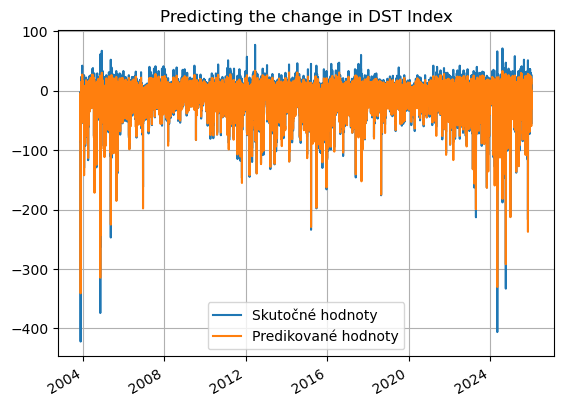

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9316044779962306
MCC=0.7949511477759528
Výkon NN:
MAE: 4.0136, MSE: 37.3958
Perzistentný model:
MAE: 4.2115, MSE: 43.2554
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.70%
MSE Improvement: 13.55%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

205/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

 61/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 9:06 610ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step  

  9/896 ━━━━━━━━━━━━━━━━━━━━ 13s 15ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

205/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 14s 15ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step 

  9/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step 

 49/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step


Shapes LSTM:
train: (229350,) (229350,)
val:   (57333,) (57333,)
test:  (194194,) (194194,)
Global sigma (LSTM errors, scaled): 0.3330246
Shapes GP:
X_gp_train: (286683, 6)
y_gp_train: (286683,)
X_test_gp: (194194, 6)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 2.62**2 * RBF(length_scale=0.281) + WhiteKernel(noise_level=0.679)


Global sigma (LSTM errors): 7.3278418
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194194

In [21]:
len(y_pred_persistence)

194191

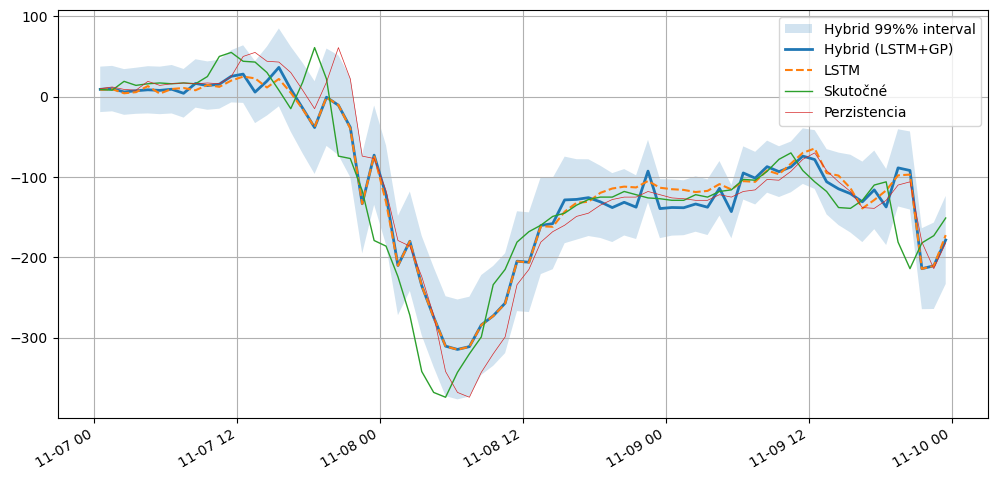

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 40.8780
MAE: 4.1344

--- Klasifikačné metriky (Prah: -19.7 nT) ---
Matthews Correlation Coefficient (MCC): 0.7897

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      146019 |        6039
Skutočná 1 |        7663 |       34470

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.95      0.96      0.96    152058
   Trieda 1 (Búrka)       0.85      0.82      0.83     42133

           accuracy                           0.93    194191
          macro avg       0.90      0.89      0.89    194191
       weighted avg       0.93      0.93      0.93    194191



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.931603421373802
MCC=0.7949429716742157
Výkon NN:
MAE: 4.0136, MSE: 37.3958
Perzistentný model:
MAE: 4.2115, MSE: 43.2554
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.70%
MSE Improvement: 13.55%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9491    0.9644    0.9567    152058
           1     0.8636    0.8132    0.8376     42133

    accuracy                         0.9316    194191
   macro avg     0.9063    0.8888    0.8972    194191
weighted avg     0.9305    0.9316    0.9308    194191


===== LSTM+GP =====
ACC=0.9294406022936181
MCC=0.7896526709582384
Výkon NN:
MAE: 4.1344, MSE: 40.8780
Perzistentný model:
MAE: 4.2115, MSE: 43.2554
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 1.83%
MSE Improvement: 5.50%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9501    0.9603    0.9552    152058
           1     0.8509    0.8181    0.8342     42133

    

/tmp/ipykernel_163923/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_163923/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
6,2026-04-25T19:31:27,LSTM,24.0,1.0,DST+1,OMNI2_all,-20.0,-21.0,0.958949,0.876963,"{""text"": "" precision recall f...",2.450730,14.060619,2.567993,16.321215,4.566335,13.850664
7,2026-04-25T19:31:27,LSTM+GP,24.0,1.0,DST+1,OMNI2_all,-20.0,-21.0,0.952872,0.857788,"{""text"": "" precision recall f...",2.500248,15.146312,2.567993,16.321215,2.638063,7.198630
8,2026-04-25T20:49:48,LSTM,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.9,0.931452,0.792819,"{""text"": "" precision recall f...",3.984343,37.254743,4.211535,43.256014,5.394526,13.873842
9,2026-04-25T20:49:48,LSTM+GP,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.9,0.926699,0.776457,"{""text"": "" precision recall f...",4.204418,41.889383,4.211535,43.256014,0.168998,3.159400
10,2026-04-25T22:20:34,LSTM,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.931331,0.792266,"{""text"": "" precision recall f...",3.970476,37.947839,4.211526,43.256490,5.723593,12.272496
11,2026-04-25T22:20:34,LSTM+GP,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.928514,0.784697,"{""text"": "" precision recall f...",4.137579,41.153213,4.211526,43.256490,1.755833,4.862338
12,2026-04-25T23:46:05,LSTM,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.932045,0.794614,"{""text"": "" precision recall f...",4.032173,38.034446,4.211590,43.257647,4.260069,12.074629
13,2026-04-25T23:46:05,LSTM+GP,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.924748,0.768567,"{""text"": "" precision recall f...",4.108914,40.169558,4.211590,43.257647,2.437937,7.138828
14,2026-04-26T00:26:45,LSTM,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.931603,0.794943,"{""text"": "" precision recall f...",4.013647,37.395781,4.211529,43.255398,4.698564,13.546558
15,2026-04-26T00:26:45,LSTM+GP,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.929441,0.789653,"{""text"": "" precision recall f...",4.134388,40.878004,4.211529,43.255398,1.831650,5.496179
